# hierarchical clustering from scratch!
Writing your own hierarchical clustering algorithm will reinforce your understanding of how it works, improve your Python skills, and it's not as hard as you think.
## Refresher on how (agglomerative) hierarchical clustering works
Start off by treating each point as its own cluster.  The two closest points get joined into a cluster.  Repeat, but now a "point" can be a point or a cluster.
## Initialize the clusters
We will start out with two big clusters, as in the k-means-from-scratch exercise.

In [71]:
import random
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from scipy.spatial import distance
%matplotlib inline

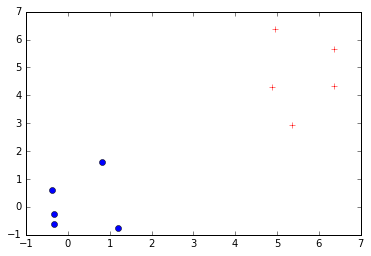

In [72]:
# Create points
sizeOfClusters = 5

cluster1 = pd.DataFrame(columns=["x","y","cluster","color","centroid"])
for i in range(sizeOfClusters):
    # This will make a cluster of points centered around (0,0), with sd = 1
    x = random.gauss(0,1) # gauss(mean, sd) (guassian distribution <=> normal distribution)
    y = random.gauss(0,1)
    cluster1.loc[i] = [x,y,1,'bo',np.array([x,y])]
    
cluster2 = pd.DataFrame(columns=["x","y","cluster","color","centroid"])
for i in range(sizeOfClusters):
    # This will make a cluster of points centered around (5,5), with sd = 1
    x = random.gauss(5,1)
    y = random.gauss(5,1)
    cluster2.loc[i] = [x,y,2,'r+',np.array([x,y])]

plt.plot(cluster1.x,cluster1.y,'bo')
plt.plot(cluster2.x,cluster2.y,'r+')
plt.show()

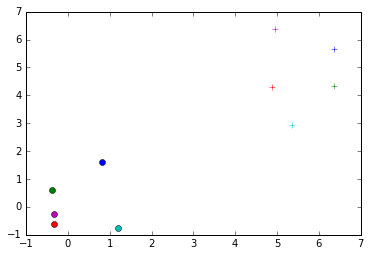

In [73]:
# Now we combine the datasets, and you have to hierarchically cluster them.
clusterF = pd.concat([cluster1,cluster2]).reset_index(drop=True)
clusterF.cluster = range(len(clusterF)) # Each starts out as its own cluster.
# We give them all distinct colors so we can distinguish between the clusters.
colors = ['bo', 'go', 'ro', 'co', 'mo', 'b+', 'g+', 'r+', 'c+', 'm+']
clusterF["color"] = colors
for i in range(len(clusterF)):
    plt.plot(clusterF.loc[i,"x"],clusterF.loc[i,"y"],clusterF.loc[i,"color"])
plt.show()

In [74]:
c = 1
clusterF[clusterF.cluster == c].index


Int64Index([1], dtype='int64')

## Let's write some pseudo-code
#### For an extra challenge to yourself, don't read the pseudo-code; just go off of your understanding of agglomerative hierarchical clustering.
1. Begin with each point being its own cluster.
2. Calculate the distances between all clusters (remember, a cluster can be one or more points, but initially, will be only one).
3. Merge the two closest clusters. (Update the cluster column and the centroids for the newly merged clusters; also, update the color column, for the sake of the plot.)
4. Repeat steps 2 and 3 until you have one big cluster.

Note: we will use centroid linkage clustering.  That is to say, the distance between cluster `a` and cluster `b` will be defined as the distance between the centroids of the points in `a` and the points in `b` (the centroid of a set of points is just the average of the points).

## Now, let's write some real code!

In [75]:
def notOneCluster(clusterF):
    clusterRow0 = clusterF.loc[0,"cluster"]
    for i in range(len(clusterF)):
        if (clusterF.loc[i,"cluster"] != clusterRow0):
            return True
    return False

          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go   [-0.372182476632, 0.598291904117]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        4    mo  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+      [4.95150034826, 6.36925306904]


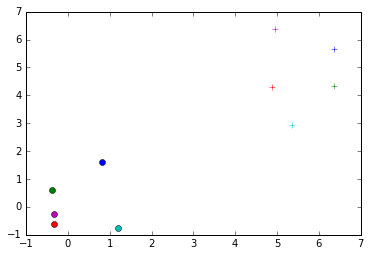

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  4
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

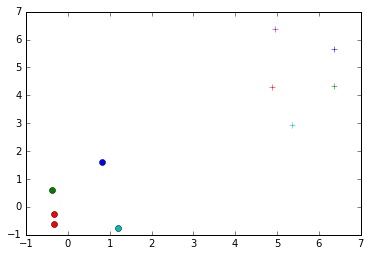

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

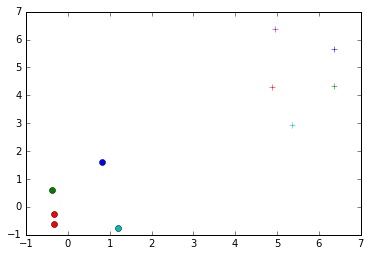

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

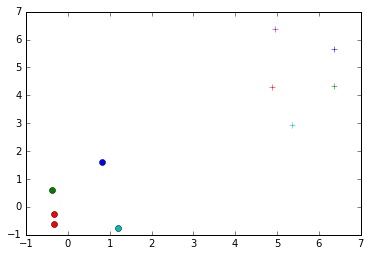

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

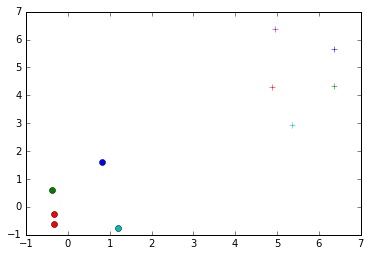

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

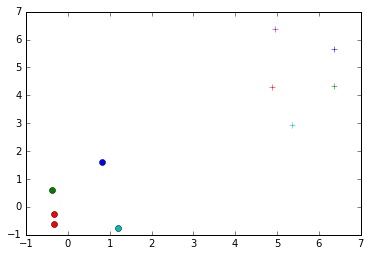

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

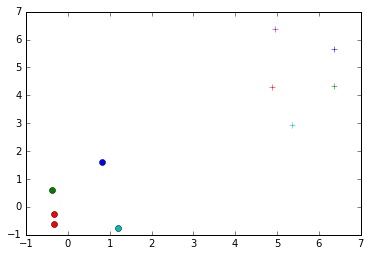

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

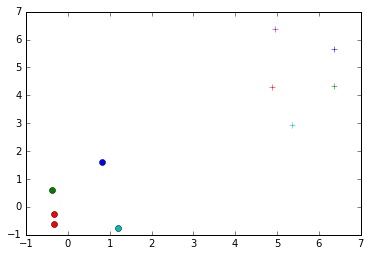

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

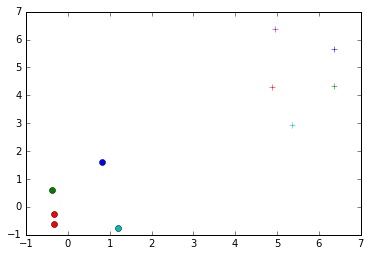

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

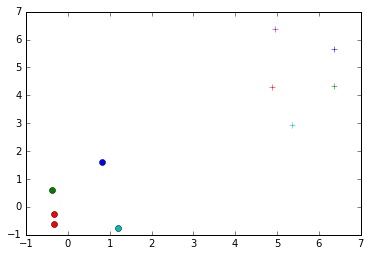

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

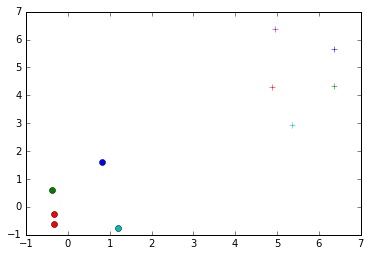

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

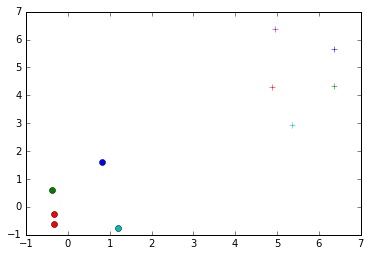

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

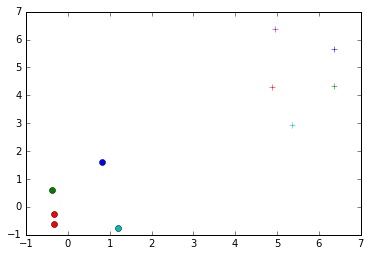

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

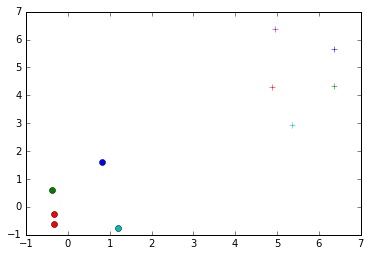

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

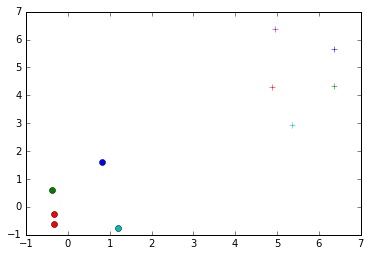

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

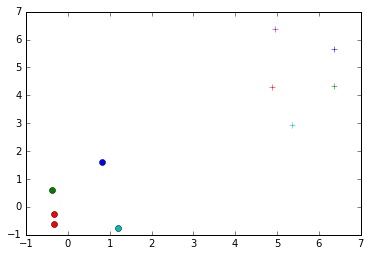

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

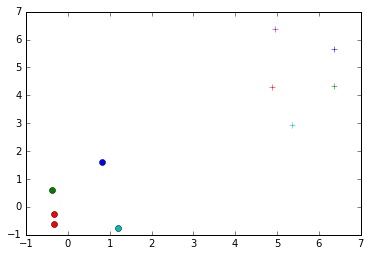

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

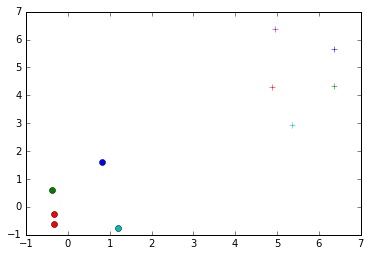

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

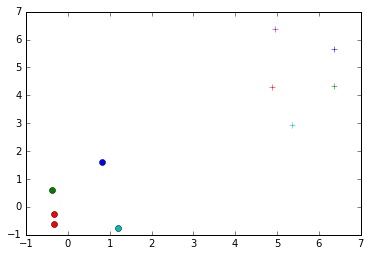

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

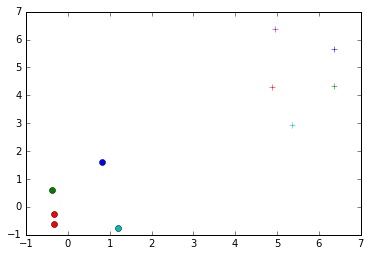

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

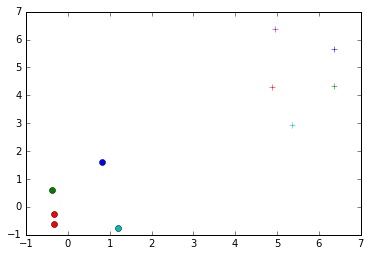

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

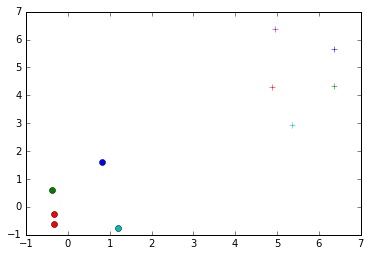

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

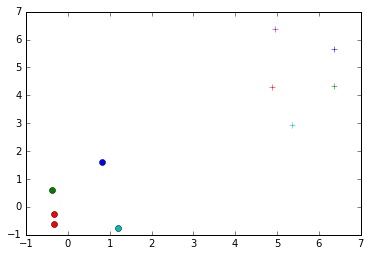

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

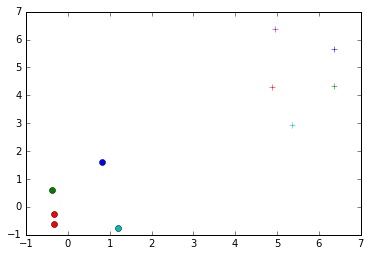

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

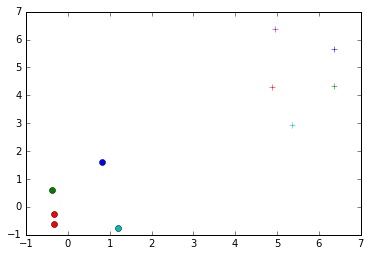

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

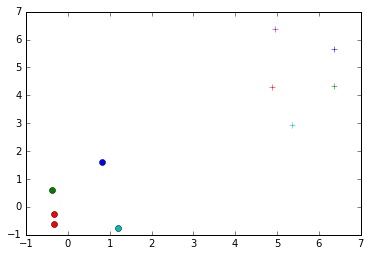

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

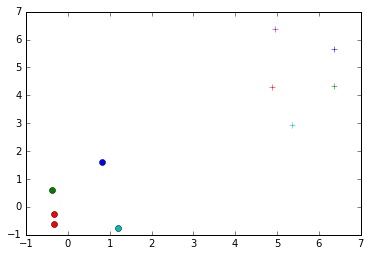

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

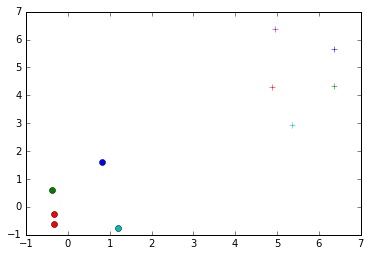

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

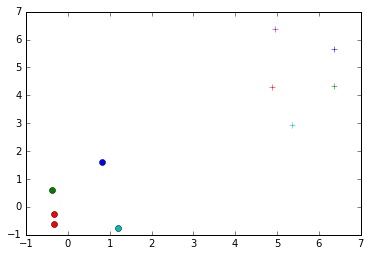

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

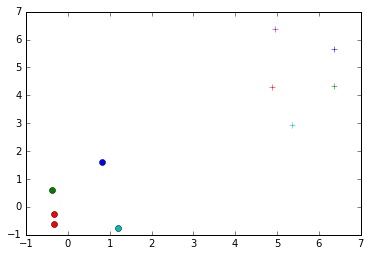

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

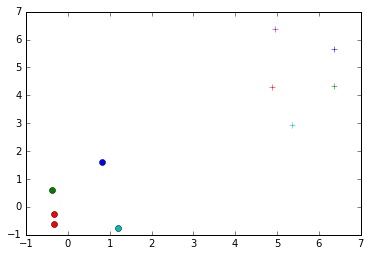

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

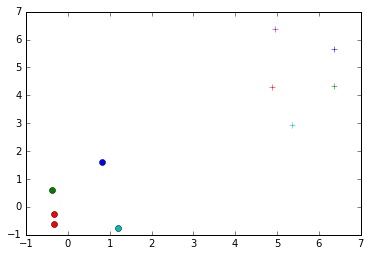

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

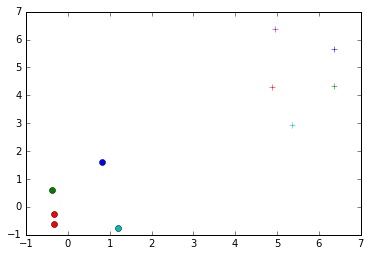

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

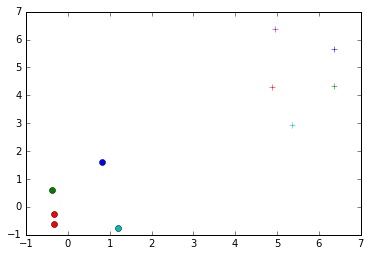

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

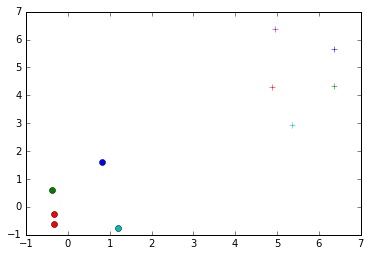

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

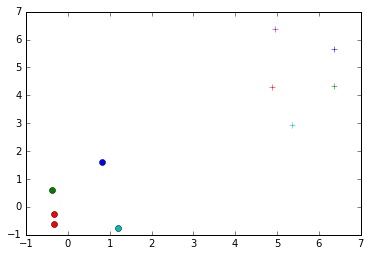

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

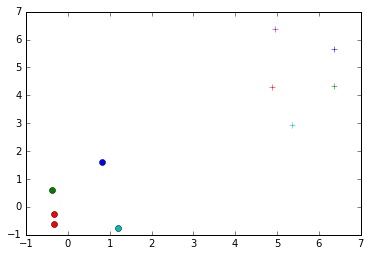

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

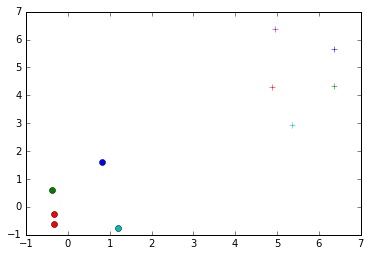

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

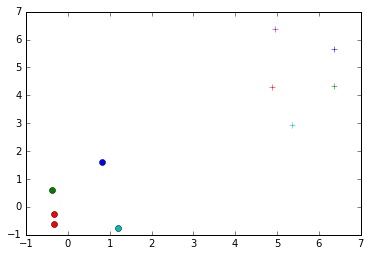

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

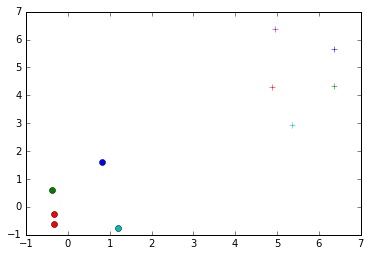

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

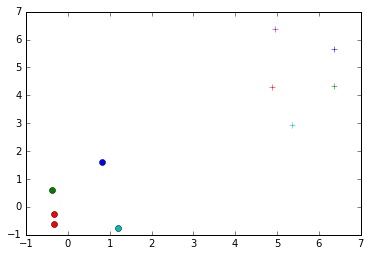

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

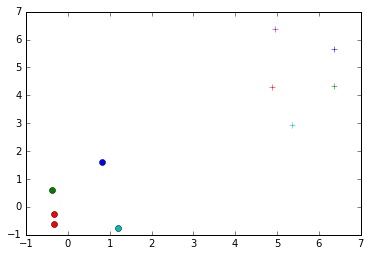

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

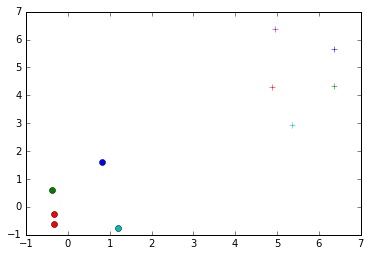

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

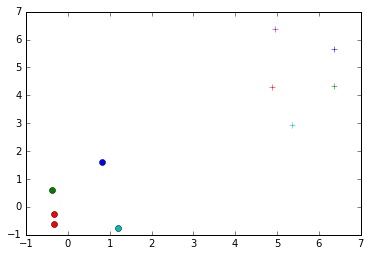

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

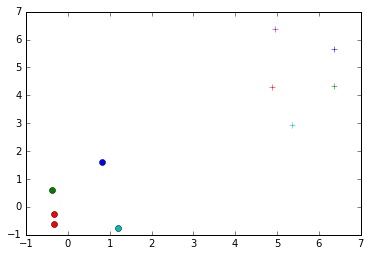

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

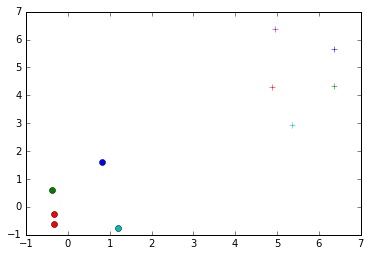

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

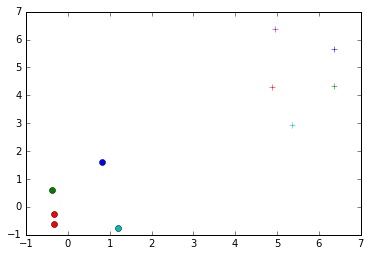

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

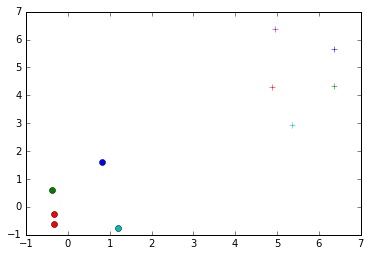

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

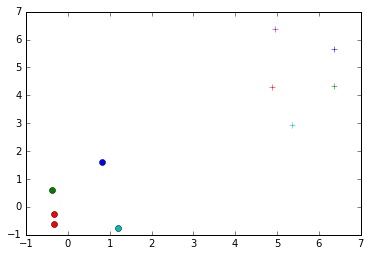

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

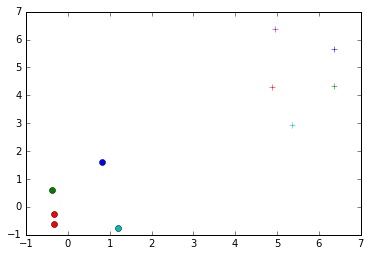

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

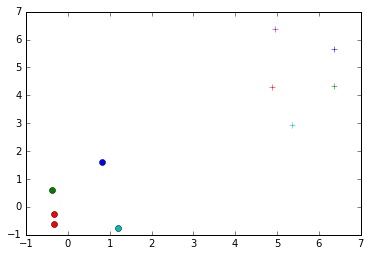

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

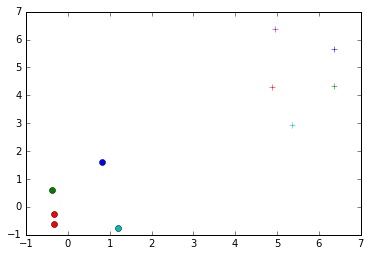

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

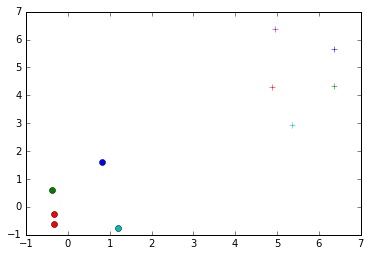

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

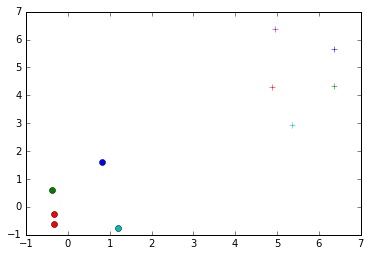

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

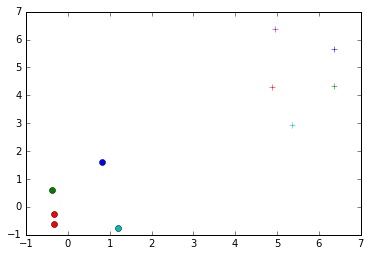

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

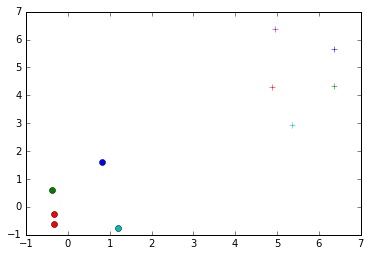

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

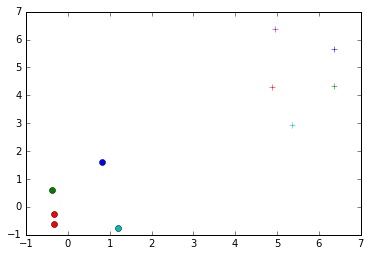

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

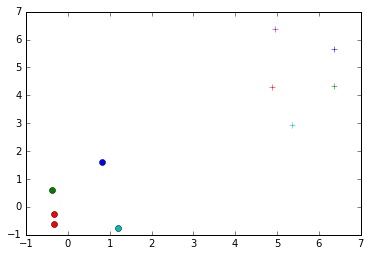

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

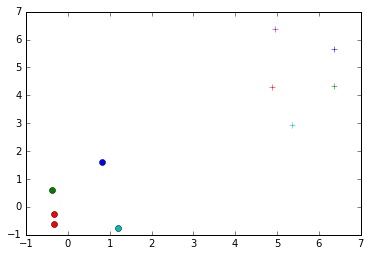

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

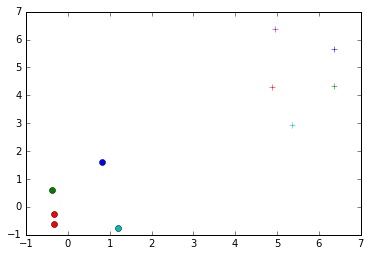

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

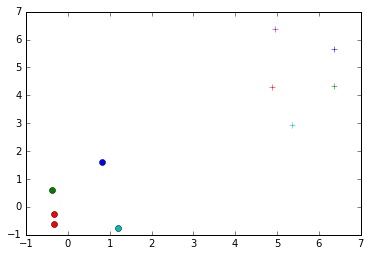

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

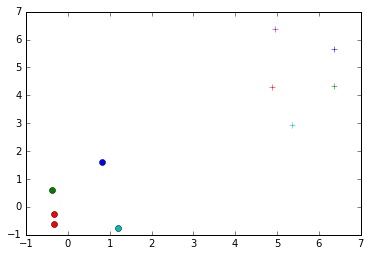

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

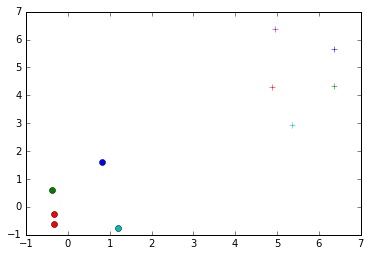

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

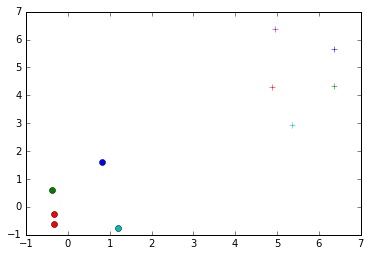

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

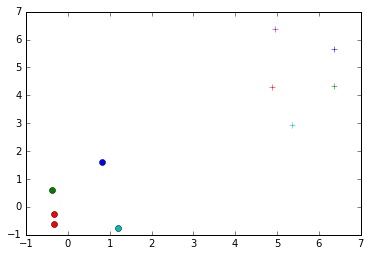

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

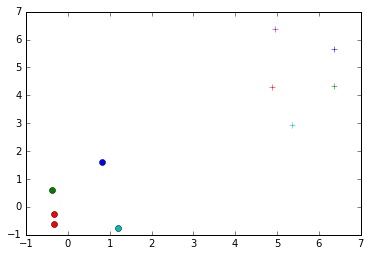

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

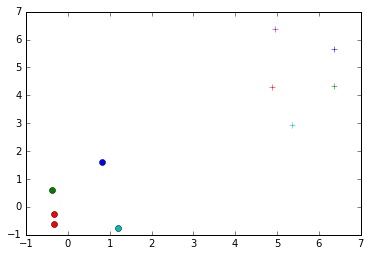

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

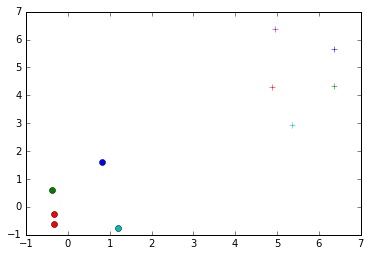

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

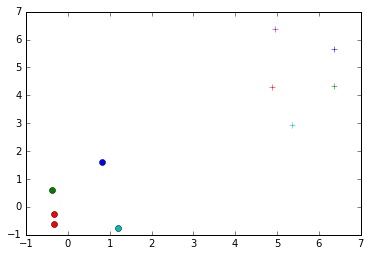

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

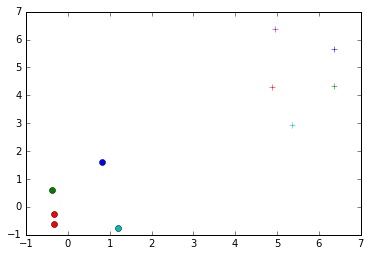

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

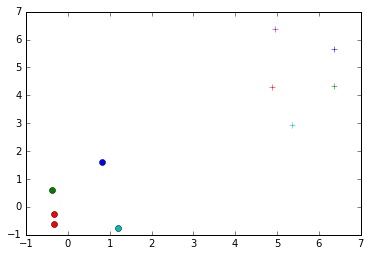

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

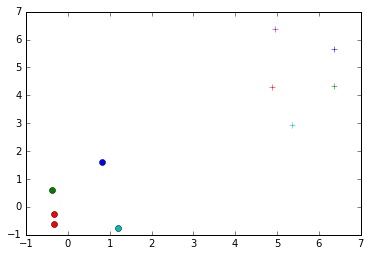

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

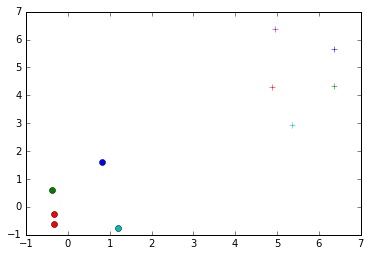

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

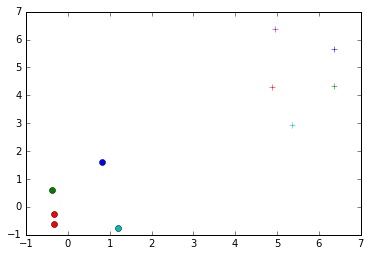

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

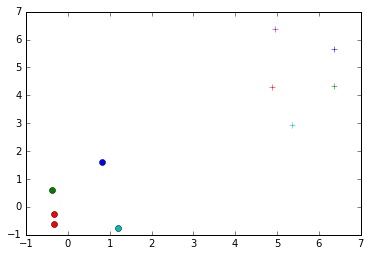

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

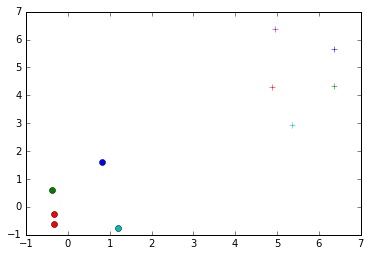

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

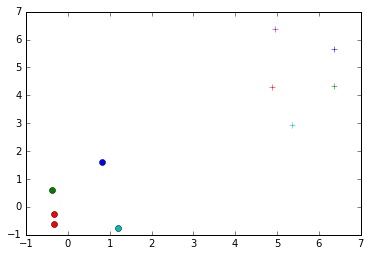

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

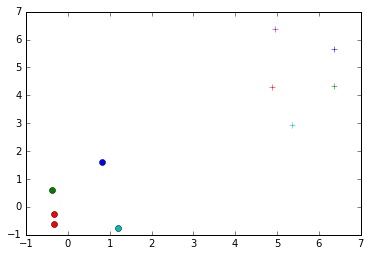

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

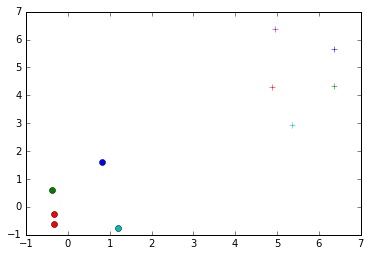

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

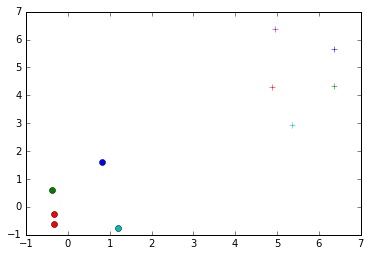

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

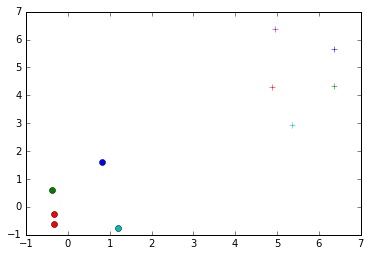

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

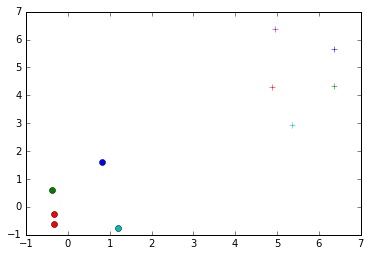

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

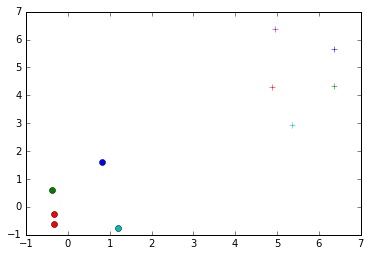

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

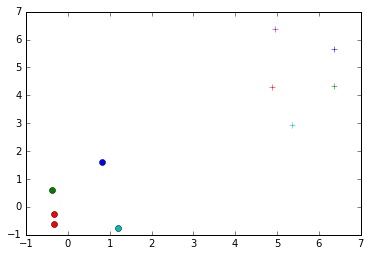

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

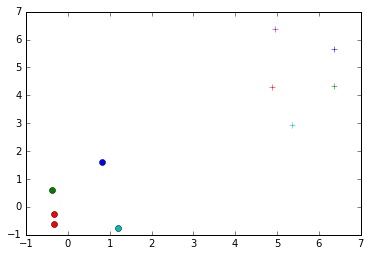

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

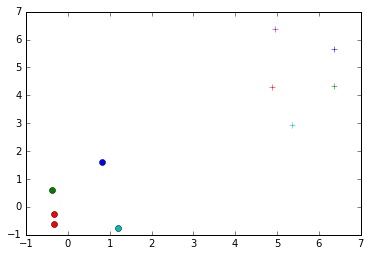

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

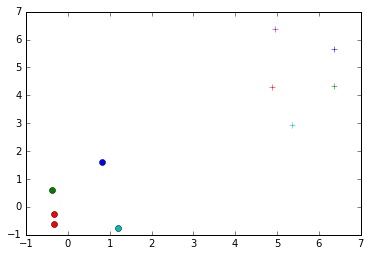

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

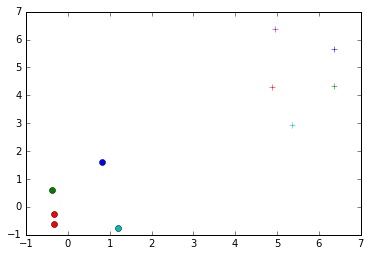

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

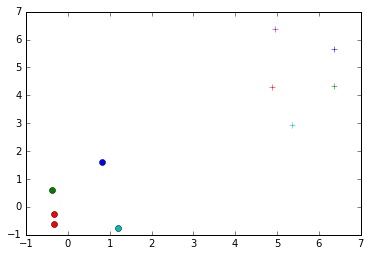

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

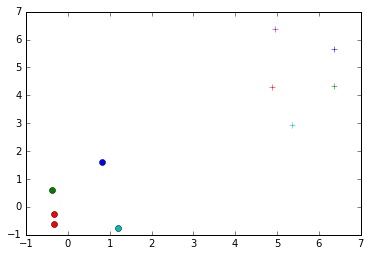

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

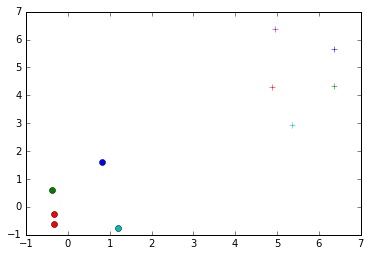

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

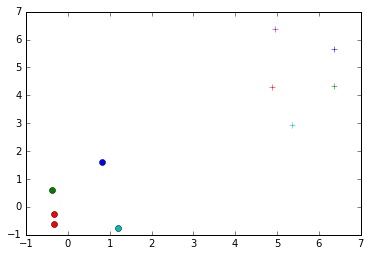

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

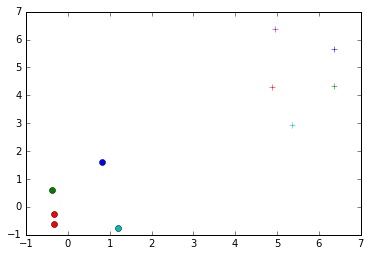

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

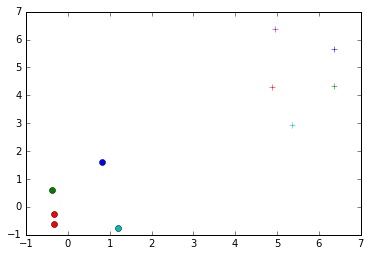

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

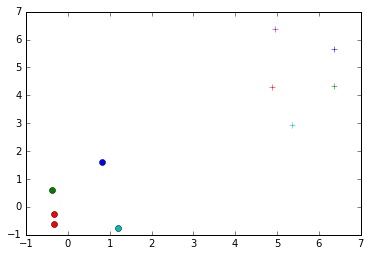

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

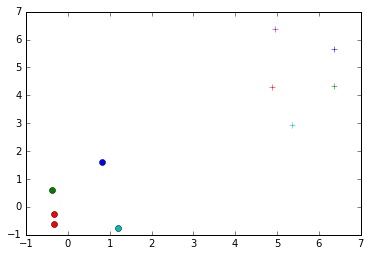

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

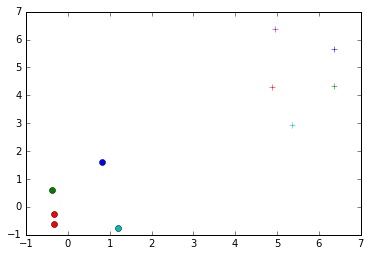

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

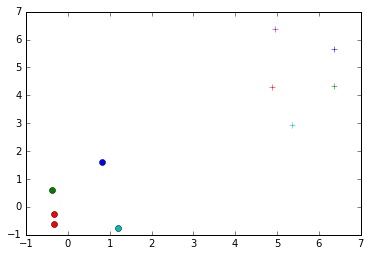

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

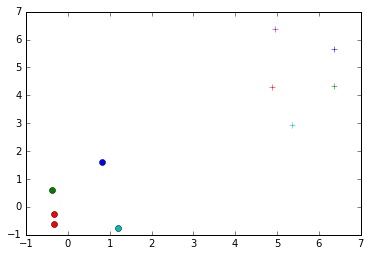

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

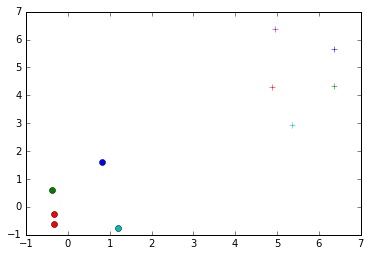

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

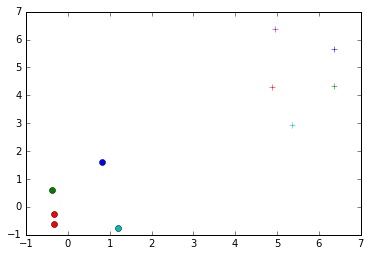

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

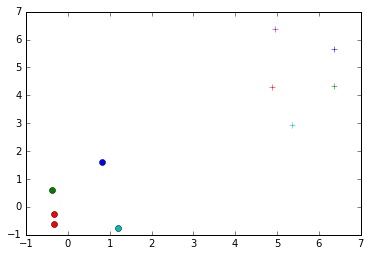

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

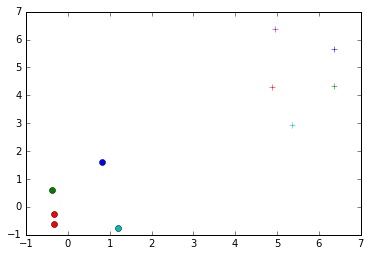

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

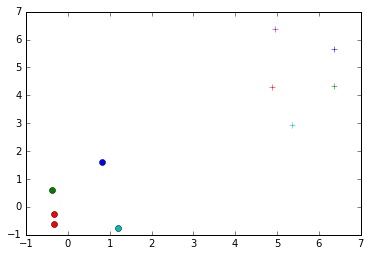

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

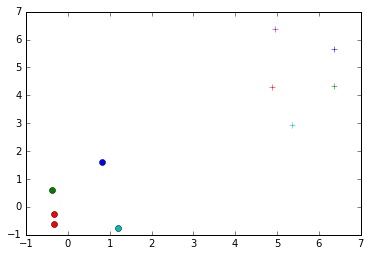

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

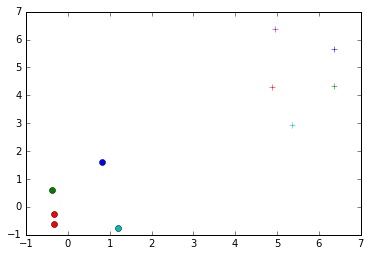

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

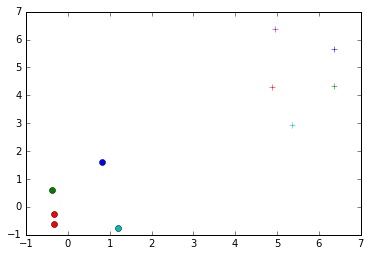

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

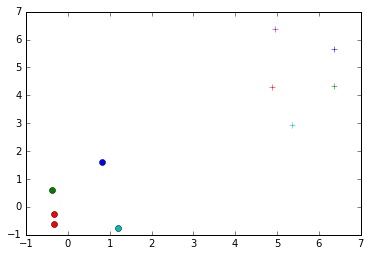

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

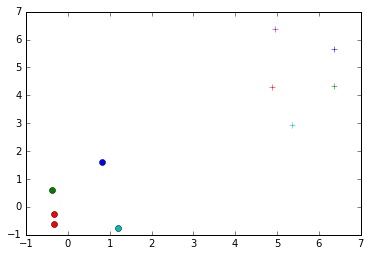

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

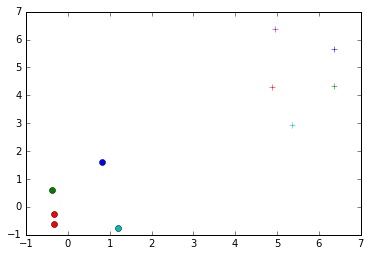

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

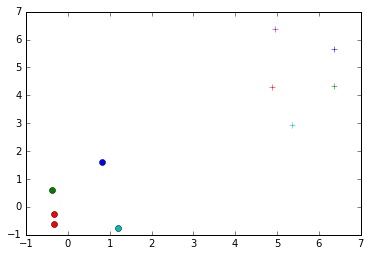

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

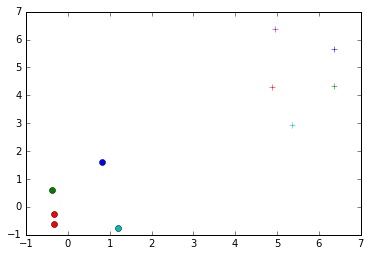

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

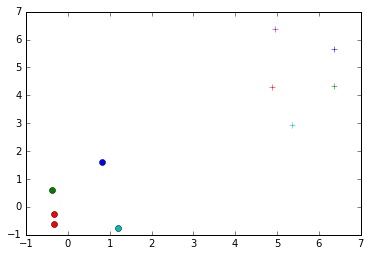

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

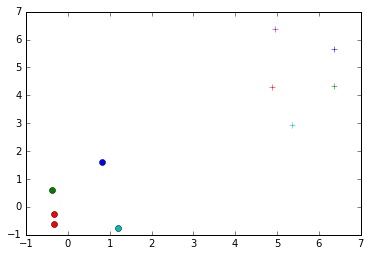

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

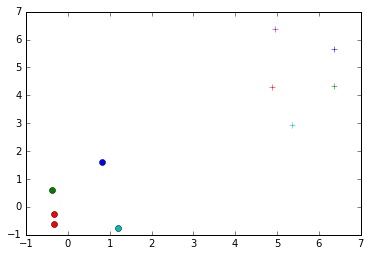

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

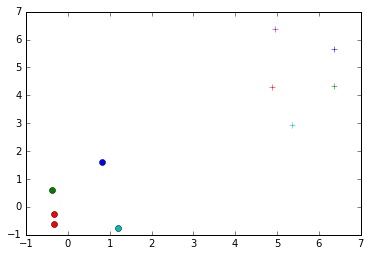

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

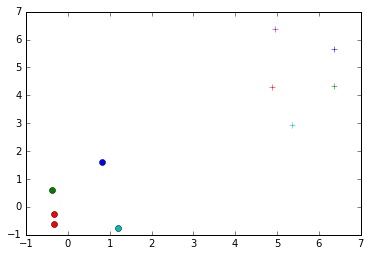

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

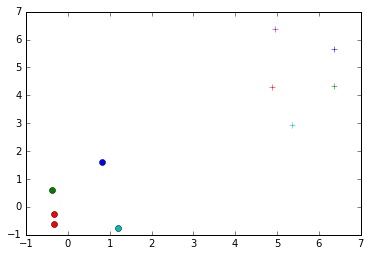

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

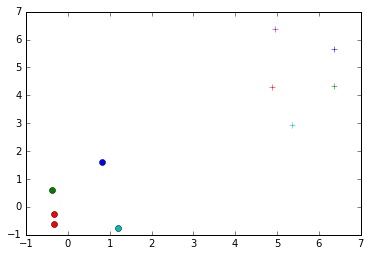

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

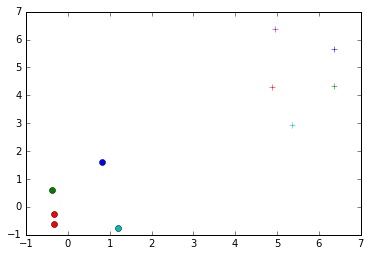

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

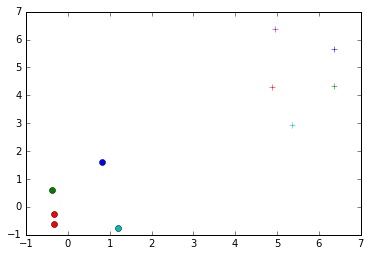

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

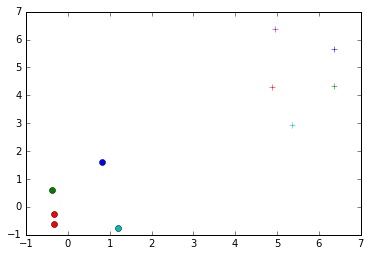

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

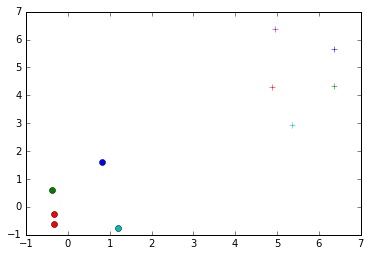

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

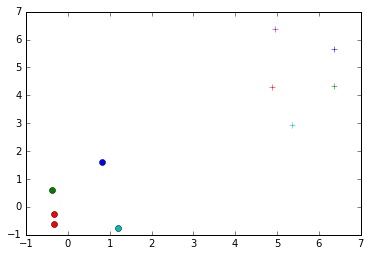

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

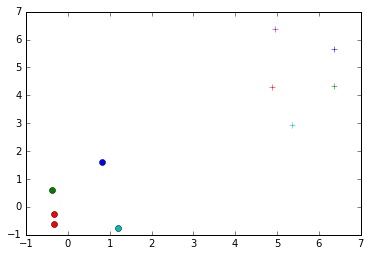

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

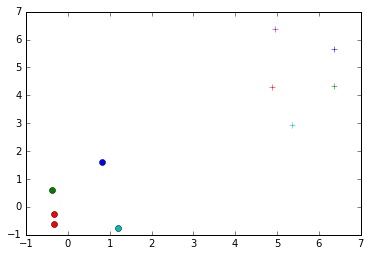

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

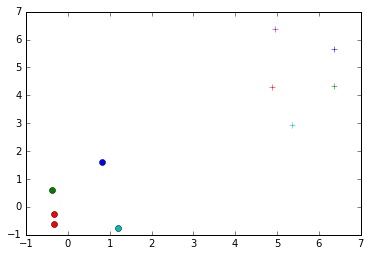

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

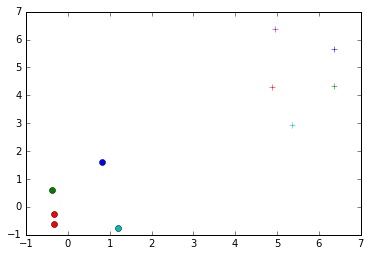

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

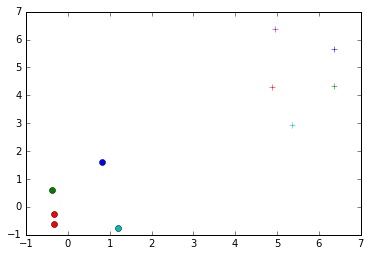

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

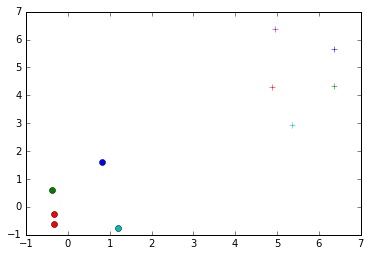

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

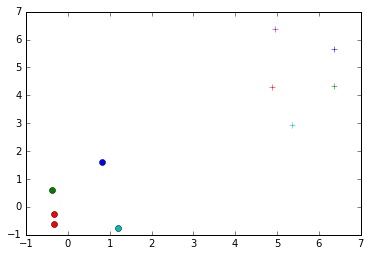

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

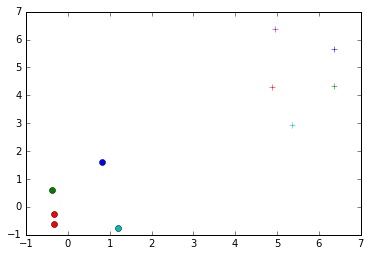

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

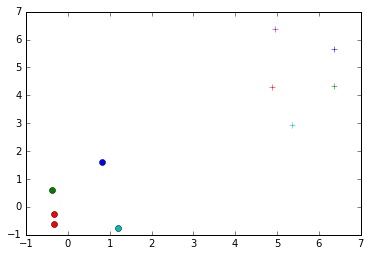

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

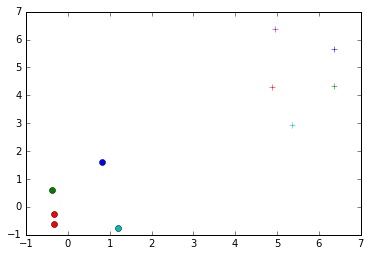

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

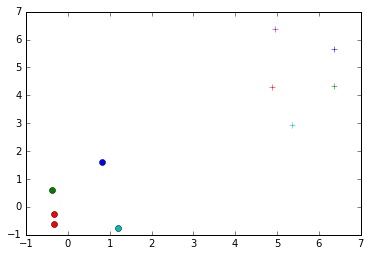

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

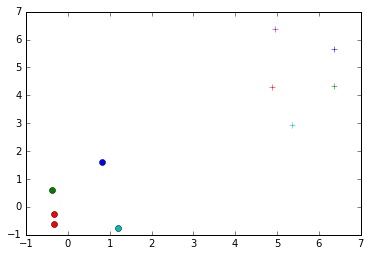

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

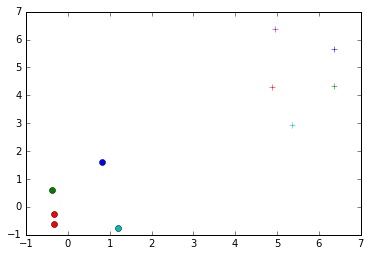

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

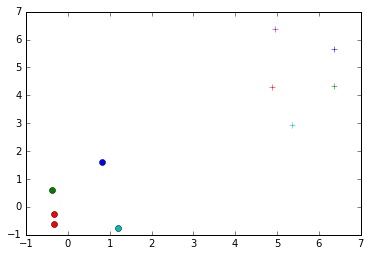

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

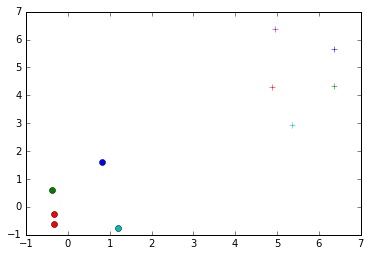

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

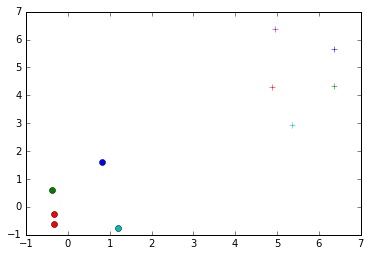

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

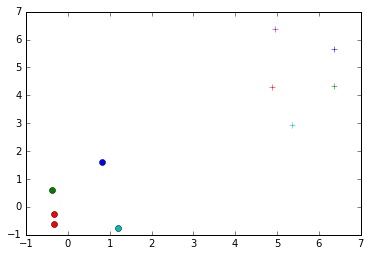

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

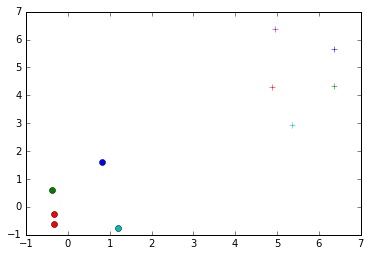

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

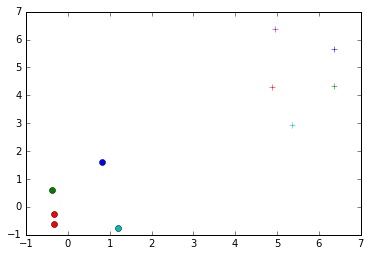

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

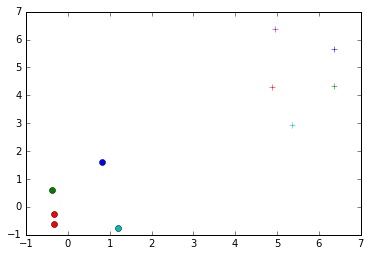

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

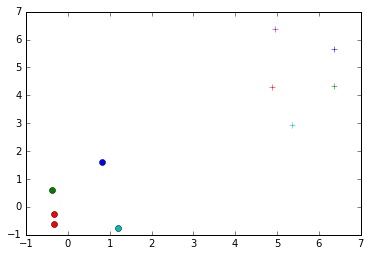

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

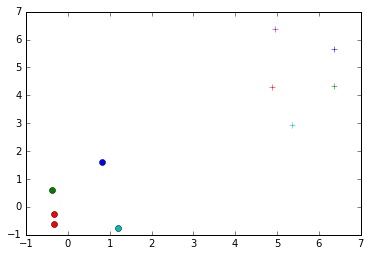

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

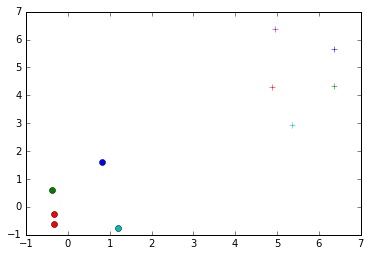

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

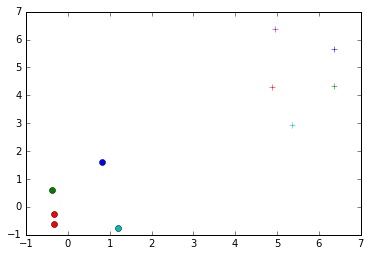

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

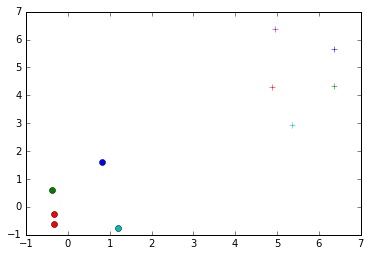

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

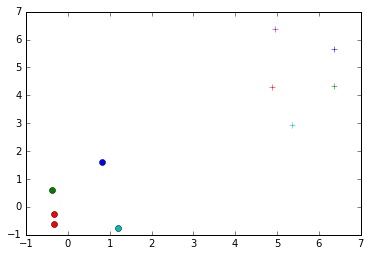

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

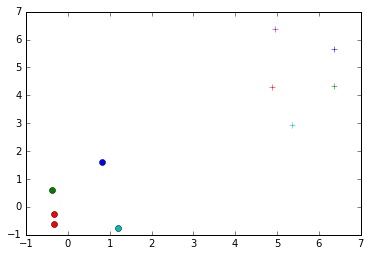

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

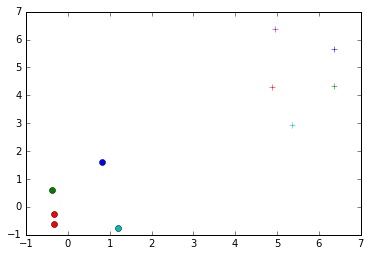

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

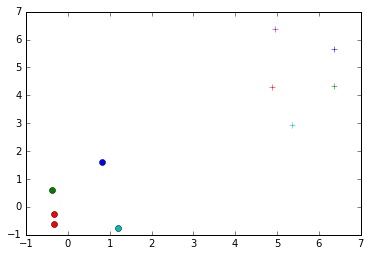

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

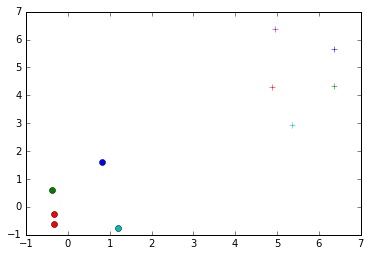

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

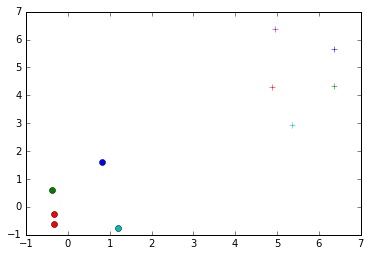

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

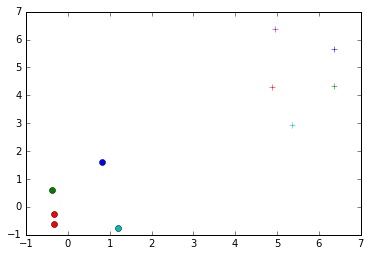

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

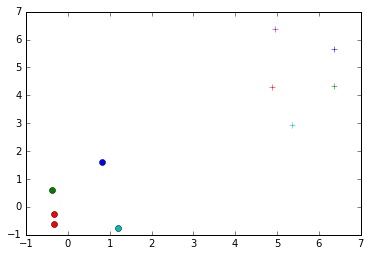

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

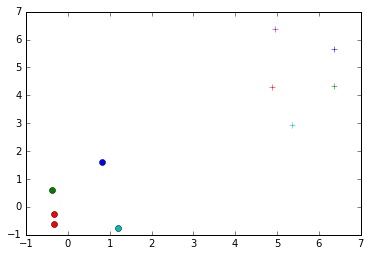

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

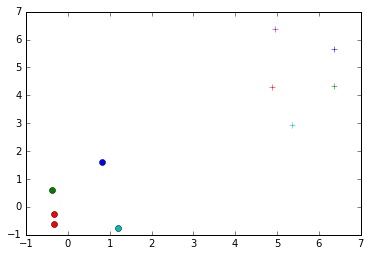

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

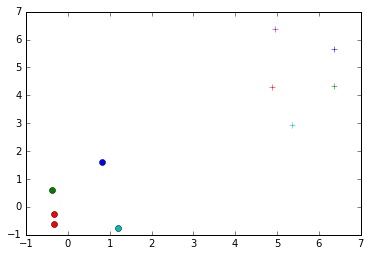

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

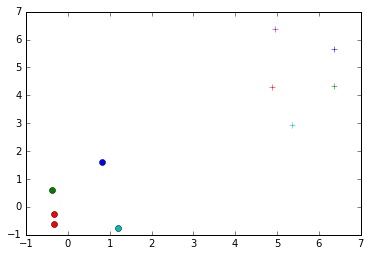

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

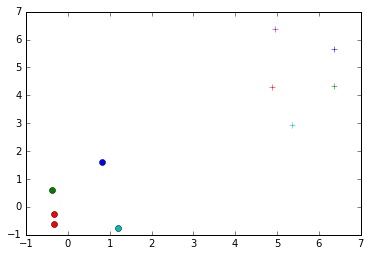

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

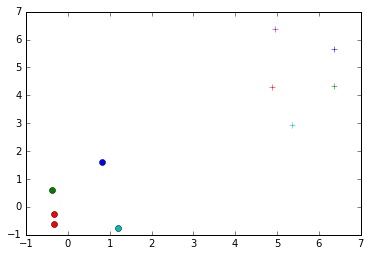

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

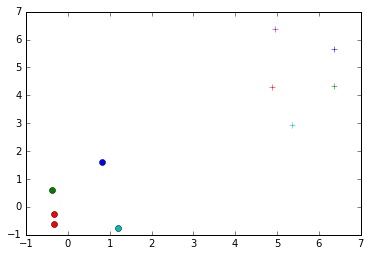

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

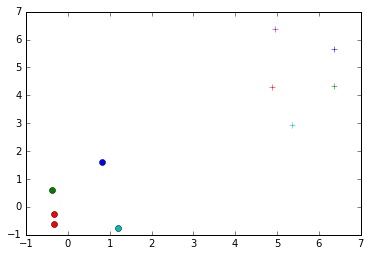

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

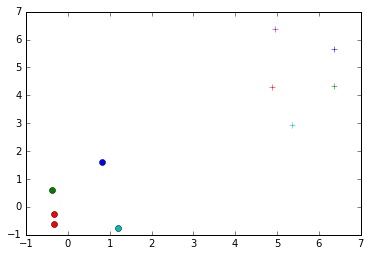

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

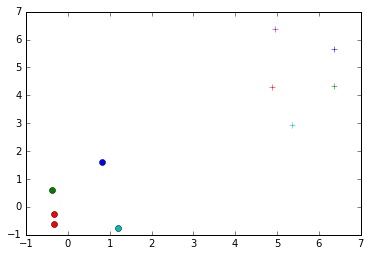

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

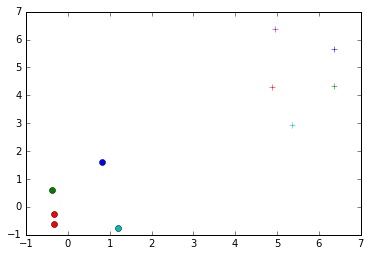

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

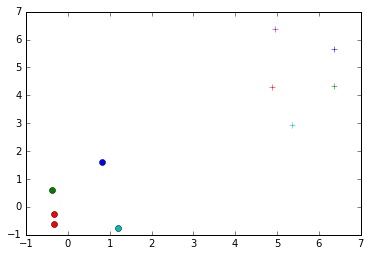

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

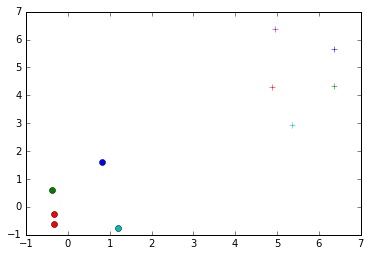

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

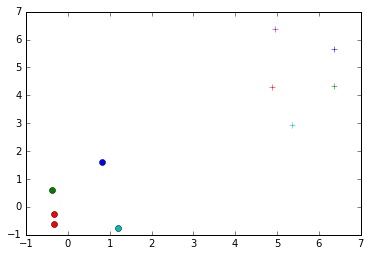

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

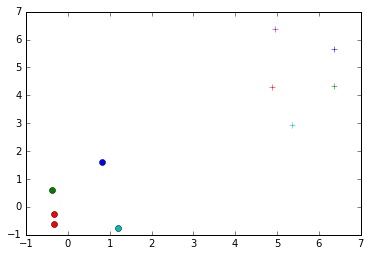

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

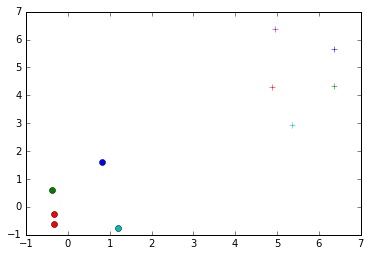

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

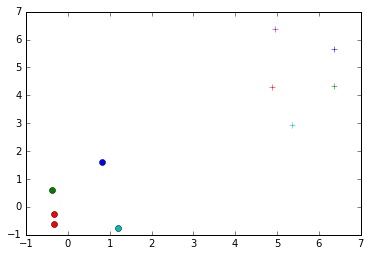

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

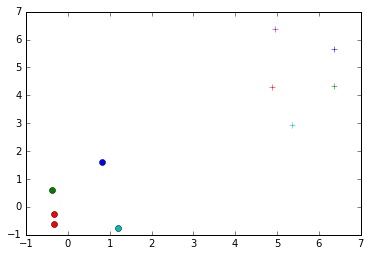

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

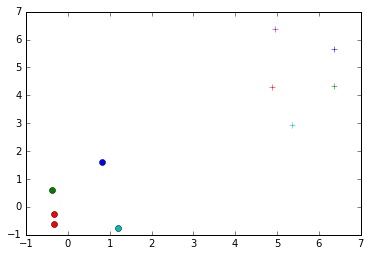

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

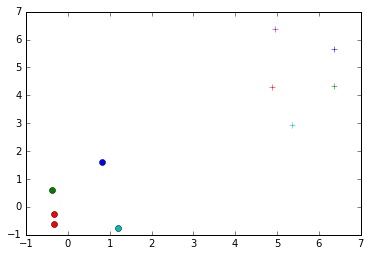

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

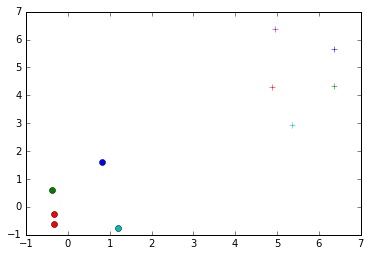

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

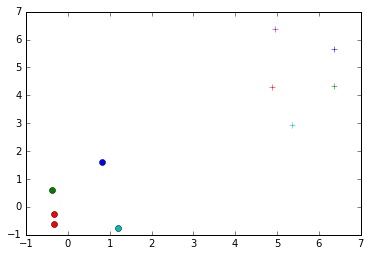

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

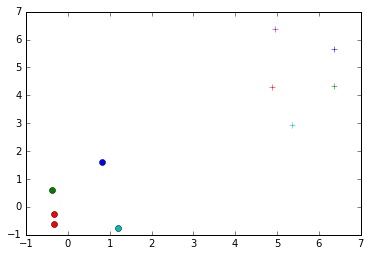

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

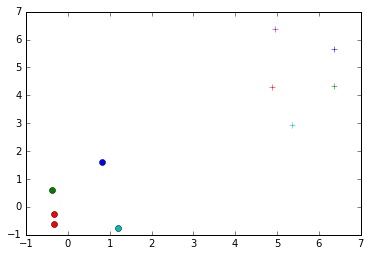

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

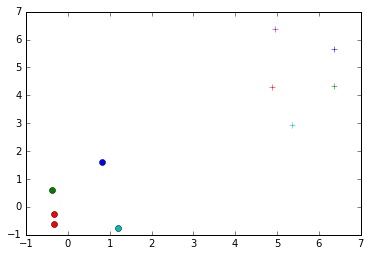

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

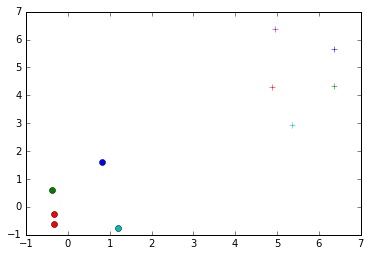

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

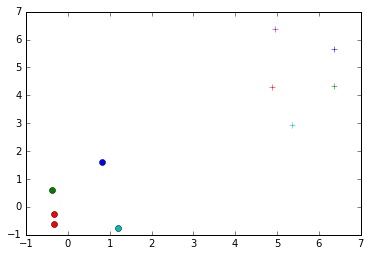

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

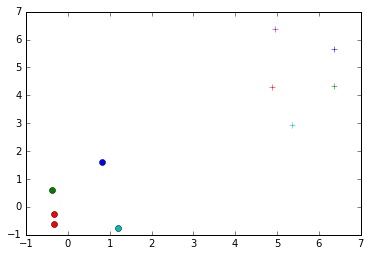

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

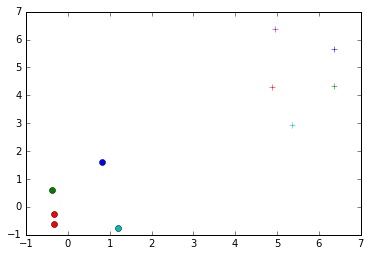

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

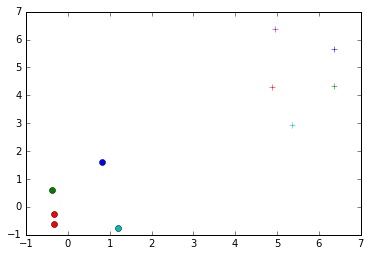

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

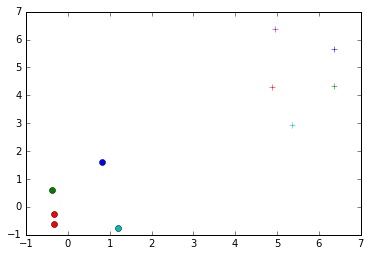

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

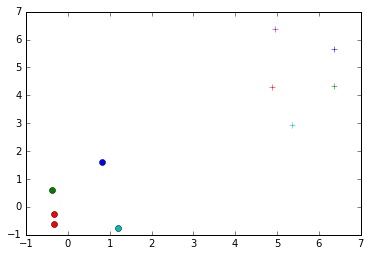

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

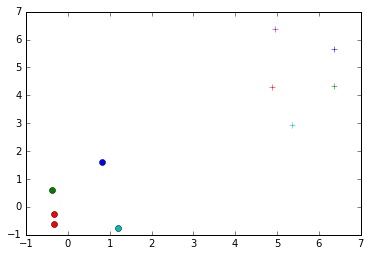

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

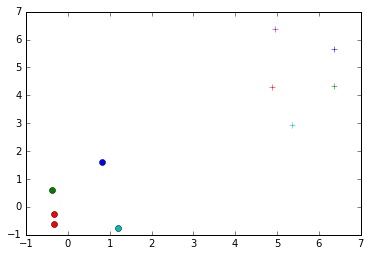

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

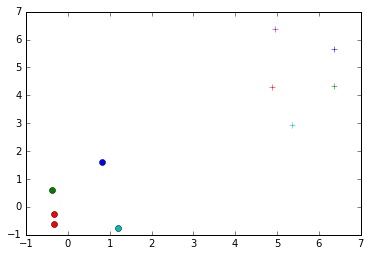

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

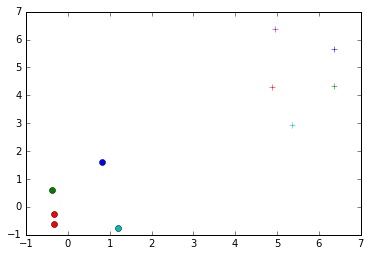

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

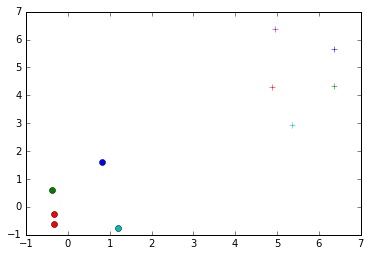

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

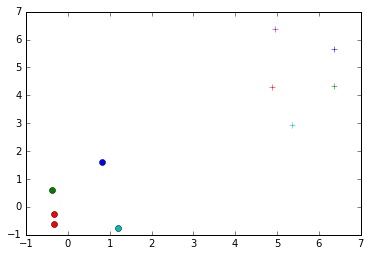

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

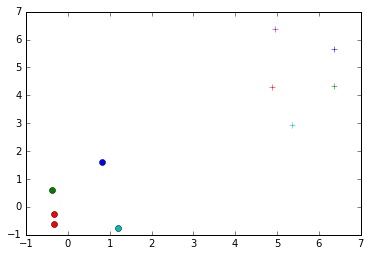

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

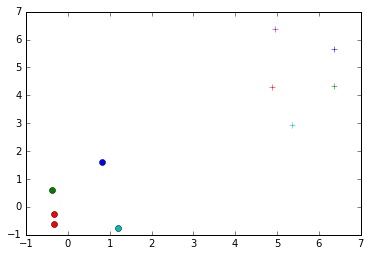

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

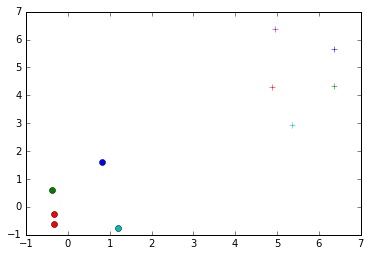

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

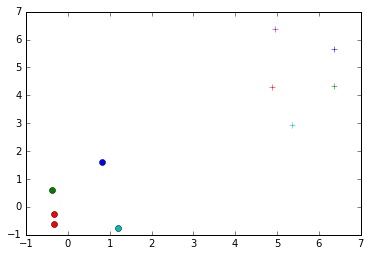

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

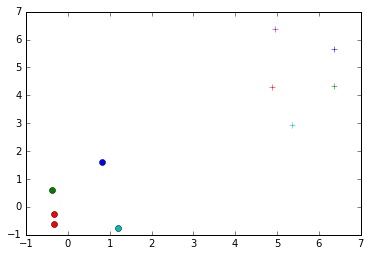

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

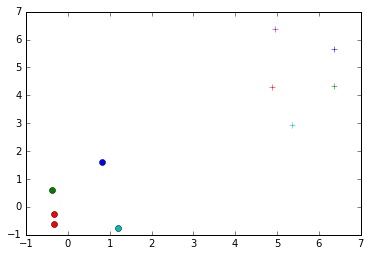

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

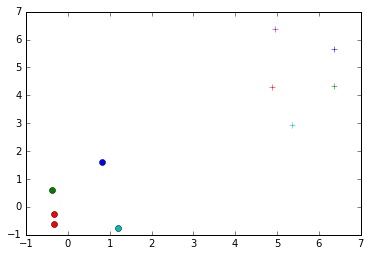

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

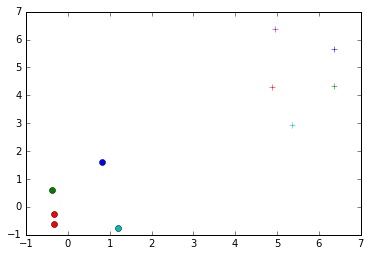

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

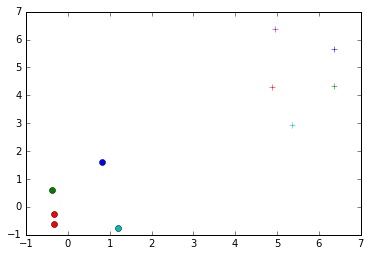

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

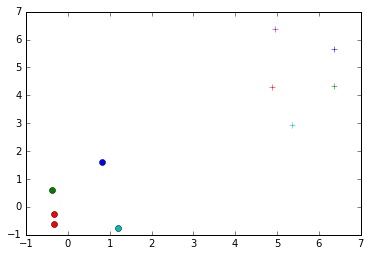

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

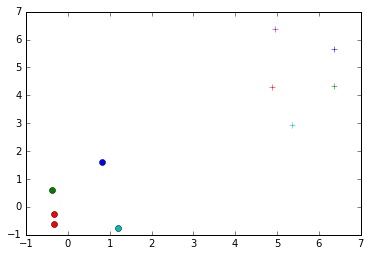

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

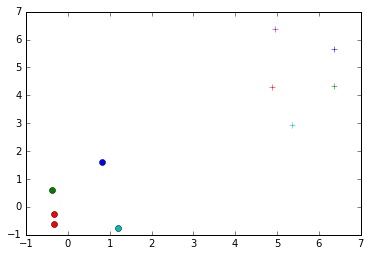

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

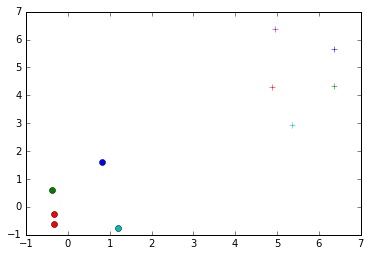

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

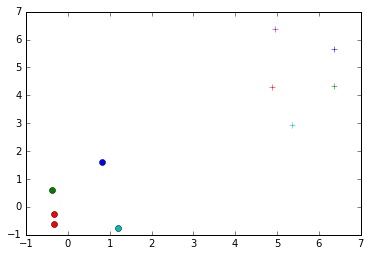

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

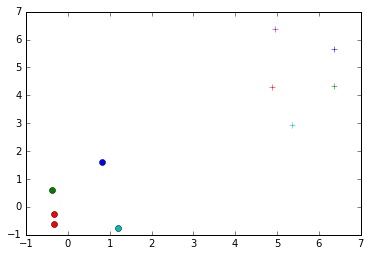

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

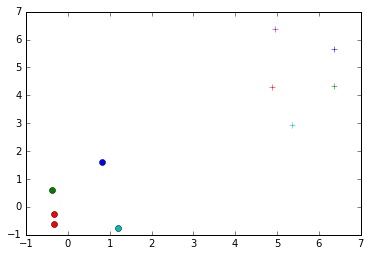

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

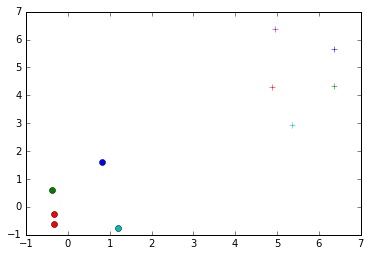

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

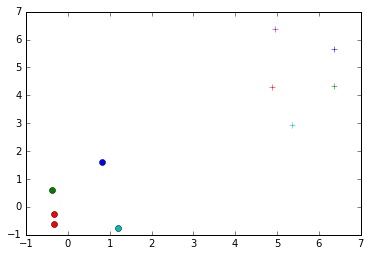

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

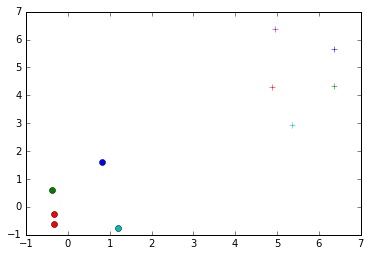

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

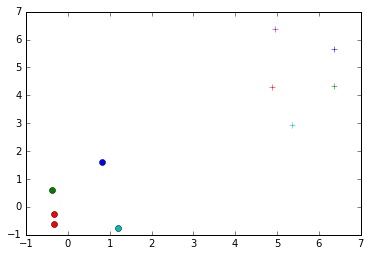

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

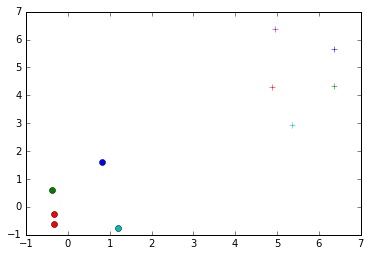

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

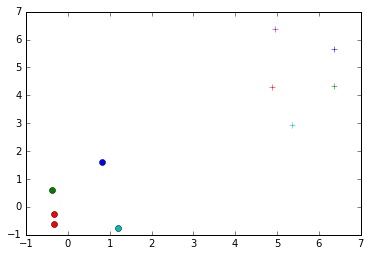

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

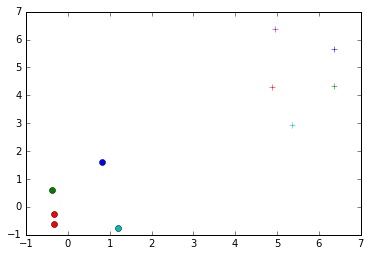

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

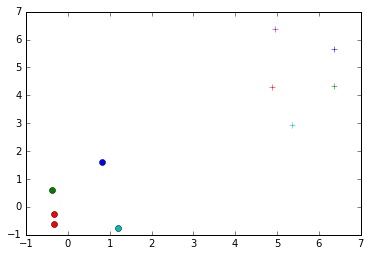

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

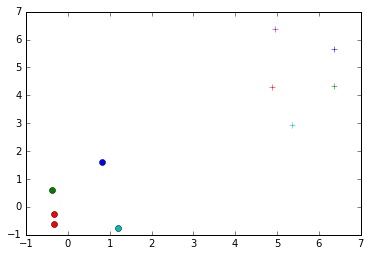

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

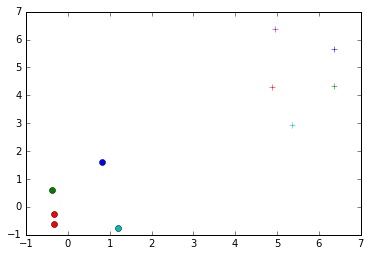

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

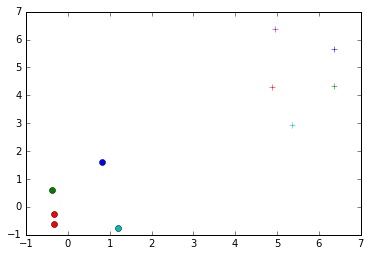

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

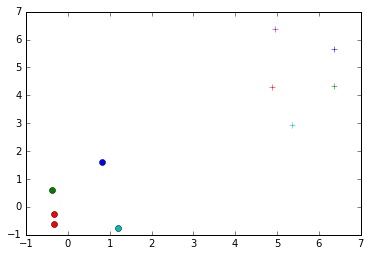

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

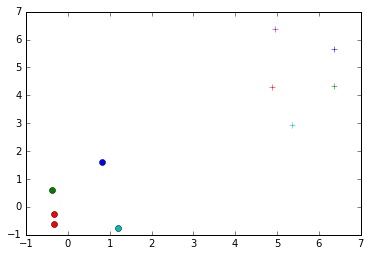

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

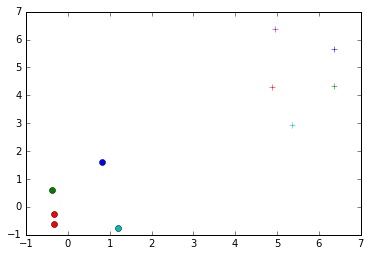

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

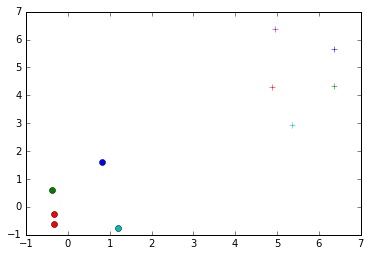

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

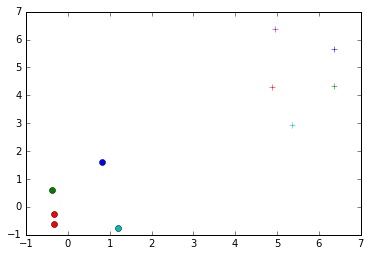

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

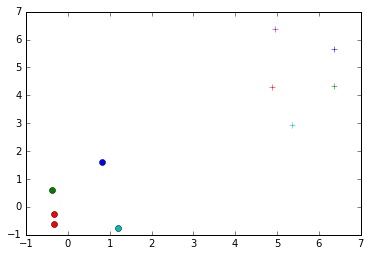

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

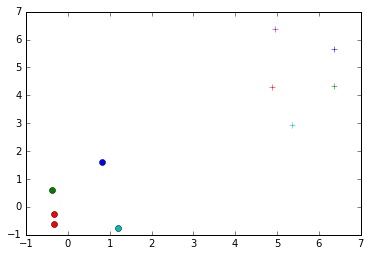

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

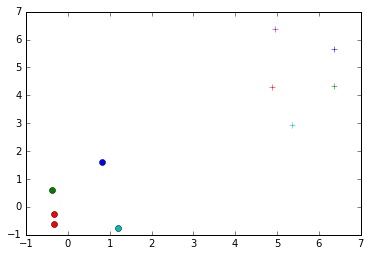

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

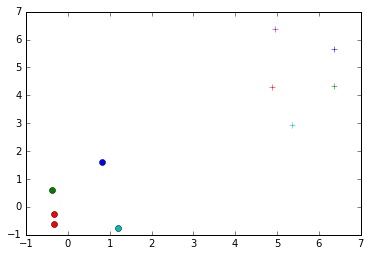

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

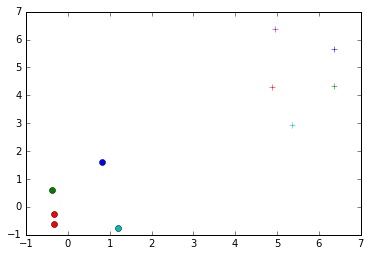

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

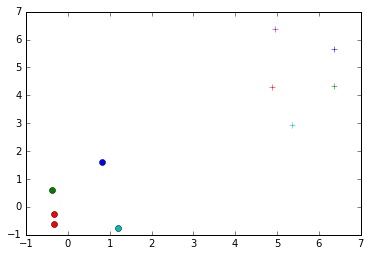

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

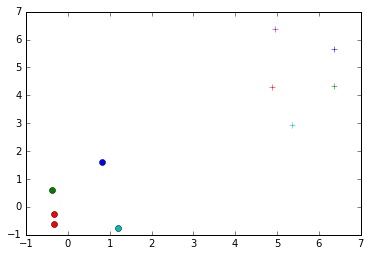

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

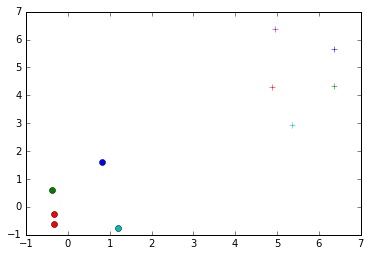

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

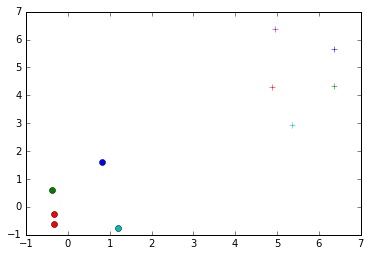

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

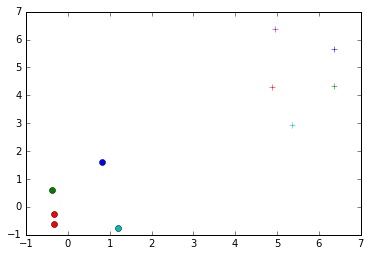

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

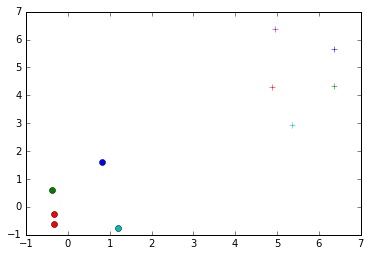

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

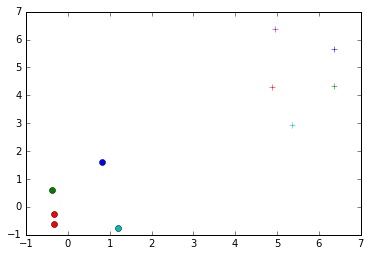

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

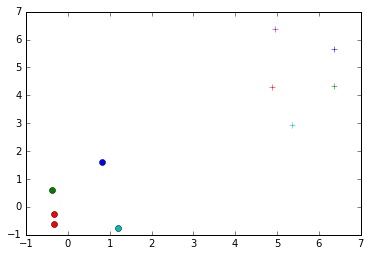

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

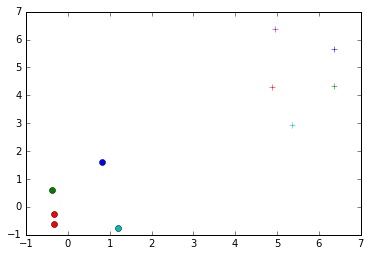

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

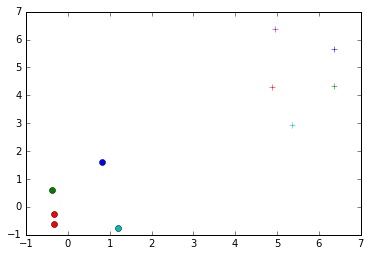

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

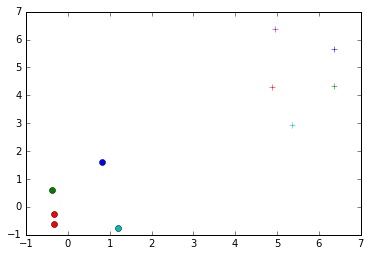

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

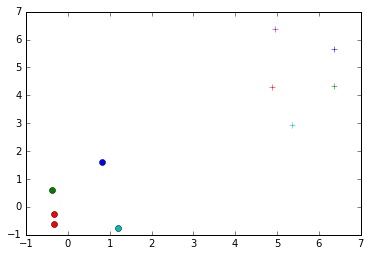

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

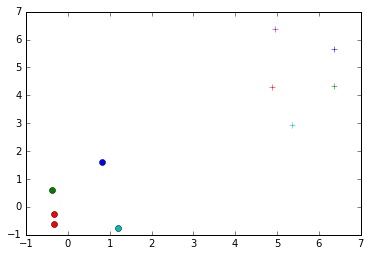

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

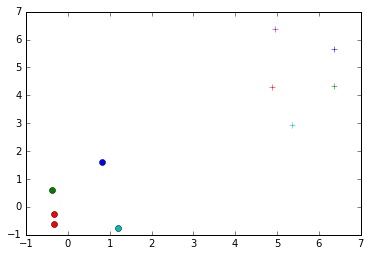

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

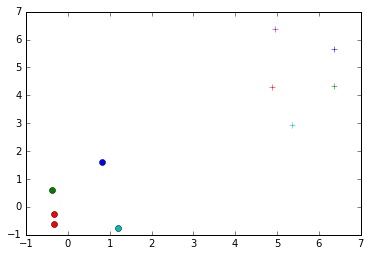

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

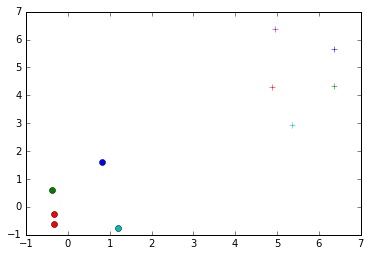

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

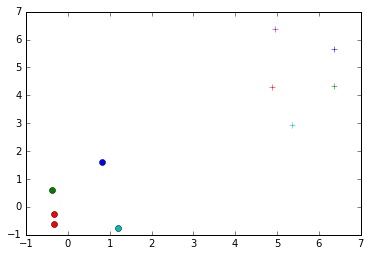

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

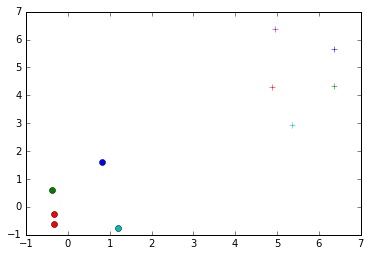

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

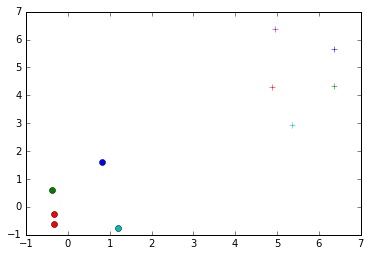

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

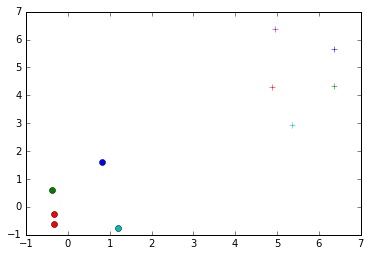

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

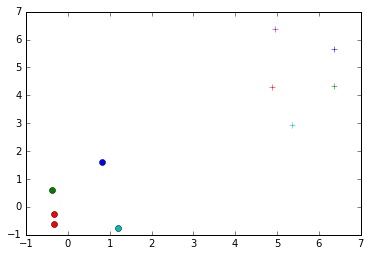

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

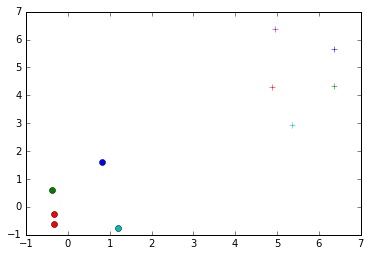

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

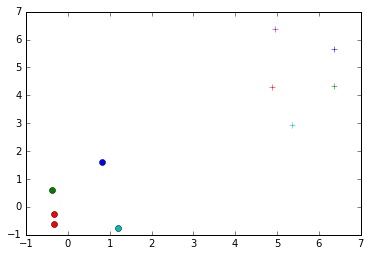

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

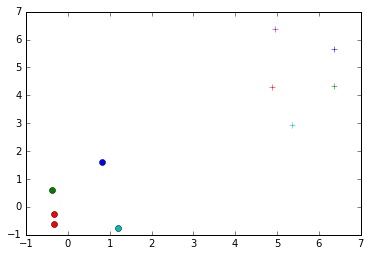

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

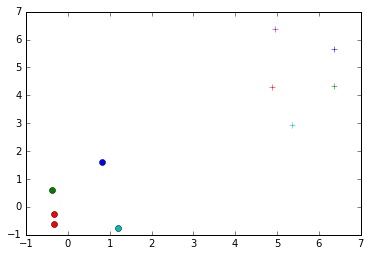

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

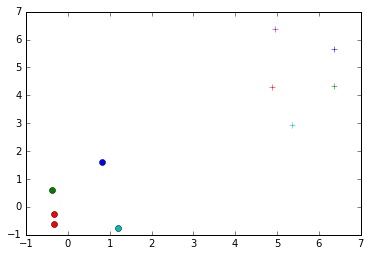

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

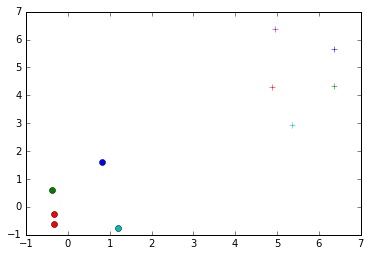

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

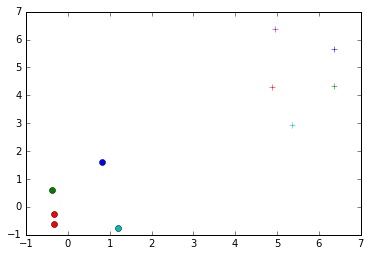

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

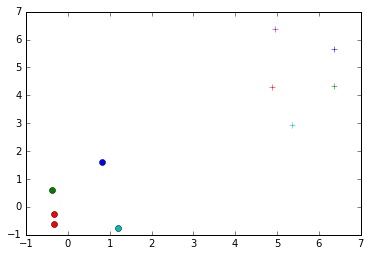

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

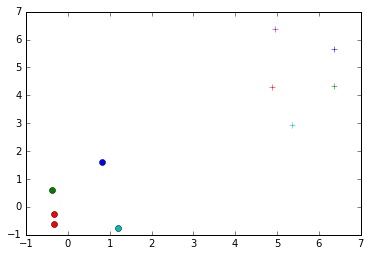

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

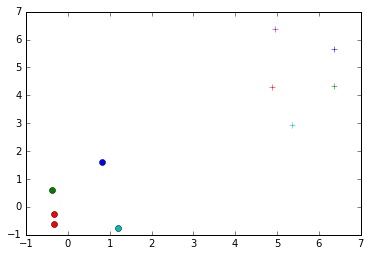

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

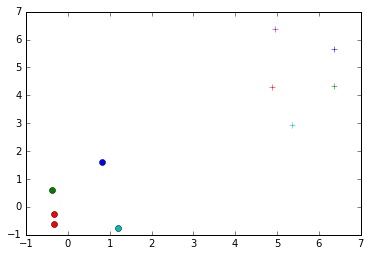

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

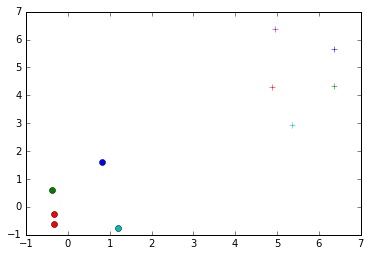

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

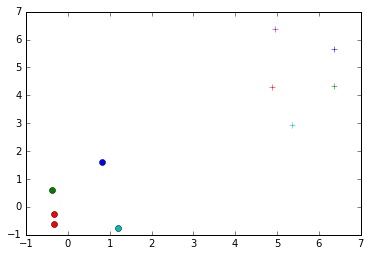

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

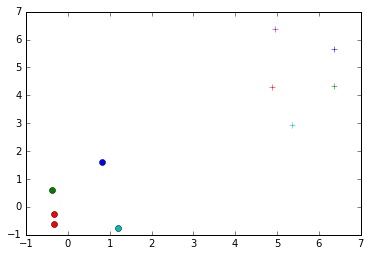

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

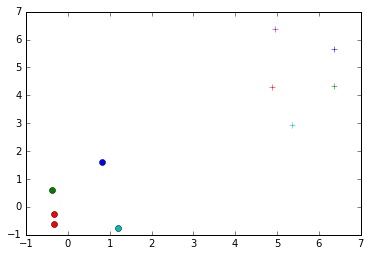

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

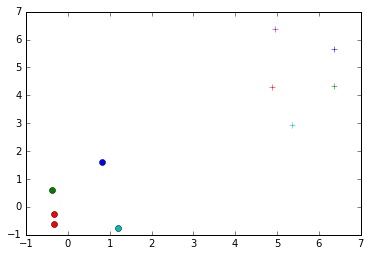

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

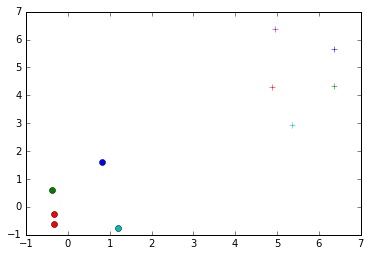

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

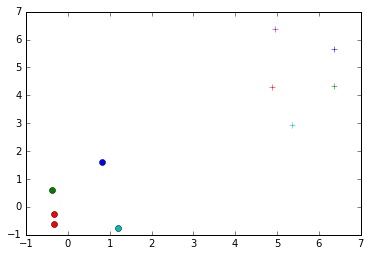

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

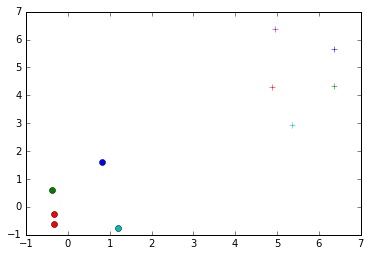

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

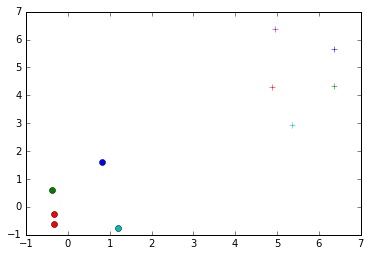

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

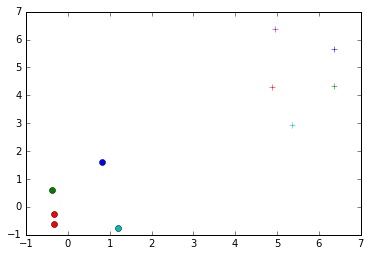

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

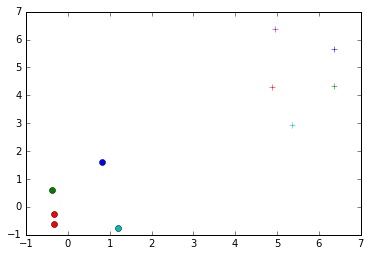

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

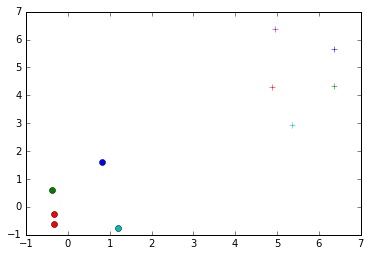

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

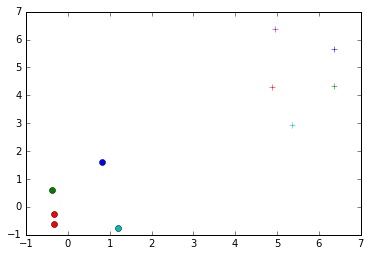

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

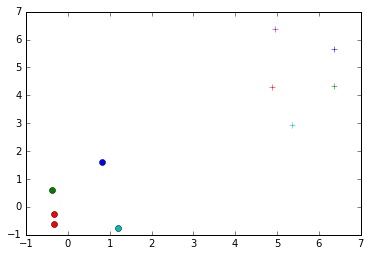

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

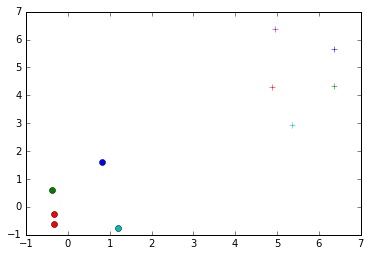

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

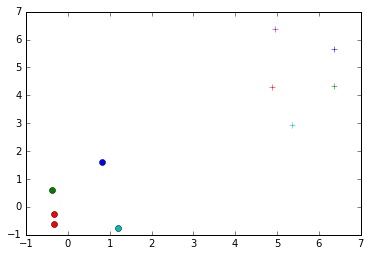

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

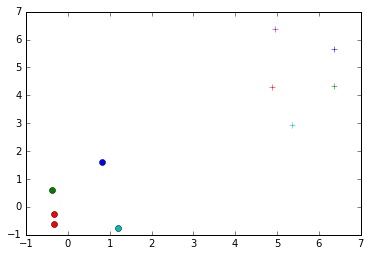

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

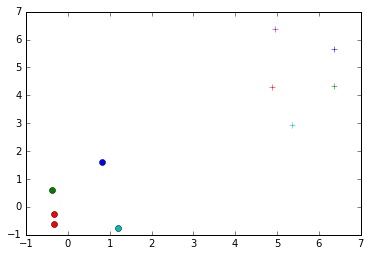

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

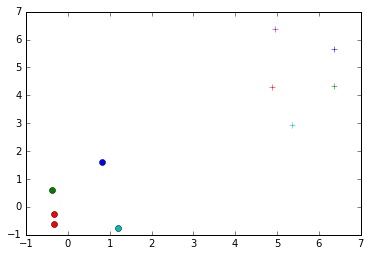

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

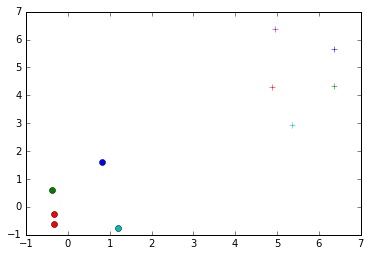

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

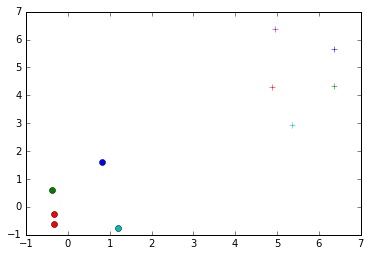

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

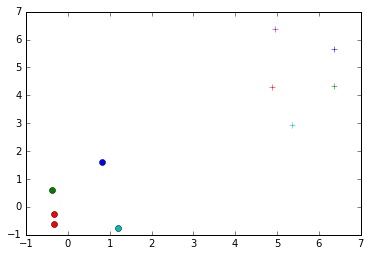

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

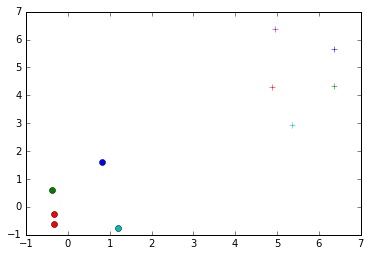

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

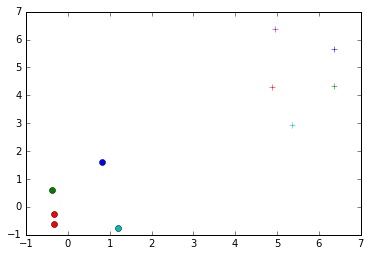

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

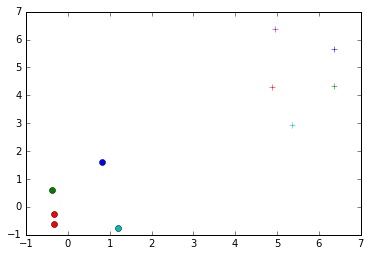

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

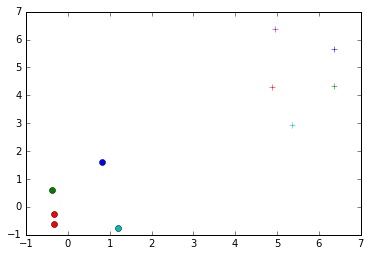

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

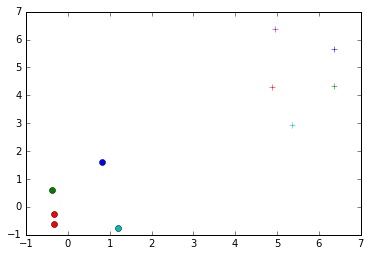

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

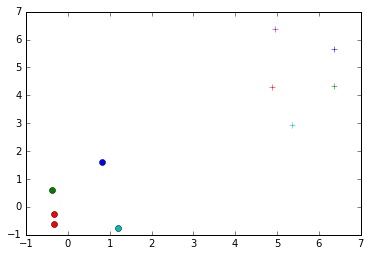

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

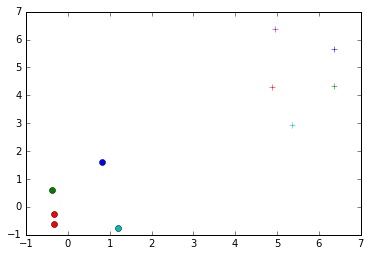

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

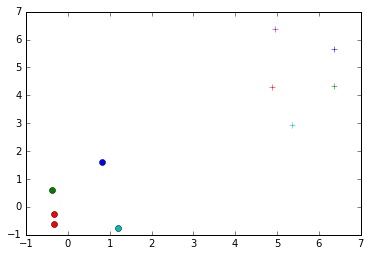

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

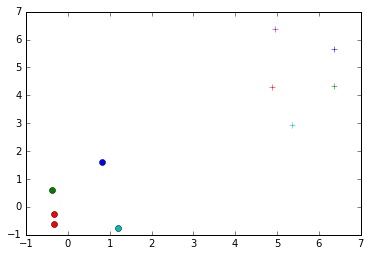

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

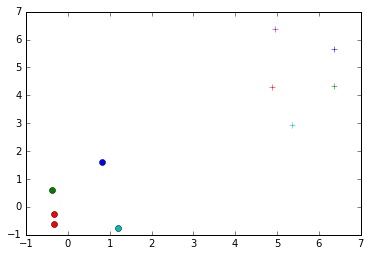

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

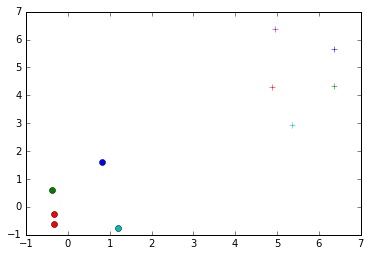

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

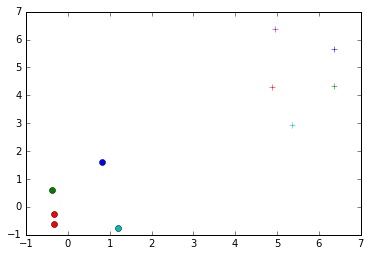

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

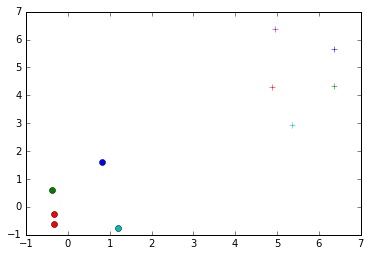

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

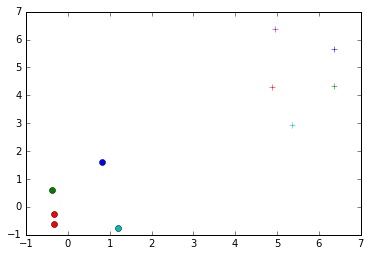

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

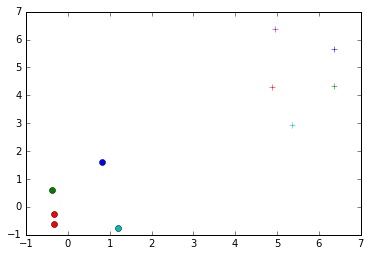

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

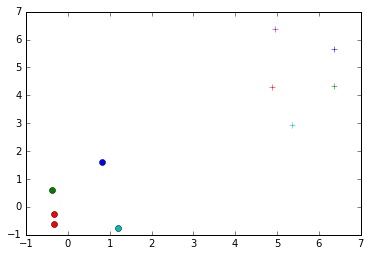

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

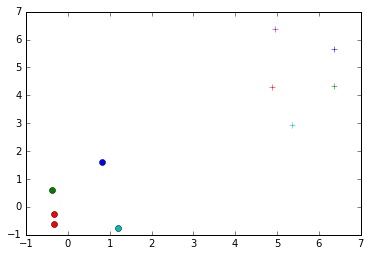

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

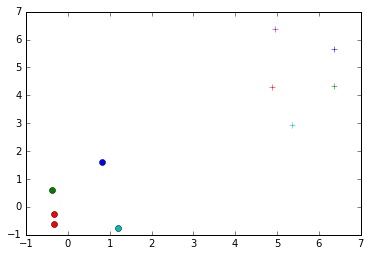

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

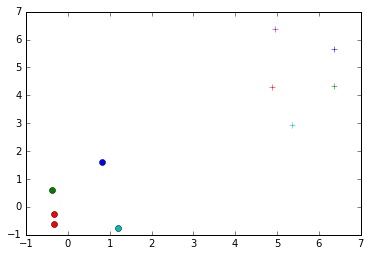

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

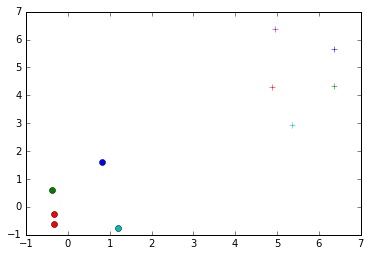

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

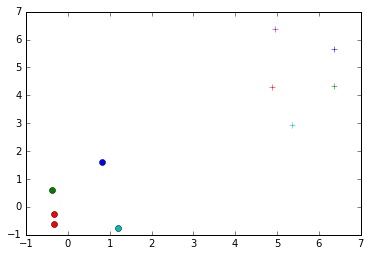

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

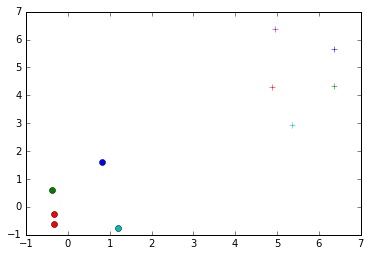

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

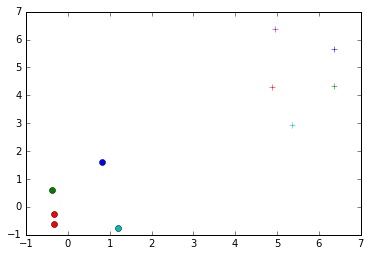

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

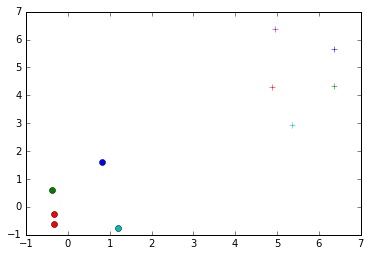

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

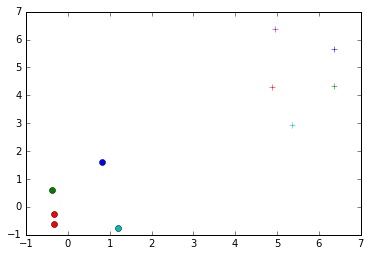

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

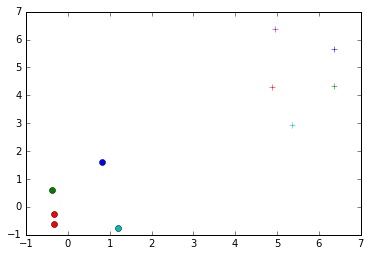

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

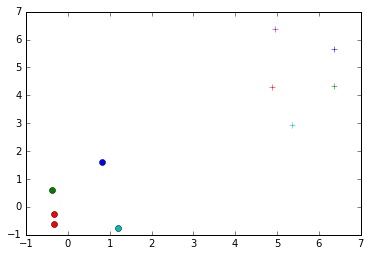

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

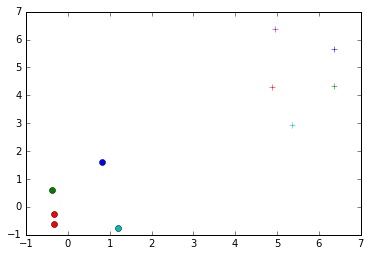

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

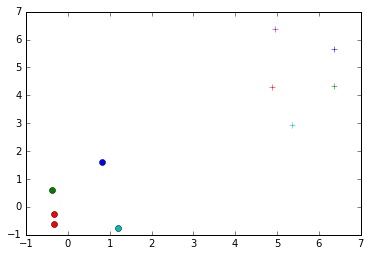

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

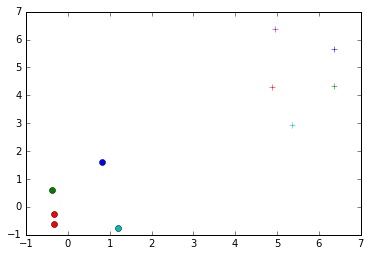

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

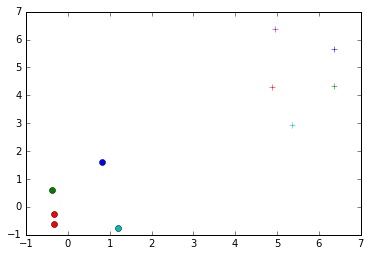

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

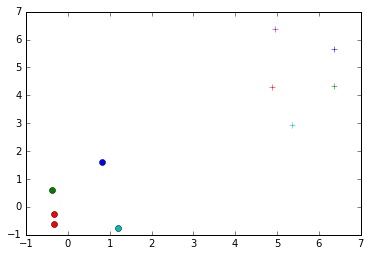

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

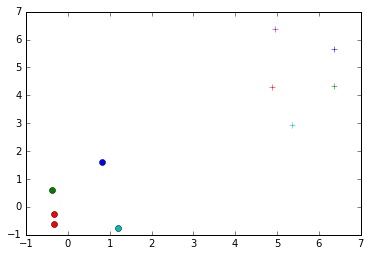

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

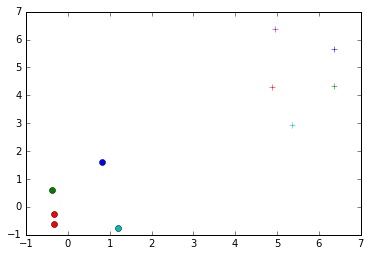

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

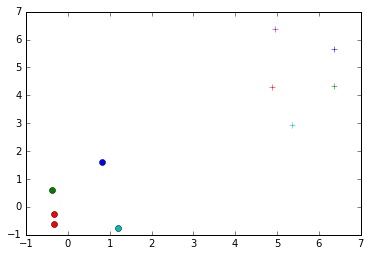

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

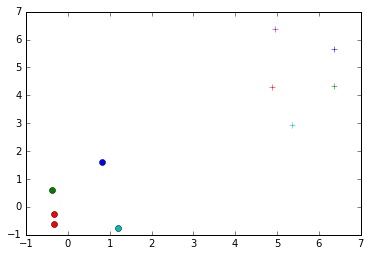

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

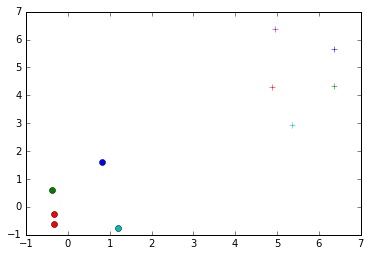

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

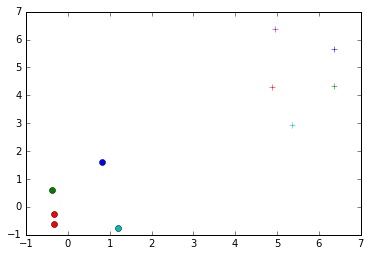

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

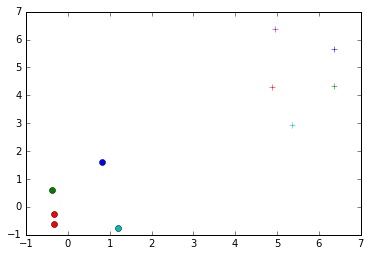

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

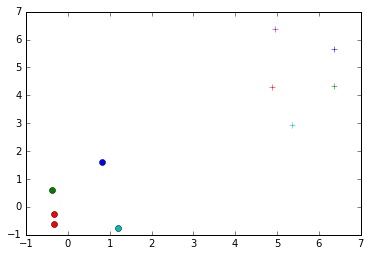

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

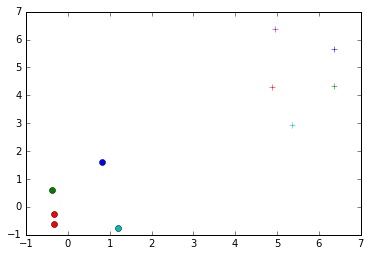

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

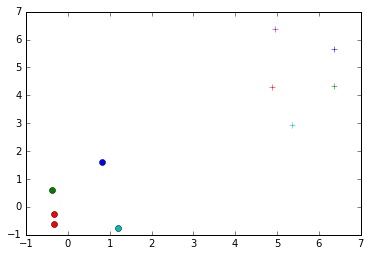

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

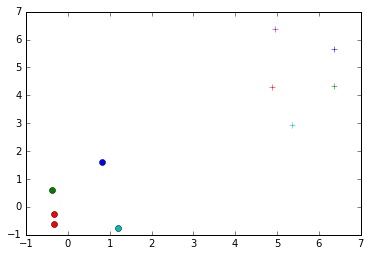

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

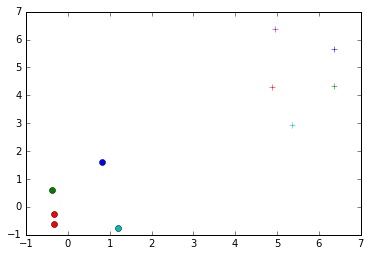

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

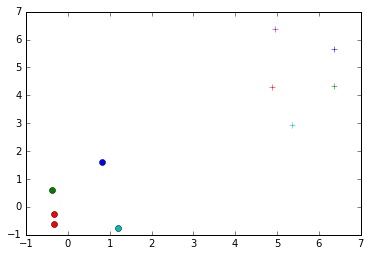

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

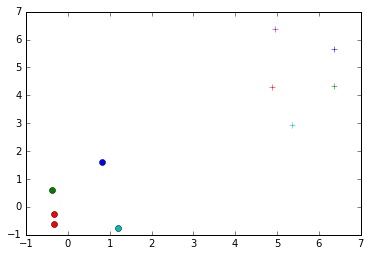

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

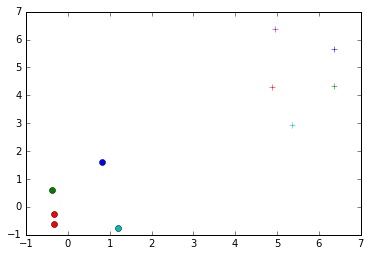

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

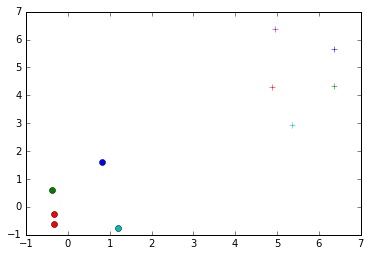

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

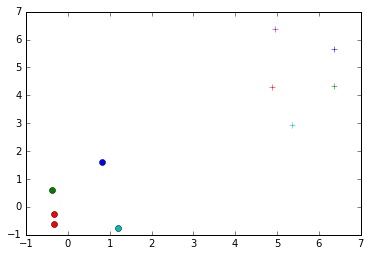

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

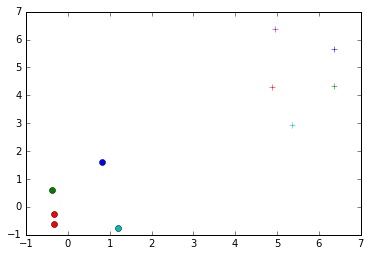

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

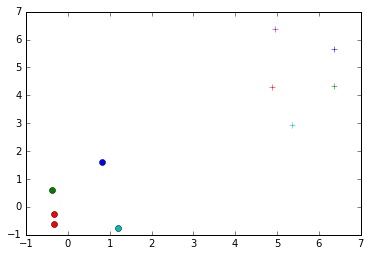

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

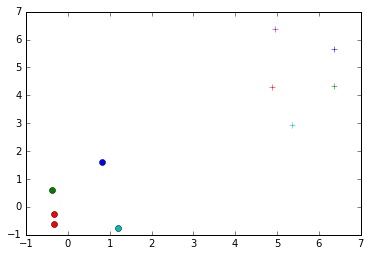

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

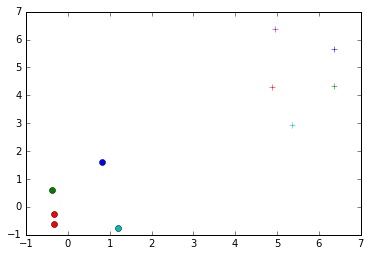

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

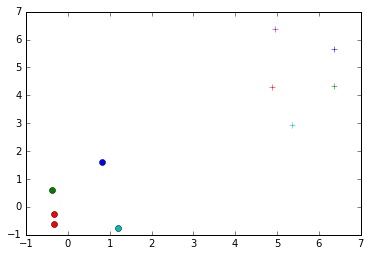

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

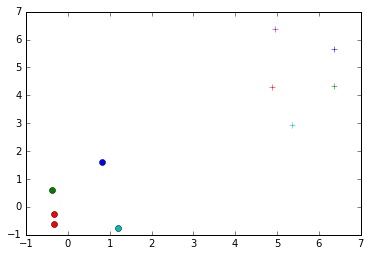

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

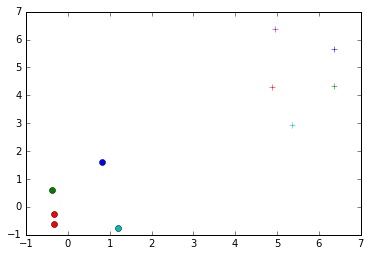

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

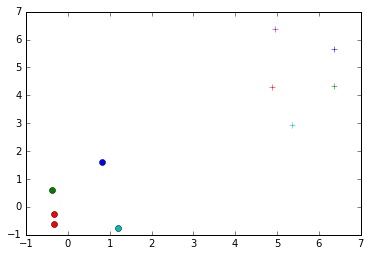

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

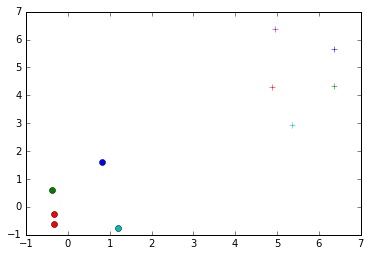

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

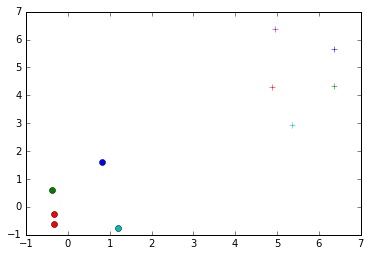

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

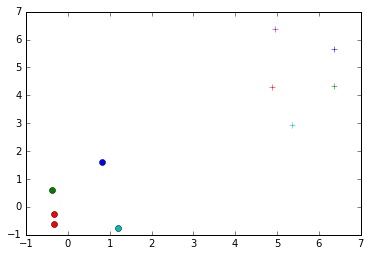

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

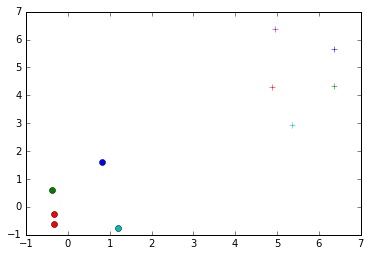

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

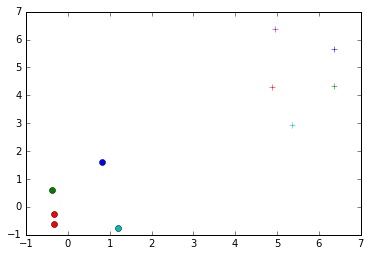

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

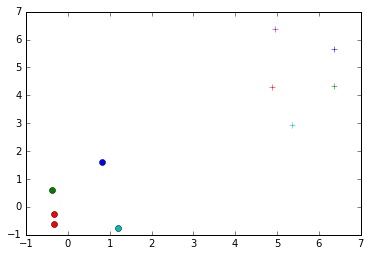

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

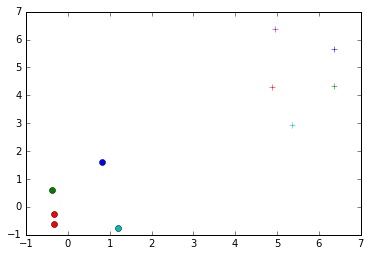

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

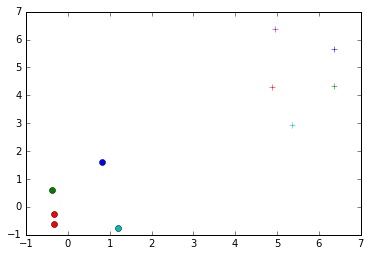

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

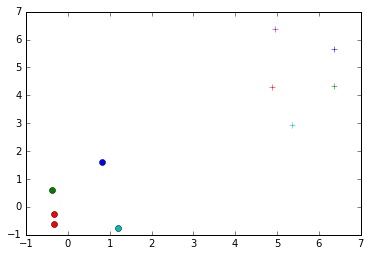

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

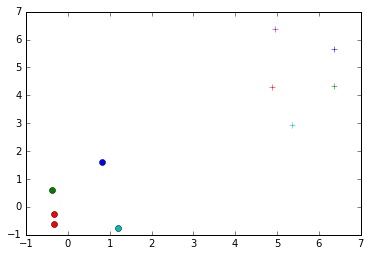

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

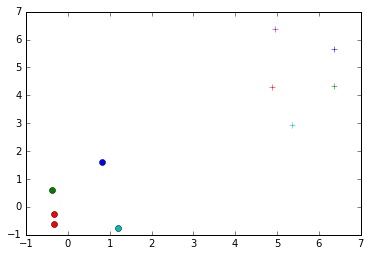

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

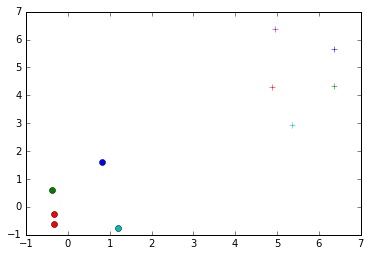

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

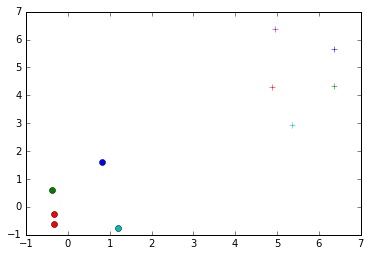

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

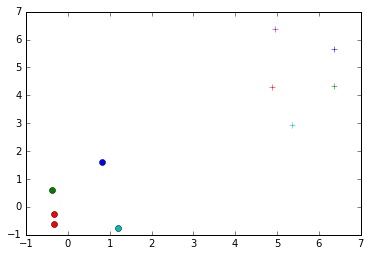

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

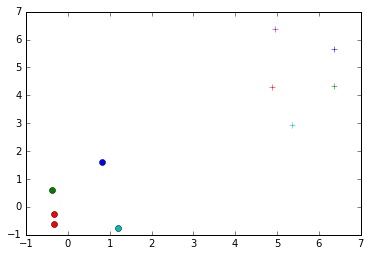

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

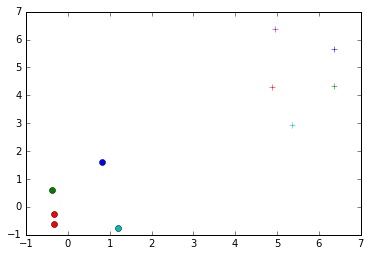

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

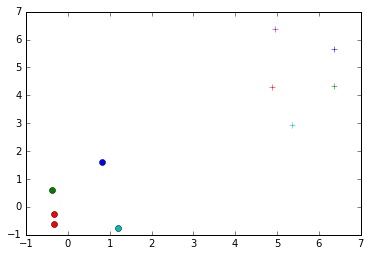

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

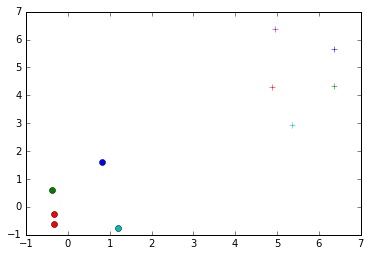

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

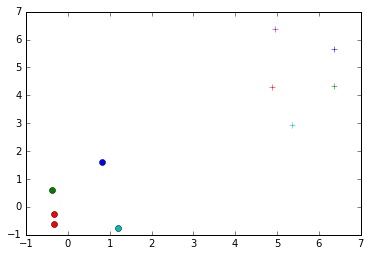

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

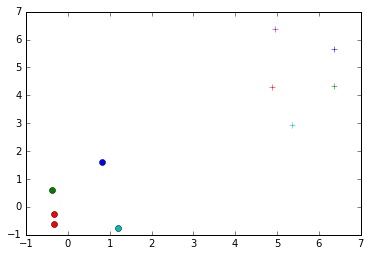

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

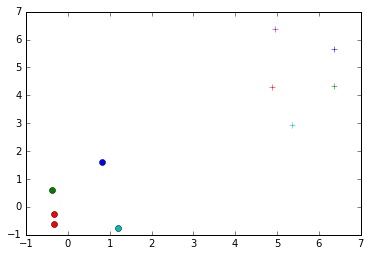

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

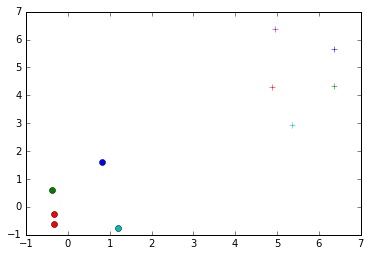

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

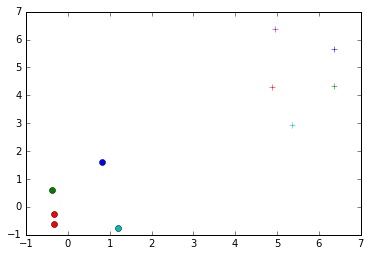

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

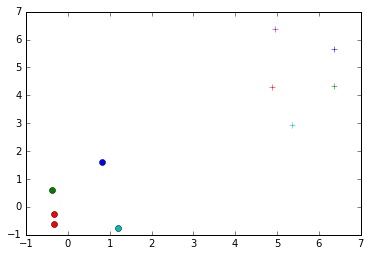

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

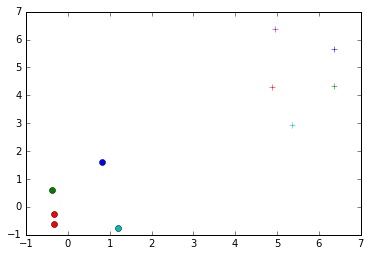

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

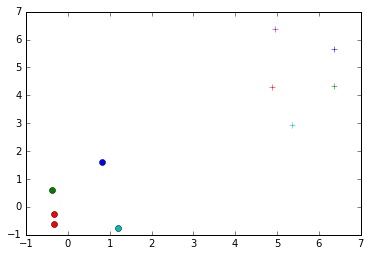

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

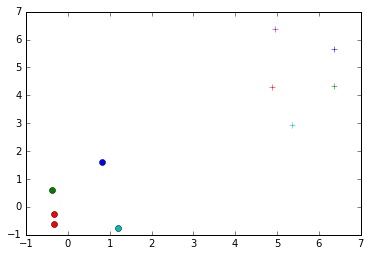

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

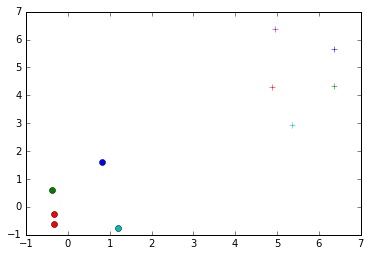

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

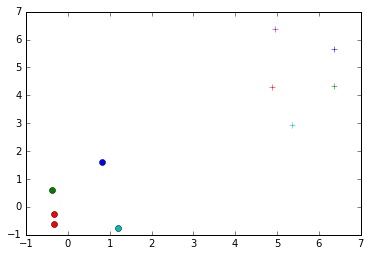

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

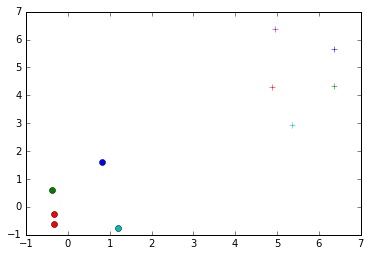

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

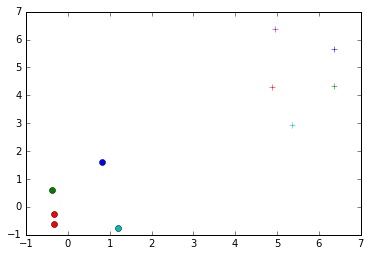

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

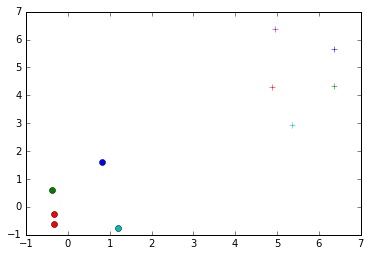

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

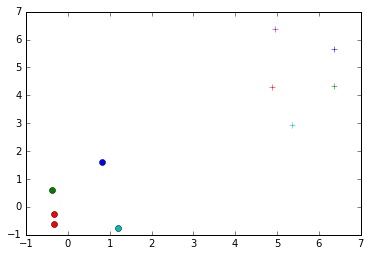

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

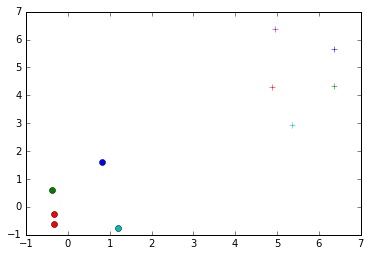

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

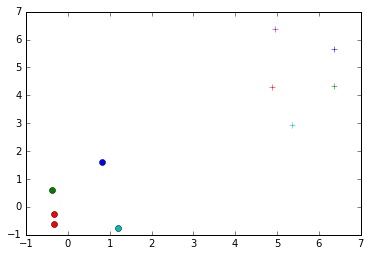

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

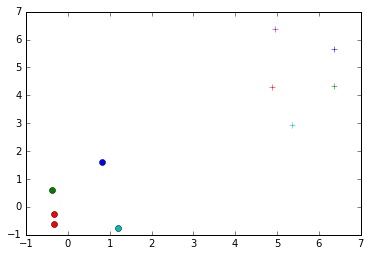

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

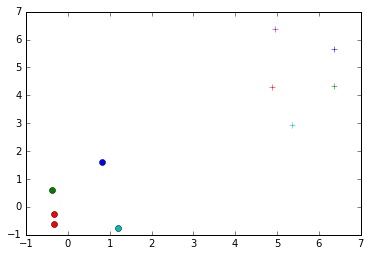

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

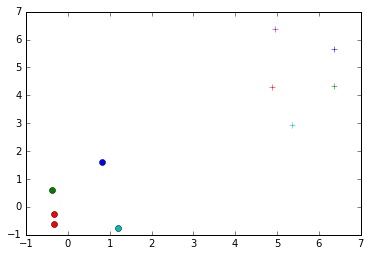

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

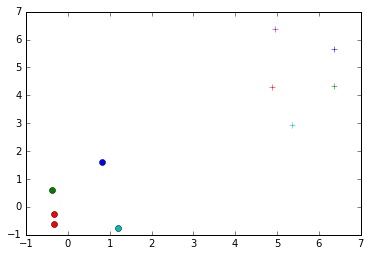

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

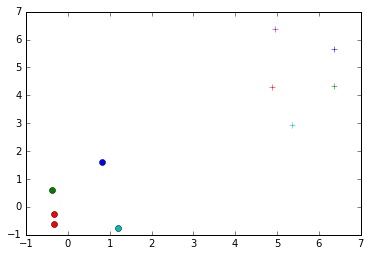

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

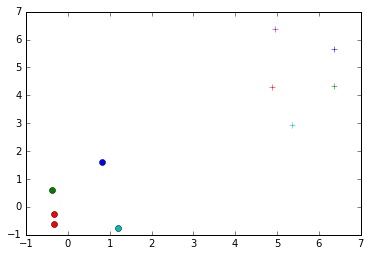

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

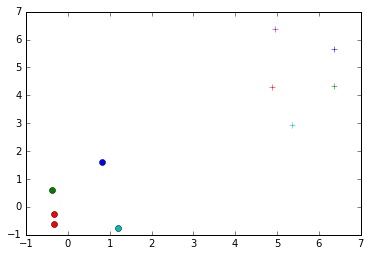

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

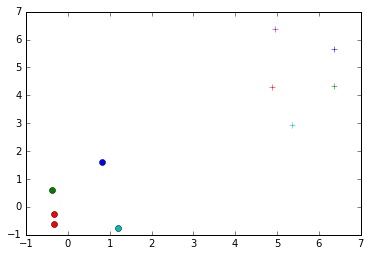

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

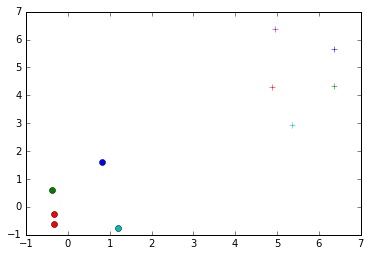

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

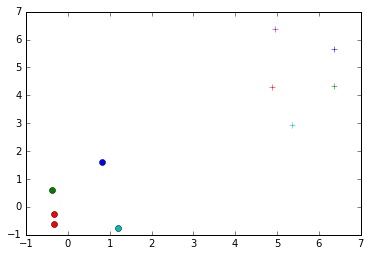

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

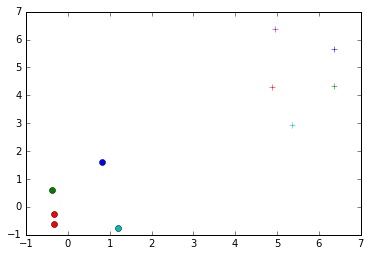

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

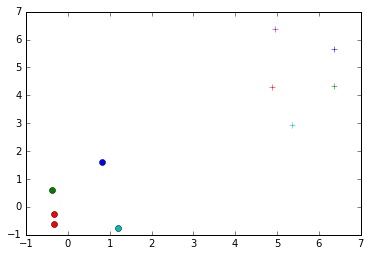

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

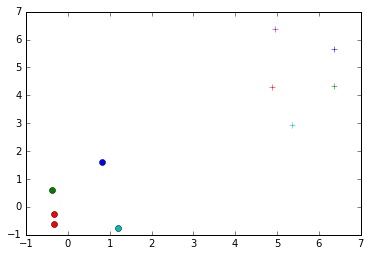

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

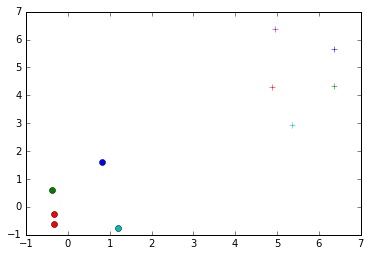

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

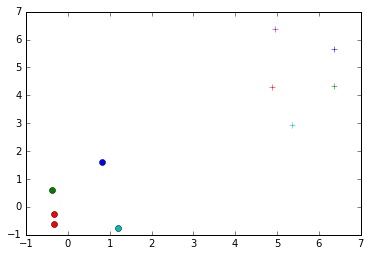

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

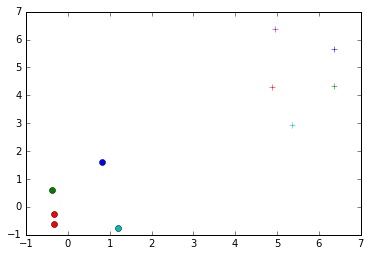

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

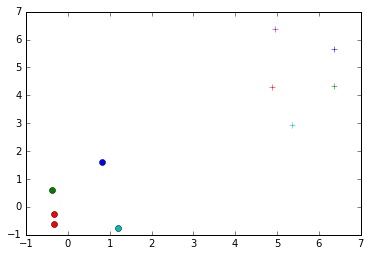

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

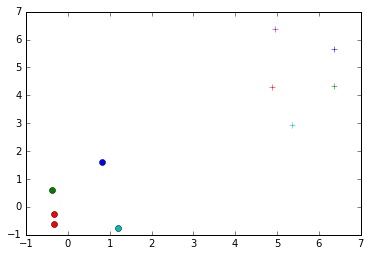

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

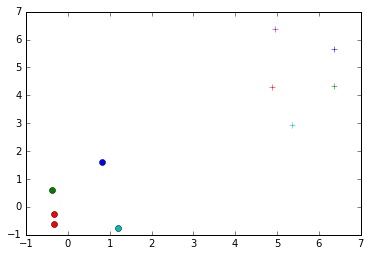

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

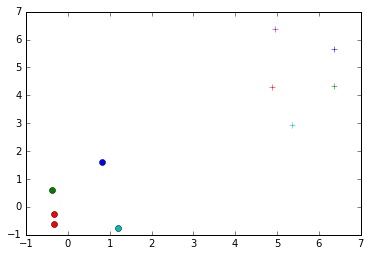

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

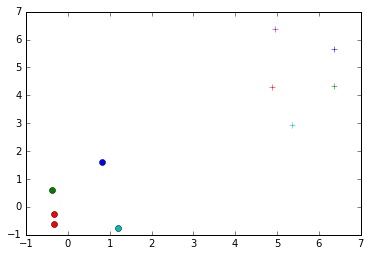

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

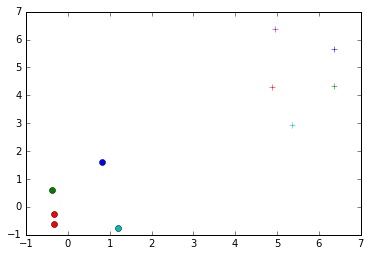

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

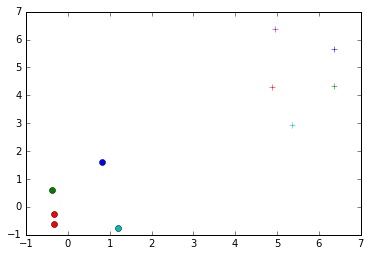

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

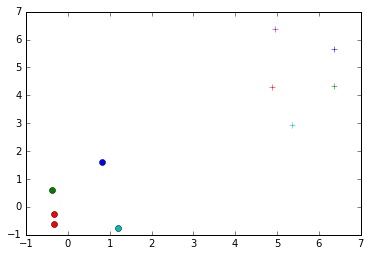

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

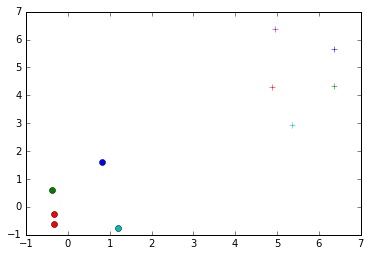

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

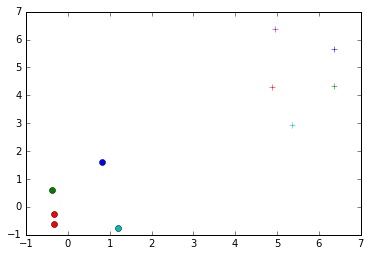

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

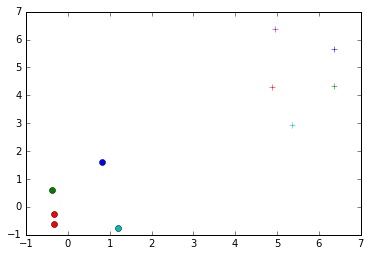

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

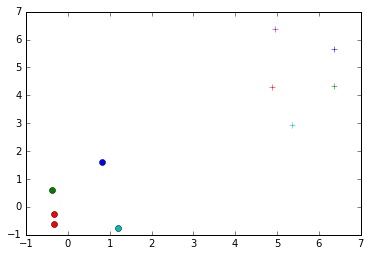

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

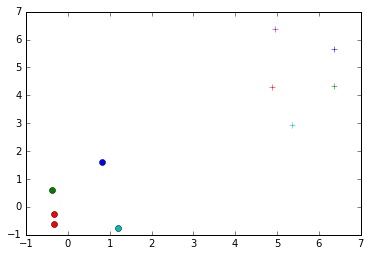

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

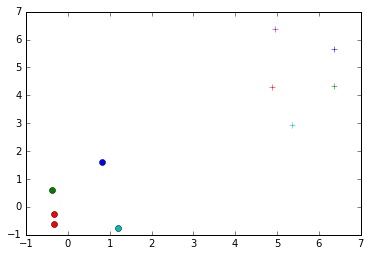

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

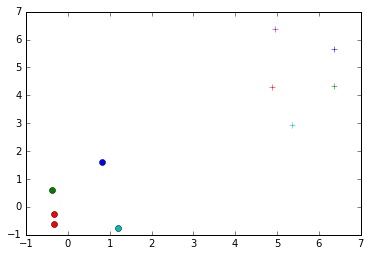

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

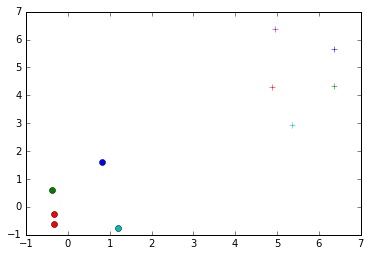

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

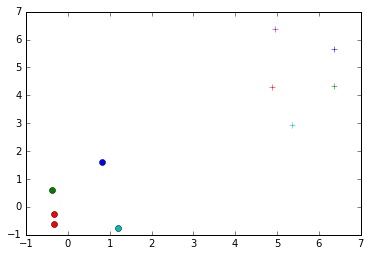

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

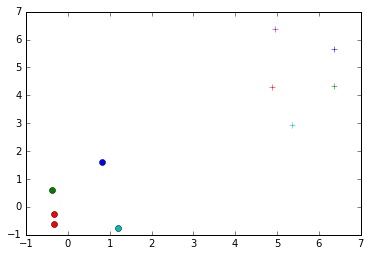

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

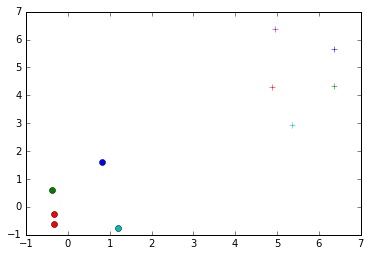

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

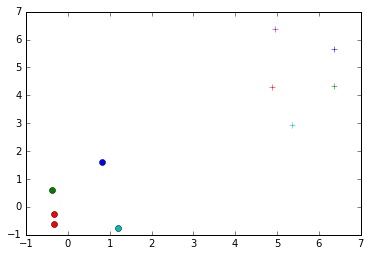

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

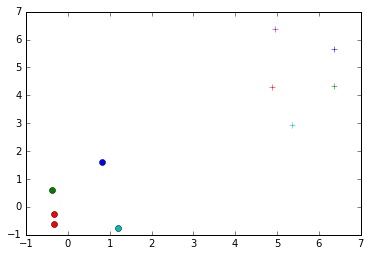

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

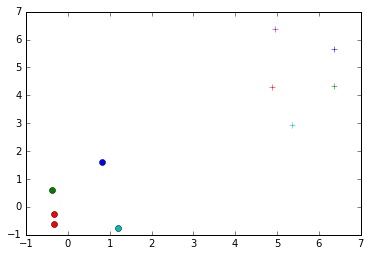

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

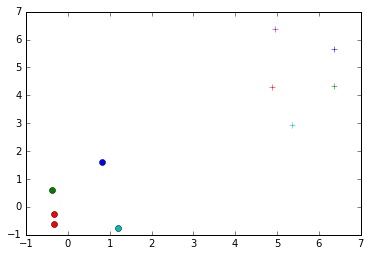

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

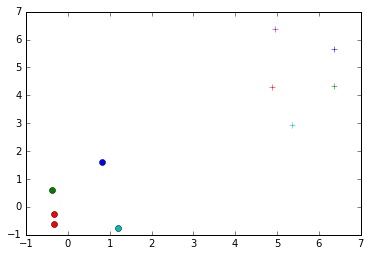

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

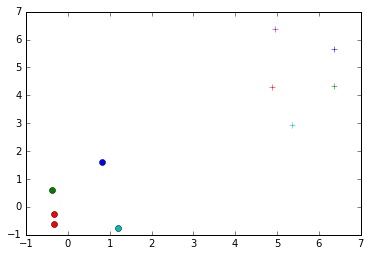

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

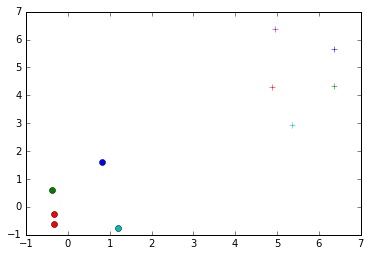

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

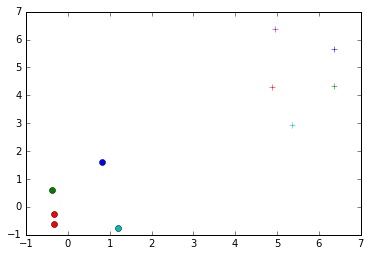

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

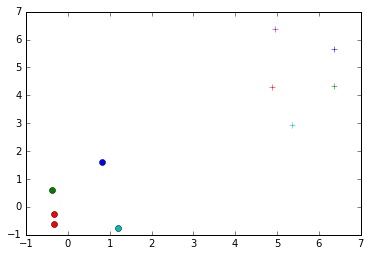

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

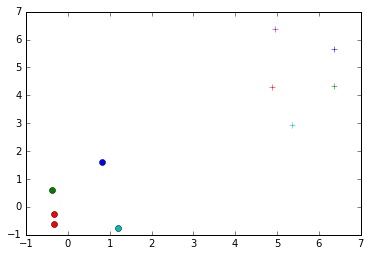

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

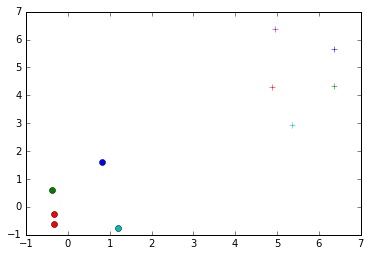

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

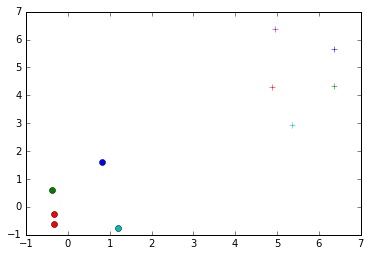

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

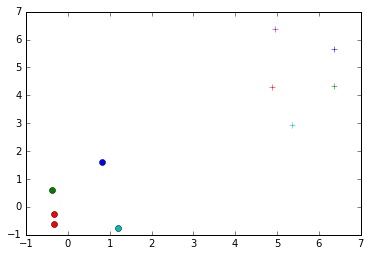

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

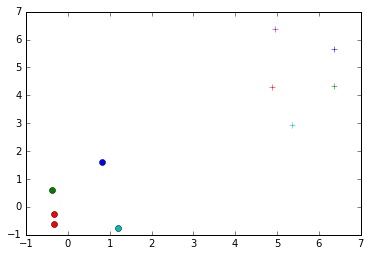

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

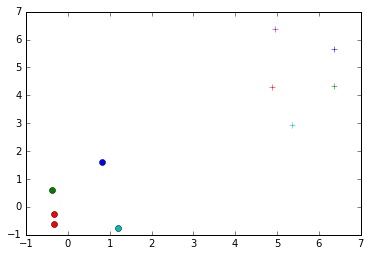

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

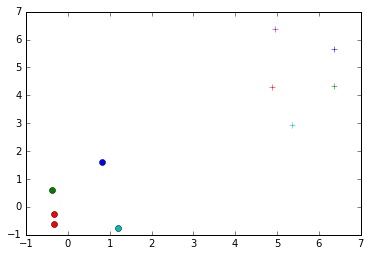

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

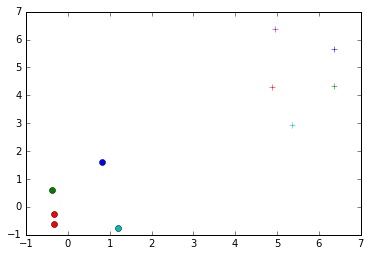

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

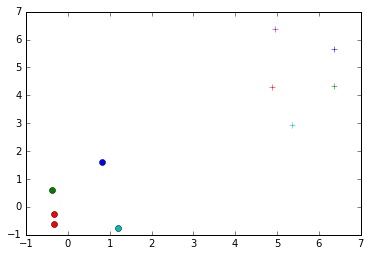

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

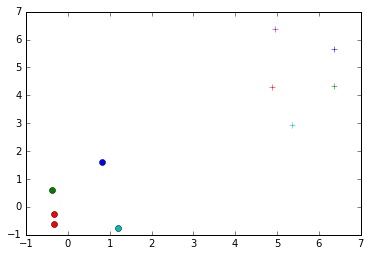

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

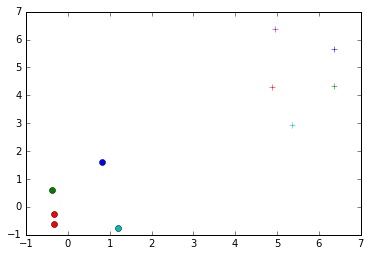

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

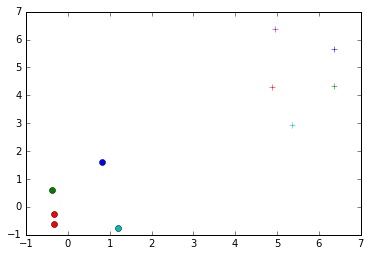

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

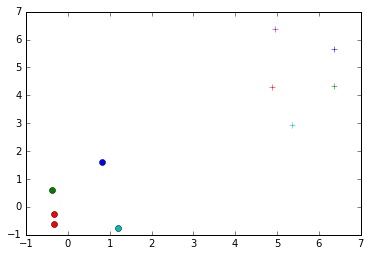

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

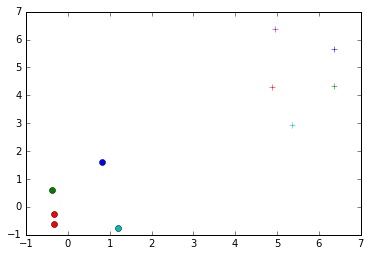

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

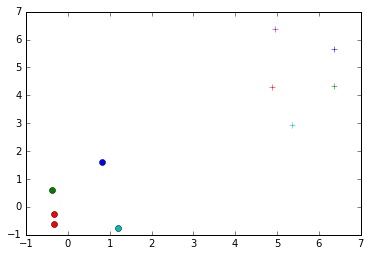

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

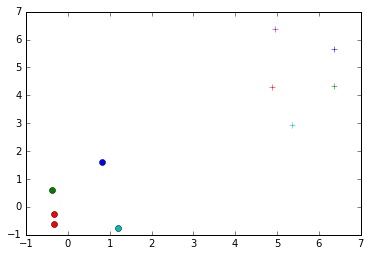

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

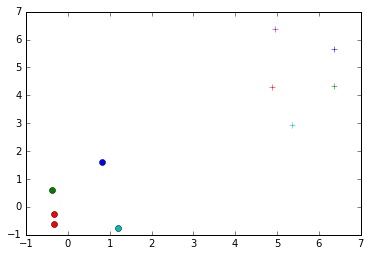

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

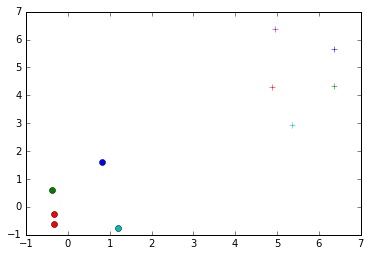

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

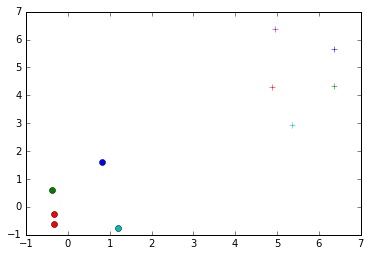

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

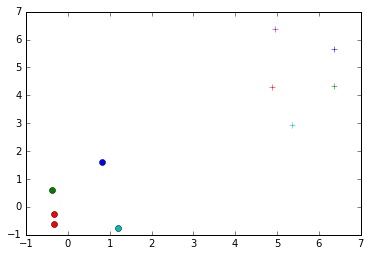

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

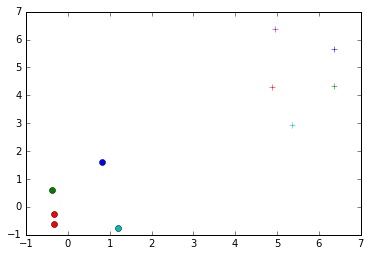

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

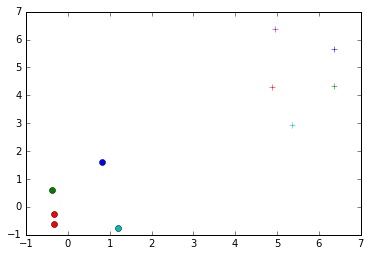

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

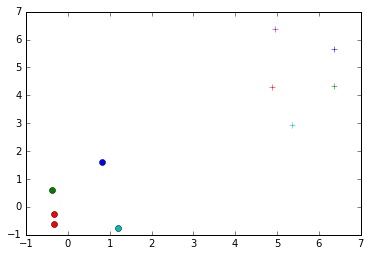

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

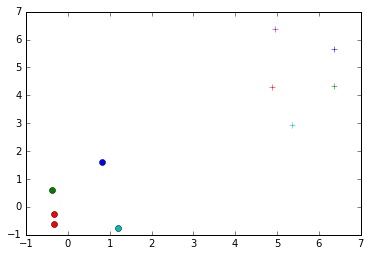

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

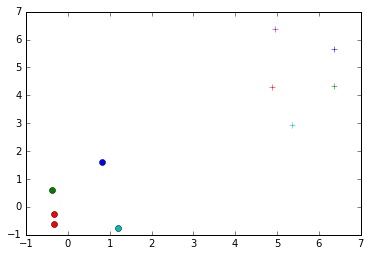

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

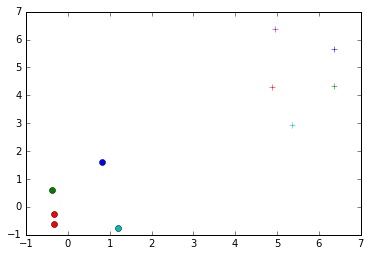

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

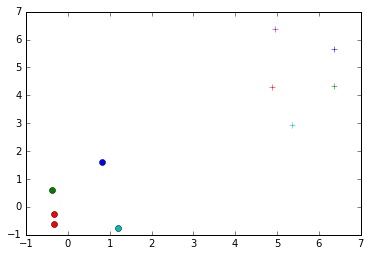

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

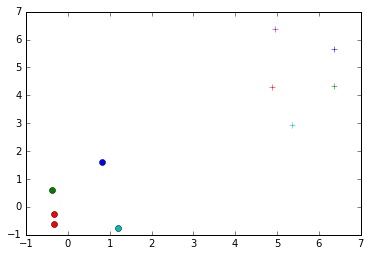

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

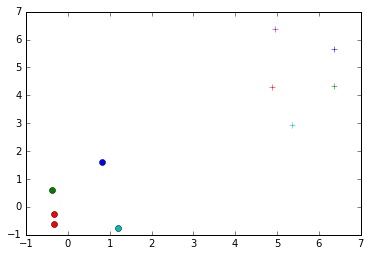

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

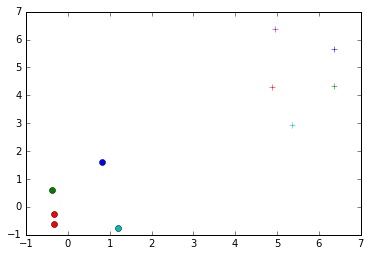

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

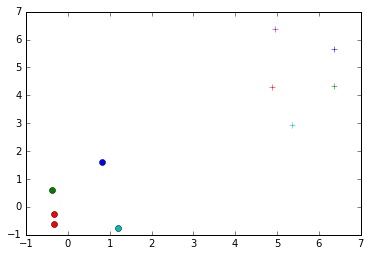

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

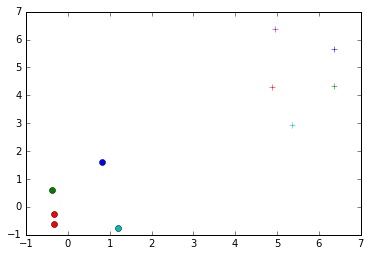

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

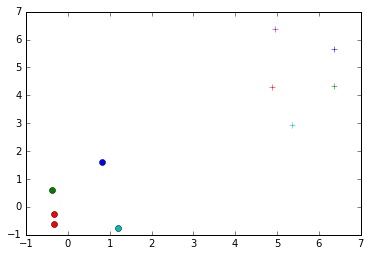

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

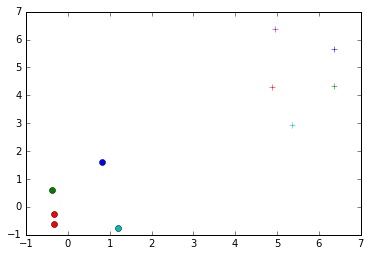

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

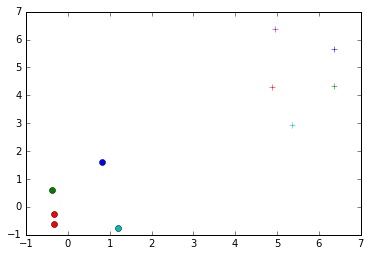

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

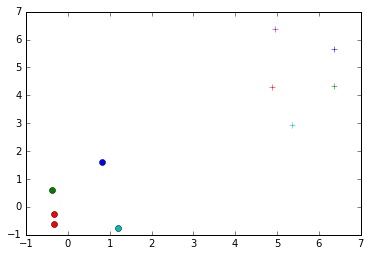

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

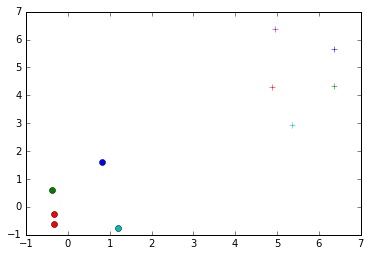

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

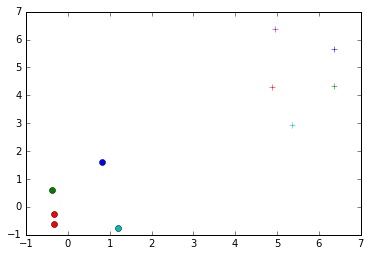

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

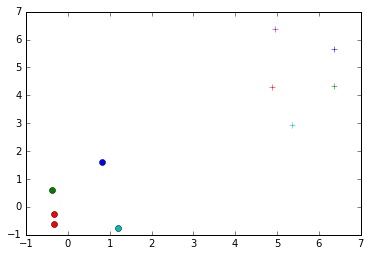

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

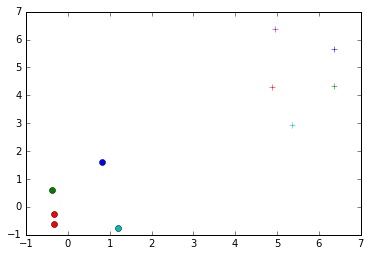

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

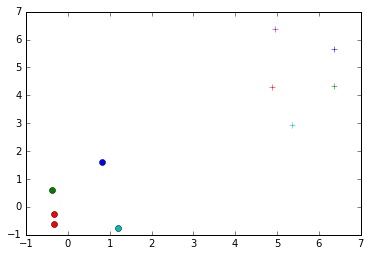

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

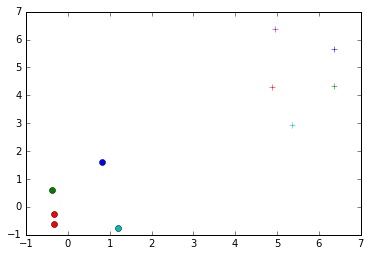

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

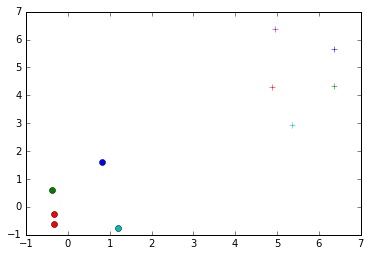

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

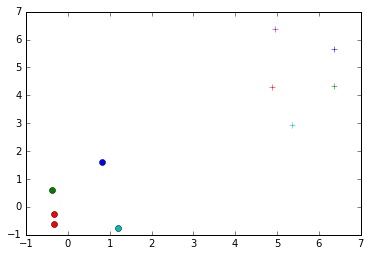

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

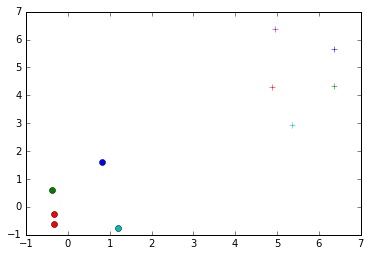

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

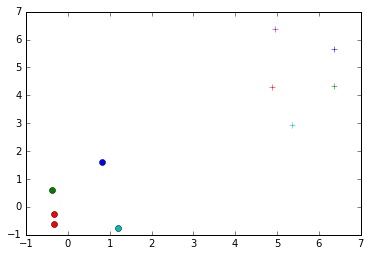

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

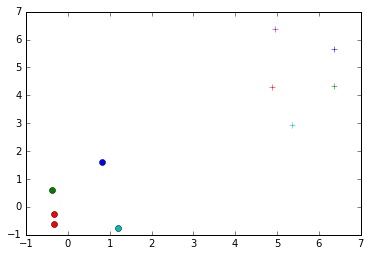

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

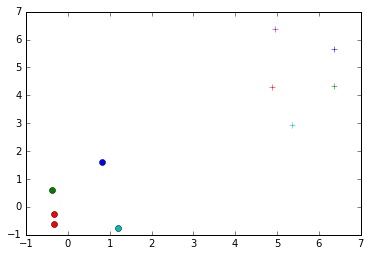

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

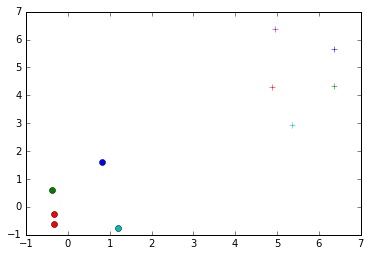

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

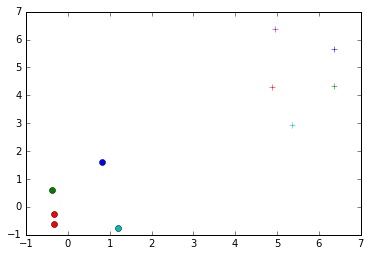

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

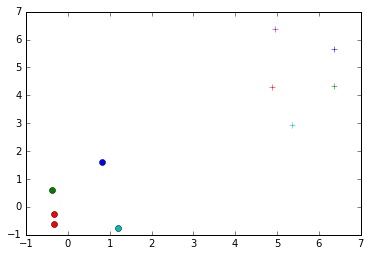

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

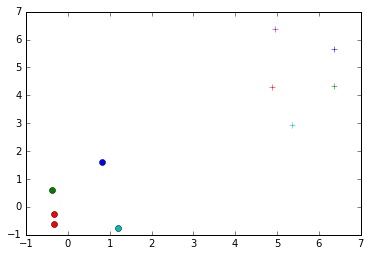

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

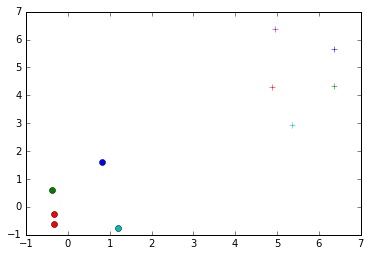

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

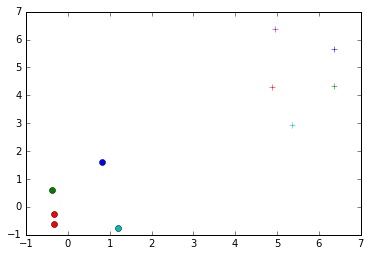

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

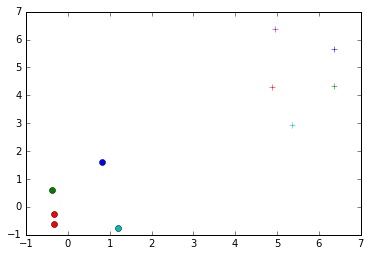

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

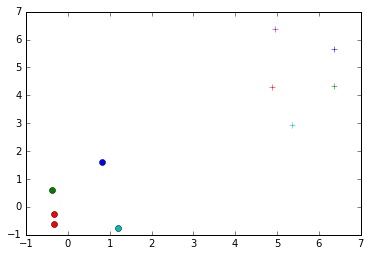

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

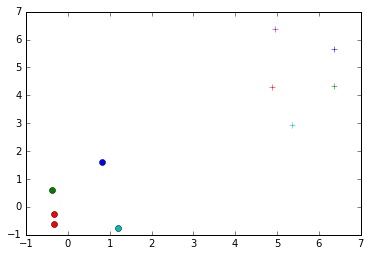

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

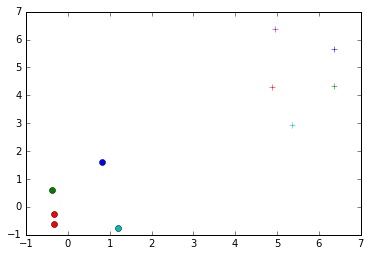

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

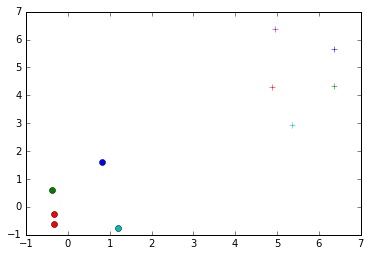

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

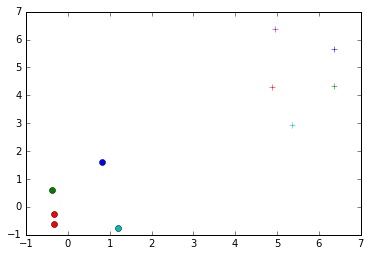

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

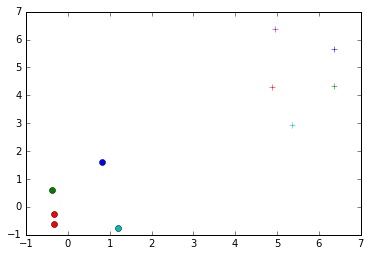

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

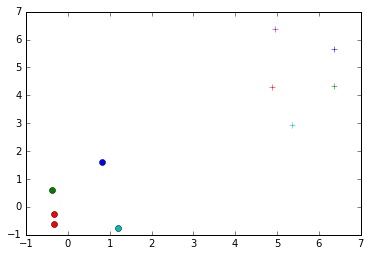

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

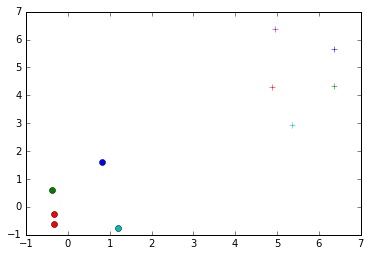

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

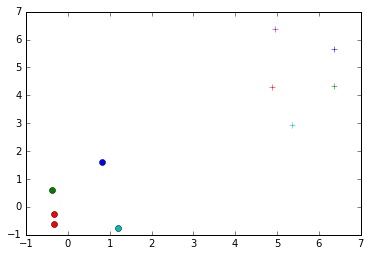

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

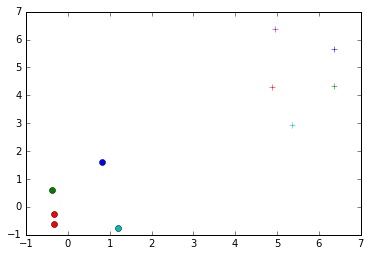

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

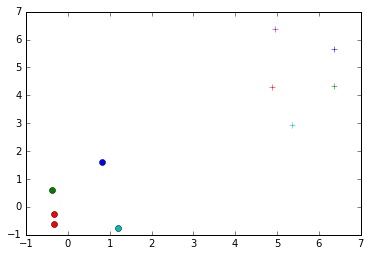

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

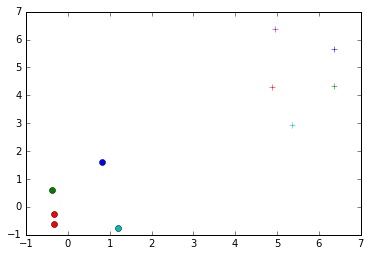

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

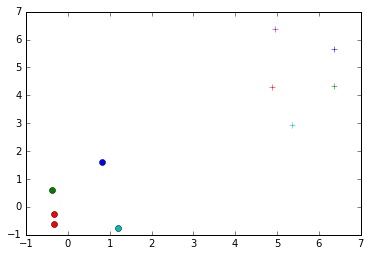

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

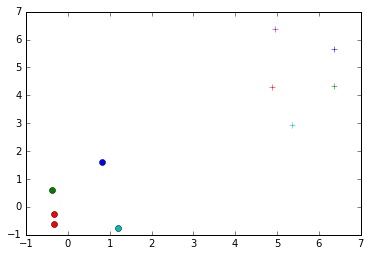

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

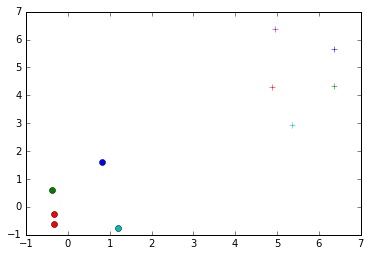

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

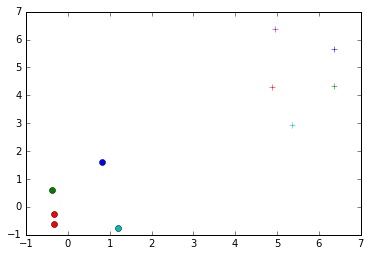

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

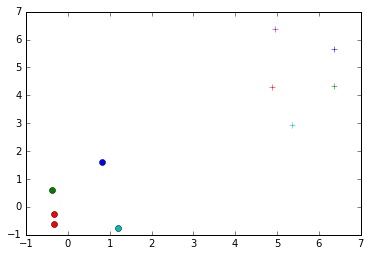

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

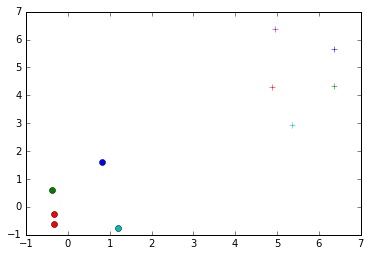

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

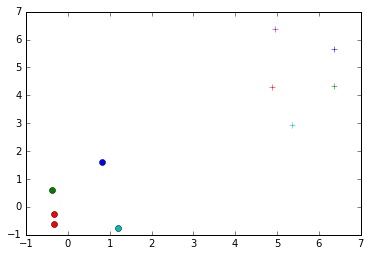

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

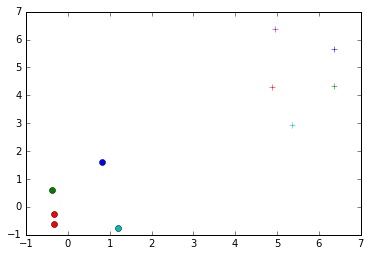

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

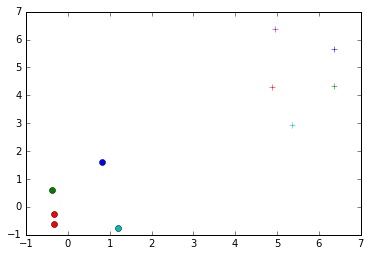

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

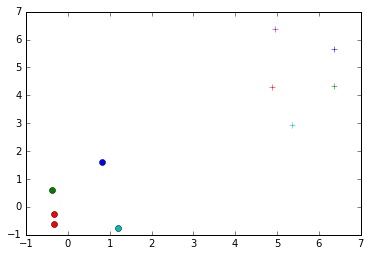

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

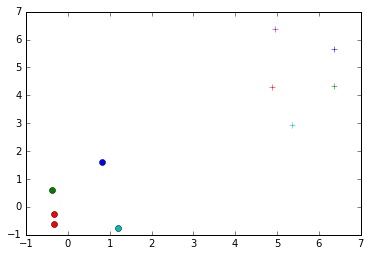

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

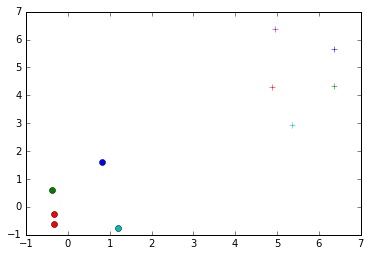

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

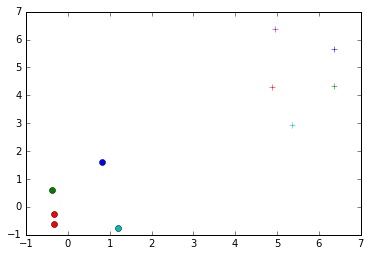

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

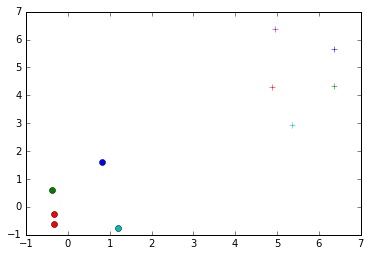

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

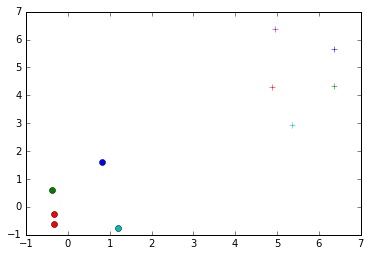

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

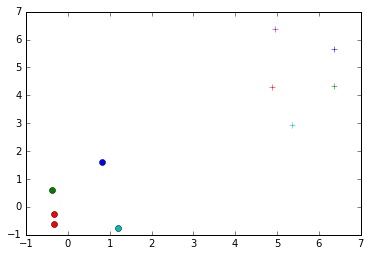

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

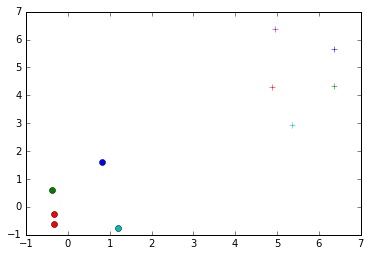

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

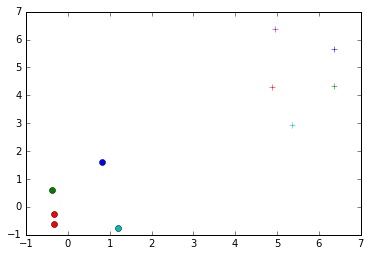

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

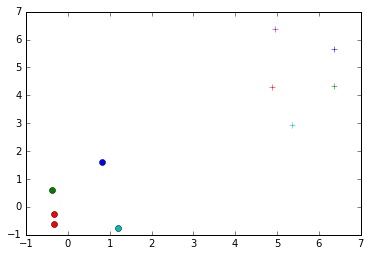

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

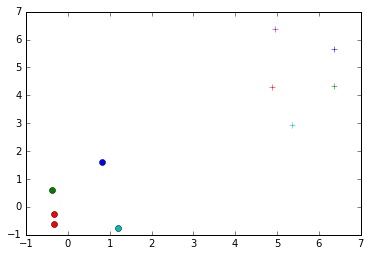

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

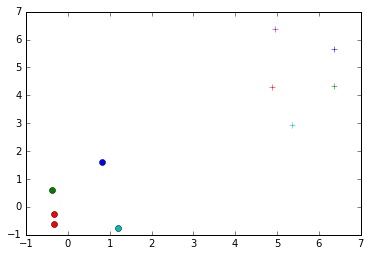

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

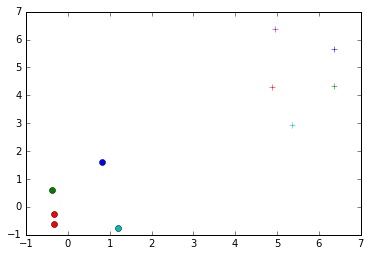

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

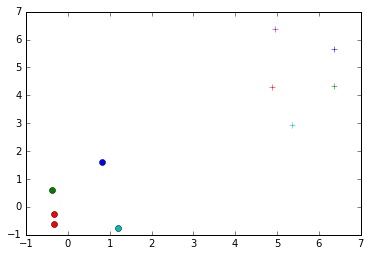

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

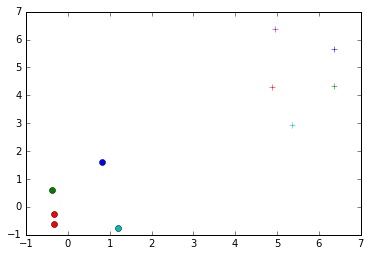

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

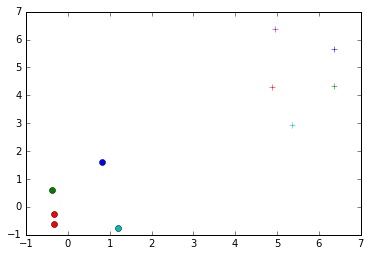

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

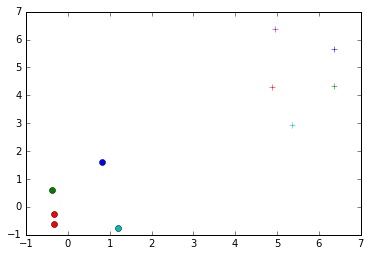

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

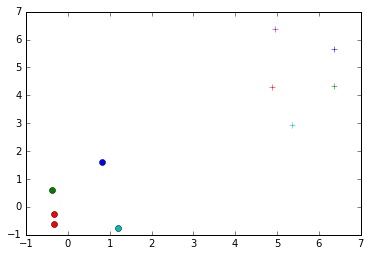

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

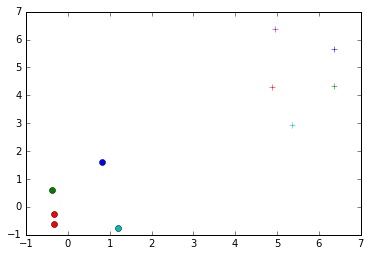

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

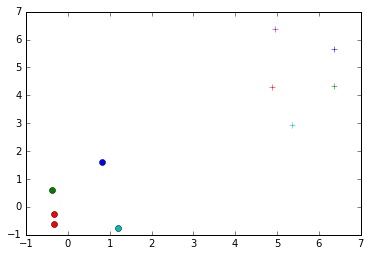

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

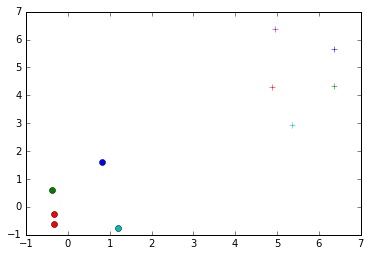

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

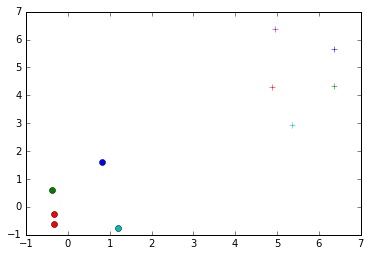

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

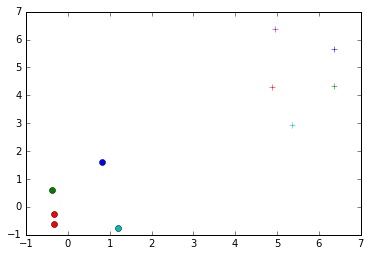

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

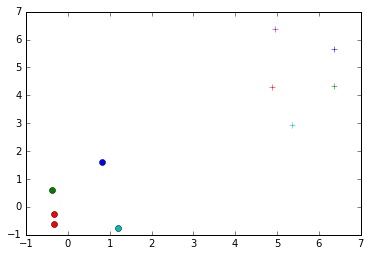

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

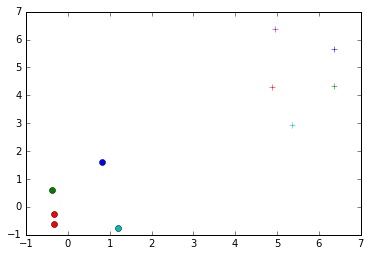

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

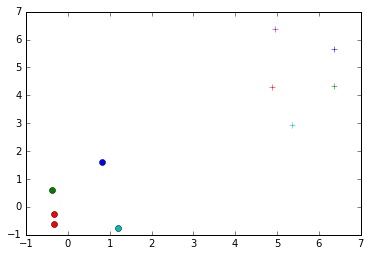

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

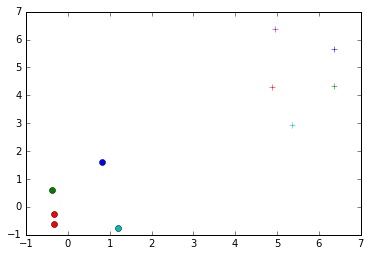

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

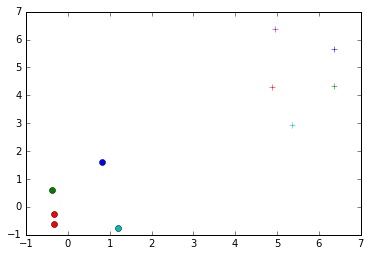

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

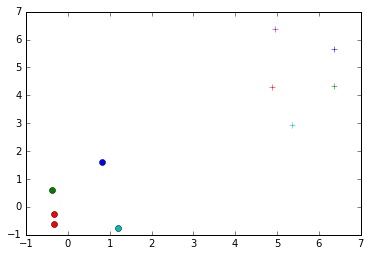

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

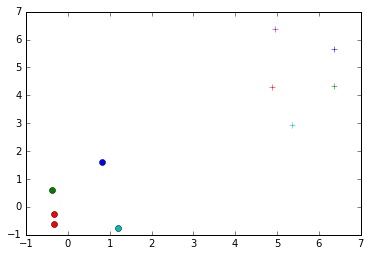

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

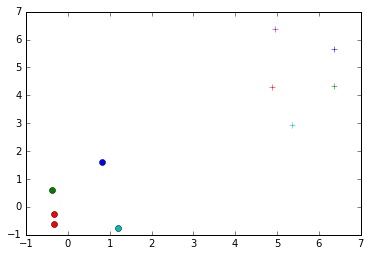

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

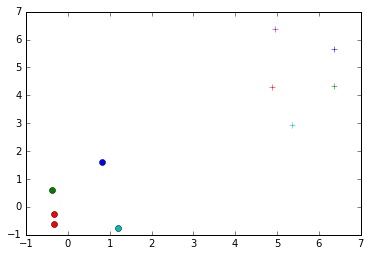

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

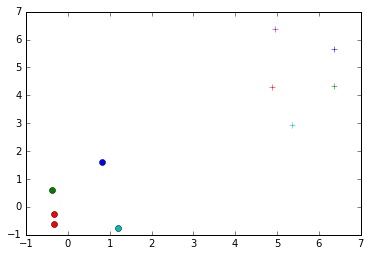

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

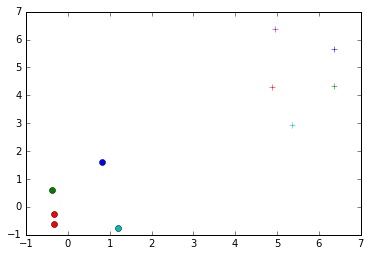

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

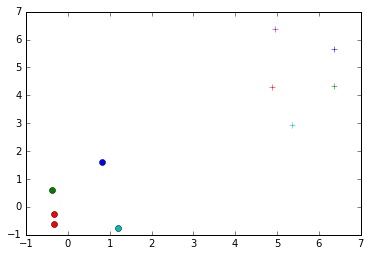

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

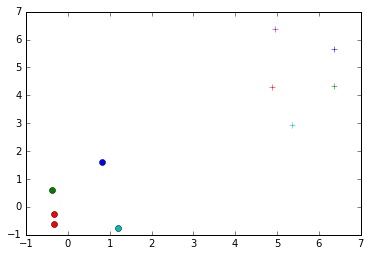

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

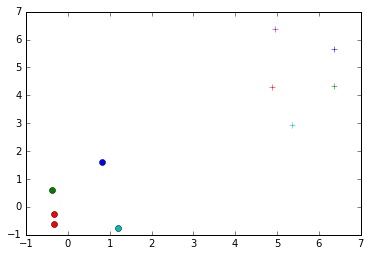

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

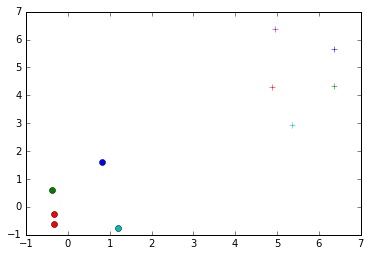

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

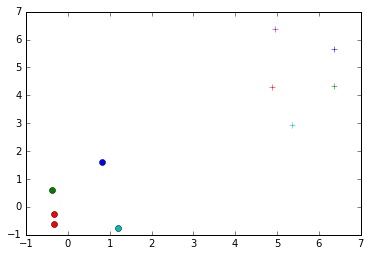

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

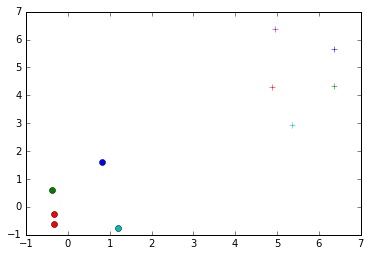

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

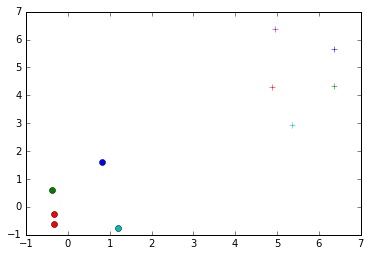

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

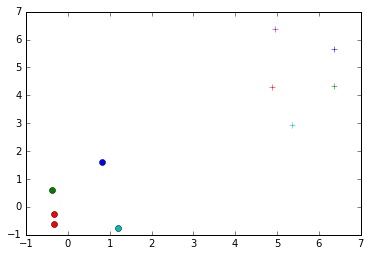

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

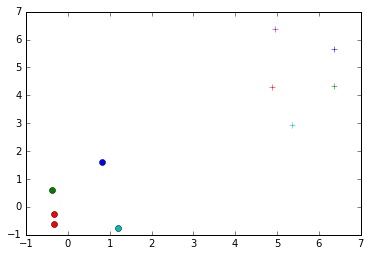

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

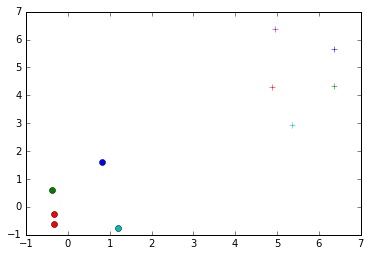

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

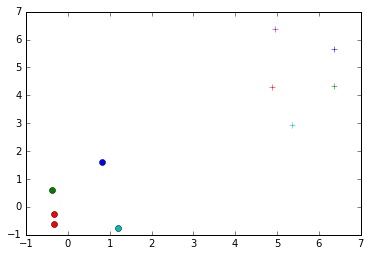

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

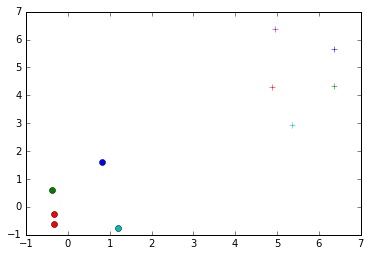

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

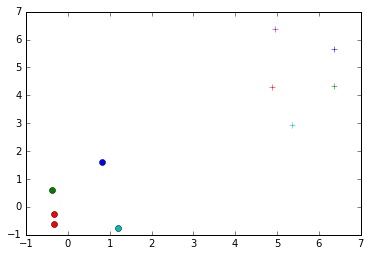

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

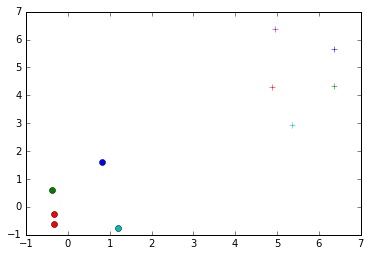

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

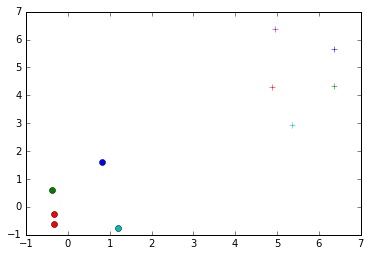

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

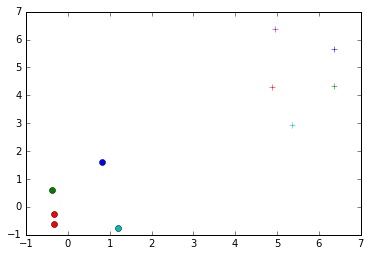

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

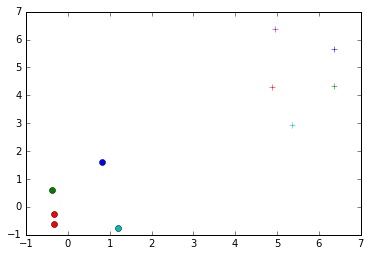

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

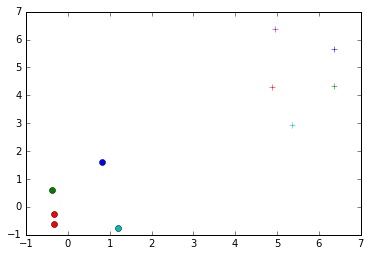

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

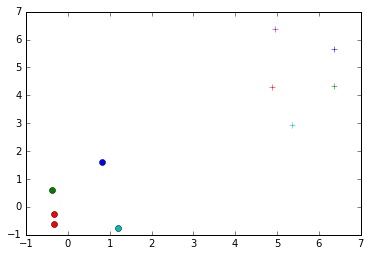

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

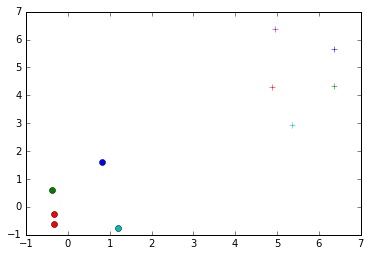

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

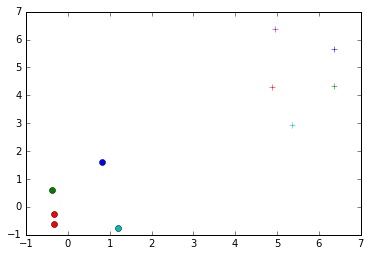

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

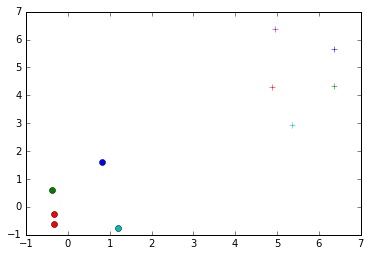

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

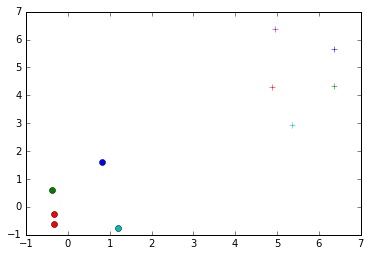

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

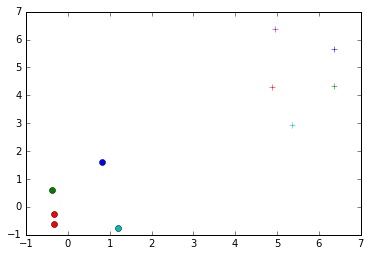

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

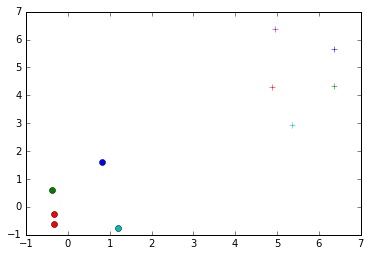

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

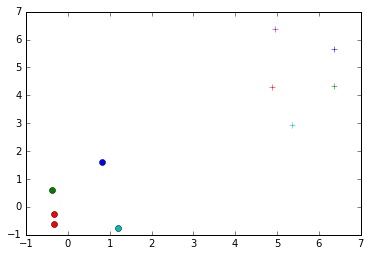

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

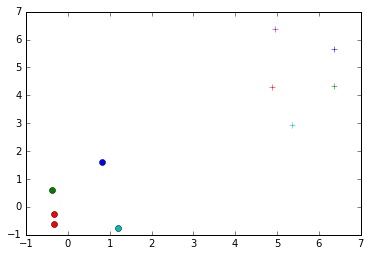

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

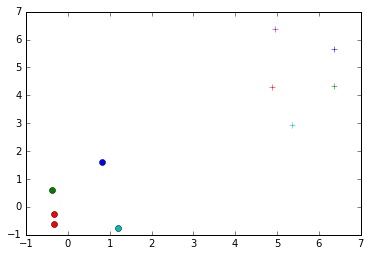

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

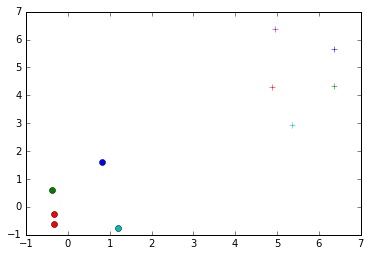

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

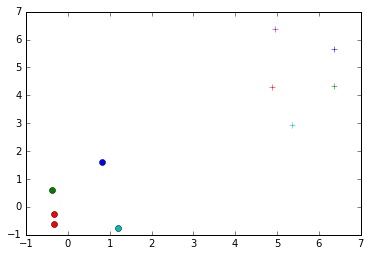

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

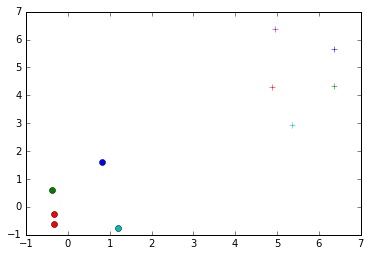

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

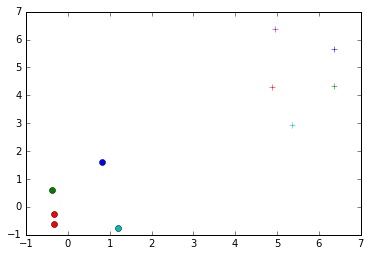

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

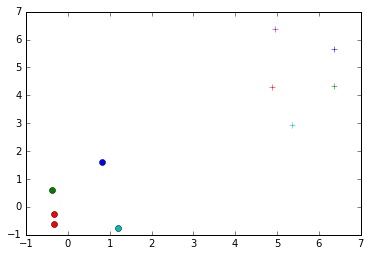

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

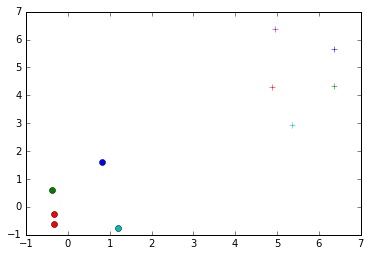

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

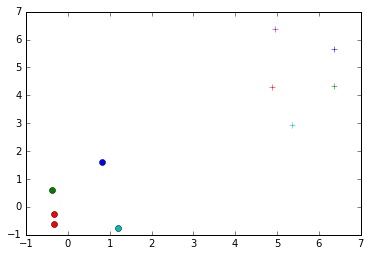

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

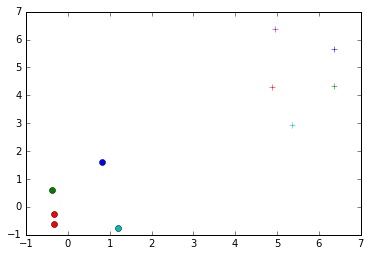

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

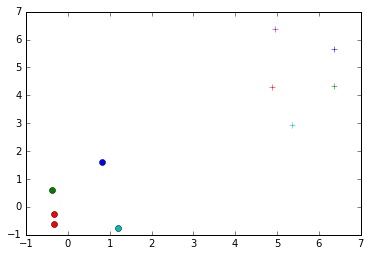

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

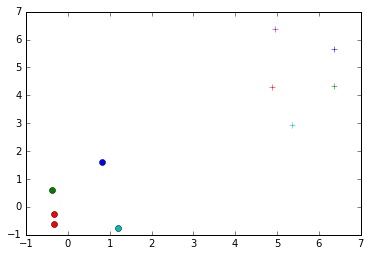

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

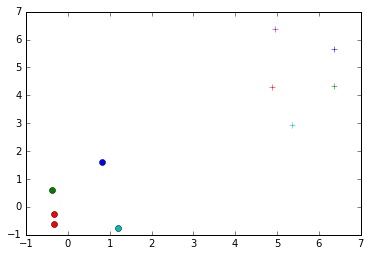

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

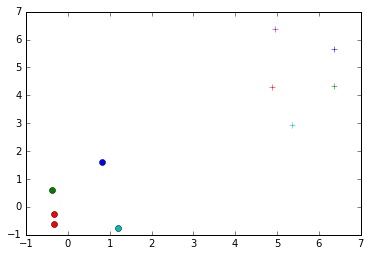

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

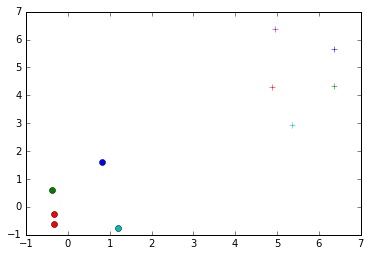

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

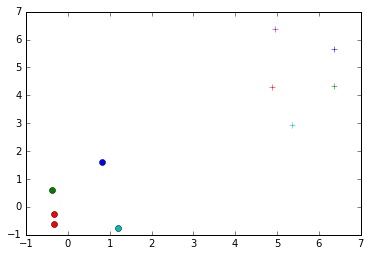

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

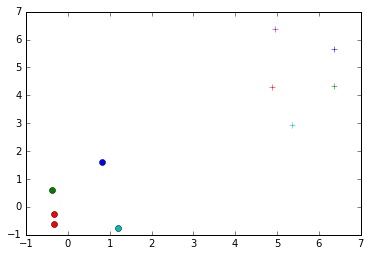

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

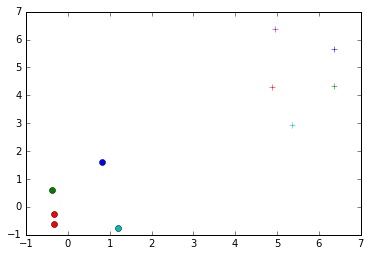

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

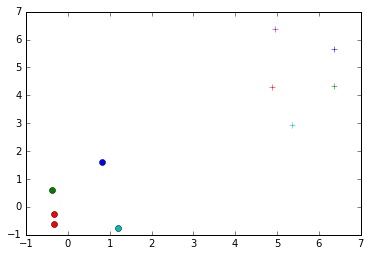

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

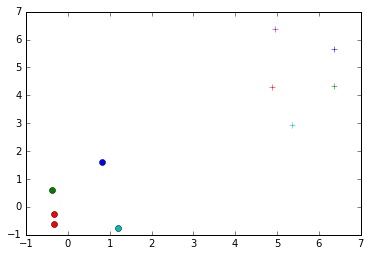

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

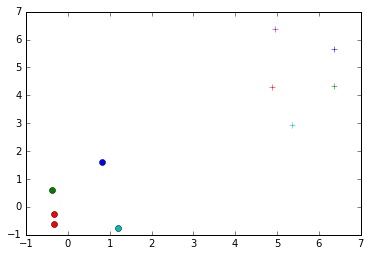

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

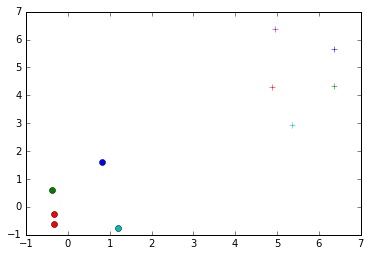

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

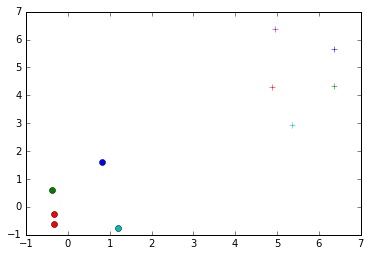

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

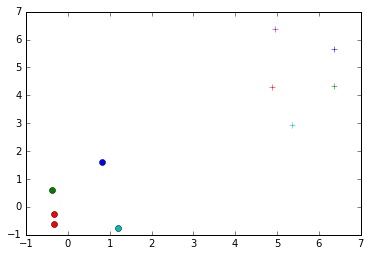

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

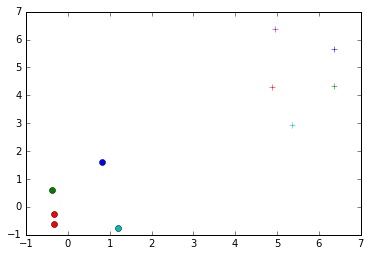

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

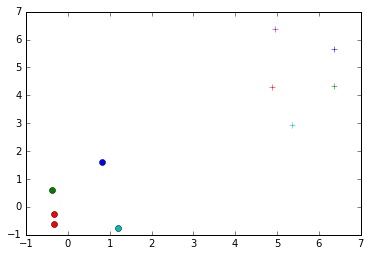

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

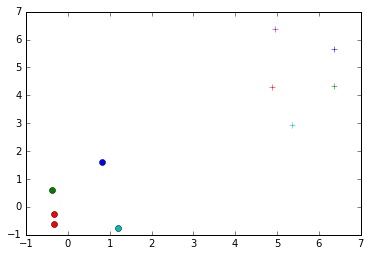

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

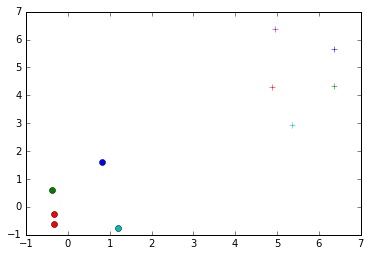

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

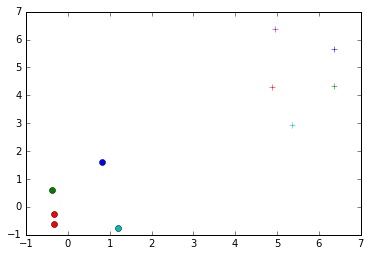

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

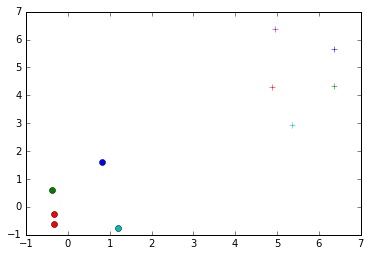

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

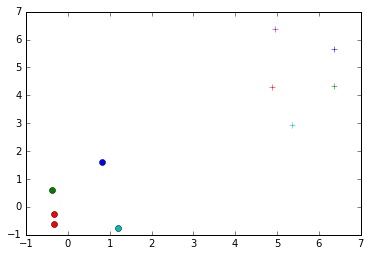

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

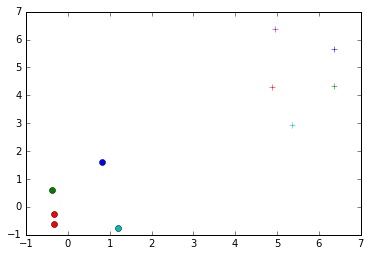

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

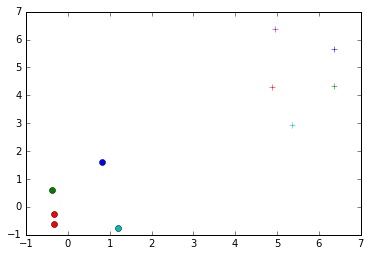

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

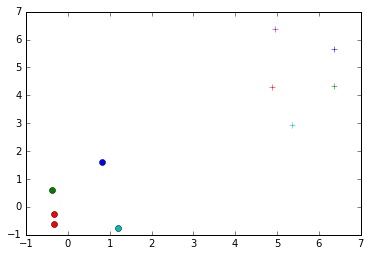

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

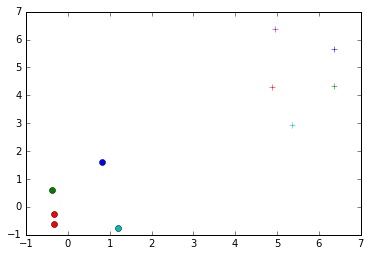

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

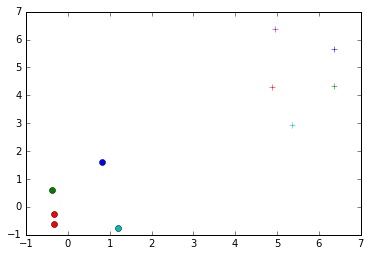

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

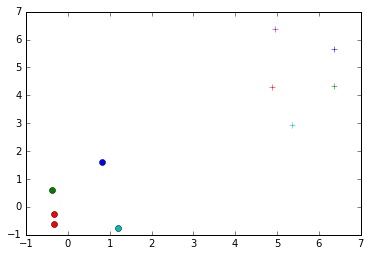

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

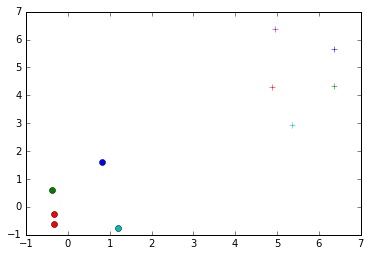

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

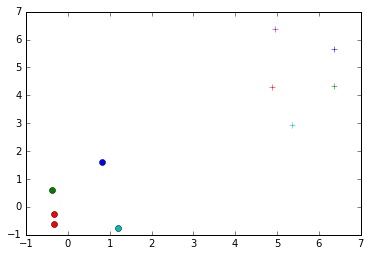

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

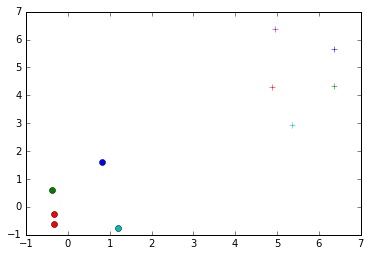

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

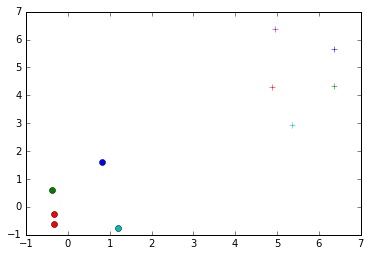

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

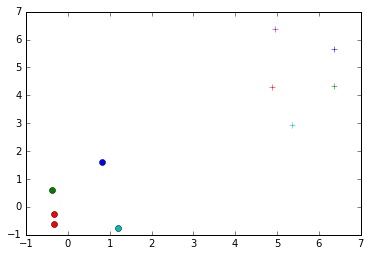

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

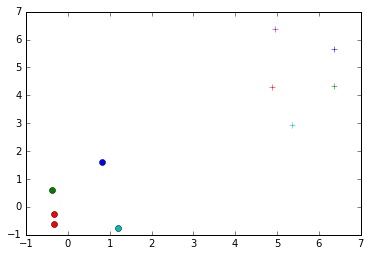

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

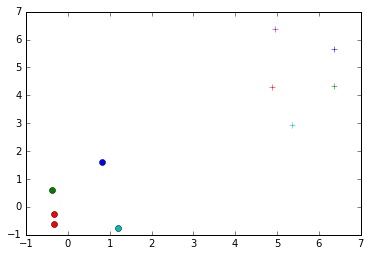

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

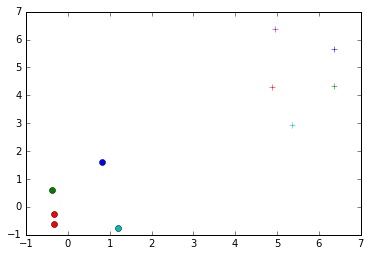

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

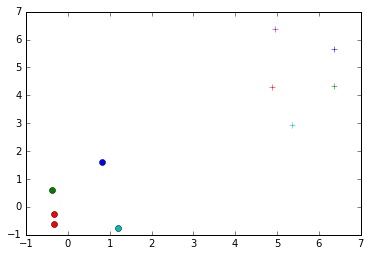

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

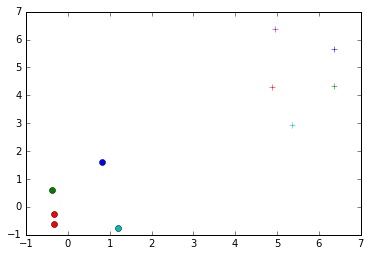

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

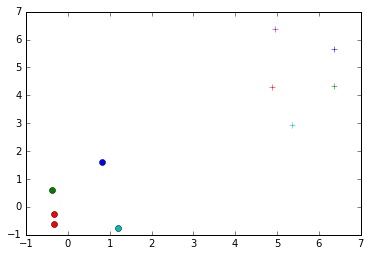

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

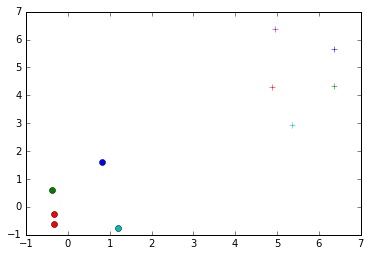

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

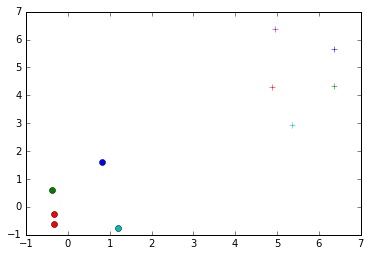

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

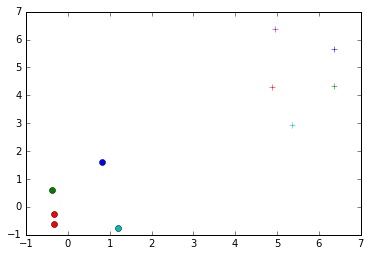

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

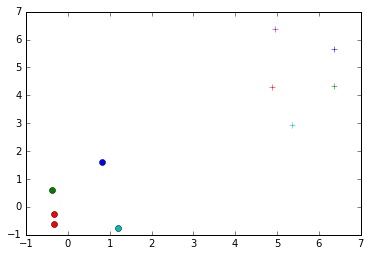

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

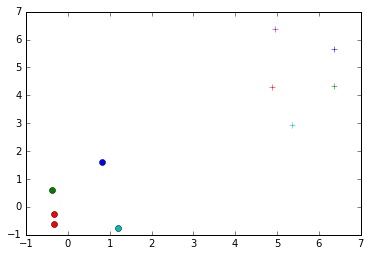

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

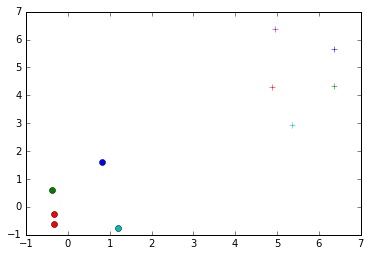

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

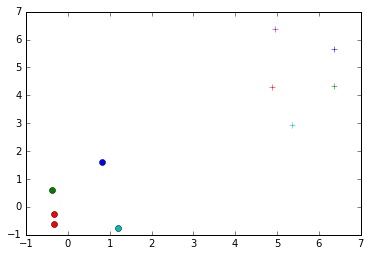

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

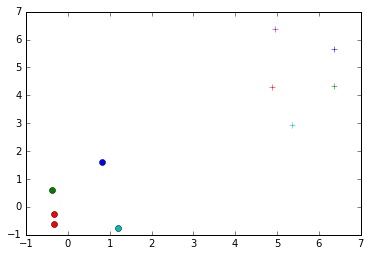

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

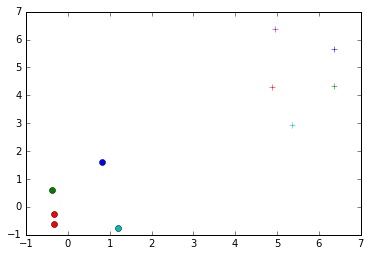

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

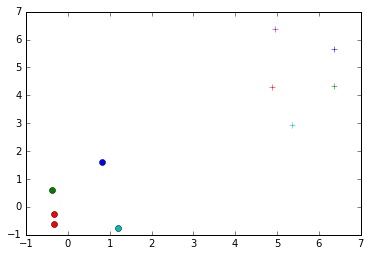

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

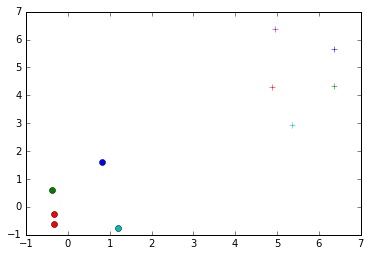

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

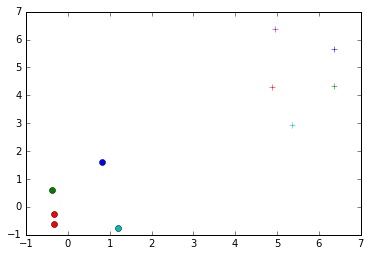

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

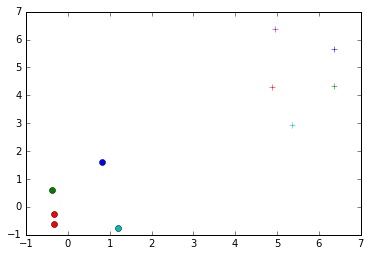

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

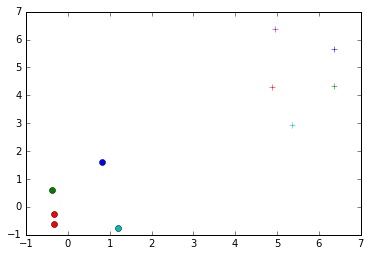

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

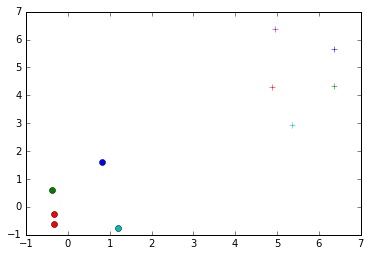

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

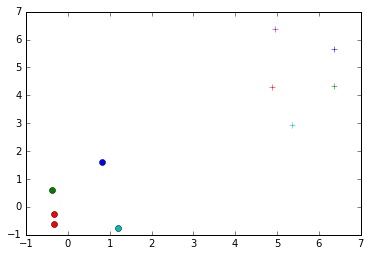

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

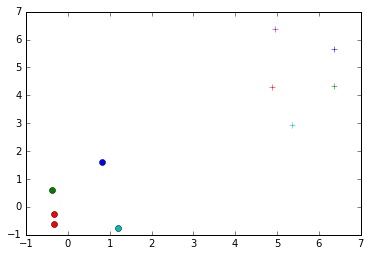

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

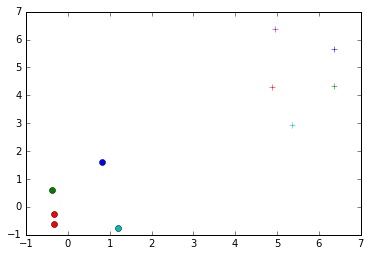

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

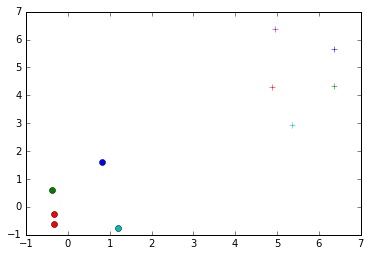

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

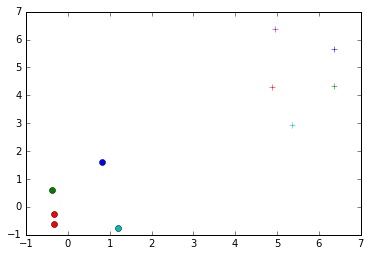

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

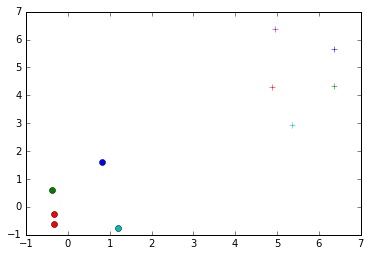

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

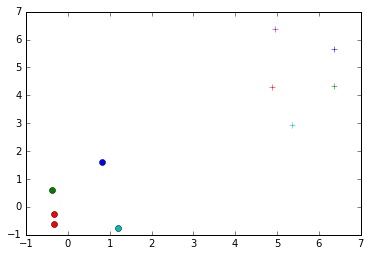

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

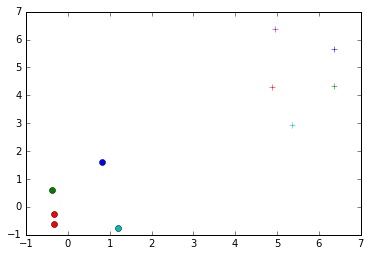

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

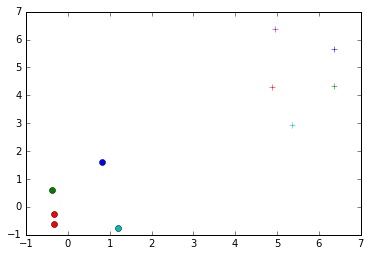

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

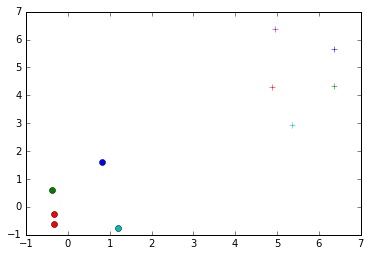

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

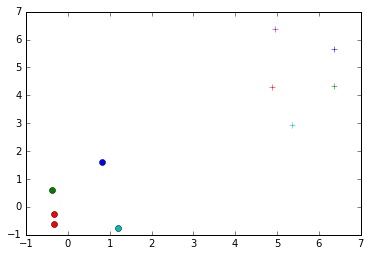

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

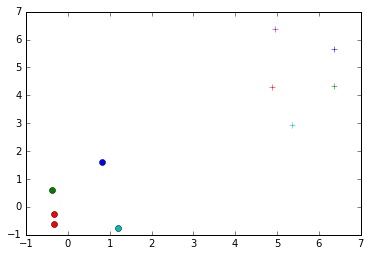

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

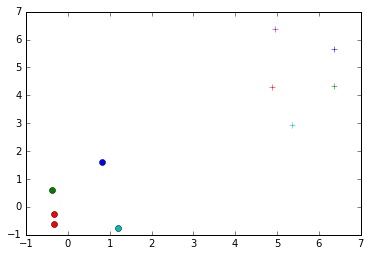

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

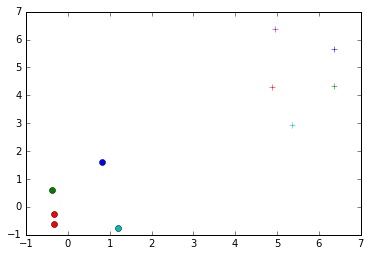

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

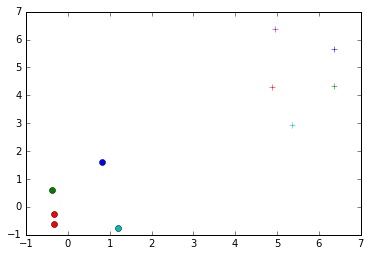

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

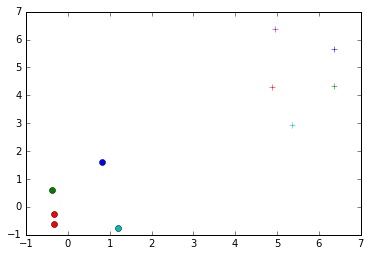

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

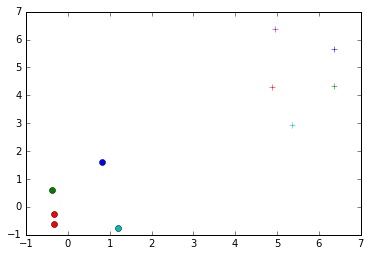

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

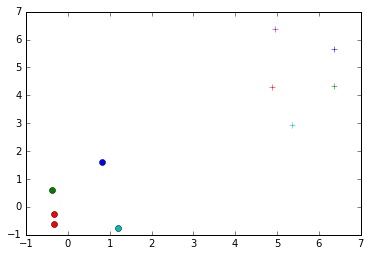

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

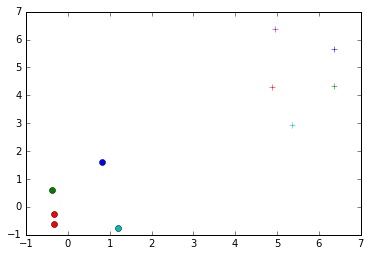

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

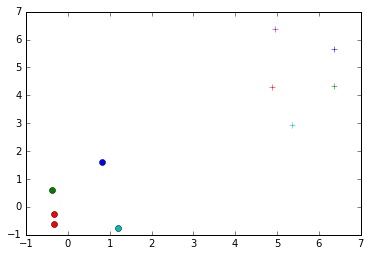

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

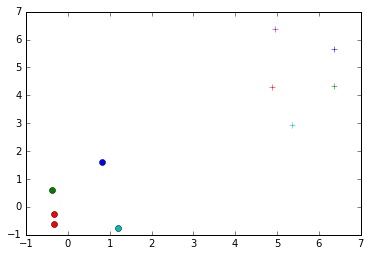

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

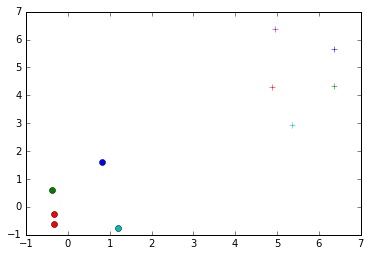

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

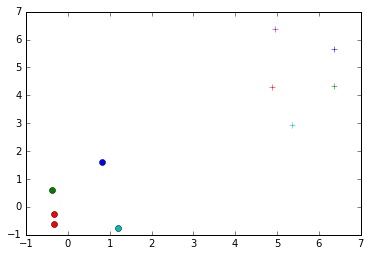

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

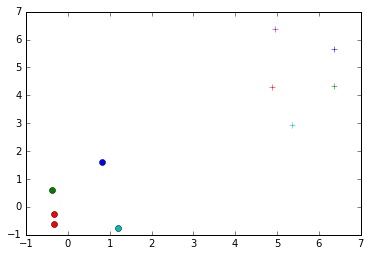

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

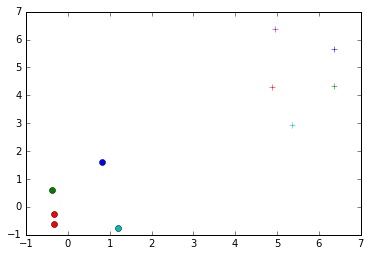

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

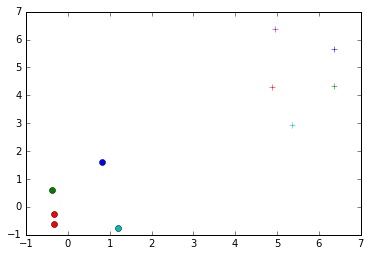

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

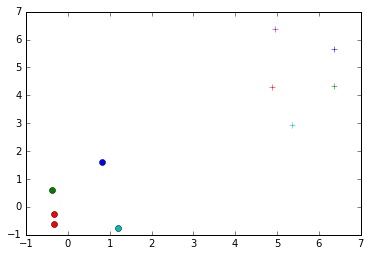

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

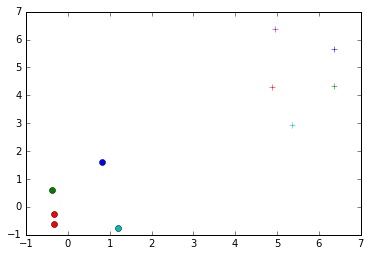

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

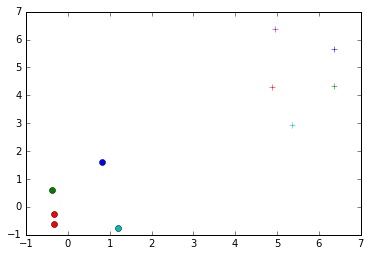

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

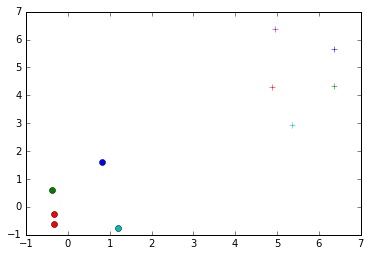

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

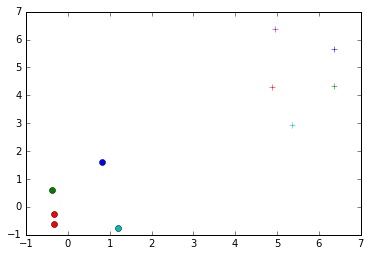

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

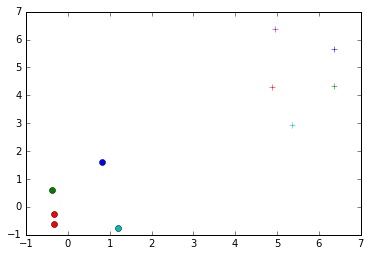

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

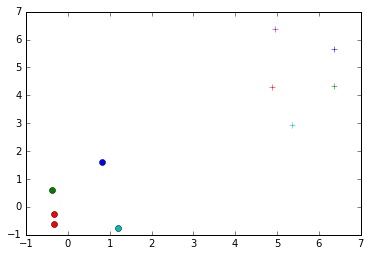

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

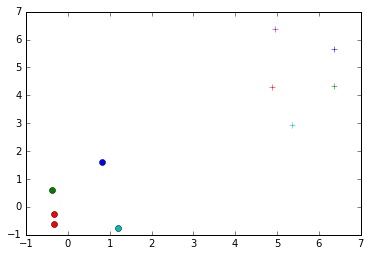

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

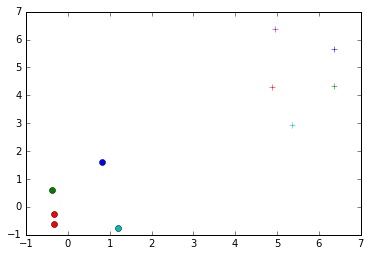

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

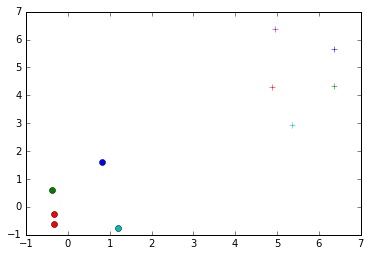

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

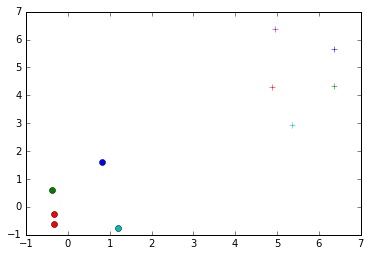

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

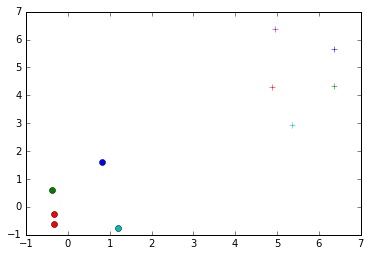

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

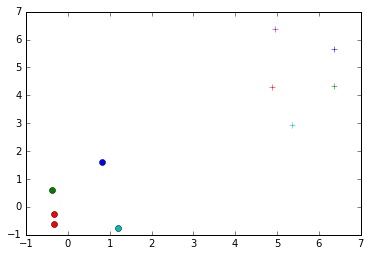

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

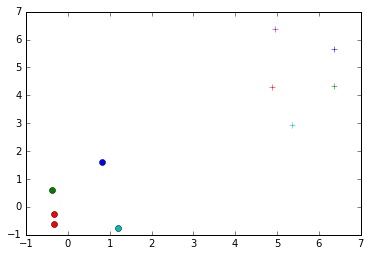

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

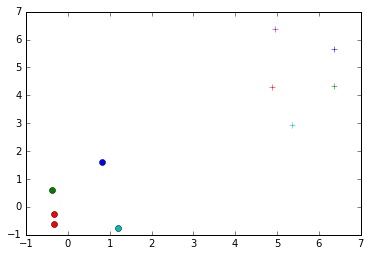

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

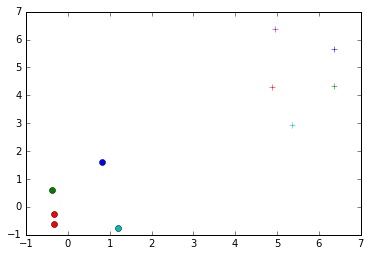

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

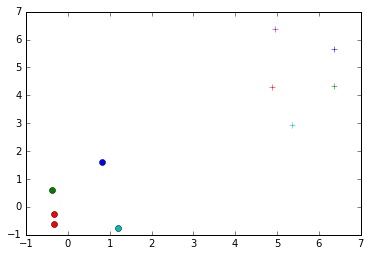

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

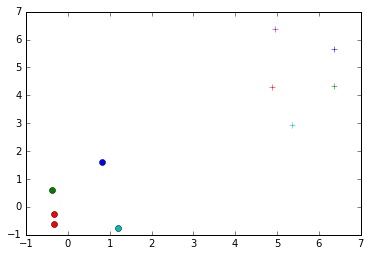

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

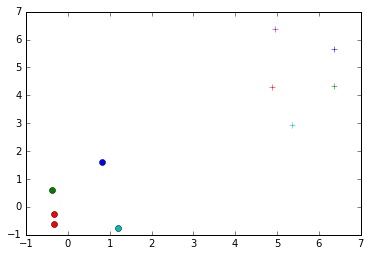

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

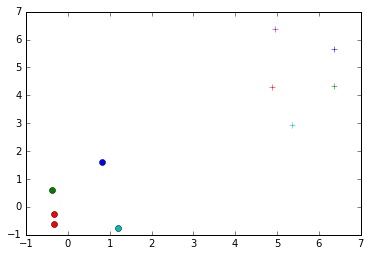

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

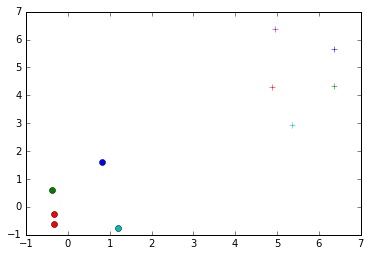

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

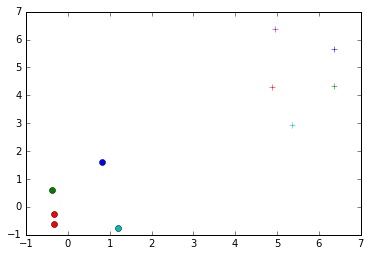

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

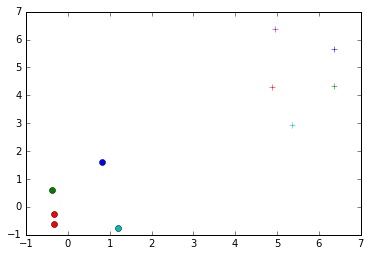

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

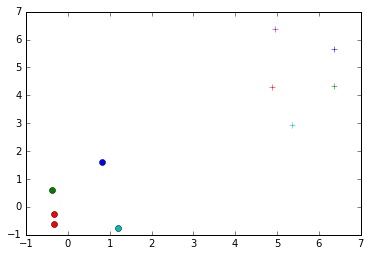

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

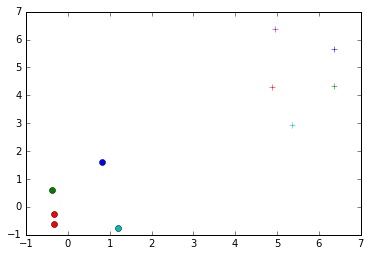

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

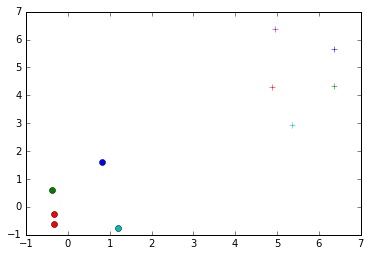

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

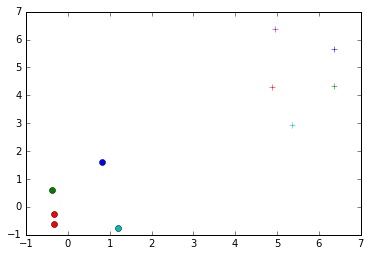

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

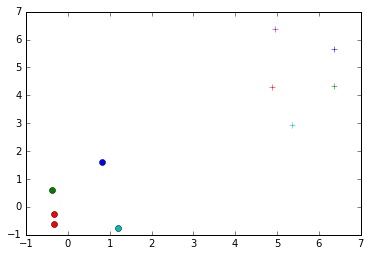

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

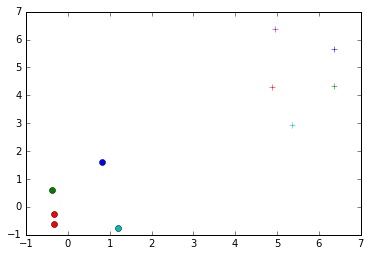

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

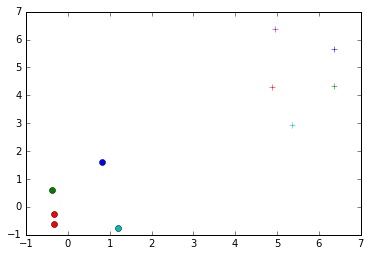

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

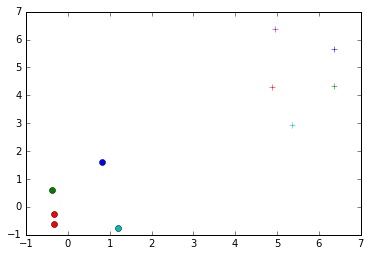

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

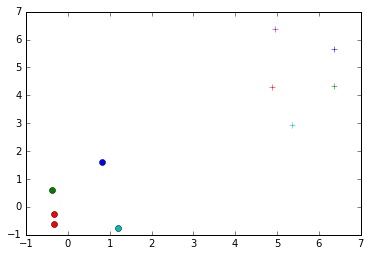

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

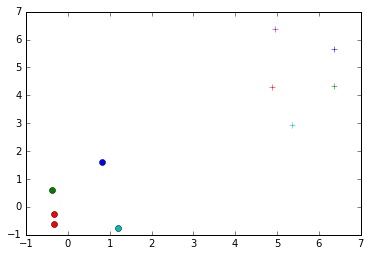

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

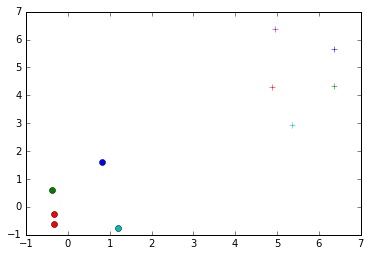

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

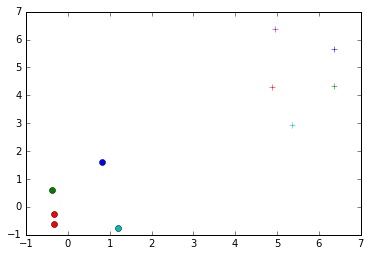

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

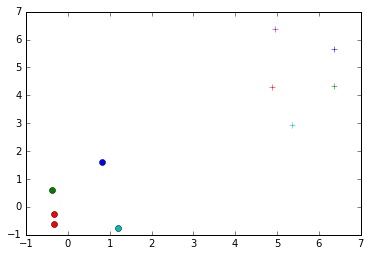

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

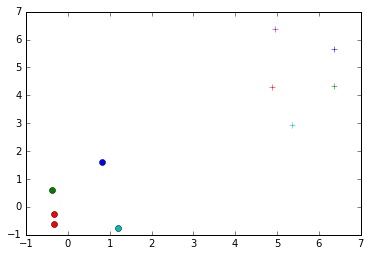

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

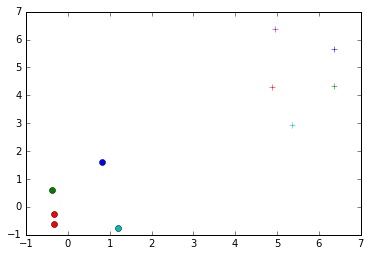

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

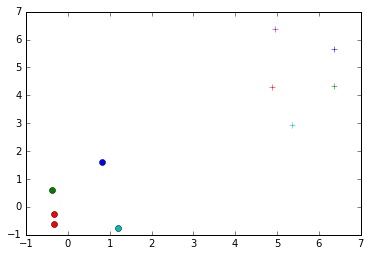

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

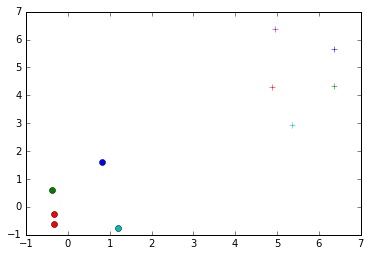

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

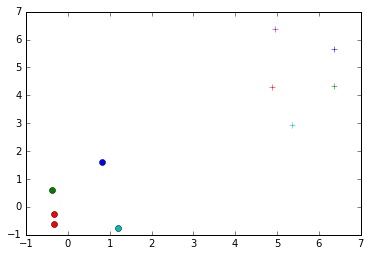

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

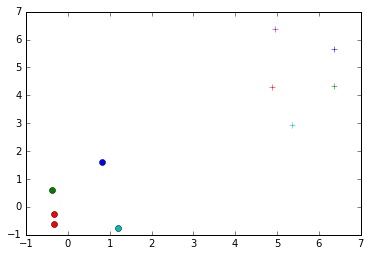

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

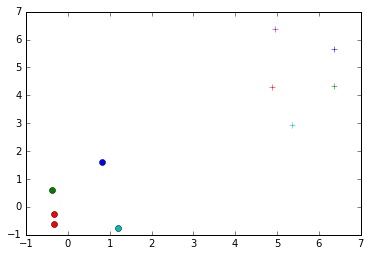

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

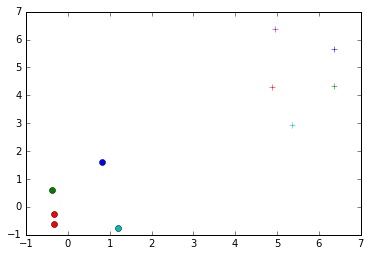

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

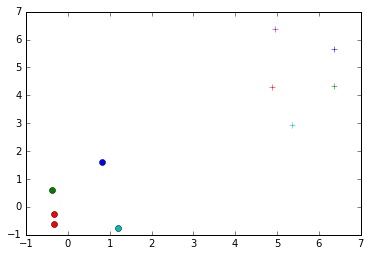

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

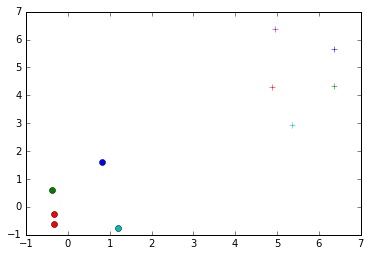

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

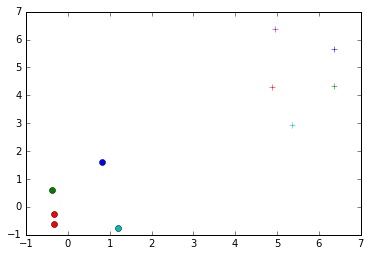

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

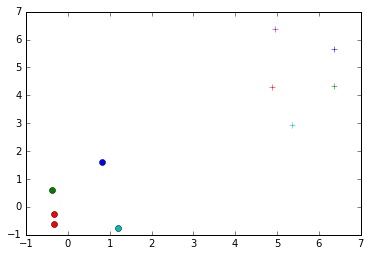

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

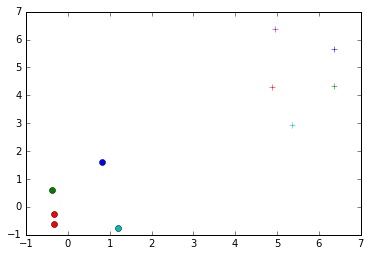

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

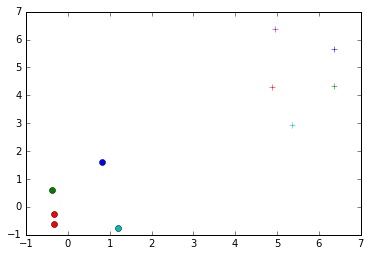

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

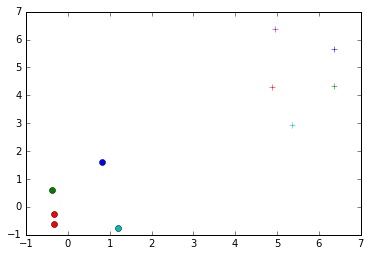

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

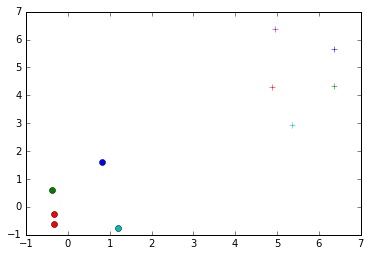

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

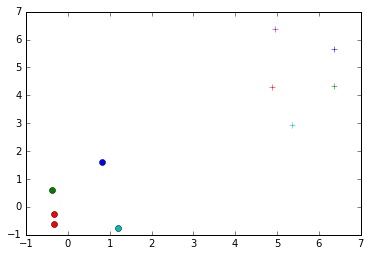

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

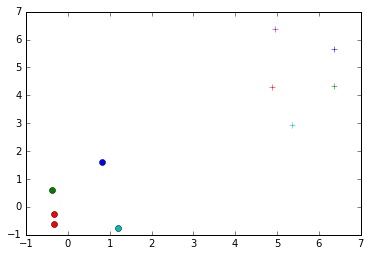

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

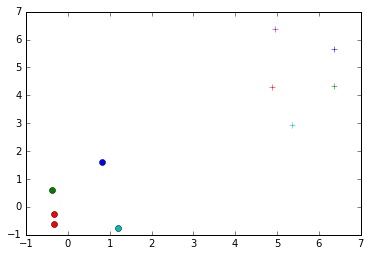

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

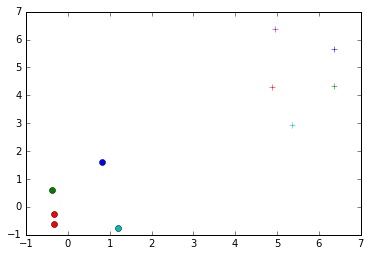

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

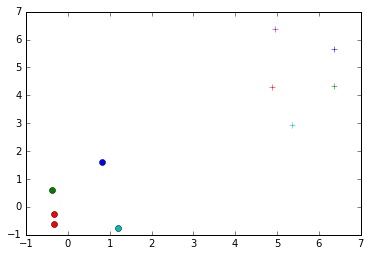

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

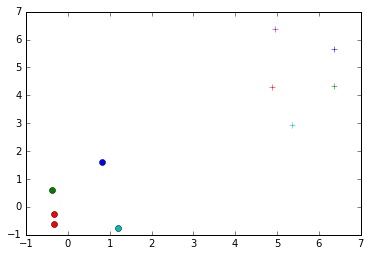

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

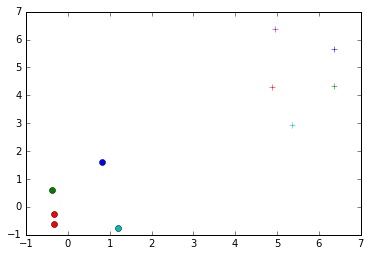

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

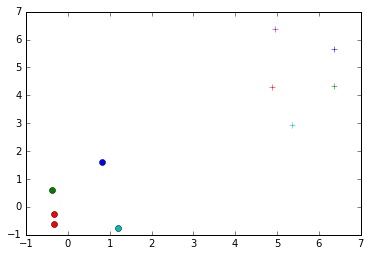

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

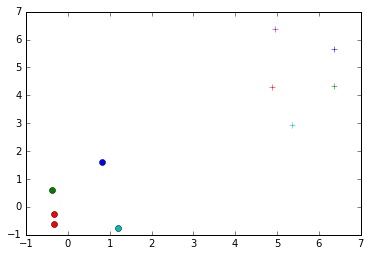

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

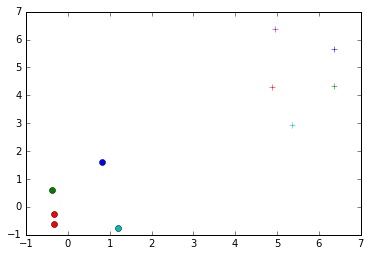

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

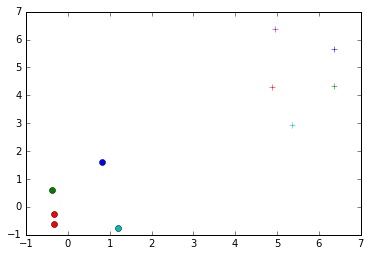

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

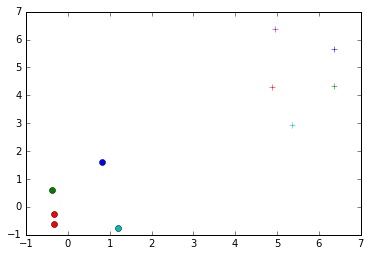

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

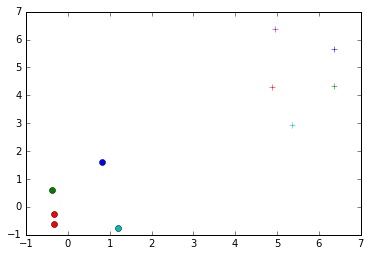

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

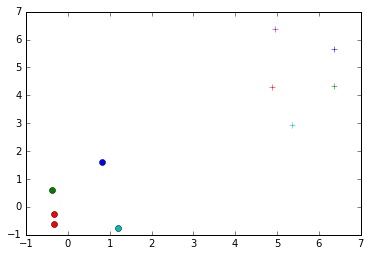

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

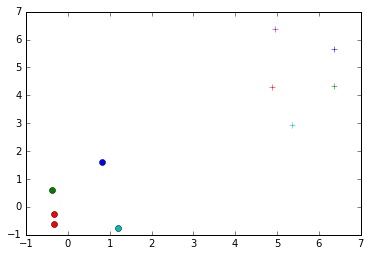

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

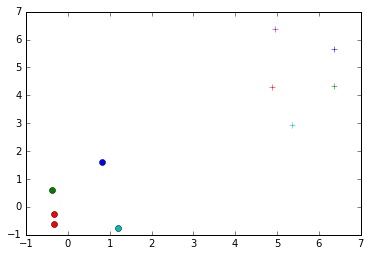

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

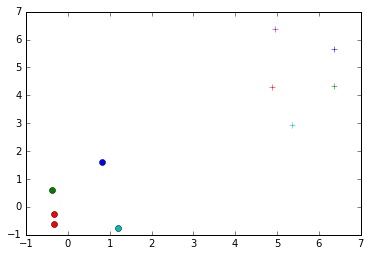

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

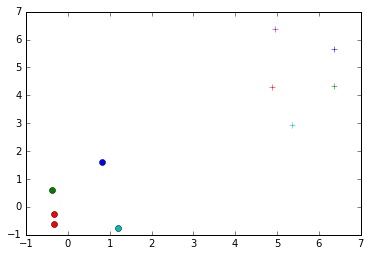

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

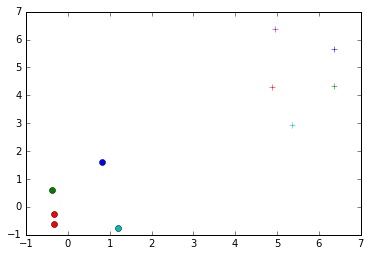

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

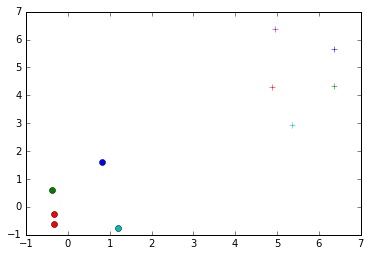

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

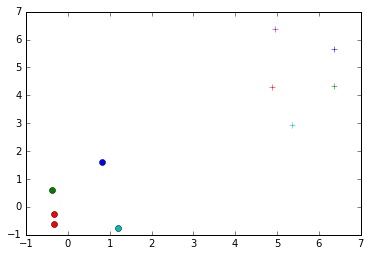

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

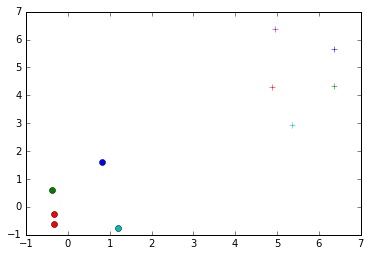

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

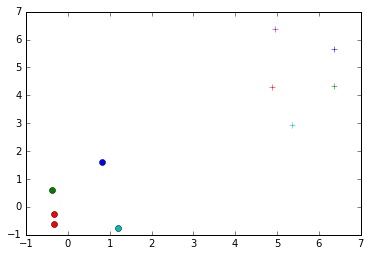

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

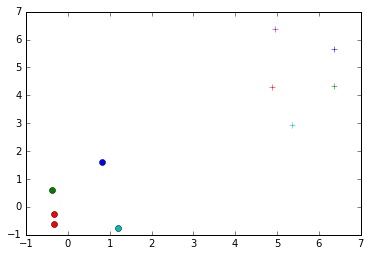

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

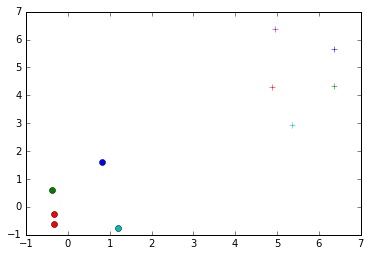

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

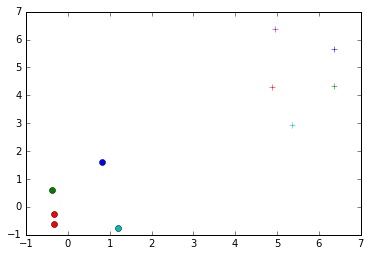

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

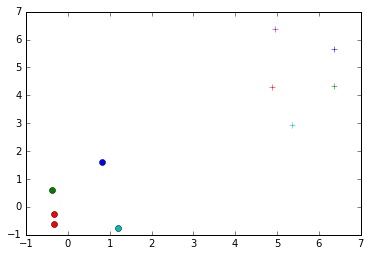

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

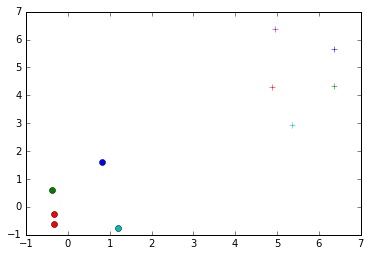

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

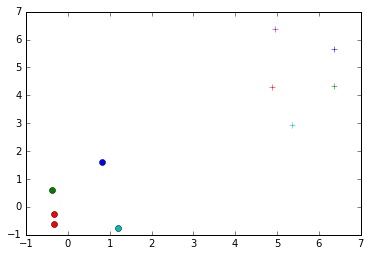

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

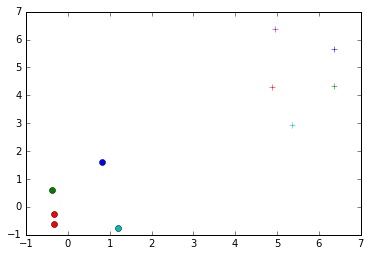

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

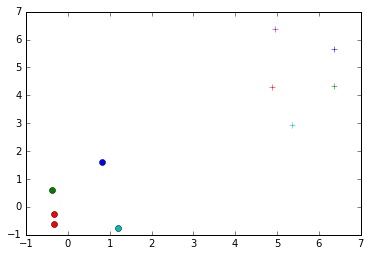

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

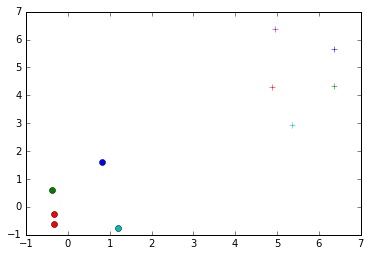

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

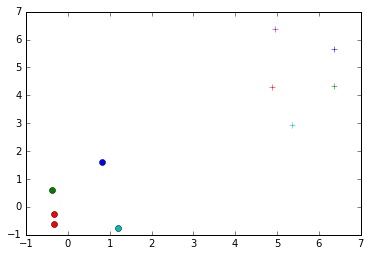

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

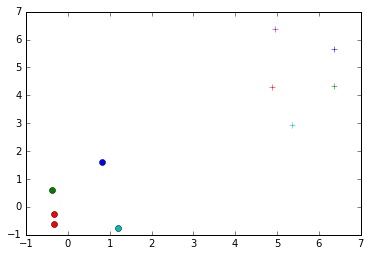

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

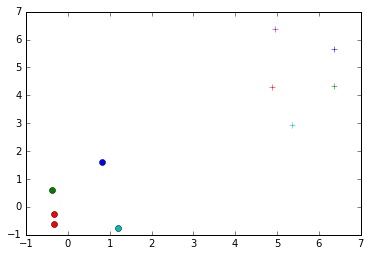

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

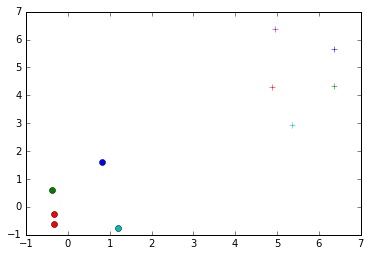

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

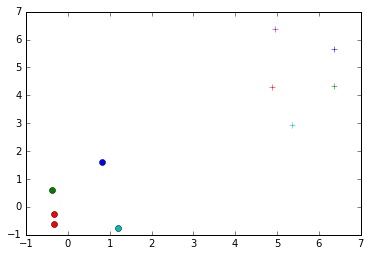

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

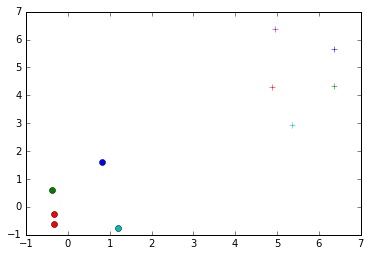

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

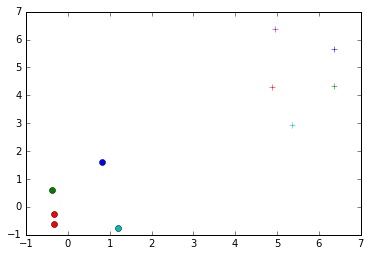

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

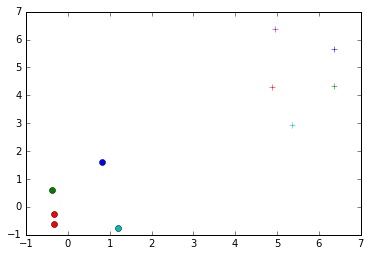

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

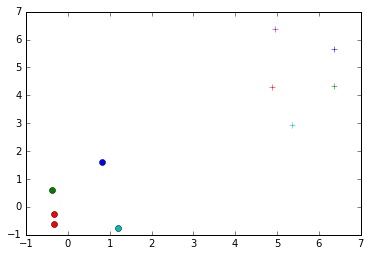

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

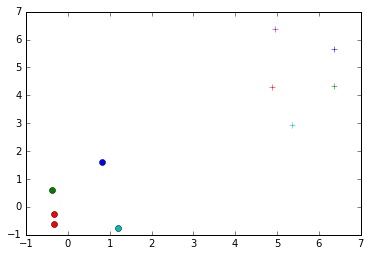

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

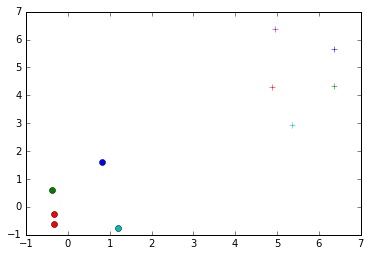

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

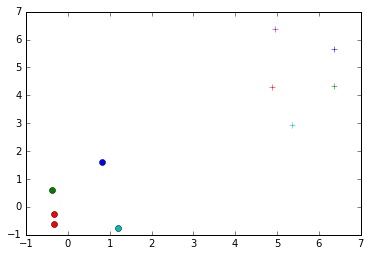

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

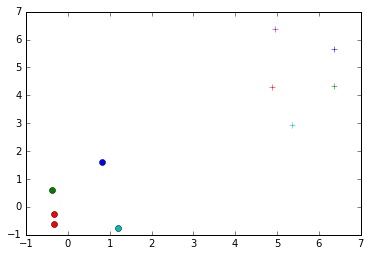

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

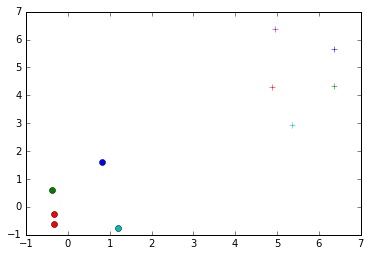

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

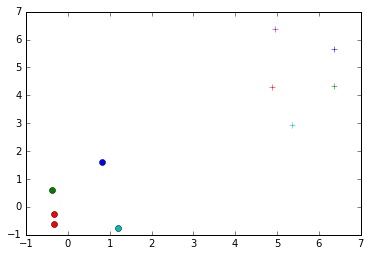

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

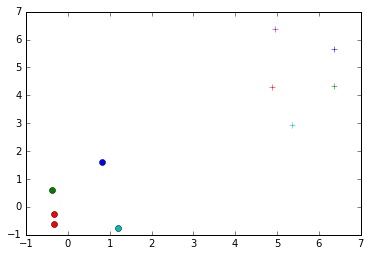

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

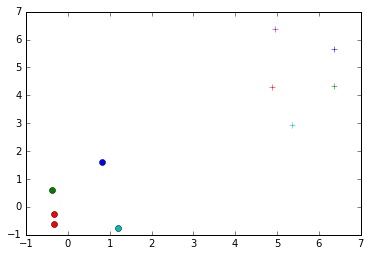

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

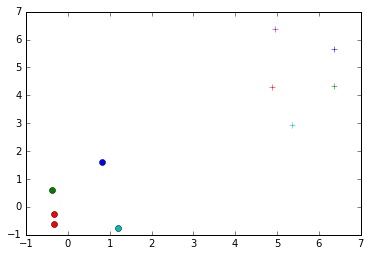

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

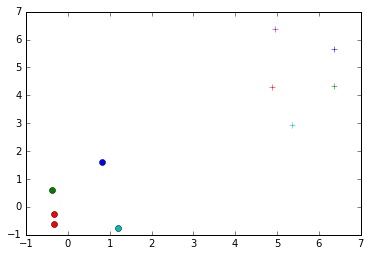

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

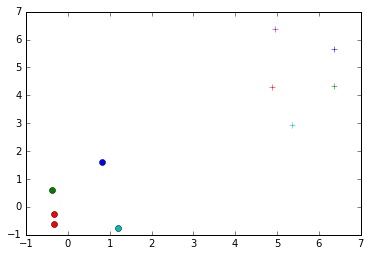

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

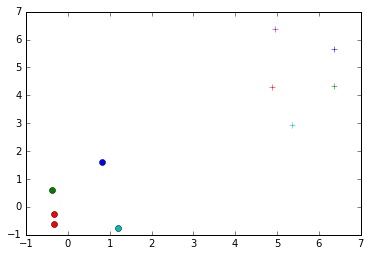

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

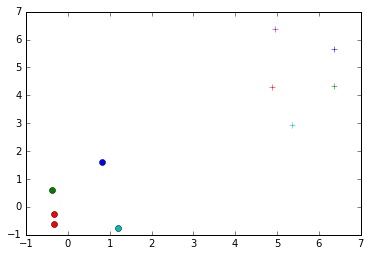

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

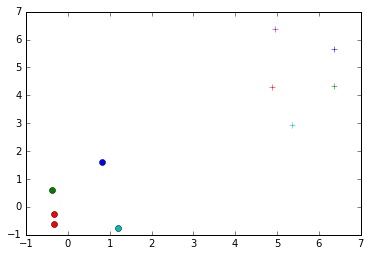

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

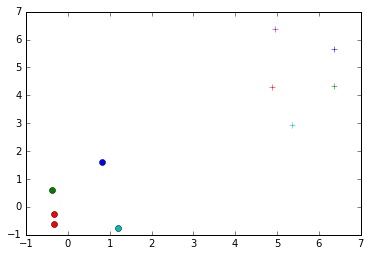

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

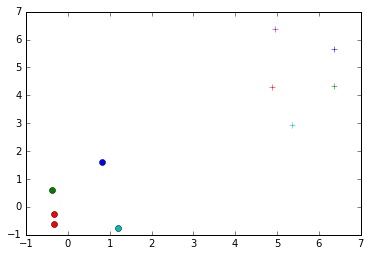

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

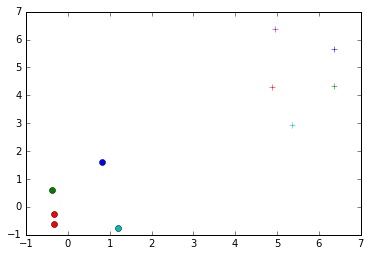

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

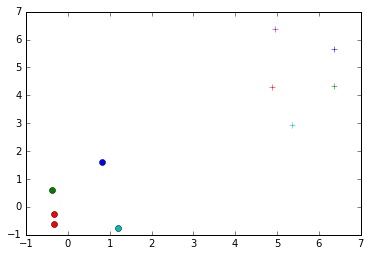

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

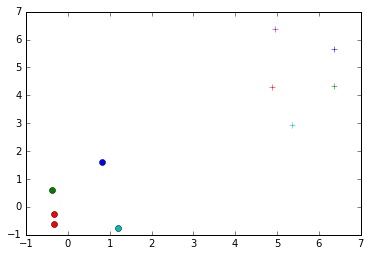

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

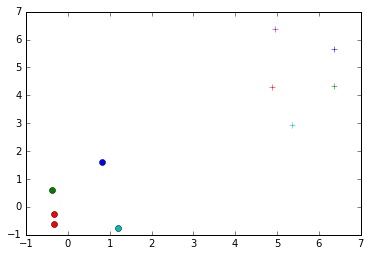

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

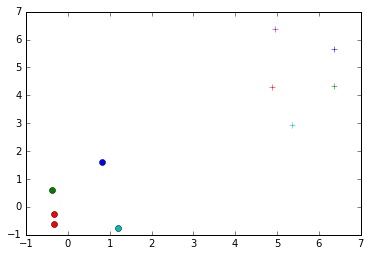

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

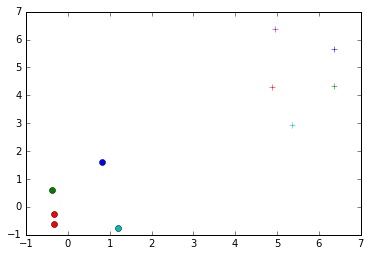

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

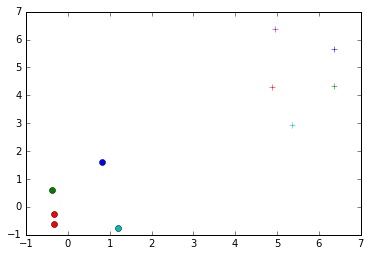

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

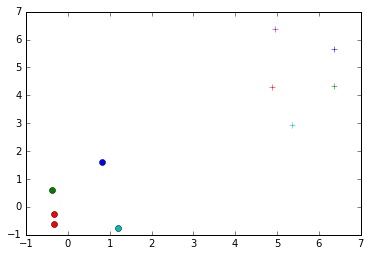

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

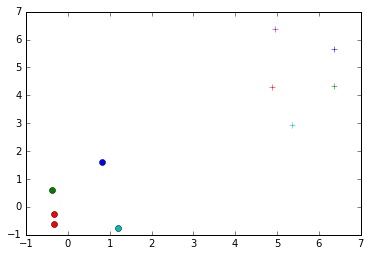

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

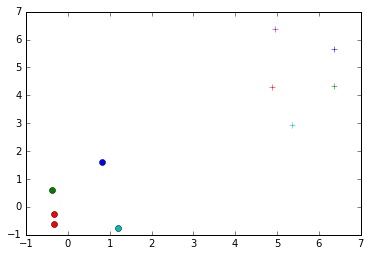

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

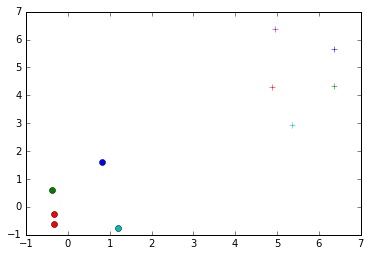

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

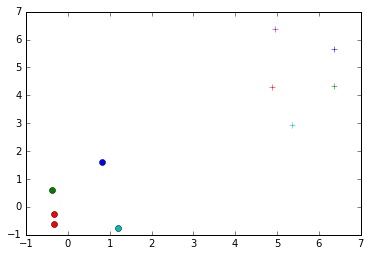

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

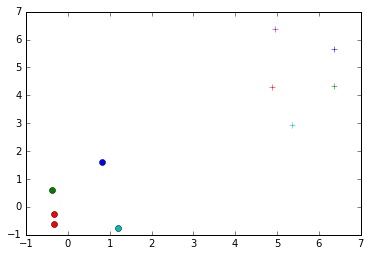

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

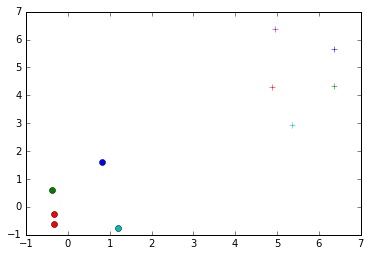

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

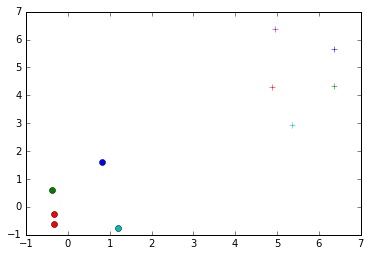

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

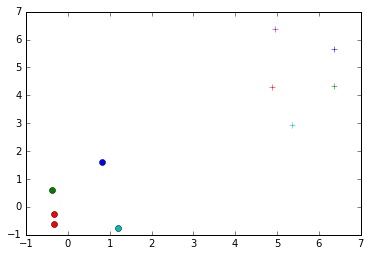

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

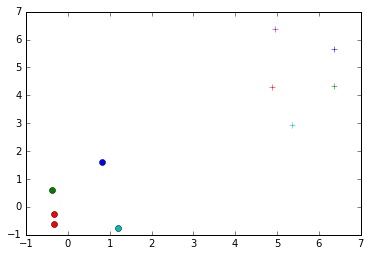

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

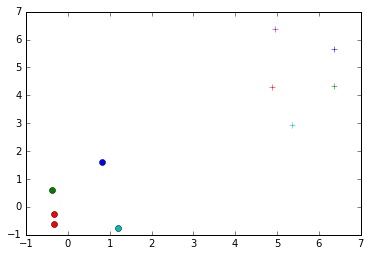

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

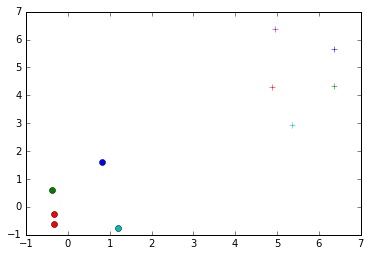

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

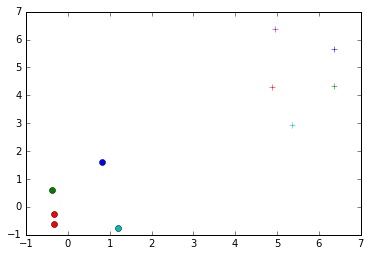

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

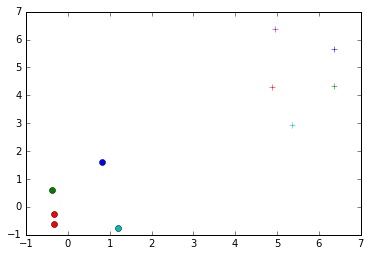

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

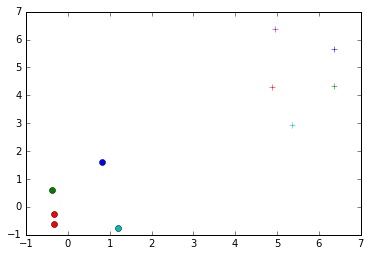

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

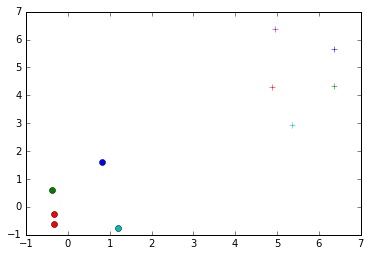

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

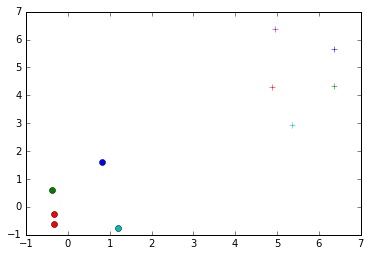

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

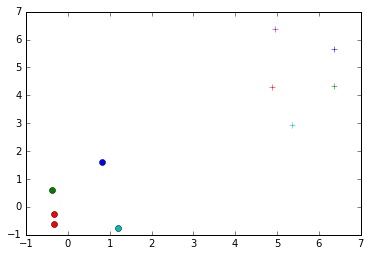

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

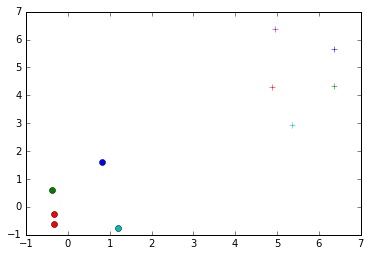

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

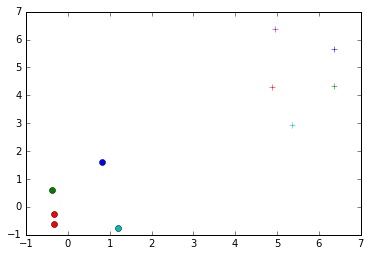

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

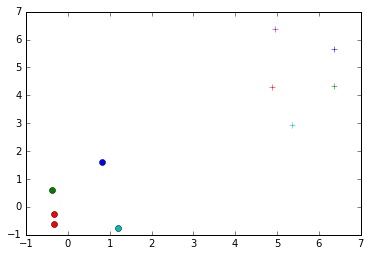

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

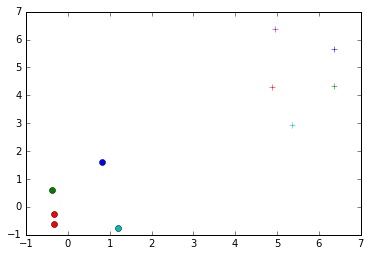

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

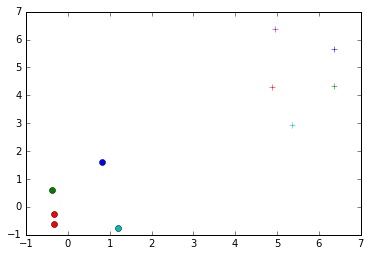

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

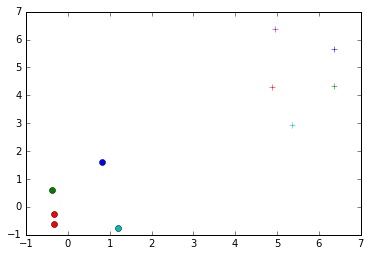

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

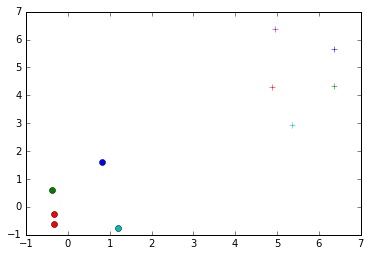

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

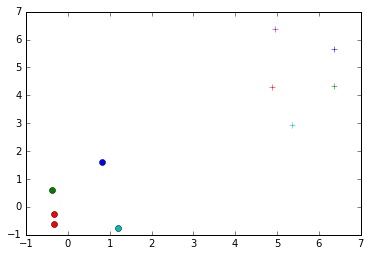

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

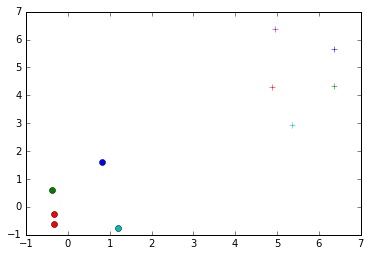

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

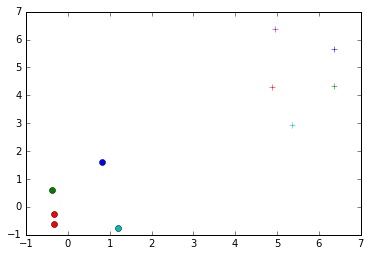

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

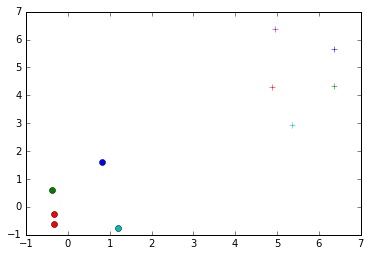

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

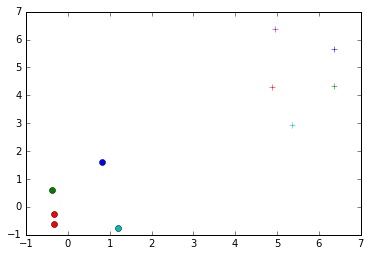

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

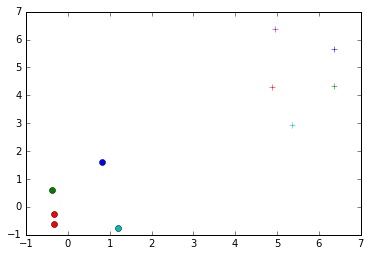

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

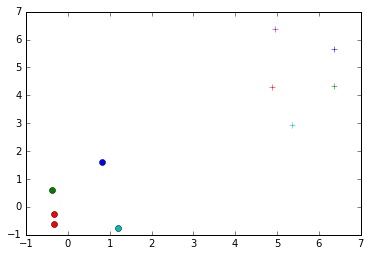

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

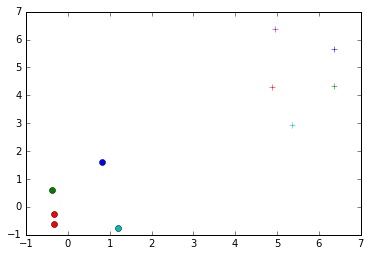

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

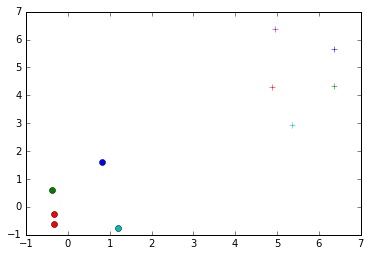

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

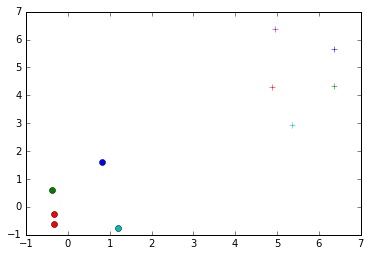

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

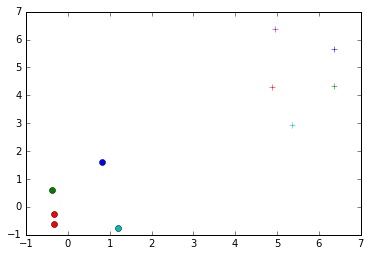

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

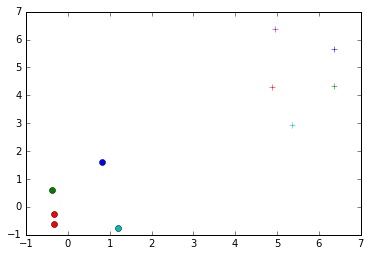

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

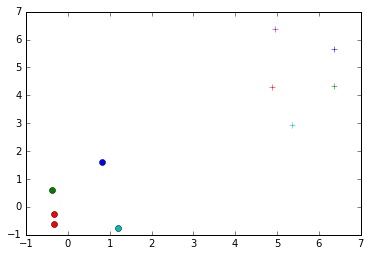

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

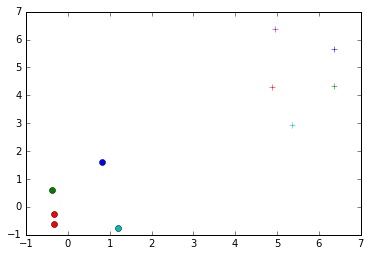

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

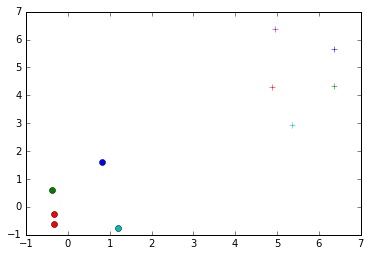

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

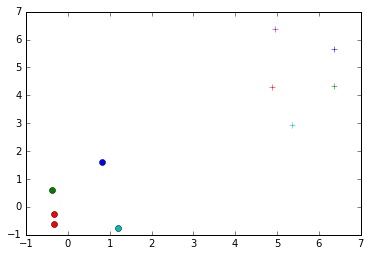

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

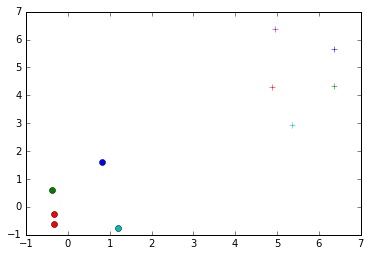

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

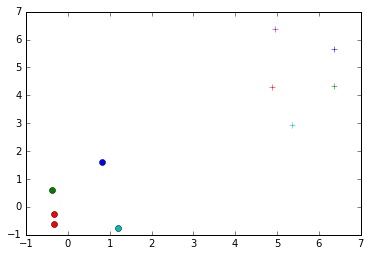

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

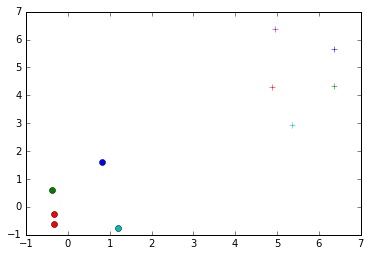

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

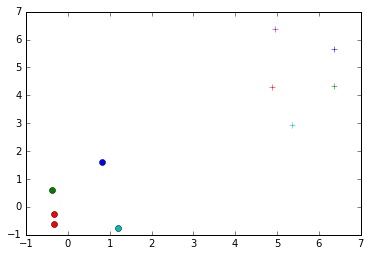

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

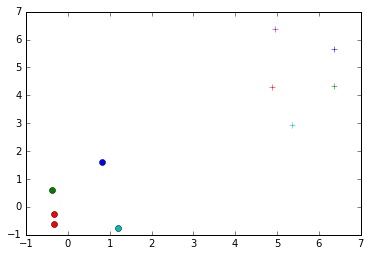

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

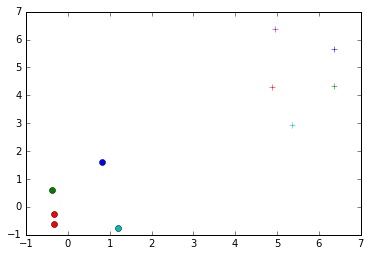

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

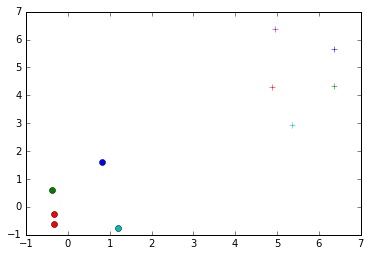

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

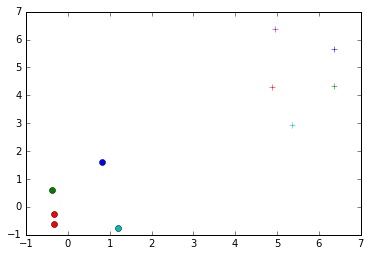

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

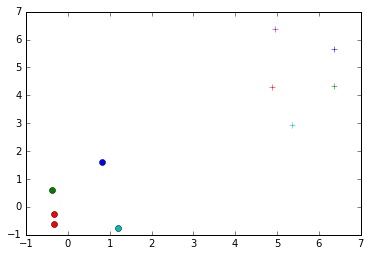

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

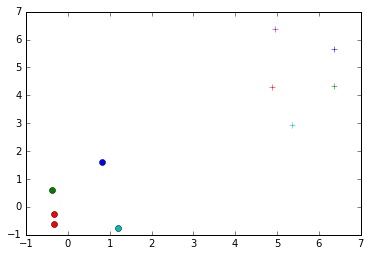

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

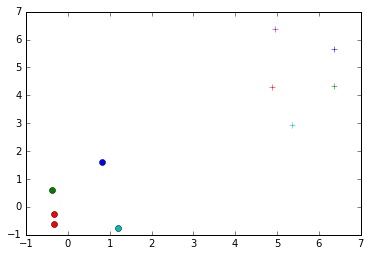

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

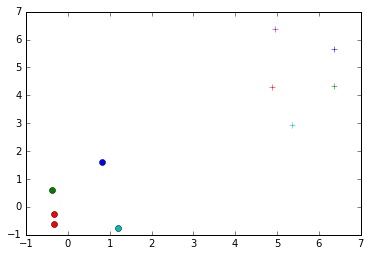

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

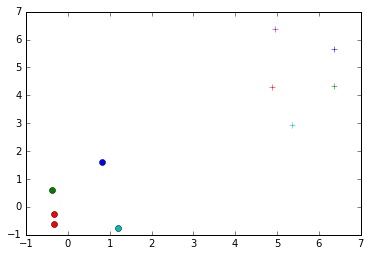

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

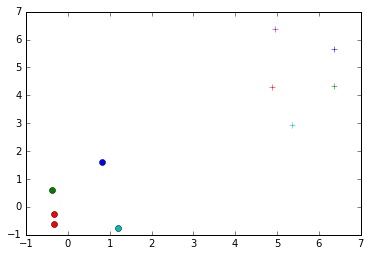

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

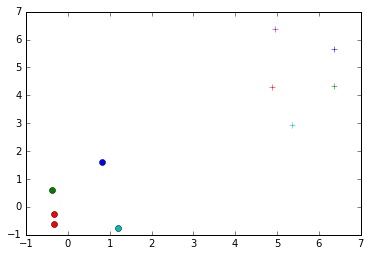

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

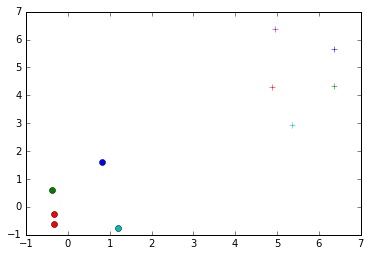

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

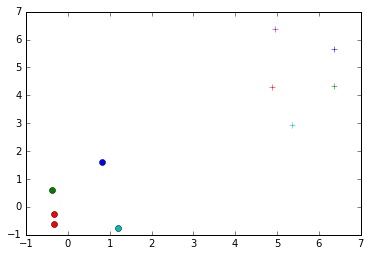

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

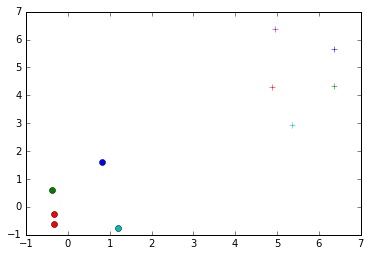

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

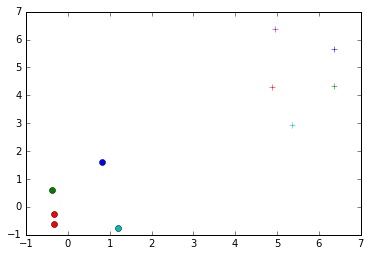

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

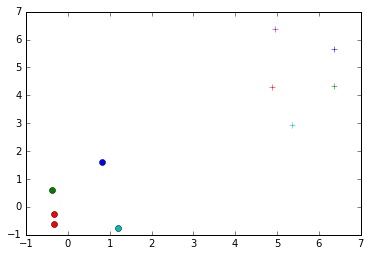

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

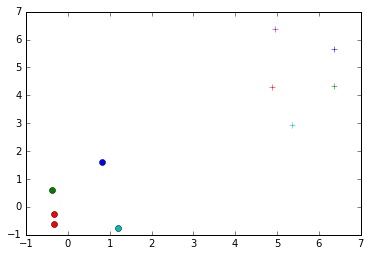

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

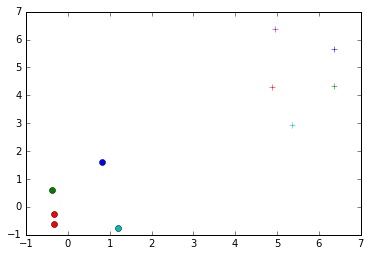

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

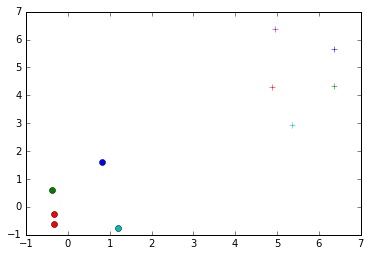

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

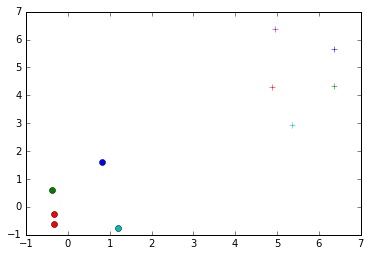

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

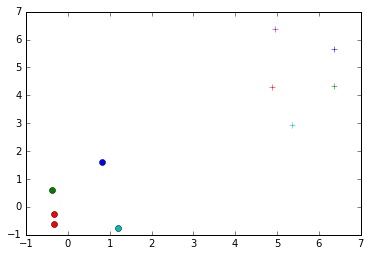

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

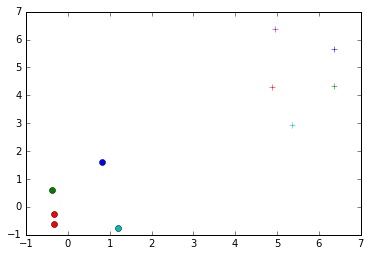

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

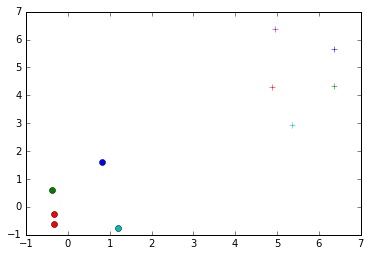

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

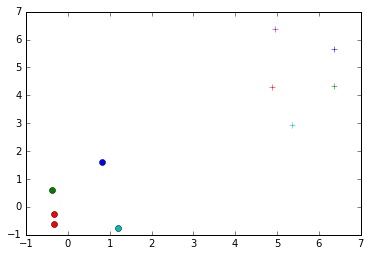

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

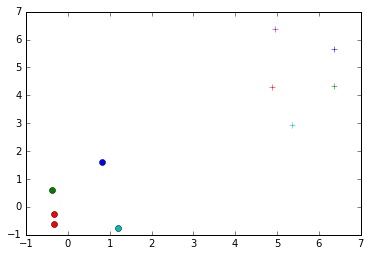

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

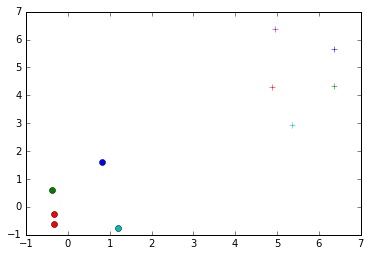

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

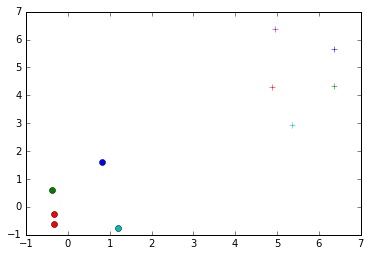

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

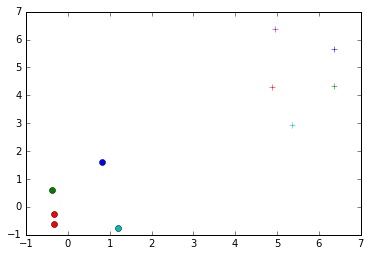

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

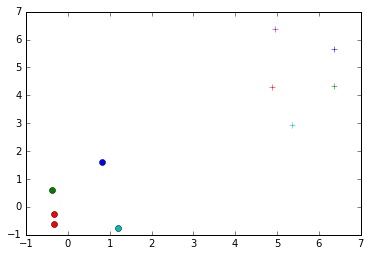

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

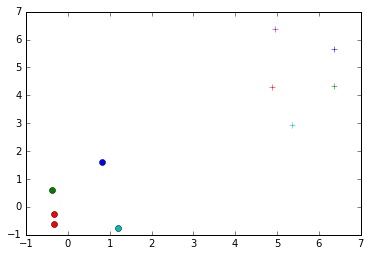

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

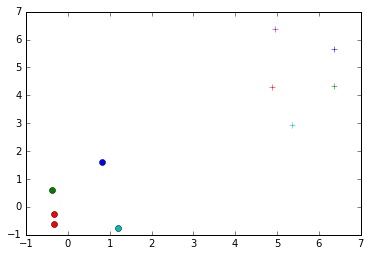

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

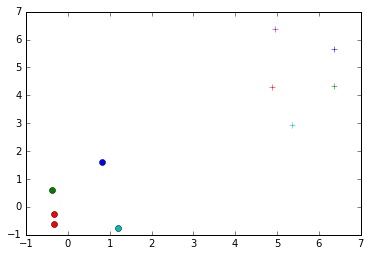

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

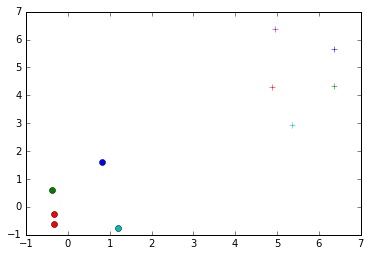

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

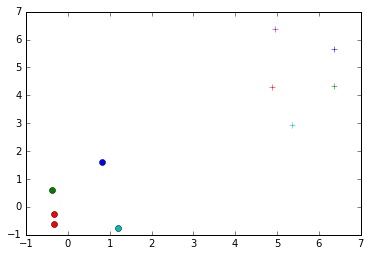

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

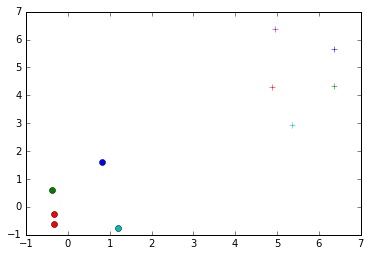

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

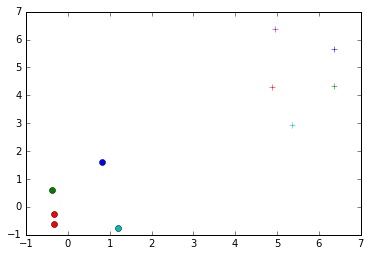

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

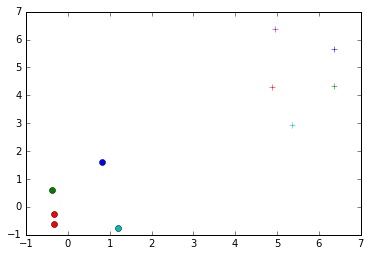

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

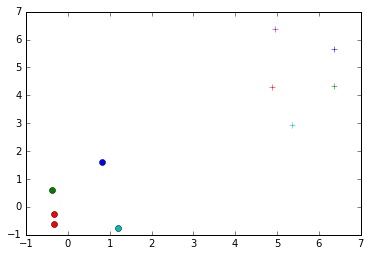

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

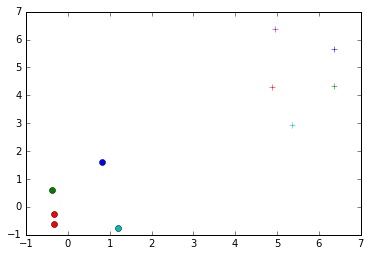

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

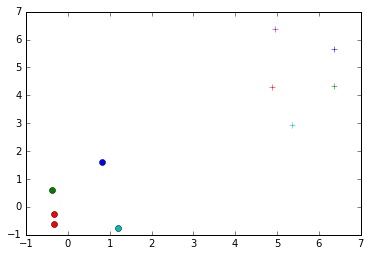

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

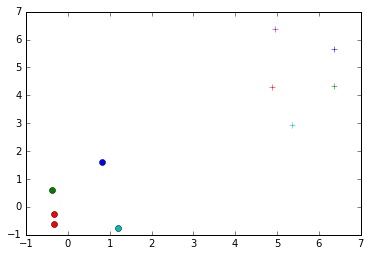

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

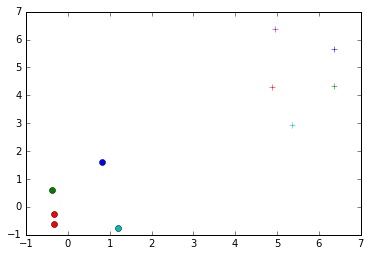

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

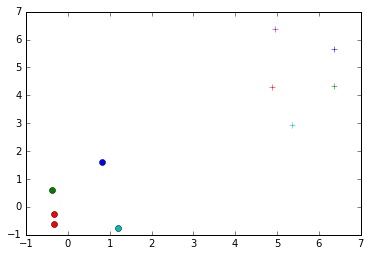

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

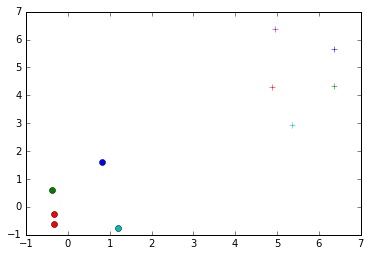

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

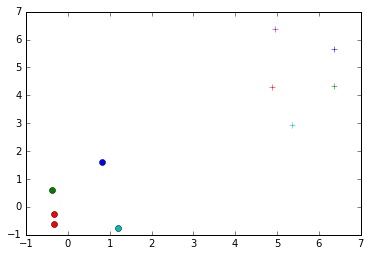

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

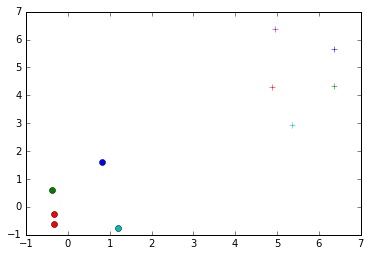

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

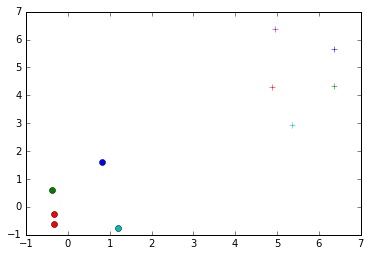

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

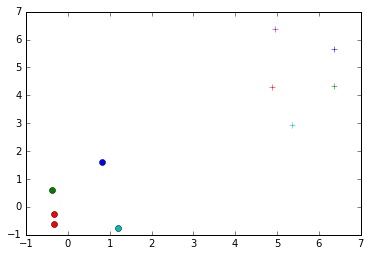

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

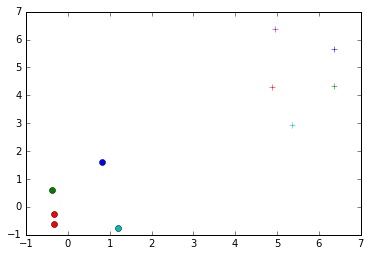

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

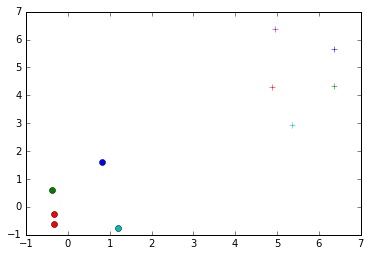

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

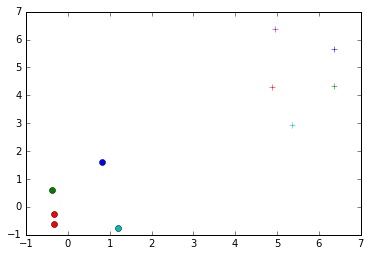

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

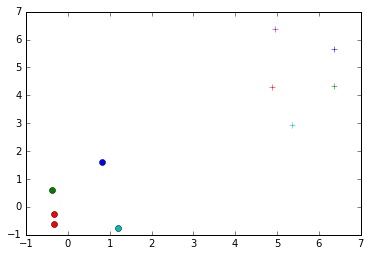

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

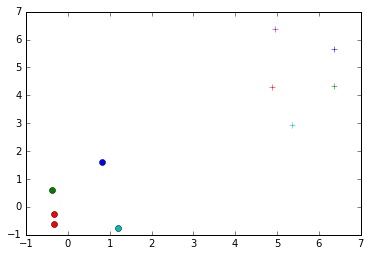

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

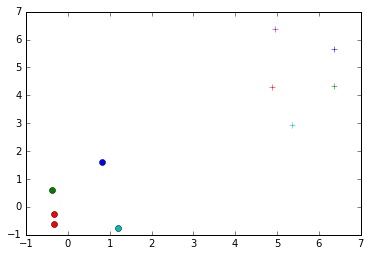

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

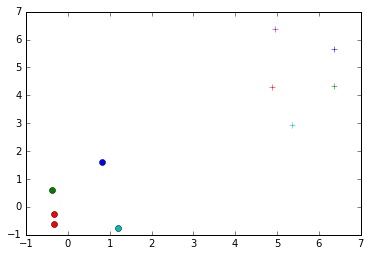

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

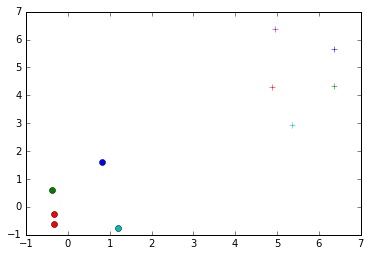

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

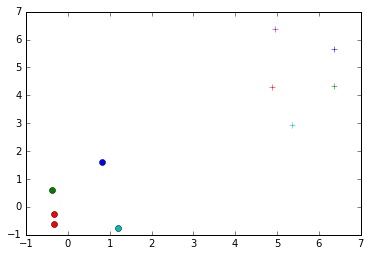

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

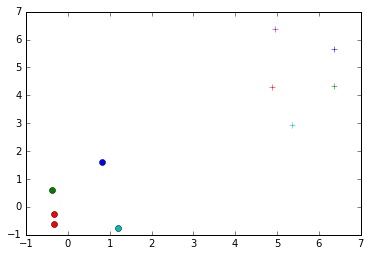

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

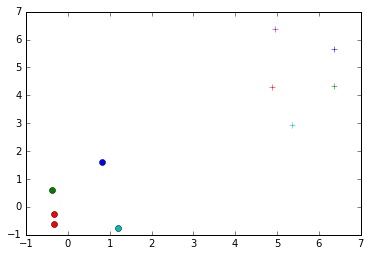

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

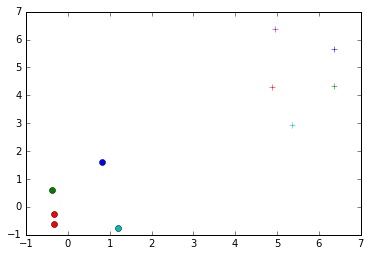

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

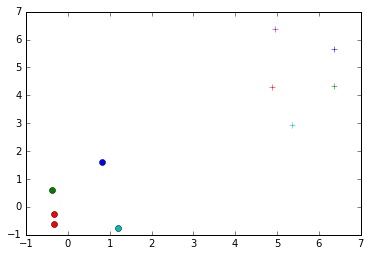

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

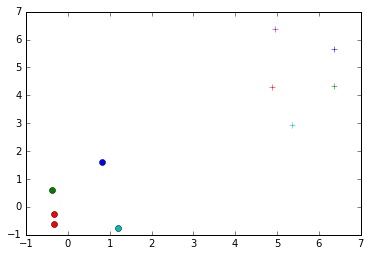

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

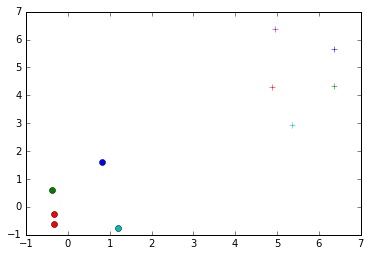

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

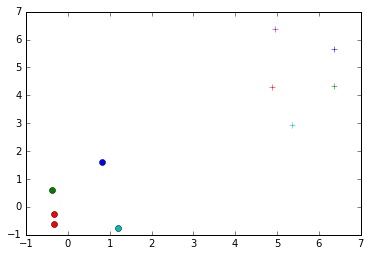

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

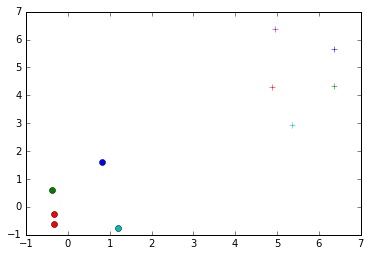

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

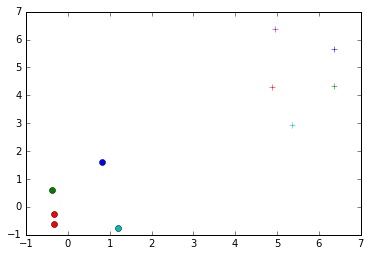

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

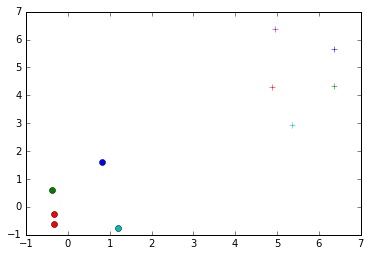

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

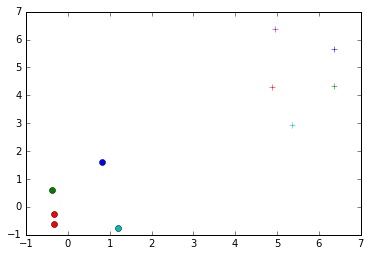

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

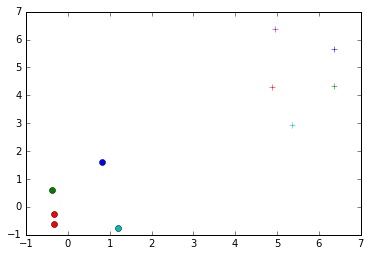

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

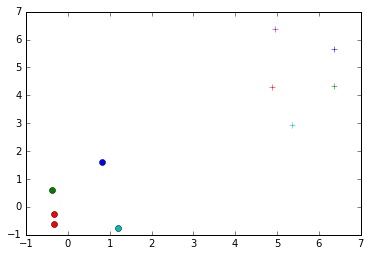

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

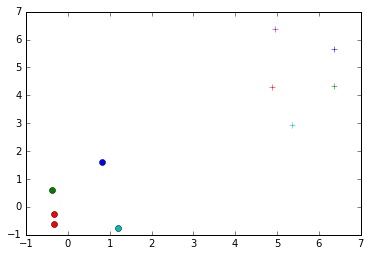

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

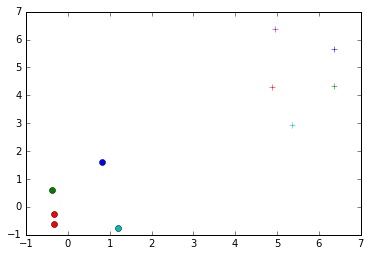

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

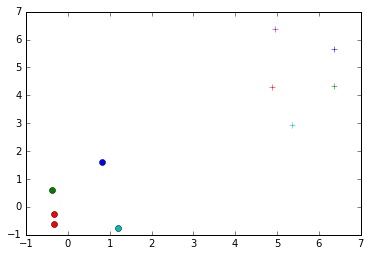

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

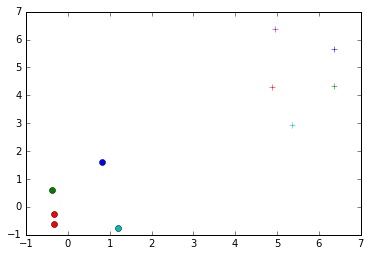

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

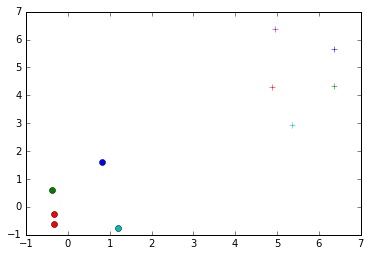

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

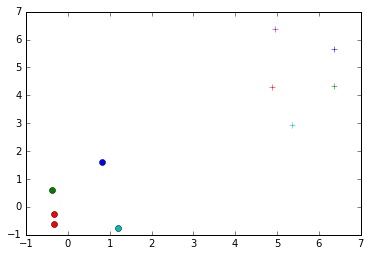

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

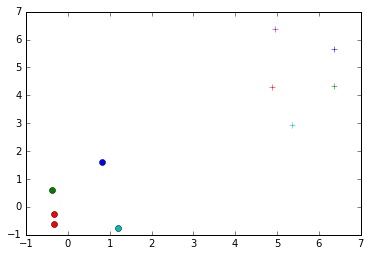

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

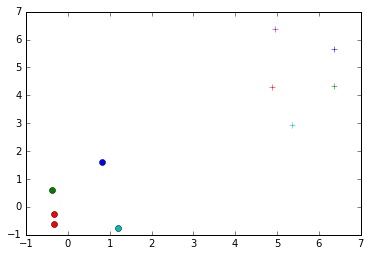

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

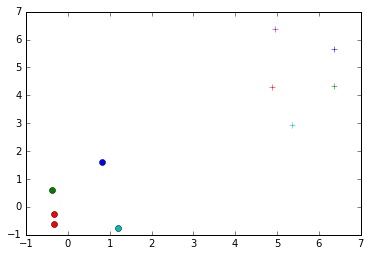

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

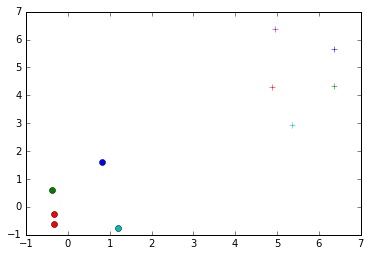

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

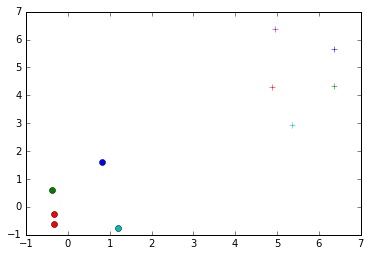

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

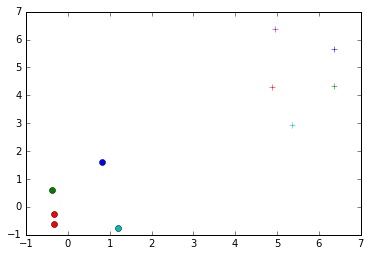

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

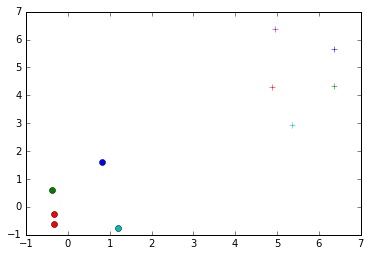

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

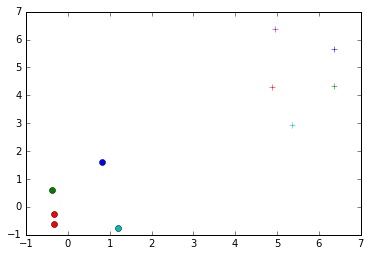

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

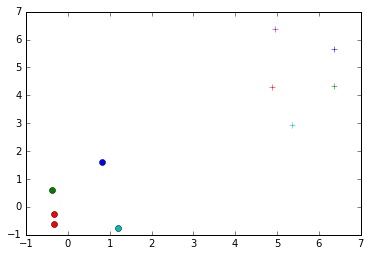

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

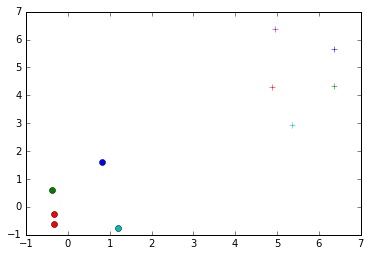

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

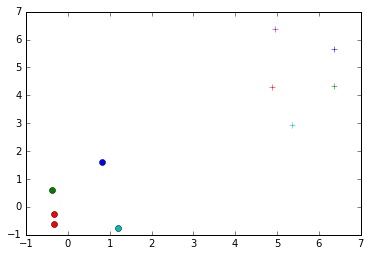

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

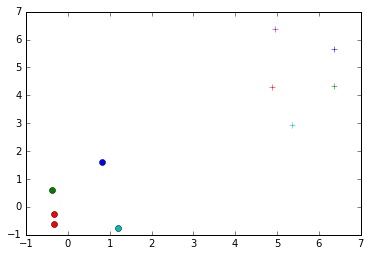

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

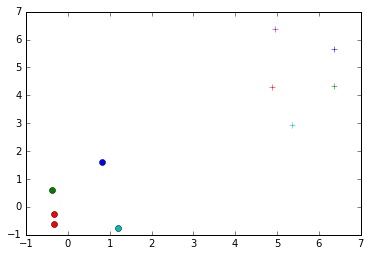

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

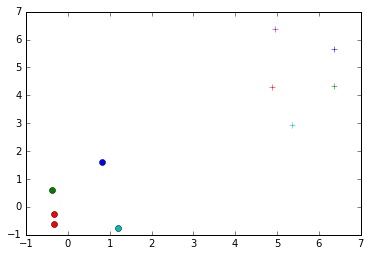

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

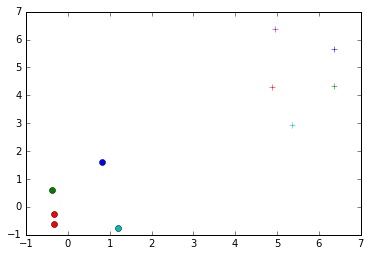

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

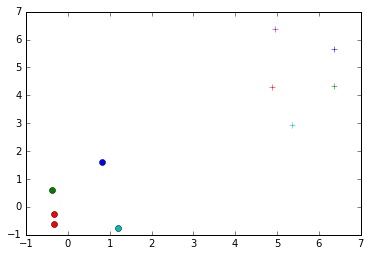

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

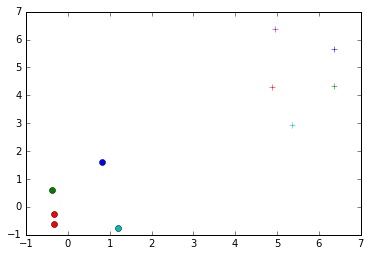

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

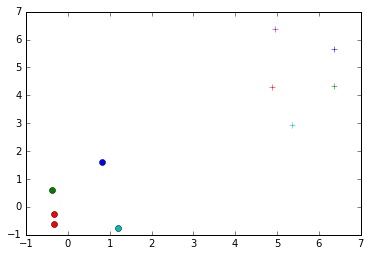

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

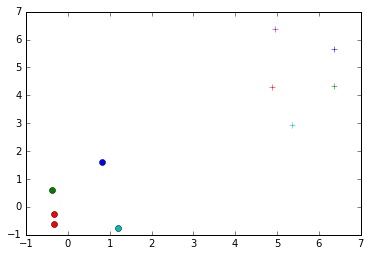

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

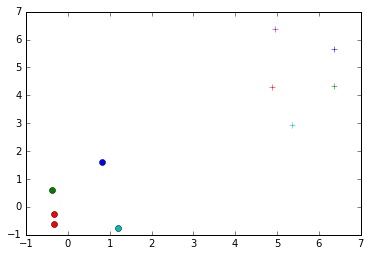

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

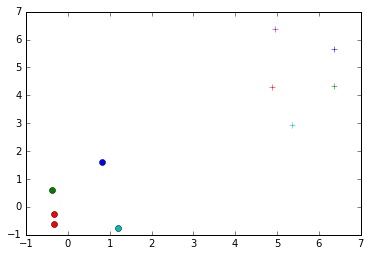

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

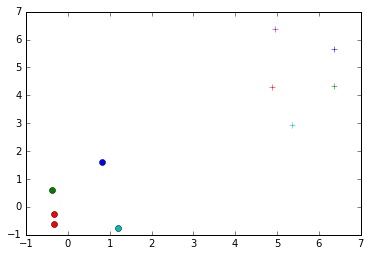

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

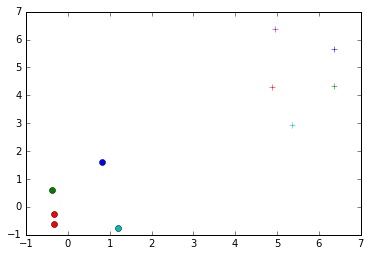

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

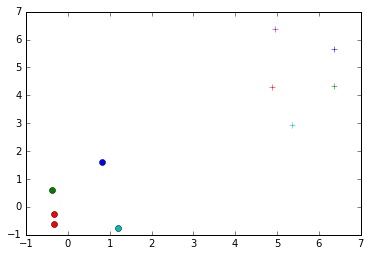

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

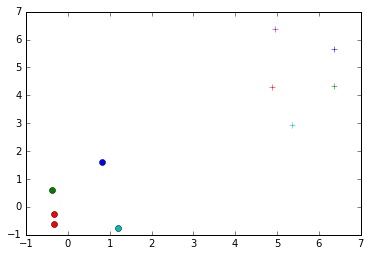

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

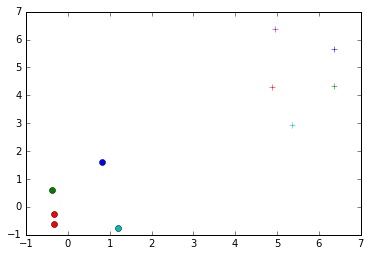

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

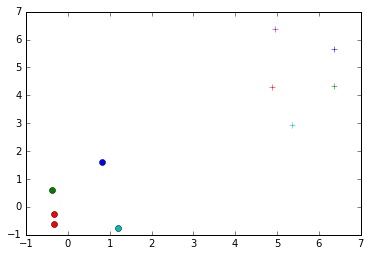

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

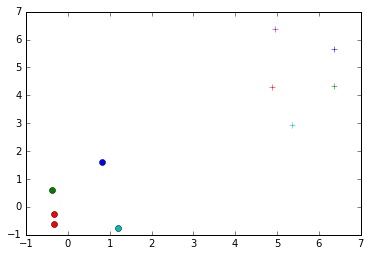

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

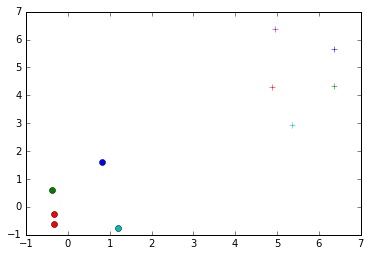

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

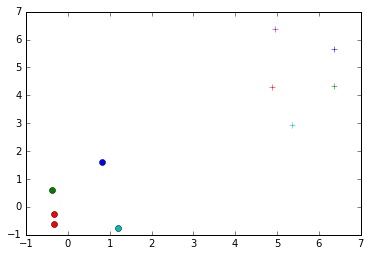

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

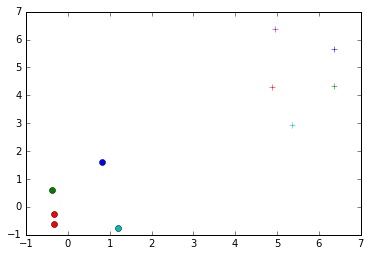

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

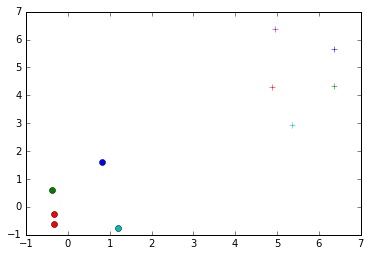

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

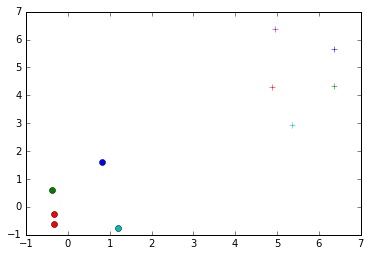

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

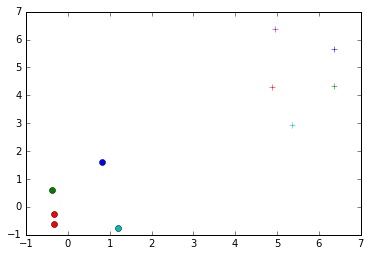

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

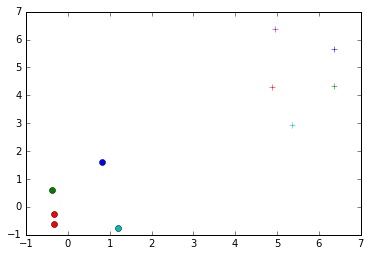

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

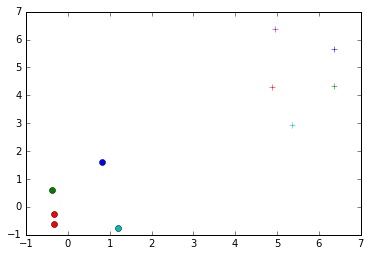

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

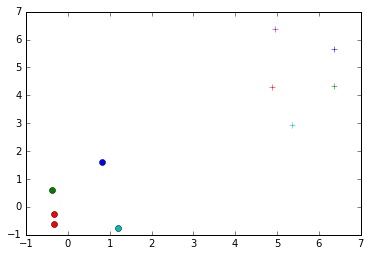

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

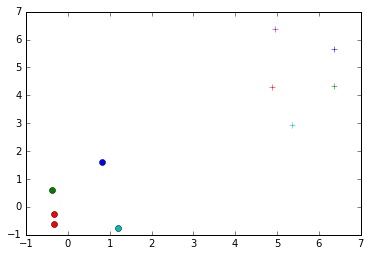

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

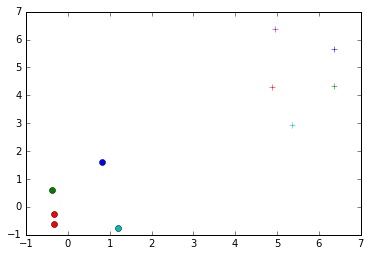

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

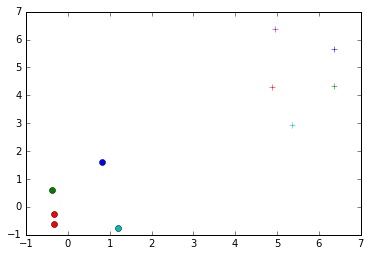

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

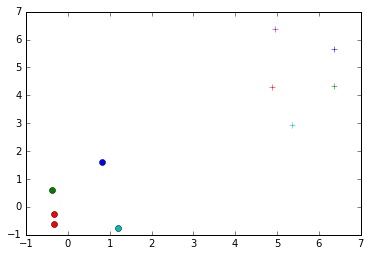

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

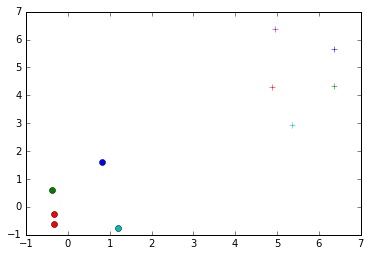

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

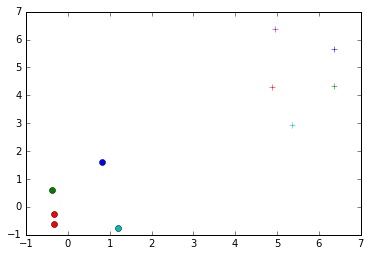

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

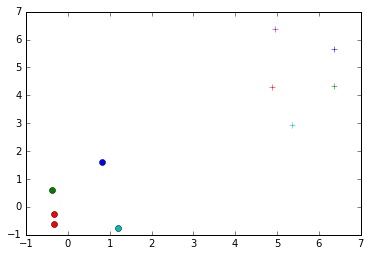

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

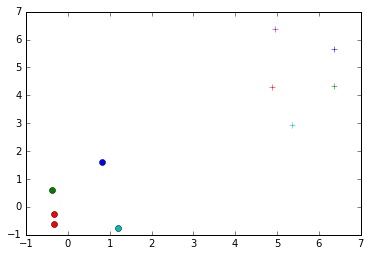

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

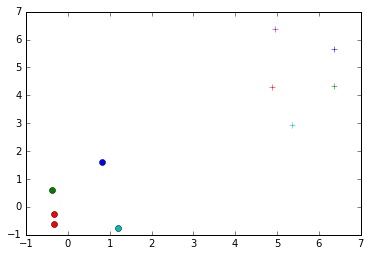

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

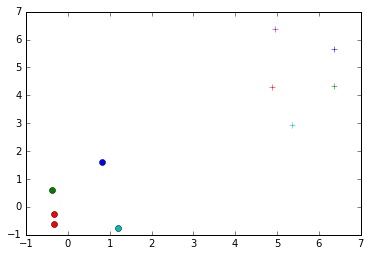

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

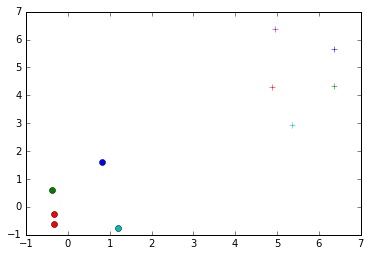

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

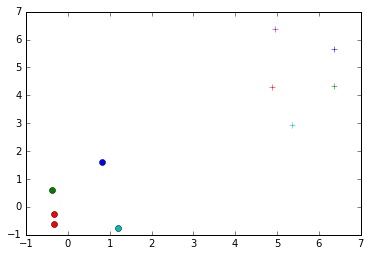

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

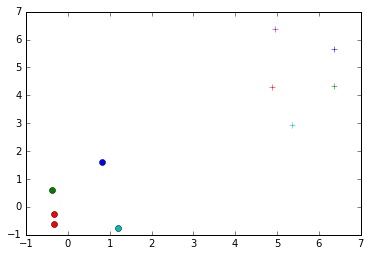

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

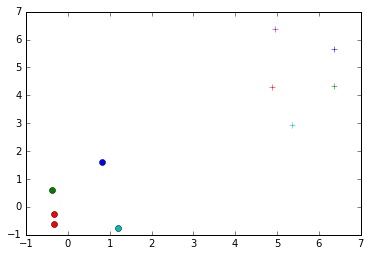

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

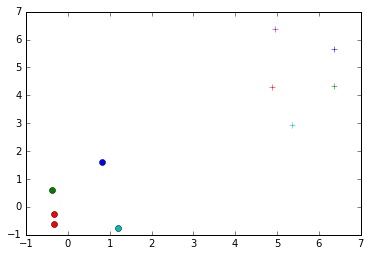

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

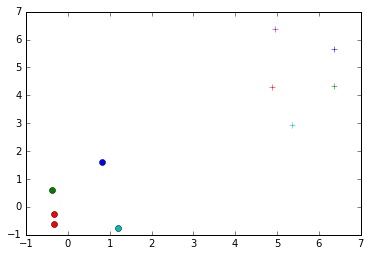

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

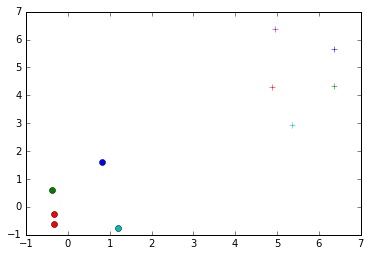

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

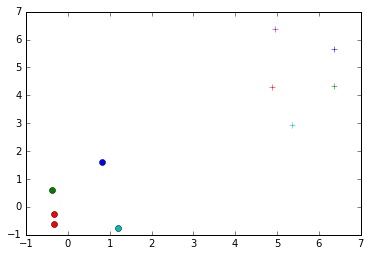

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

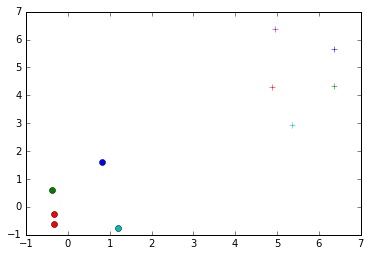

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

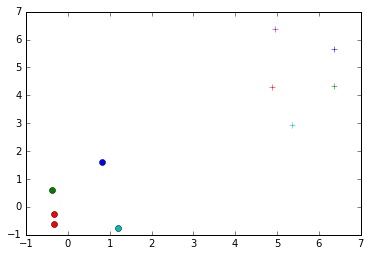

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

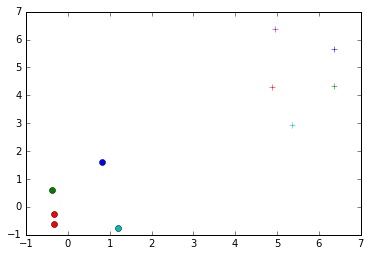

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

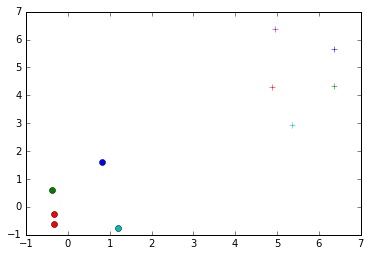

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

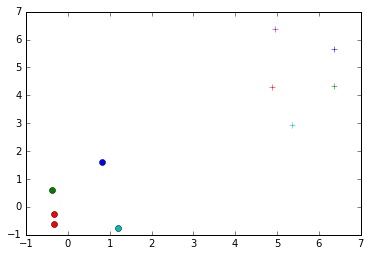

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

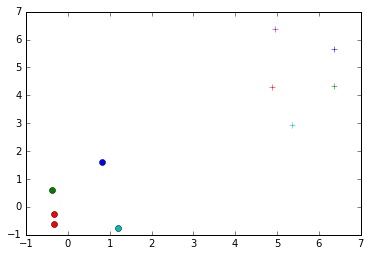

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

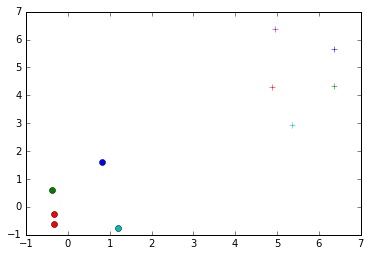

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

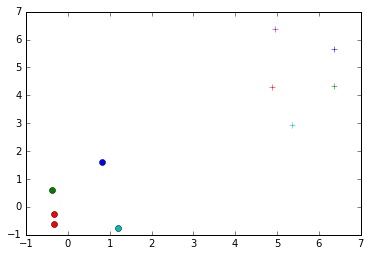

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

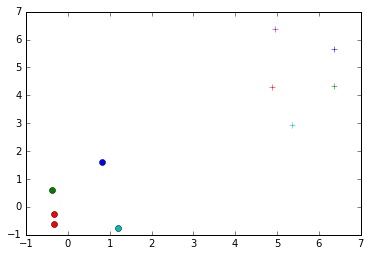

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

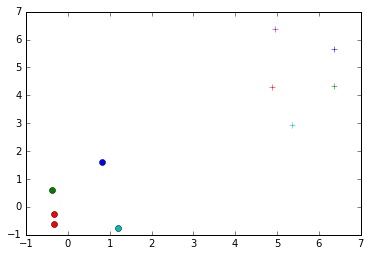

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

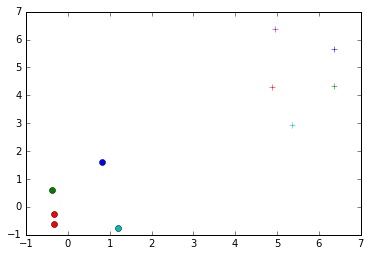

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

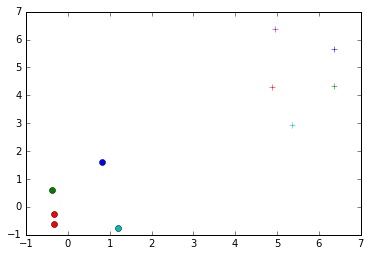

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

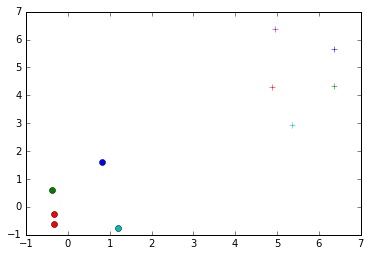

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

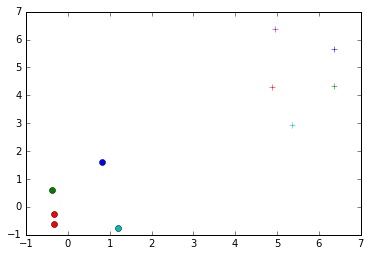

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

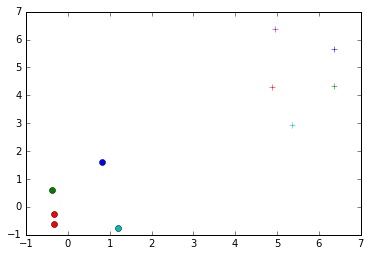

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

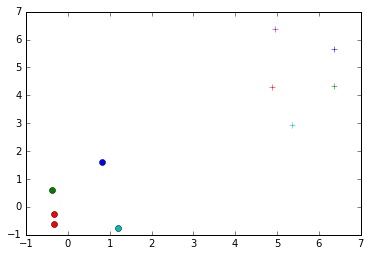

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

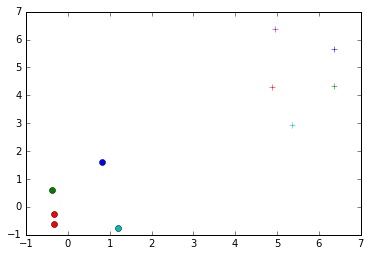

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

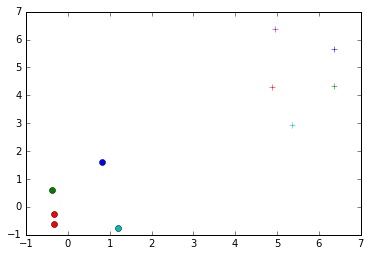

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

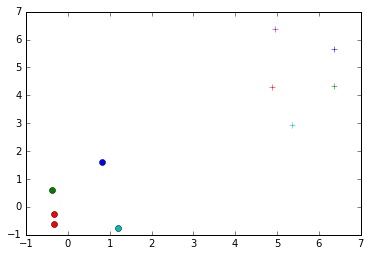

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

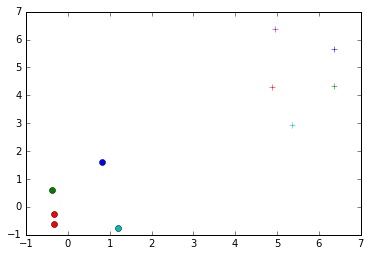

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

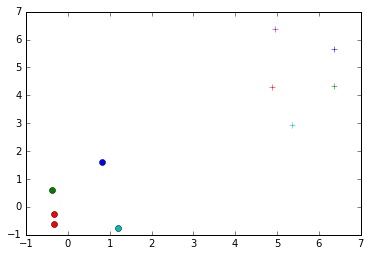

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

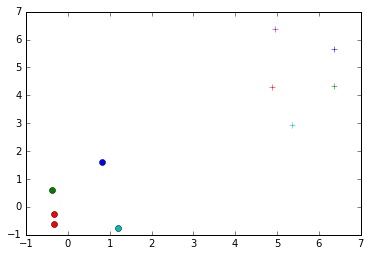

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

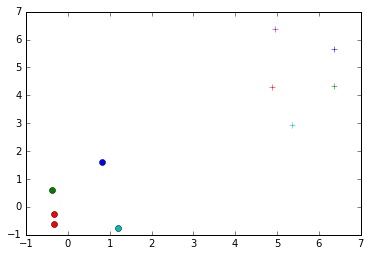

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

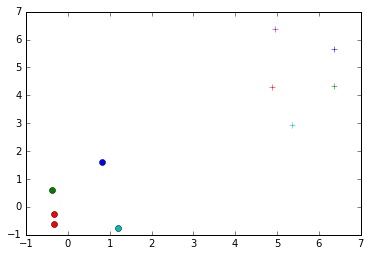

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

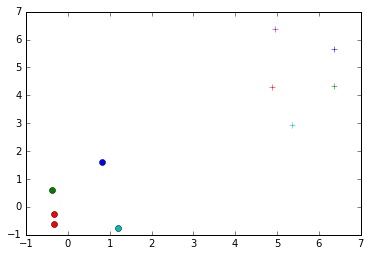

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

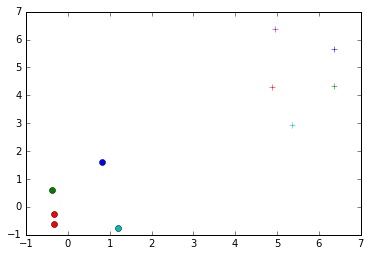

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

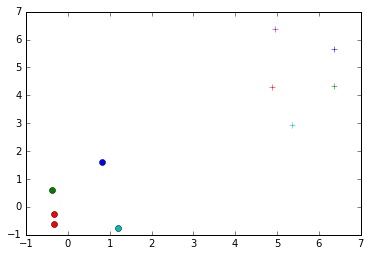

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

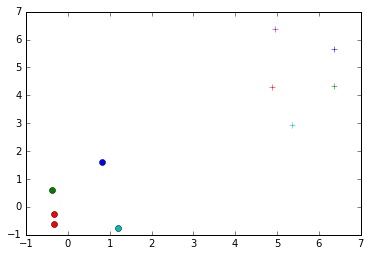

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

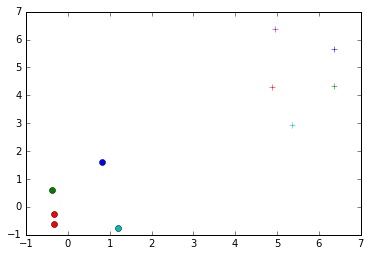

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

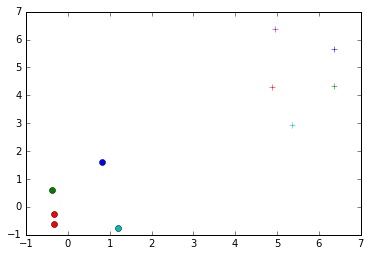

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

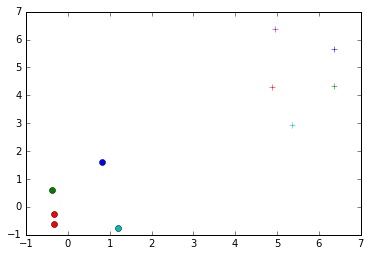

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

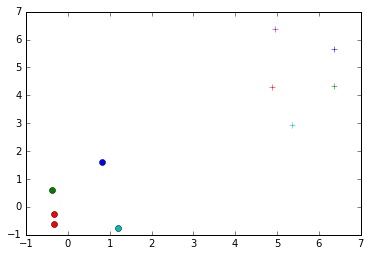

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

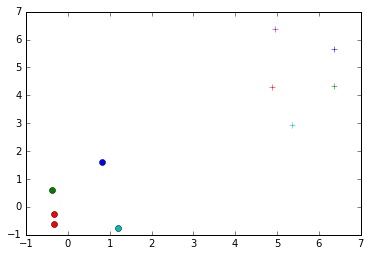

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

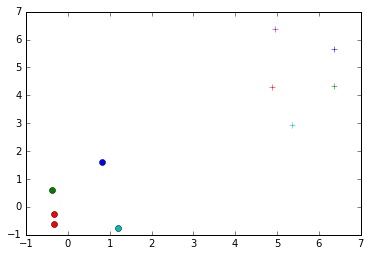

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

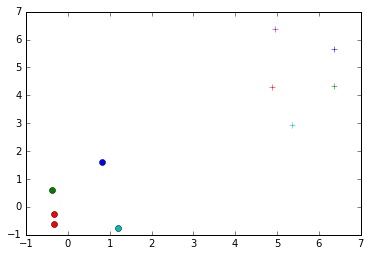

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

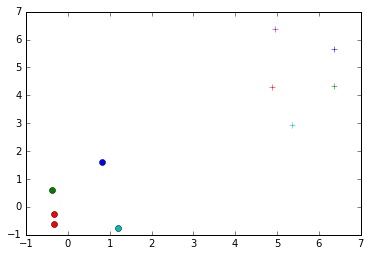

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

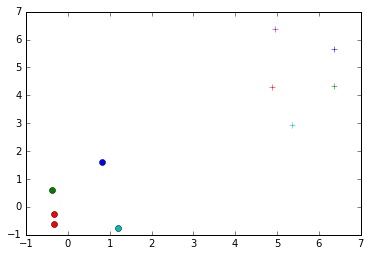

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

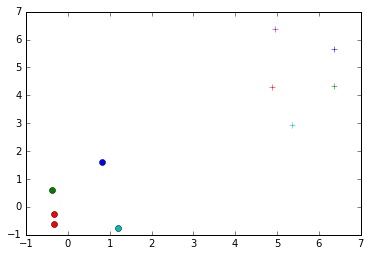

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

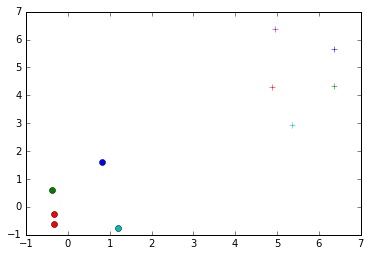

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

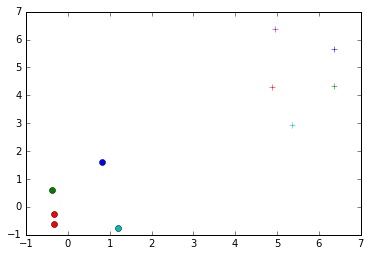

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

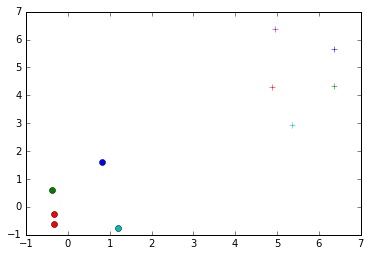

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

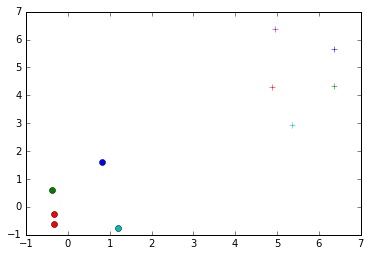

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

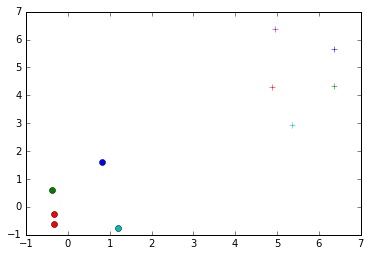

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

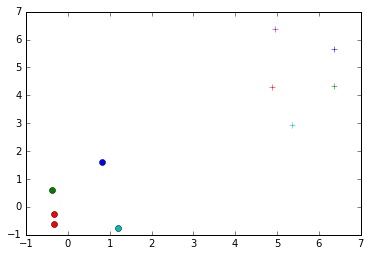

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

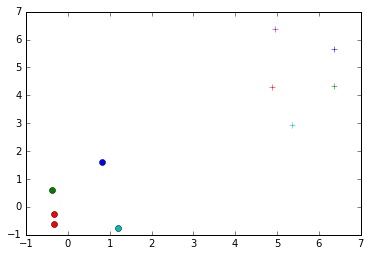

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

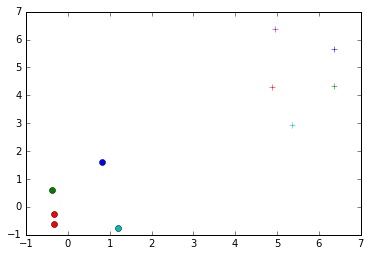

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

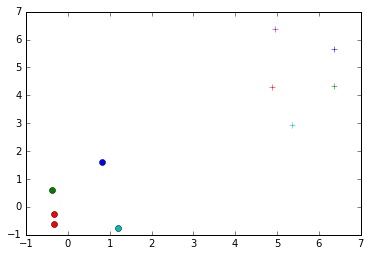

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

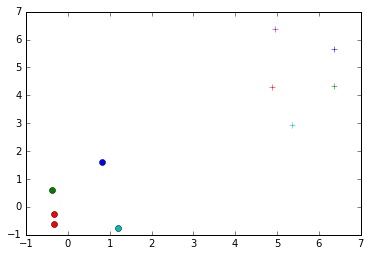

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

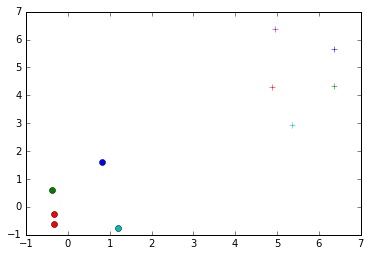

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

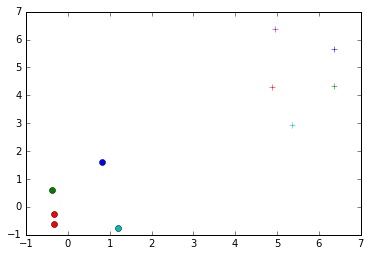

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

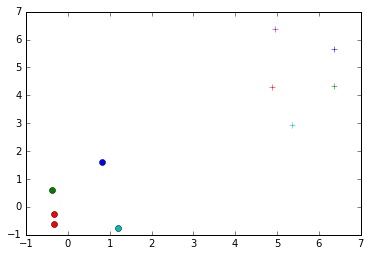

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

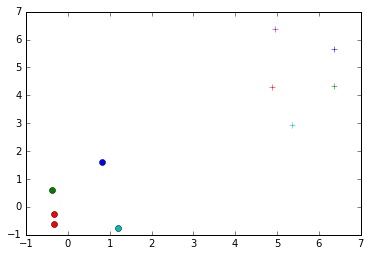

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

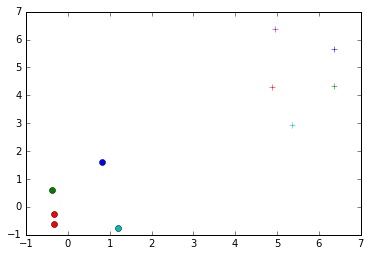

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

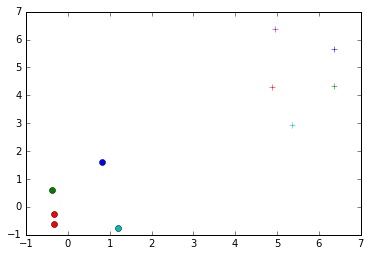

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

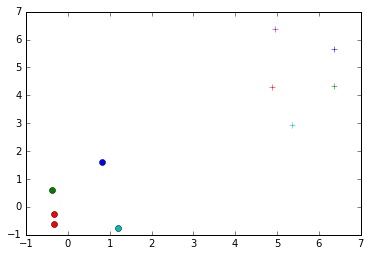

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

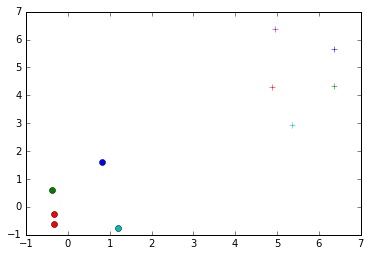

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

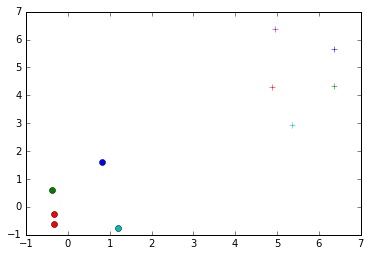

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

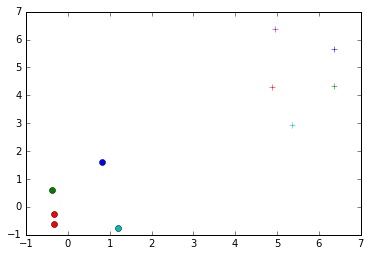

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

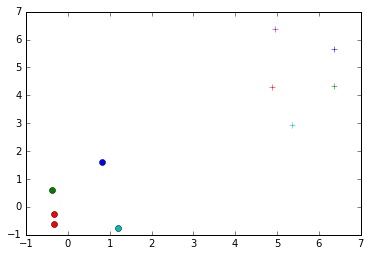

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

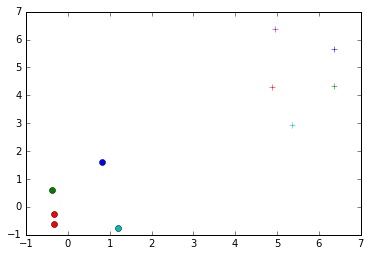

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

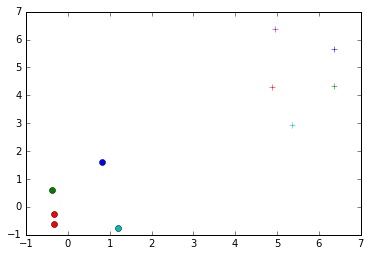

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

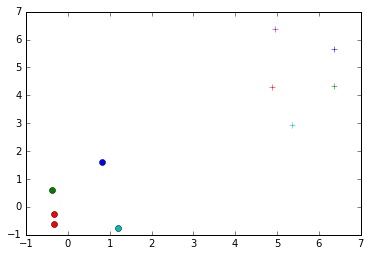

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

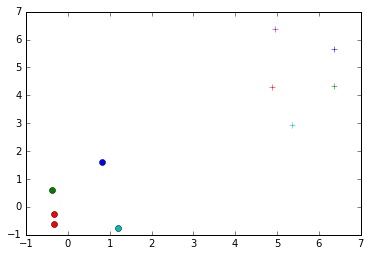

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

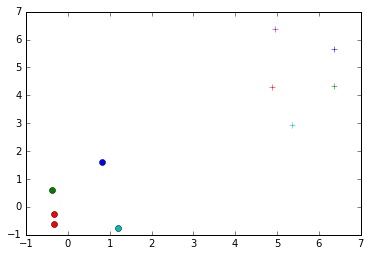

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

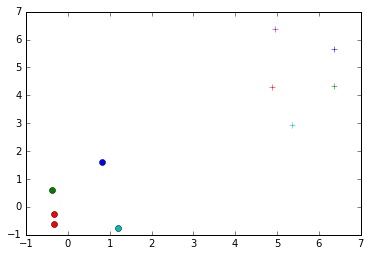

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

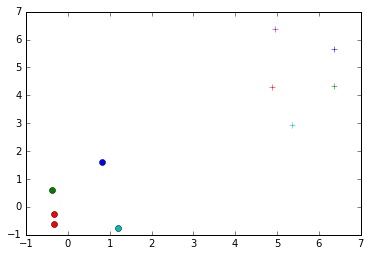

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

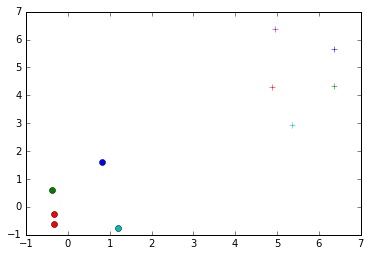

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

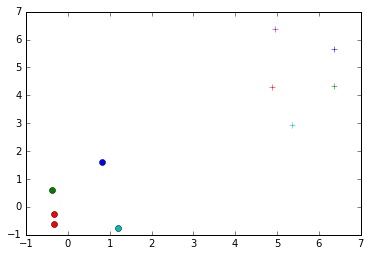

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

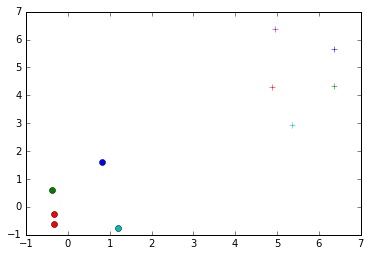

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

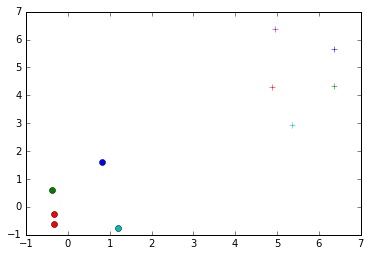

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

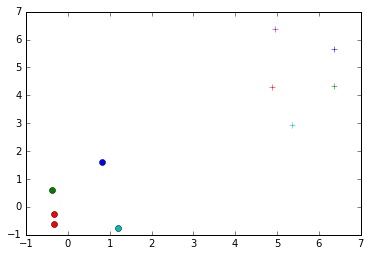

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

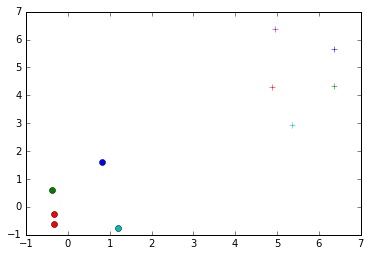

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

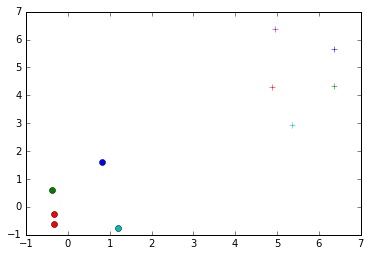

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

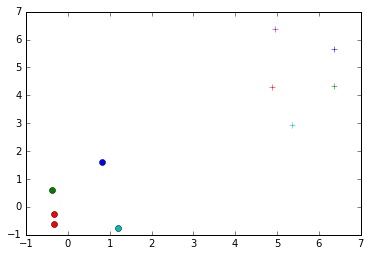

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

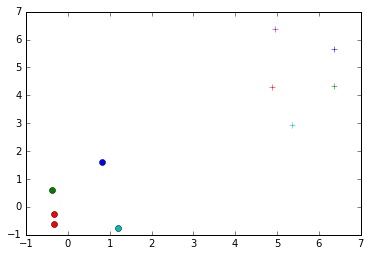

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

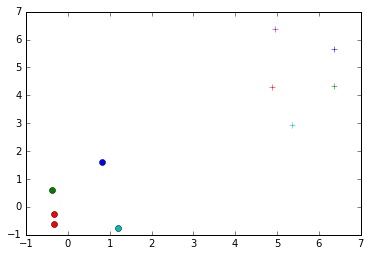

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

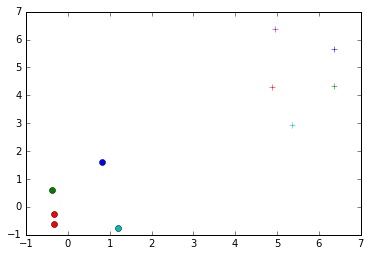

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

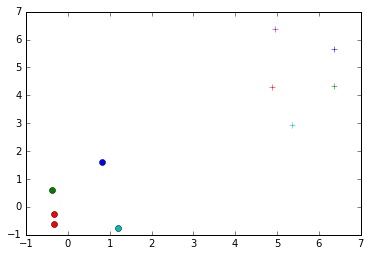

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

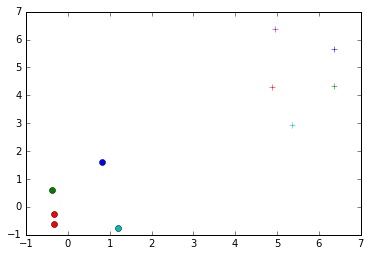

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

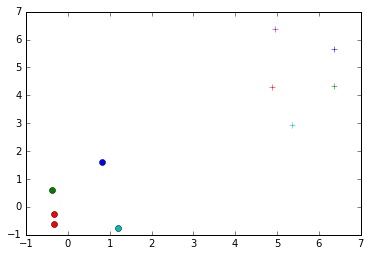

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

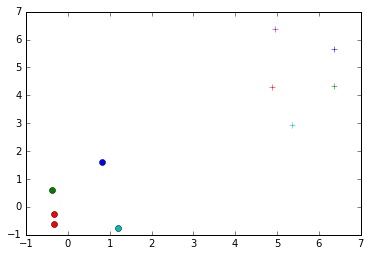

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

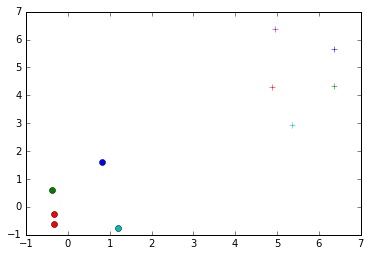

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

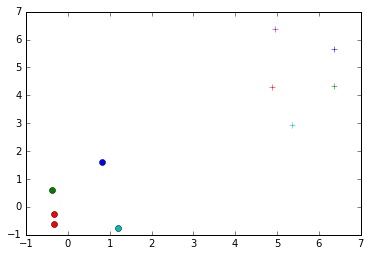

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

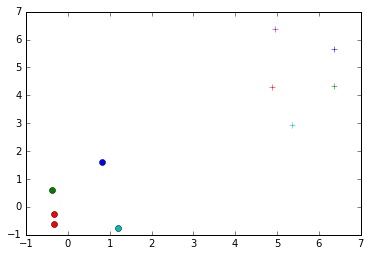

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

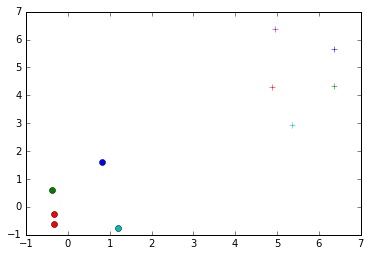

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

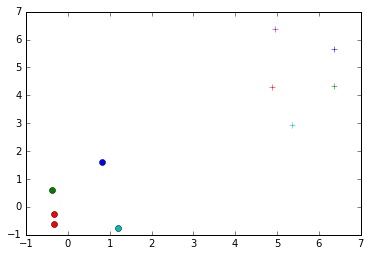

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

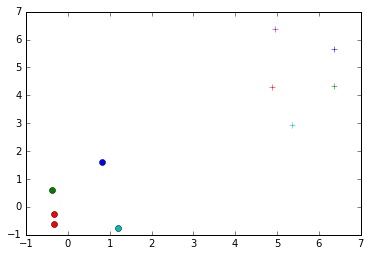

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

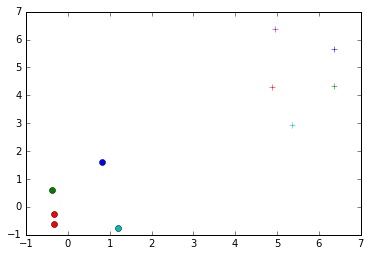

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

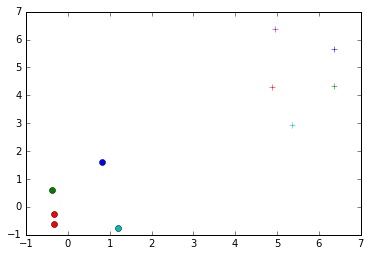

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

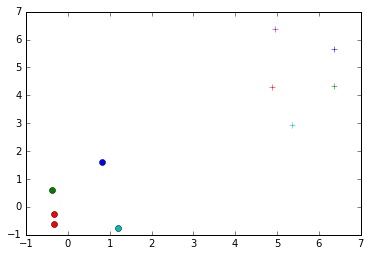

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

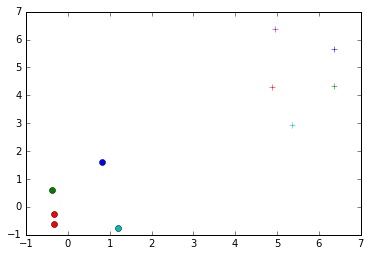

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

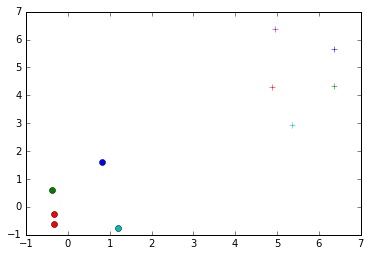

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

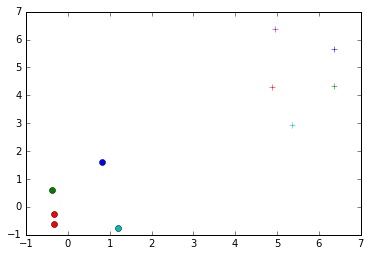

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

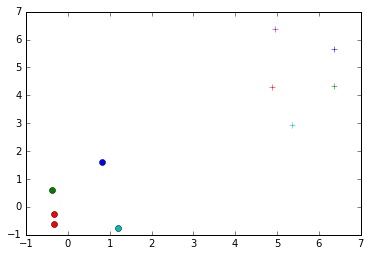

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

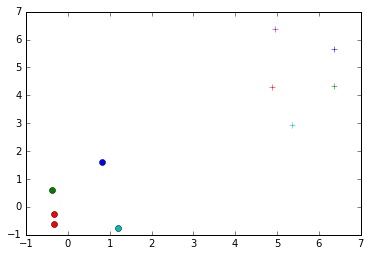

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

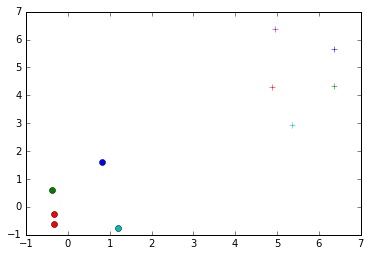

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

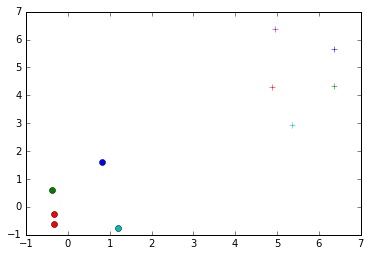

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

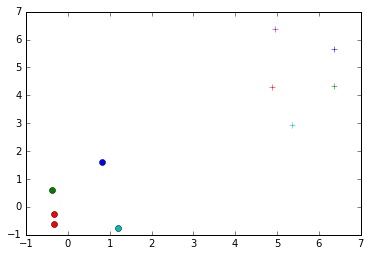

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

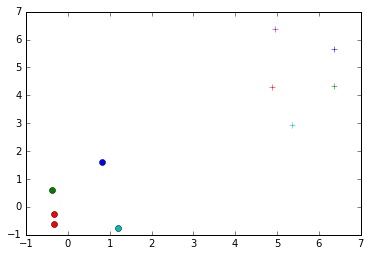

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

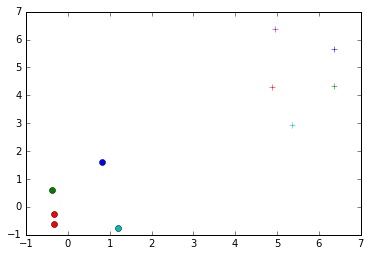

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

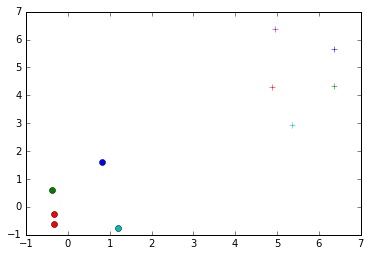

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

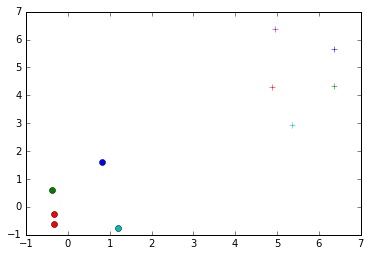

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

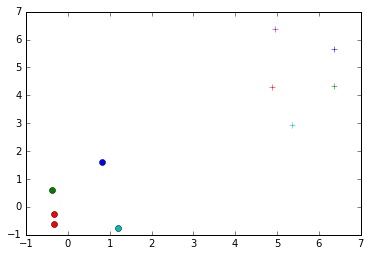

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

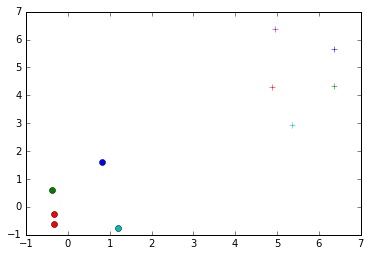

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

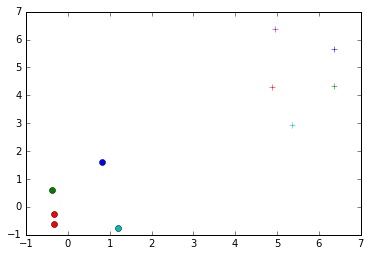

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

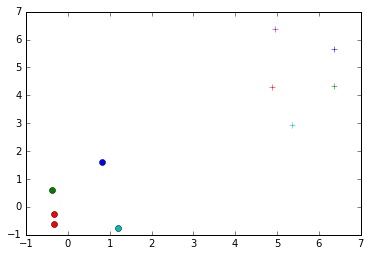

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

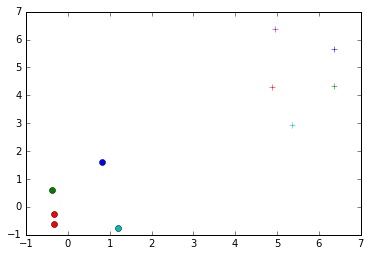

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

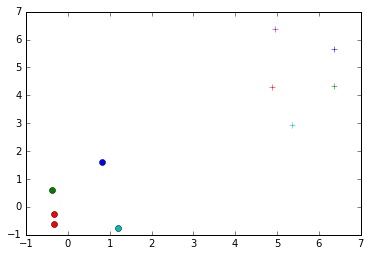

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

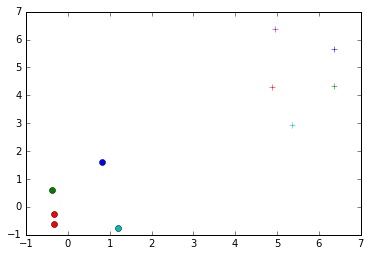

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

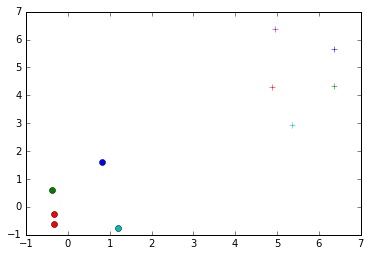

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

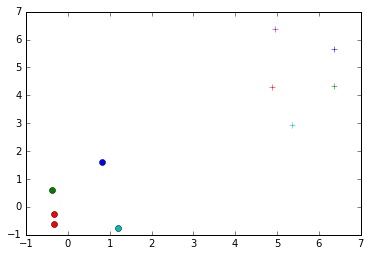

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

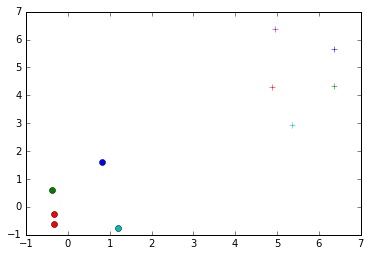

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

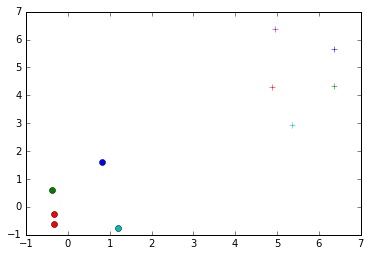

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

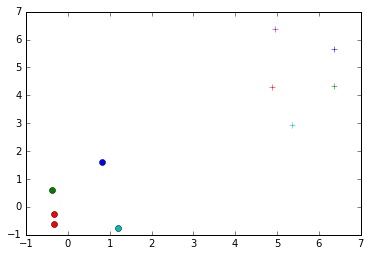

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

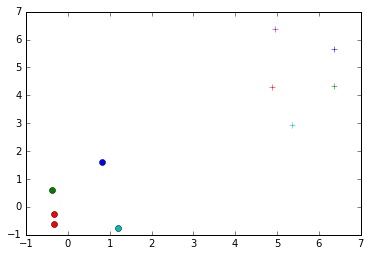

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

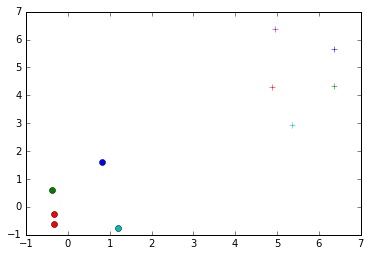

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

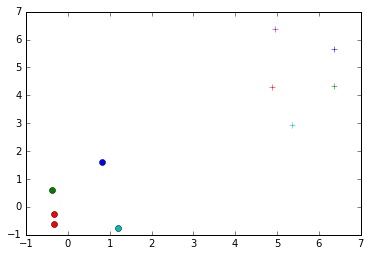

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

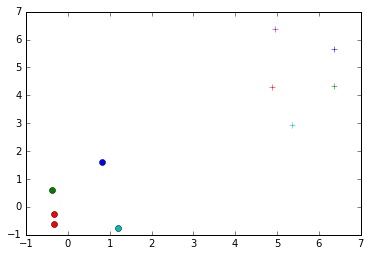

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

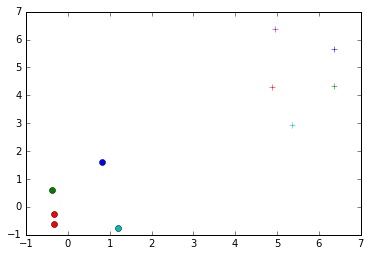

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

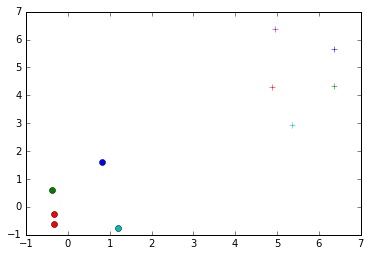

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

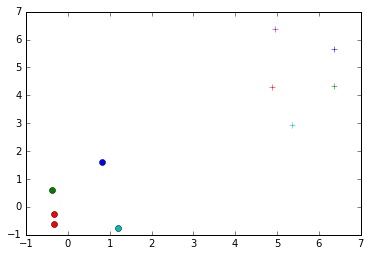

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

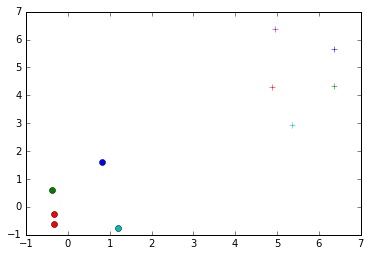

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

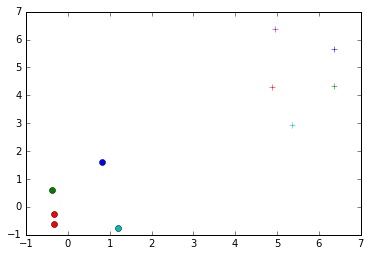

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

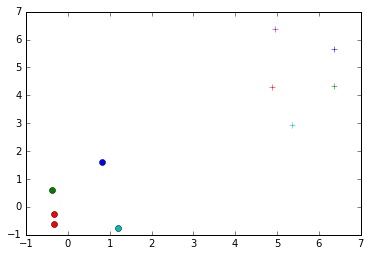

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

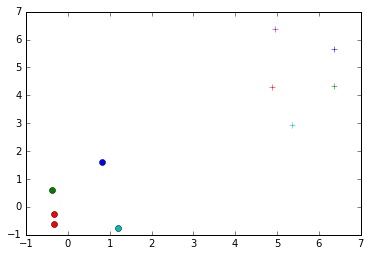

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

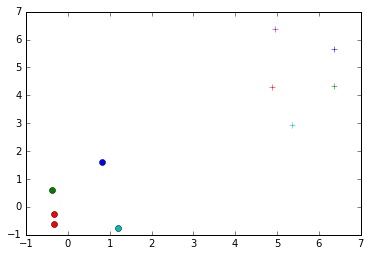

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

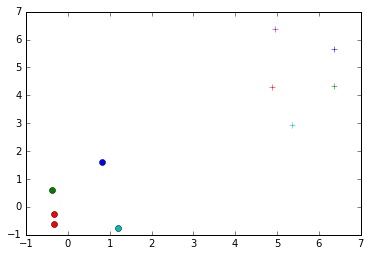

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

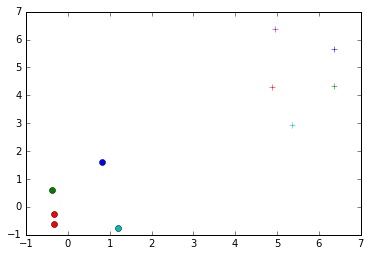

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

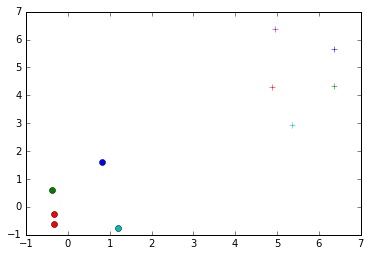

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

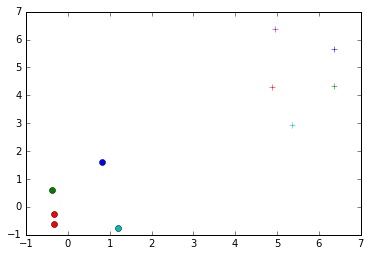

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

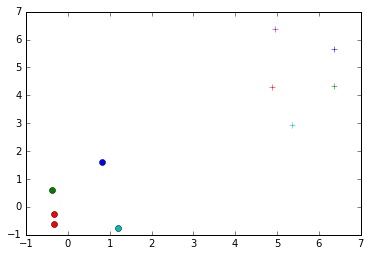

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

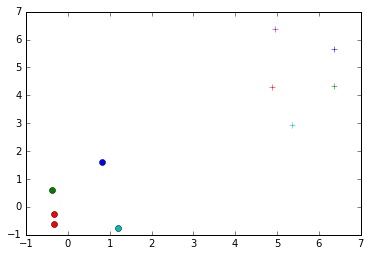

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

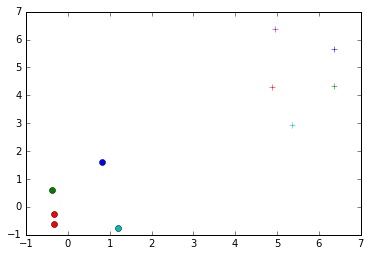

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

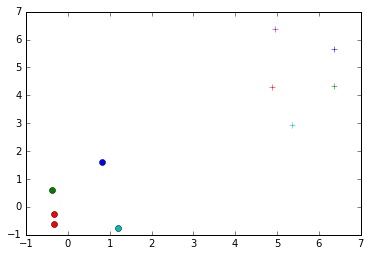

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

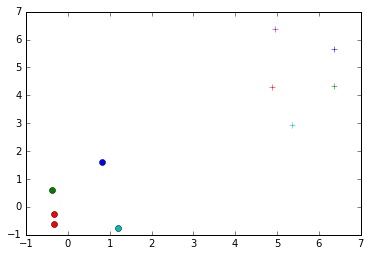

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

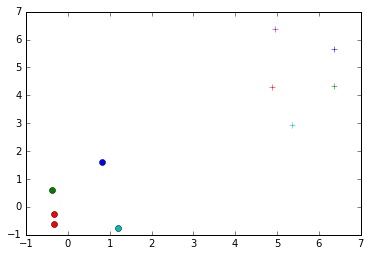

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

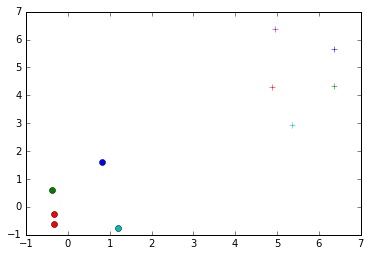

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

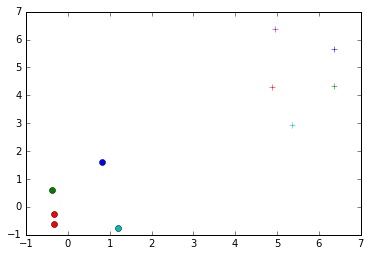

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

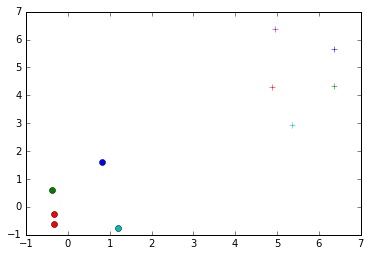

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

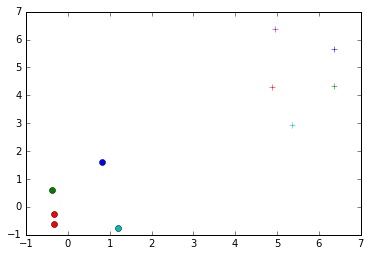

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

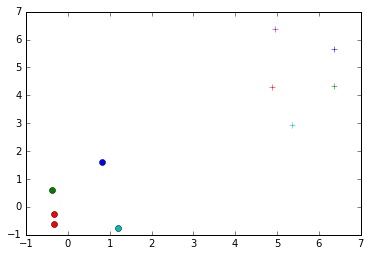

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

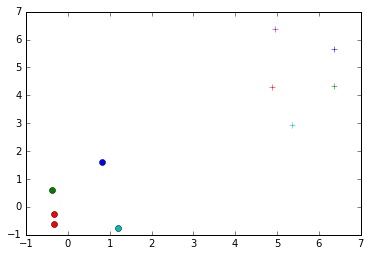

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

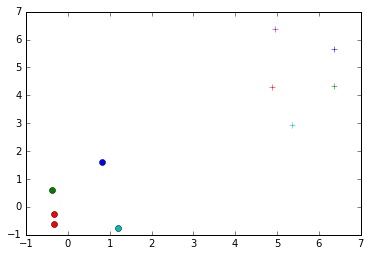

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

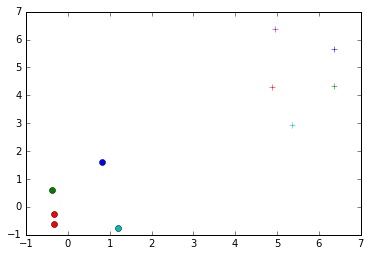

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

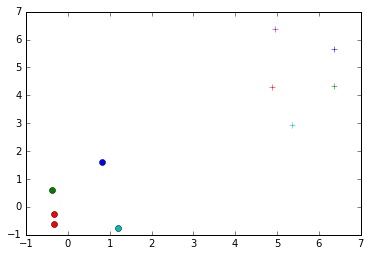

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

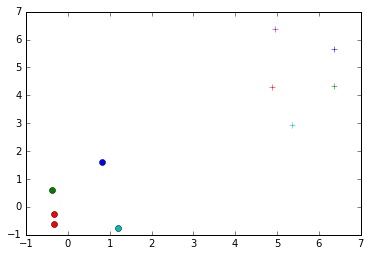

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

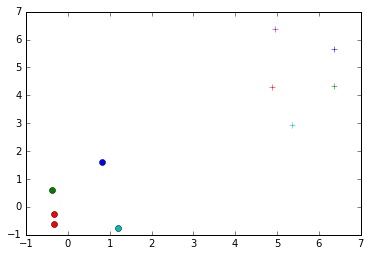

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

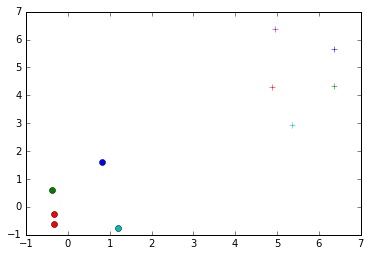

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

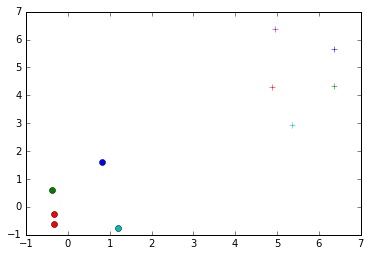

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

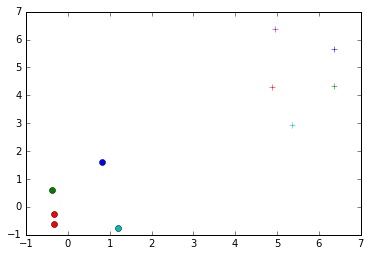

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

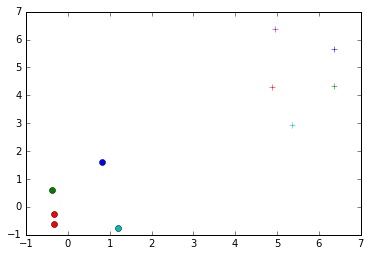

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

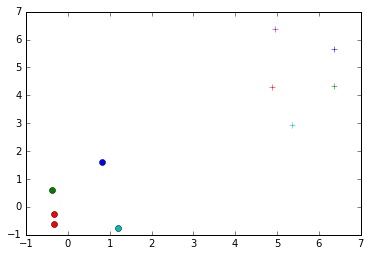

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

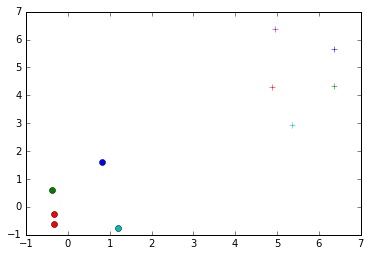

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

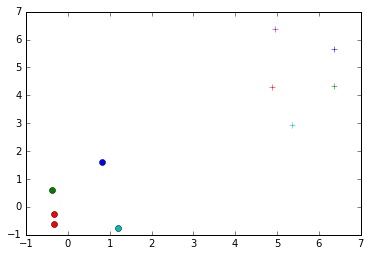

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

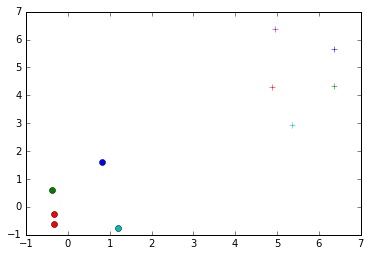

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

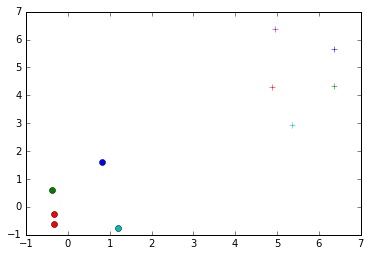

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

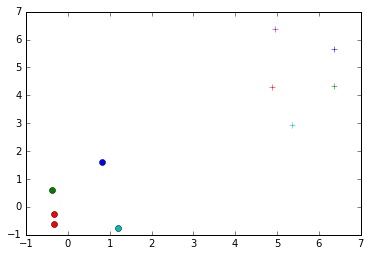

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

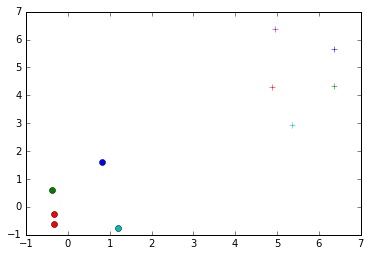

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

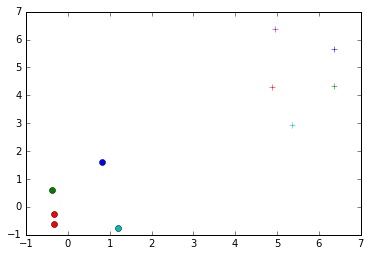

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

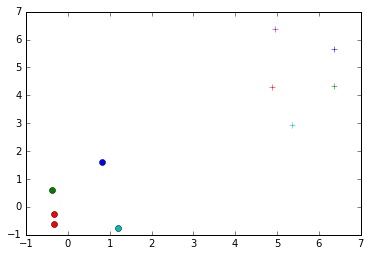

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

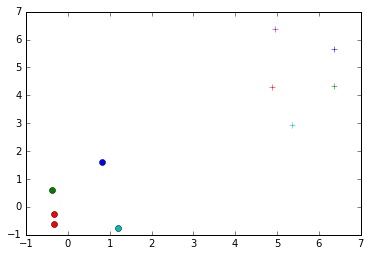

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

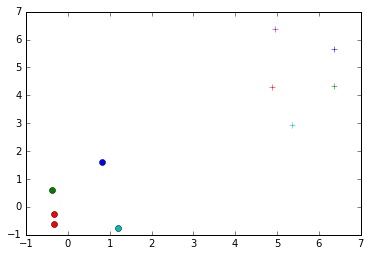

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

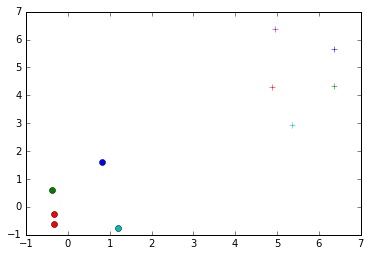

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

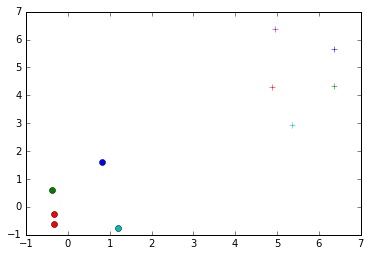

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

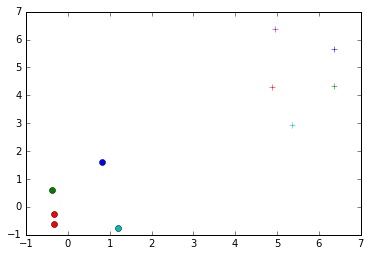

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

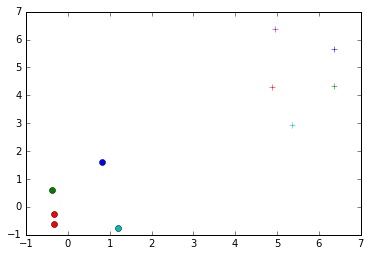

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

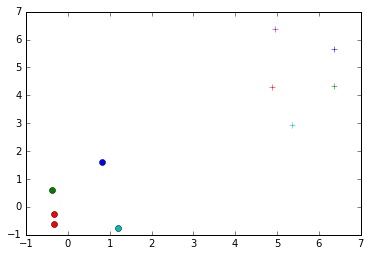

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

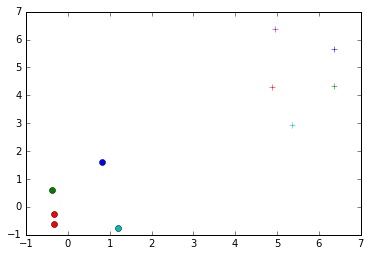

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

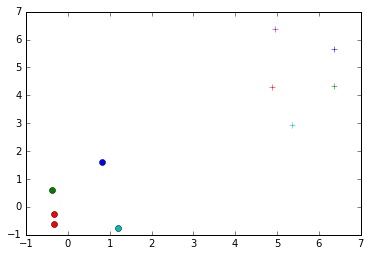

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

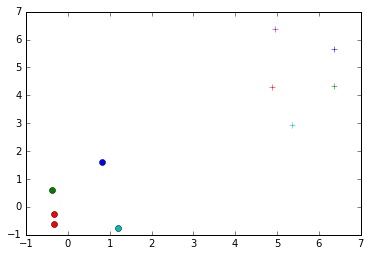

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

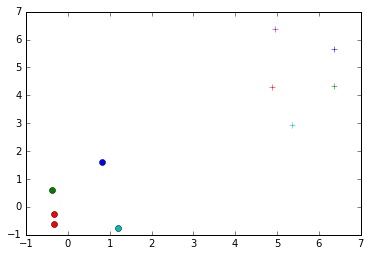

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

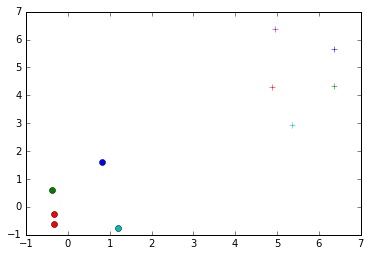

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

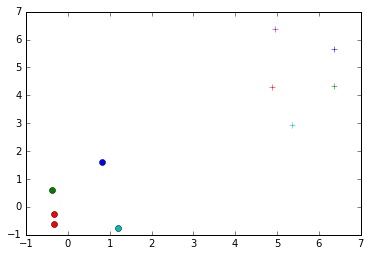

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

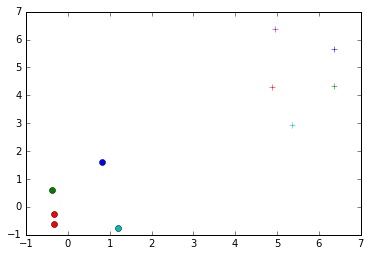

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

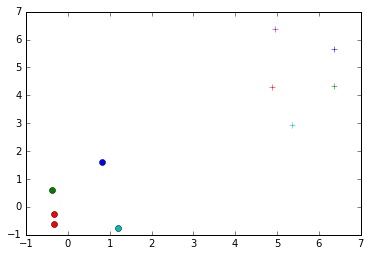

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

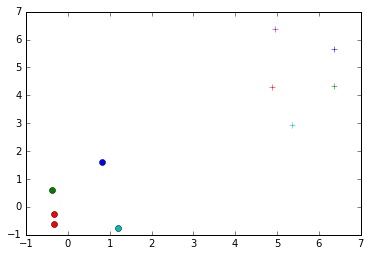

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

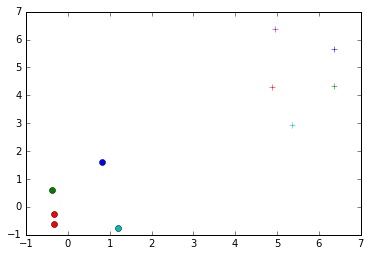

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

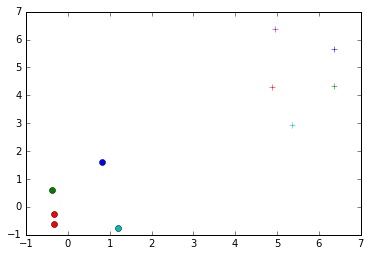

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

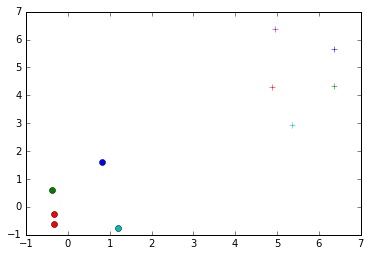

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

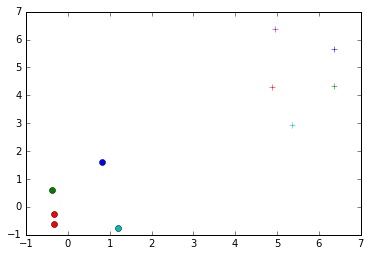

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

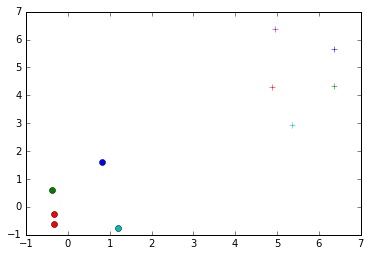

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

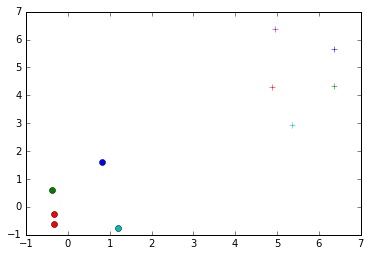

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

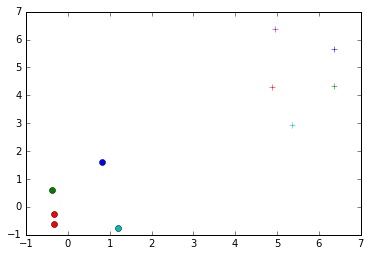

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

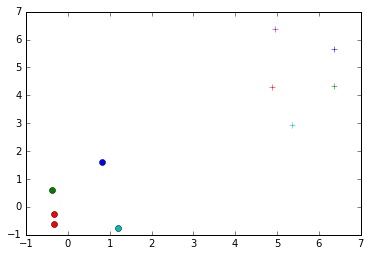

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

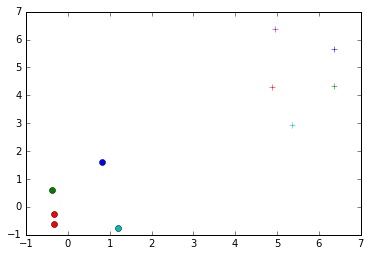

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

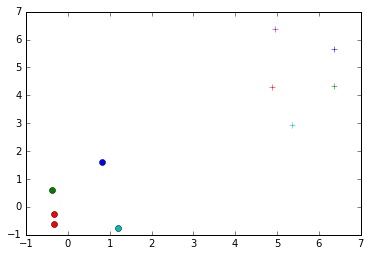

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

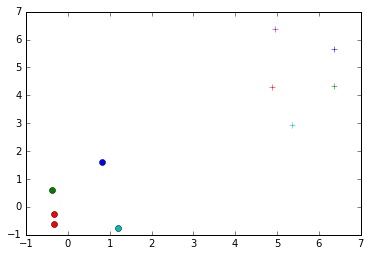

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

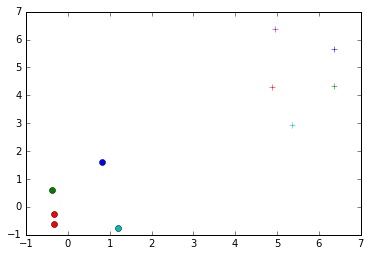

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

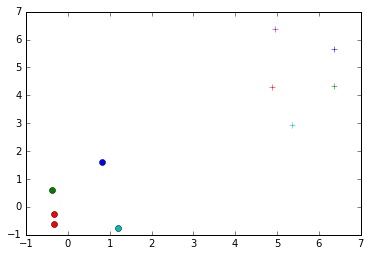

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

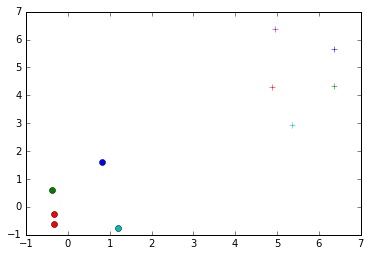

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

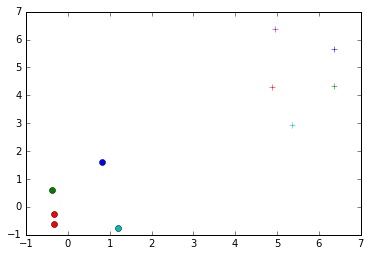

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

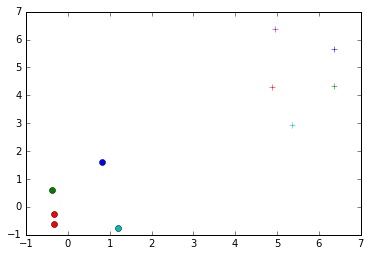

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

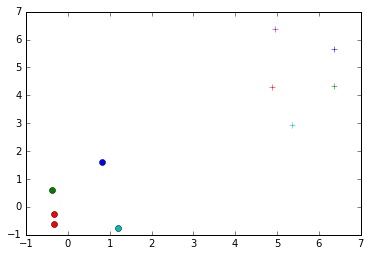

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

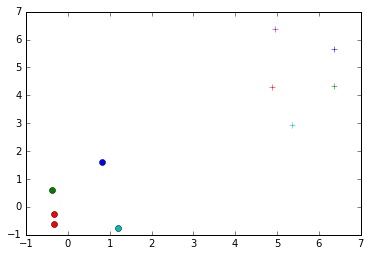

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

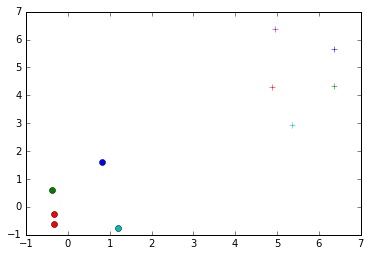

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

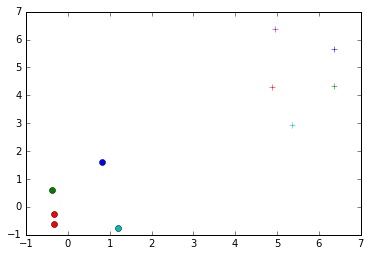

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

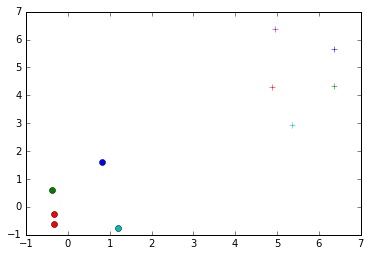

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

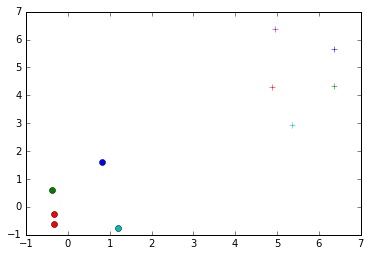

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

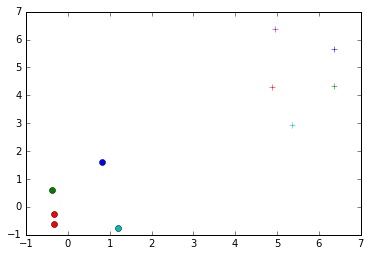

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

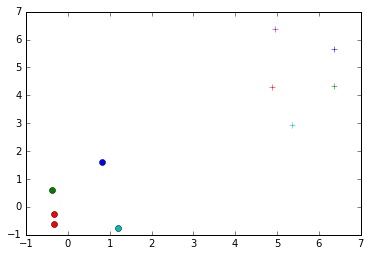

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

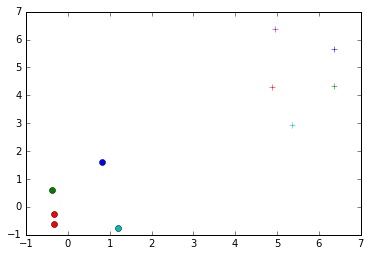

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

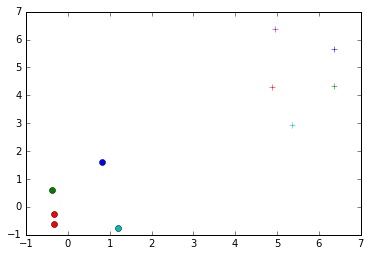

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

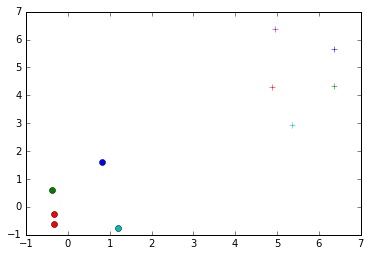

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

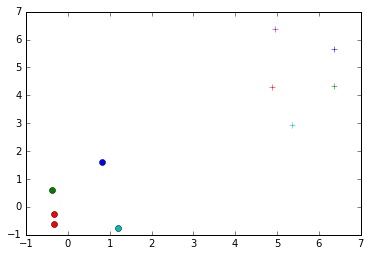

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

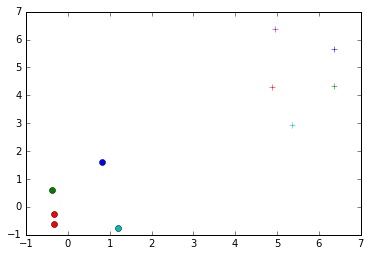

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

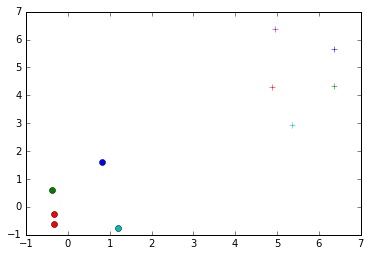

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

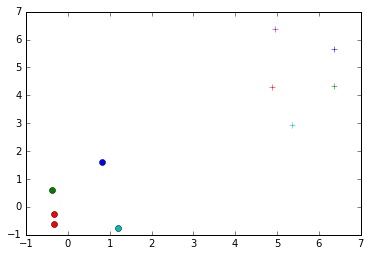

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

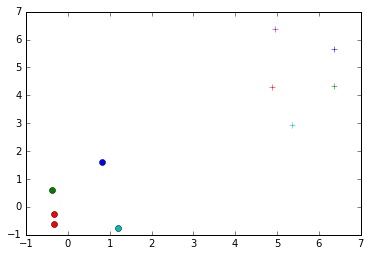

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

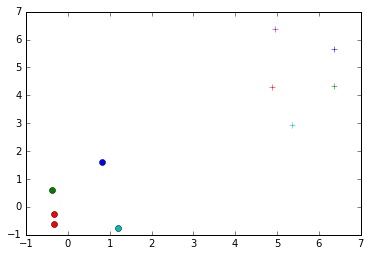

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

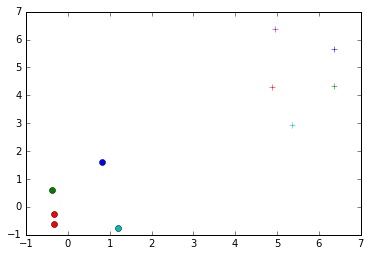

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

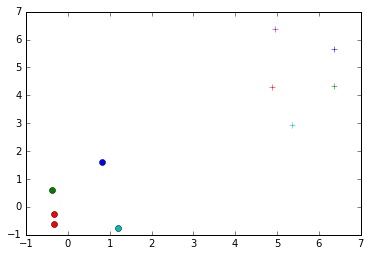

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

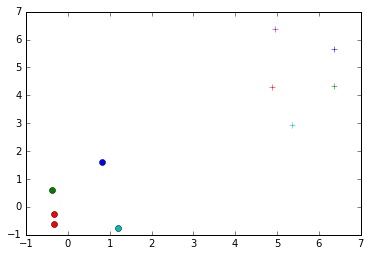

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

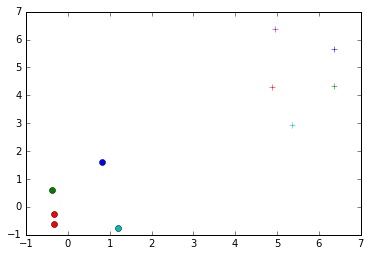

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

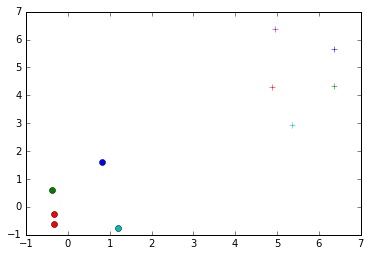

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

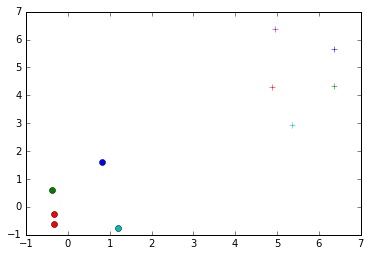

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

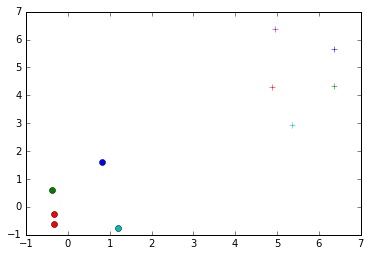

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

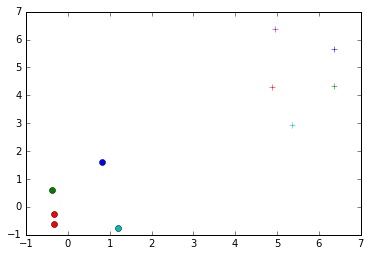

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

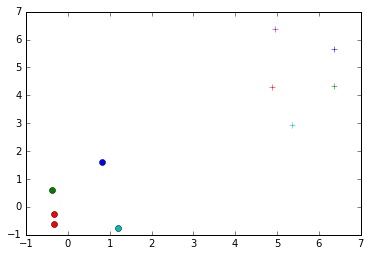

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

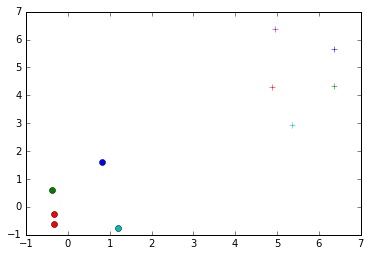

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

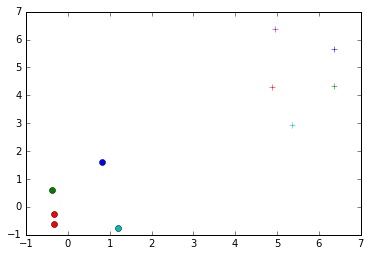

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

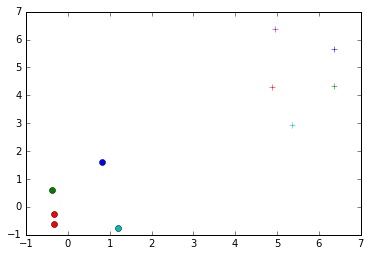

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

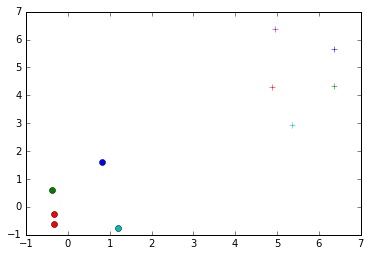

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

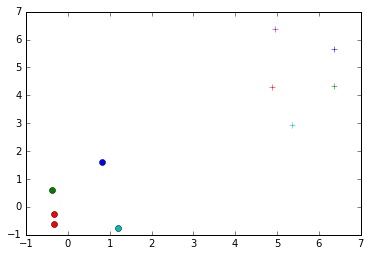

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

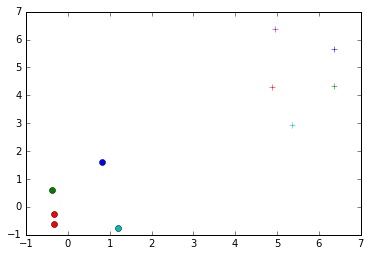

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

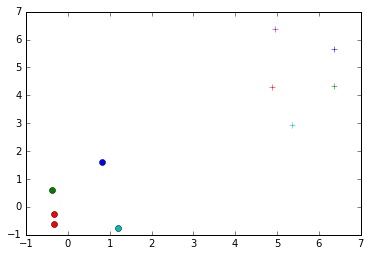

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

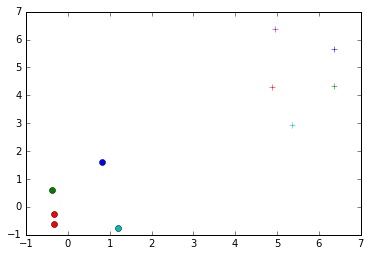

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

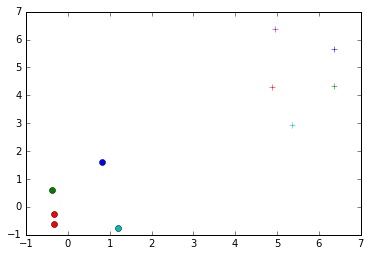

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

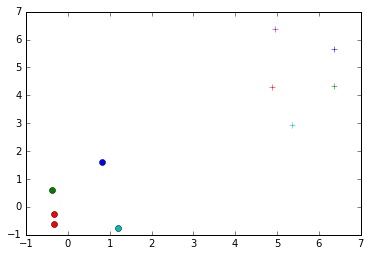

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

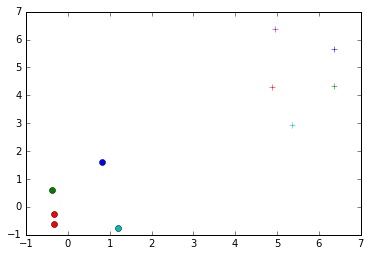

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

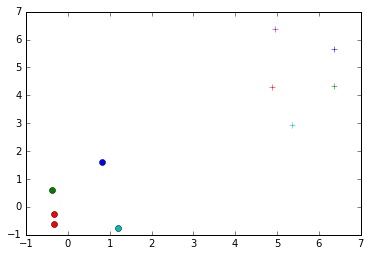

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

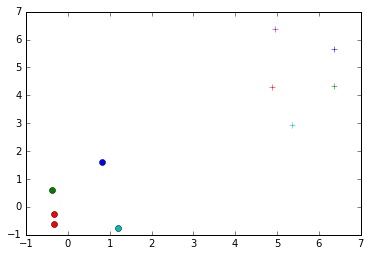

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

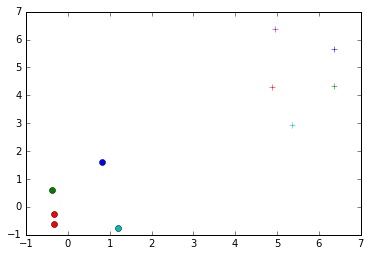

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

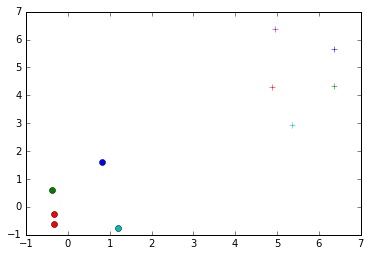

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

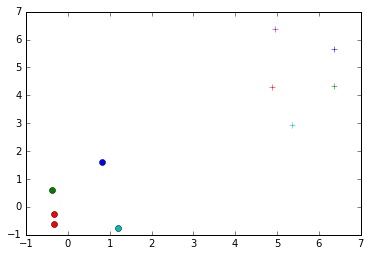

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

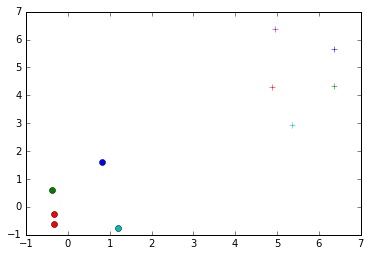

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

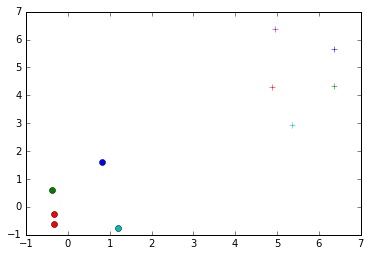

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

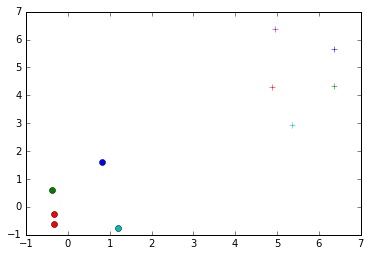

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

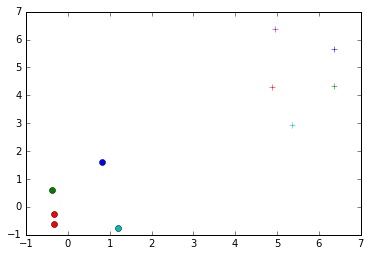

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

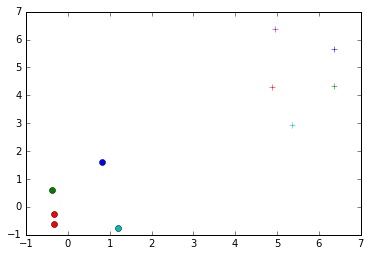

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

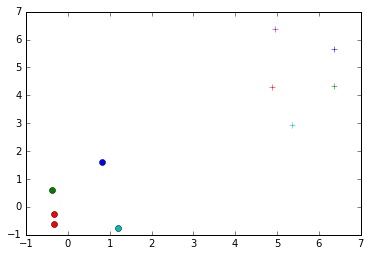

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

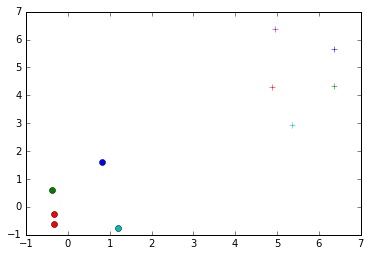

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

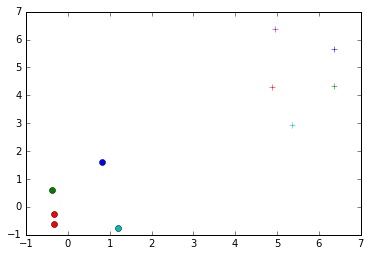

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

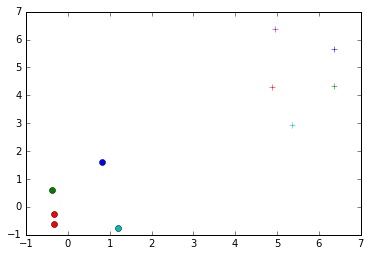

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

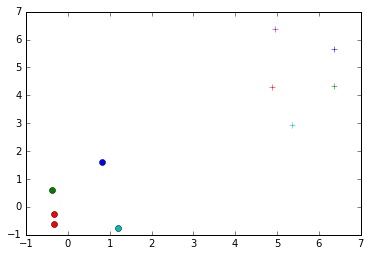

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

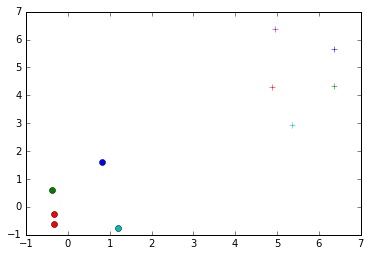

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

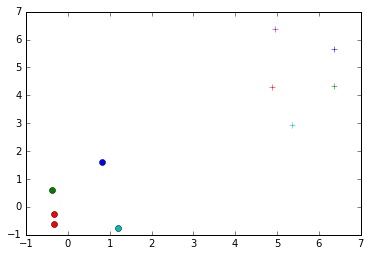

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

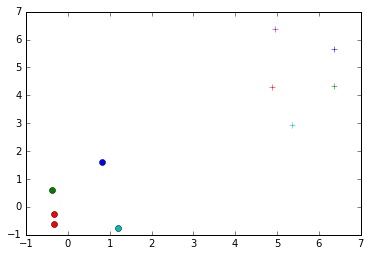

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

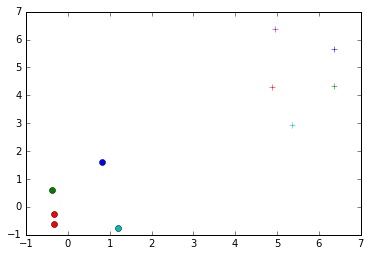

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

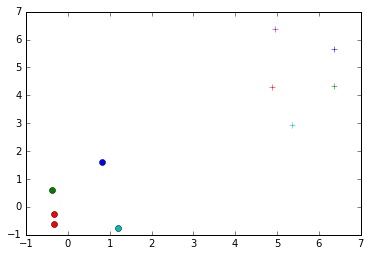

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

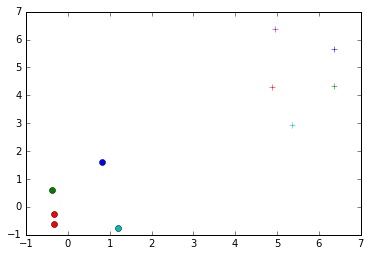

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

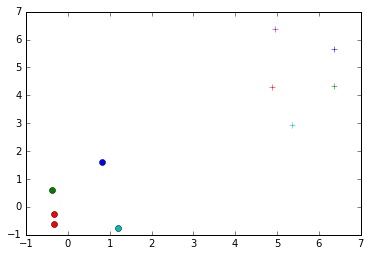

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

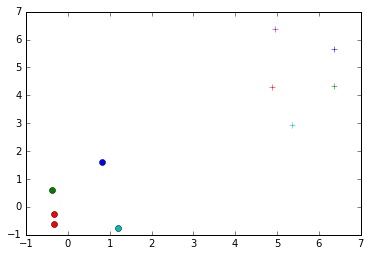

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

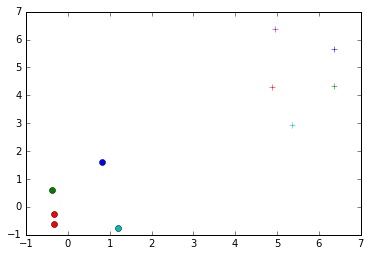

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

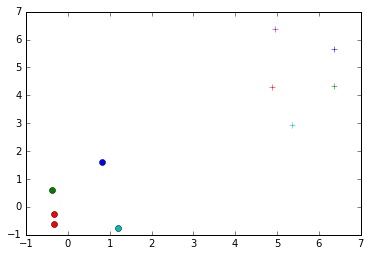

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

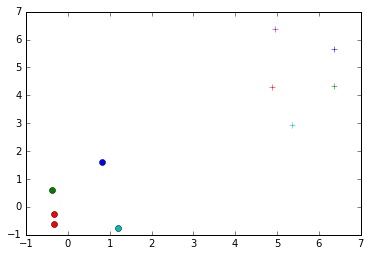

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

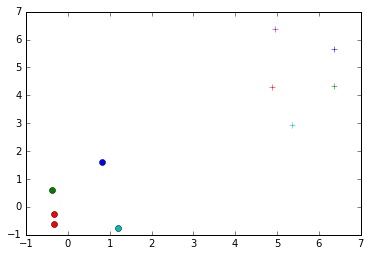

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

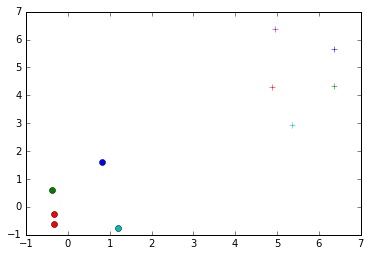

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

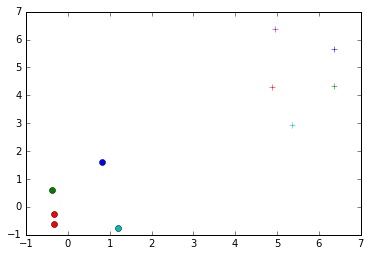

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

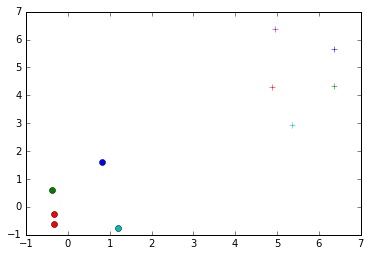

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

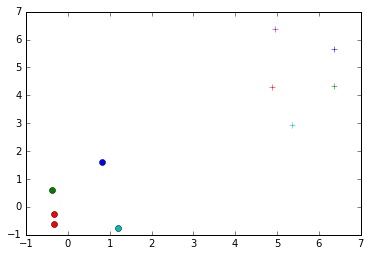

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

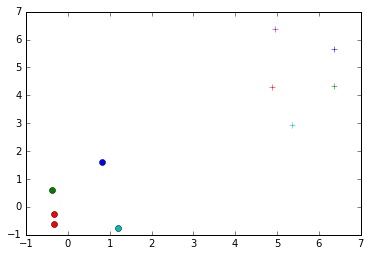

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

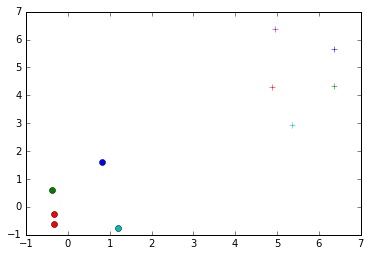

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

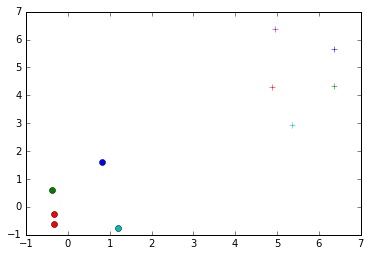

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

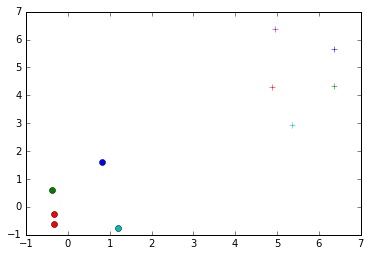

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

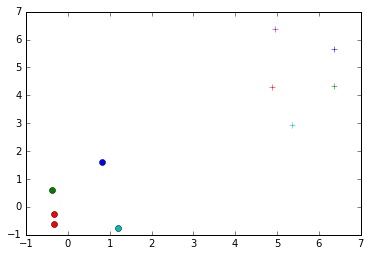

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

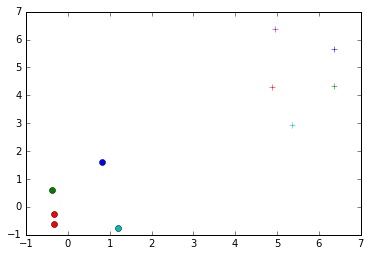

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

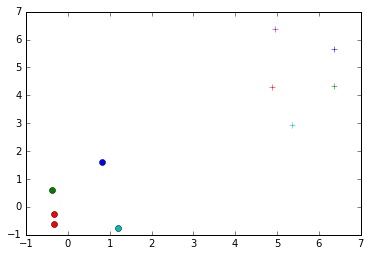

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

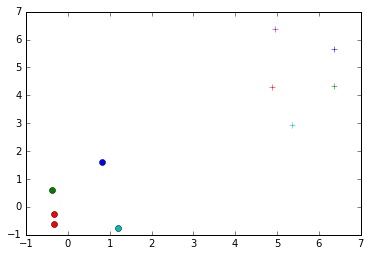

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

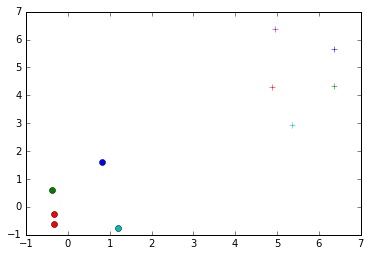

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

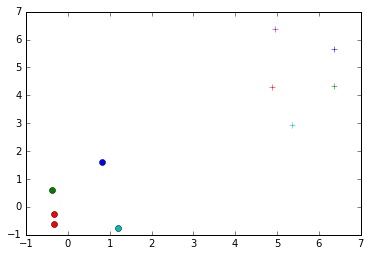

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

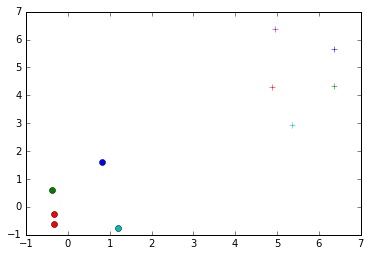

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

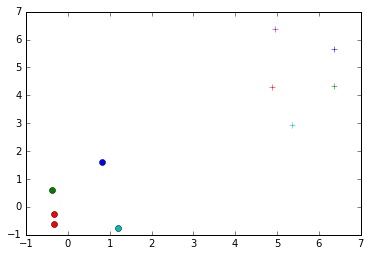

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

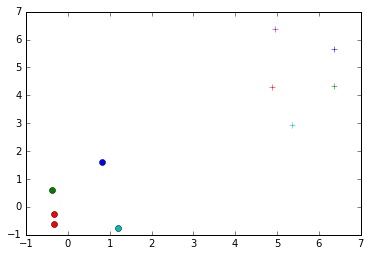

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

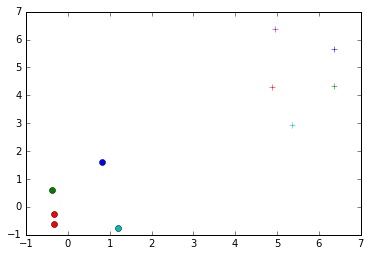

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

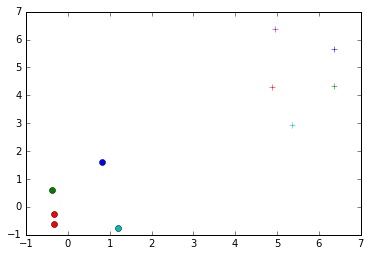

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

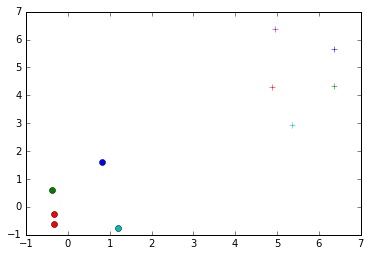

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

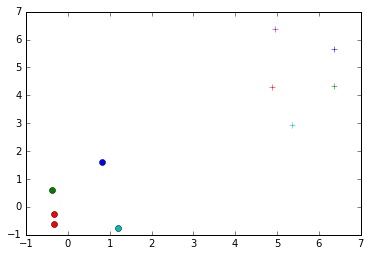

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

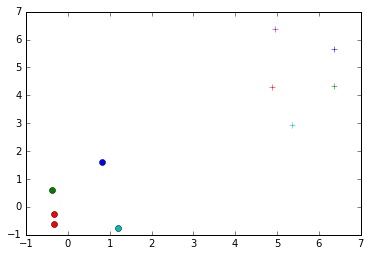

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

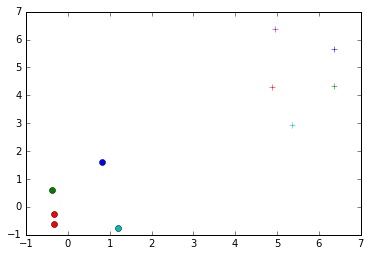

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

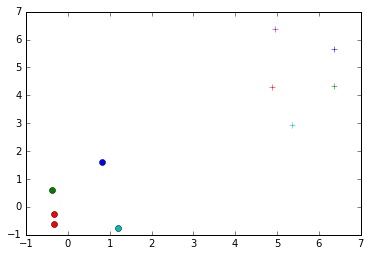

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

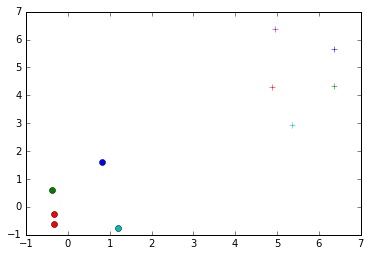

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

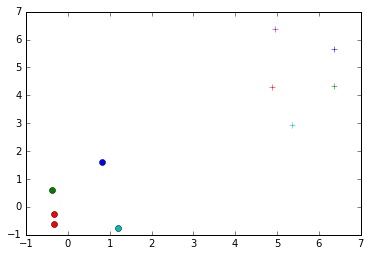

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

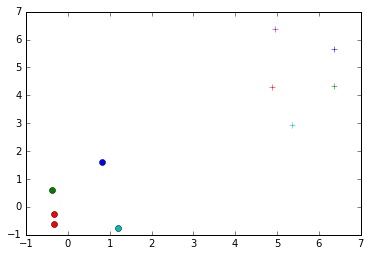

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

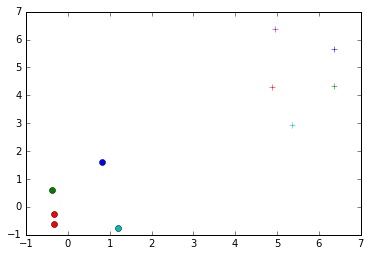

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

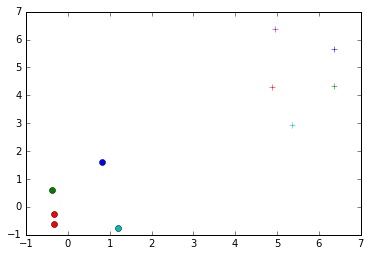

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

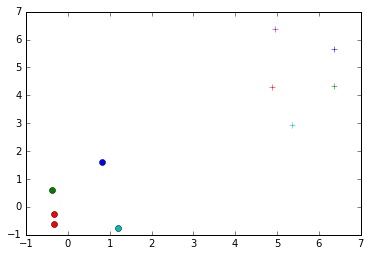

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

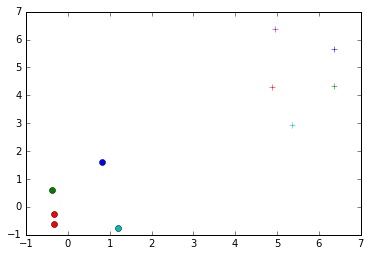

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

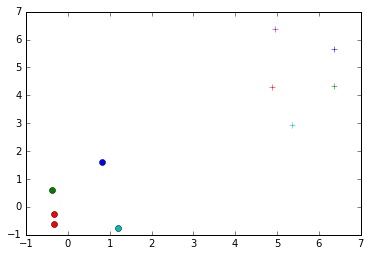

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

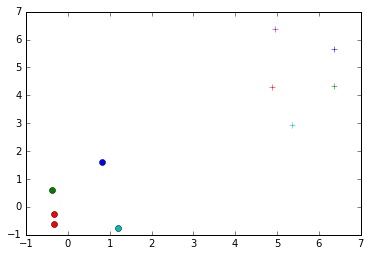

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

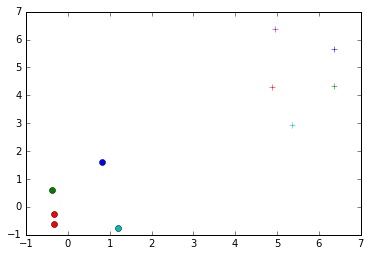

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

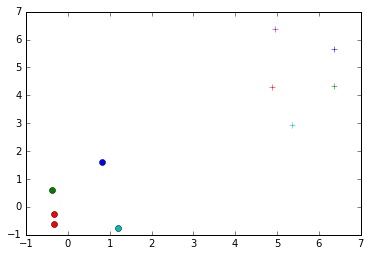

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

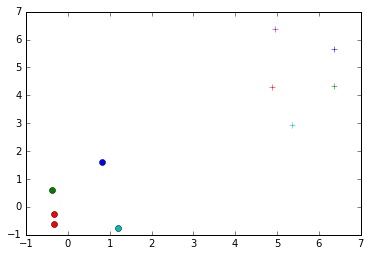

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

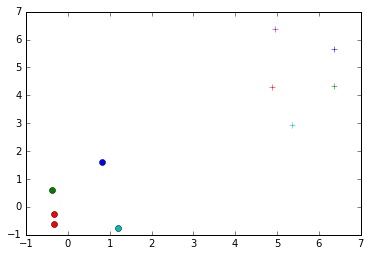

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

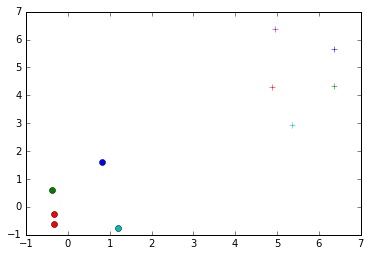

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

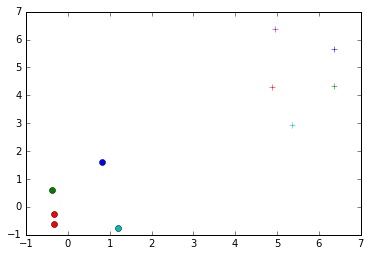

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

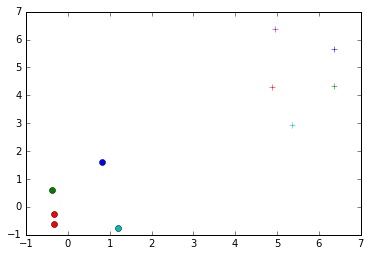

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

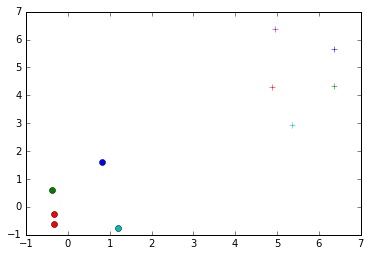

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

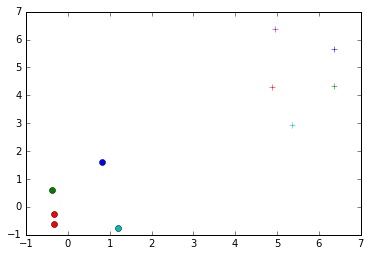

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

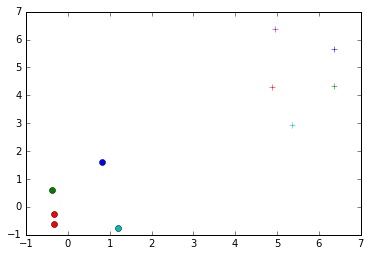

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

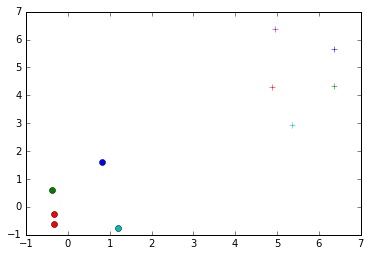

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

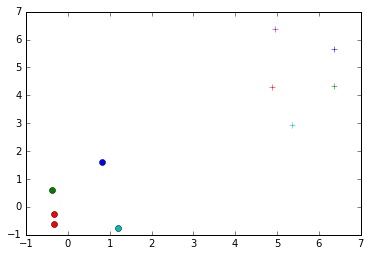

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

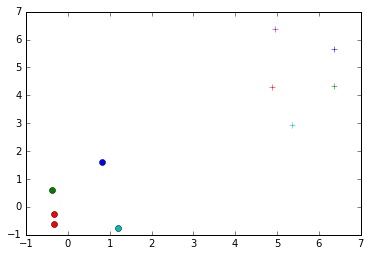

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

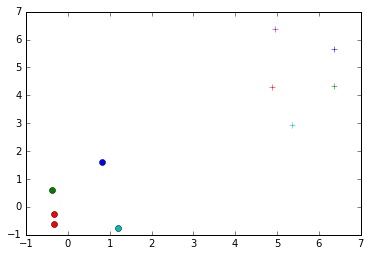

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

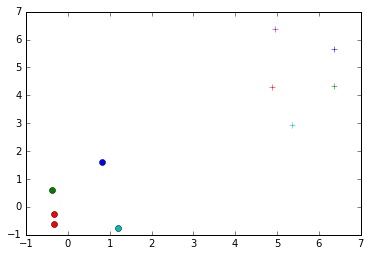

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

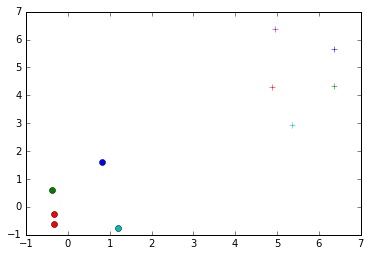

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

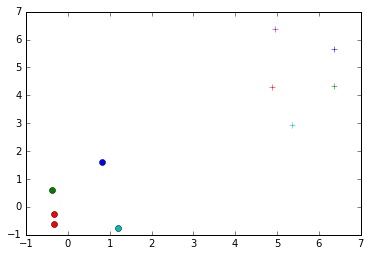

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

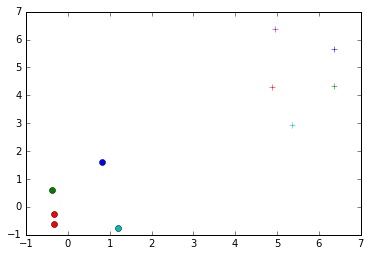

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

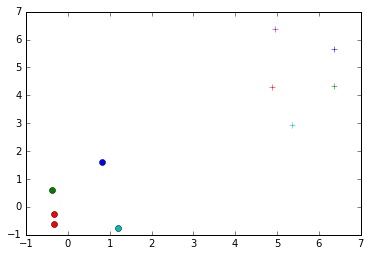

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

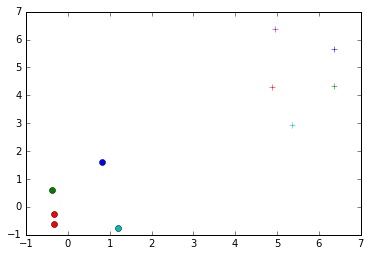

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

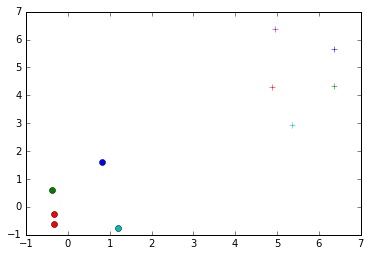

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

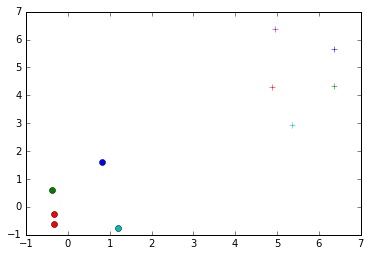

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

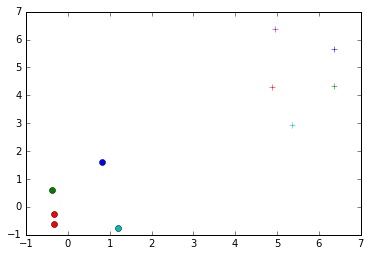

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

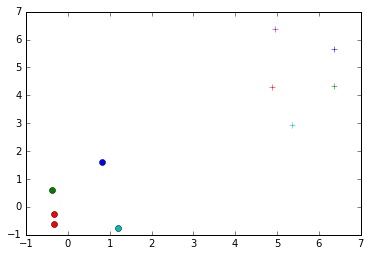

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

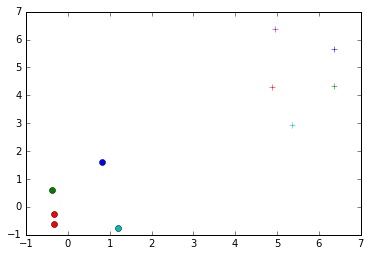

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

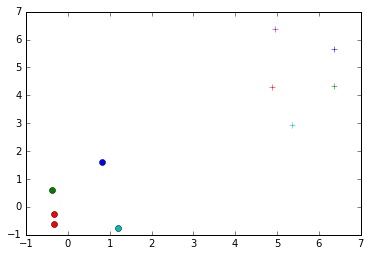

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

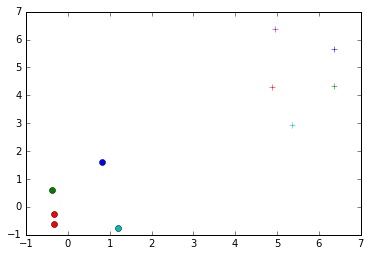

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

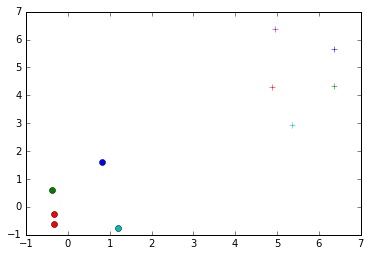

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

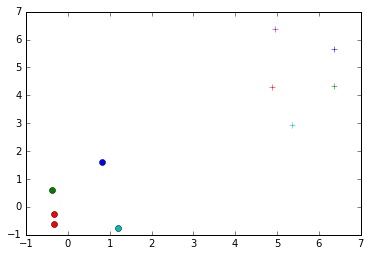

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

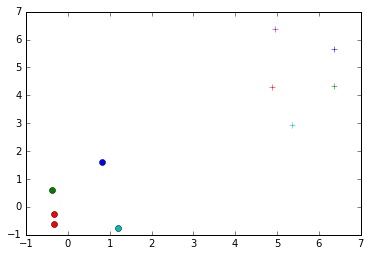

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

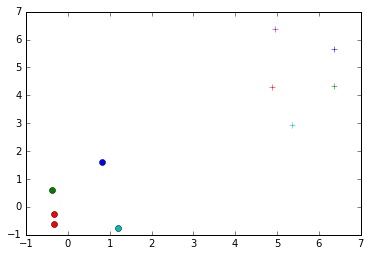

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

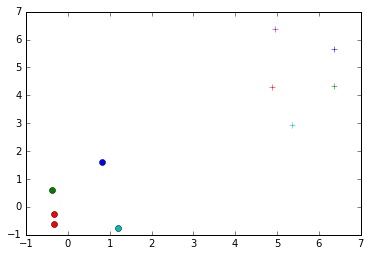

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

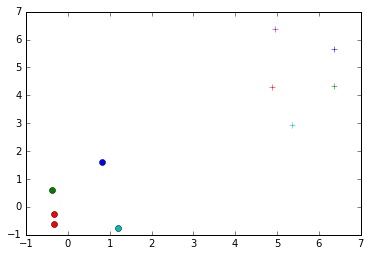

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

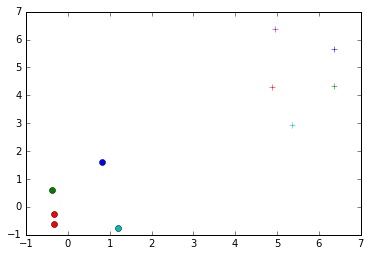

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

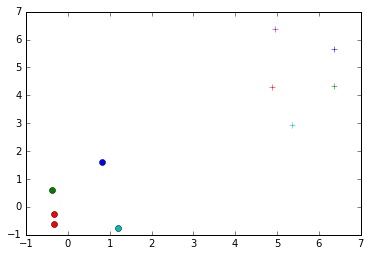

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

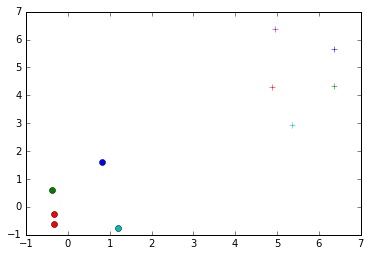

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

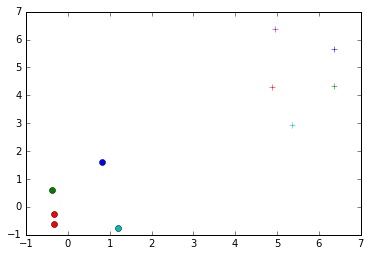

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

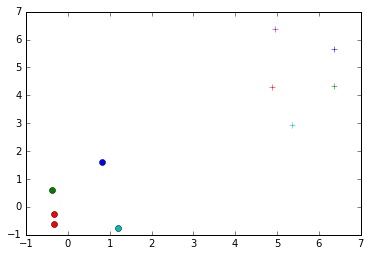

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

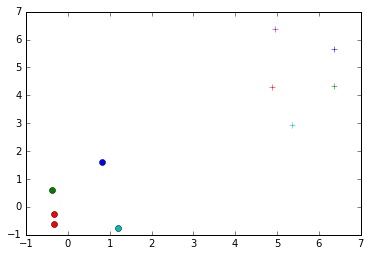

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

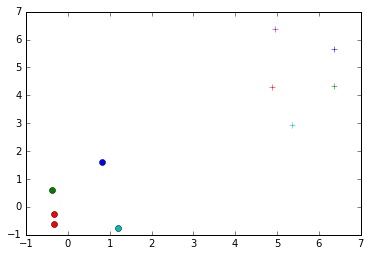

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

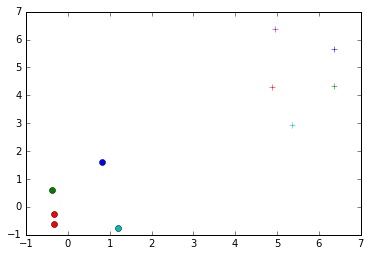

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

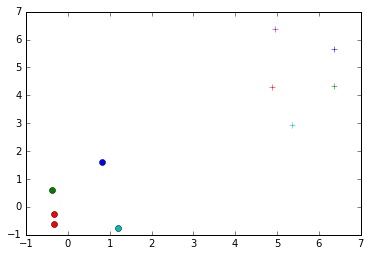

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

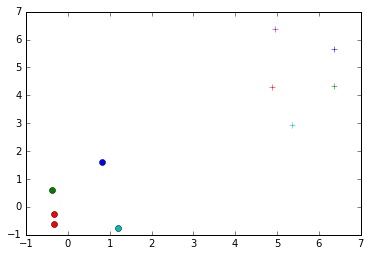

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

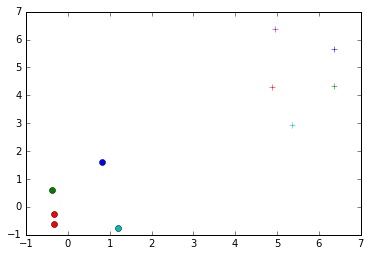

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

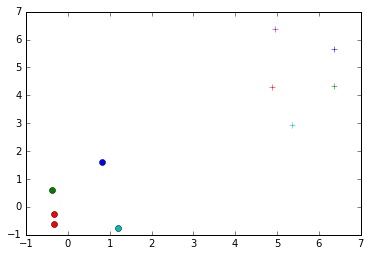

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

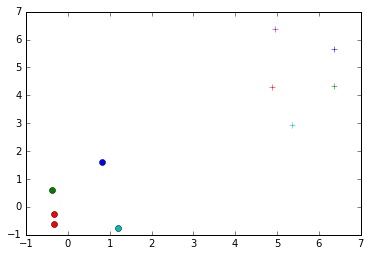

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

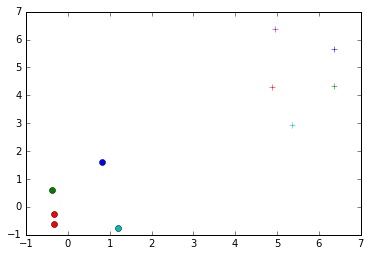

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

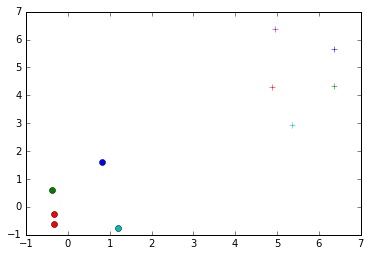

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

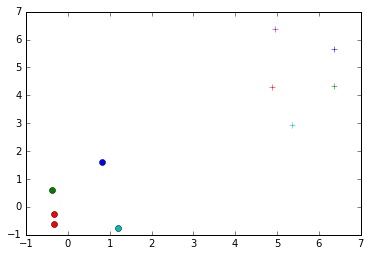

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

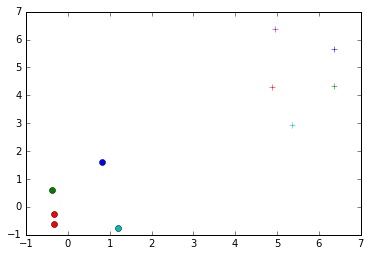

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

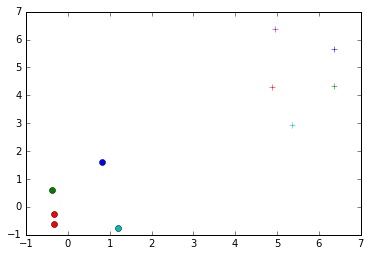

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

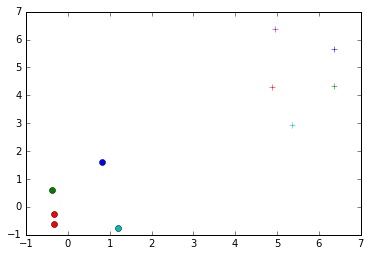

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

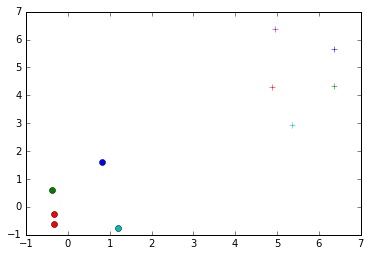

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

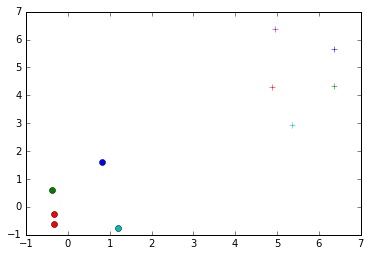

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

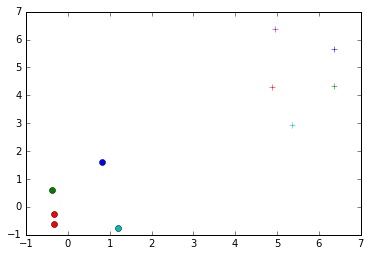

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

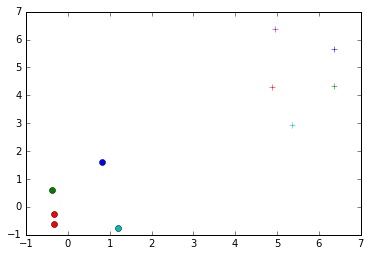

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

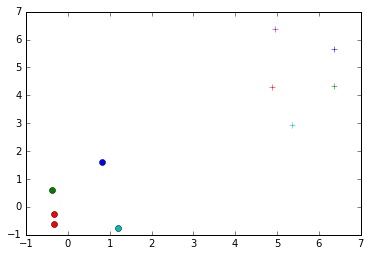

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

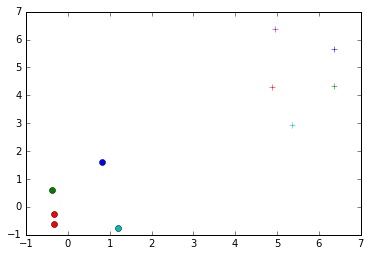

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

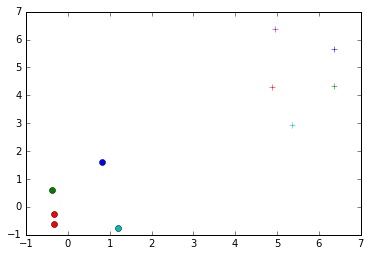

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

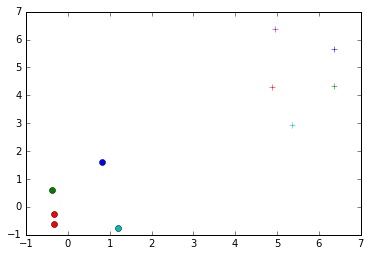

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

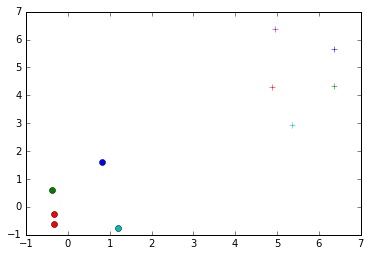

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

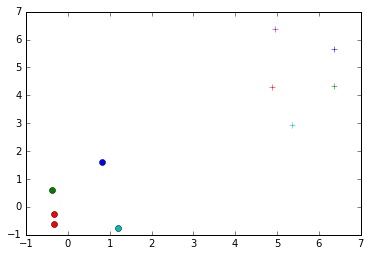

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

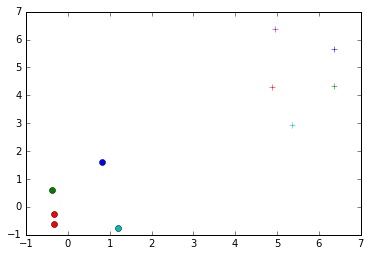

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

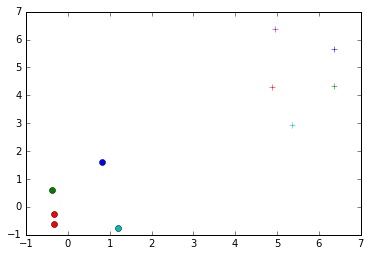

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

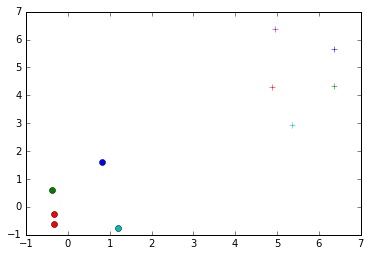

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

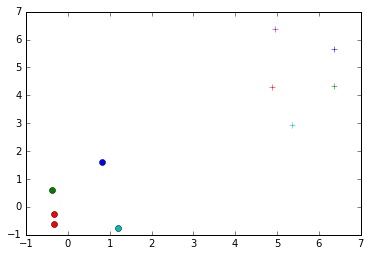

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

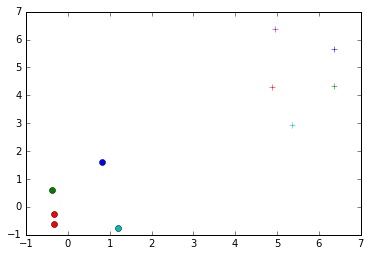

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

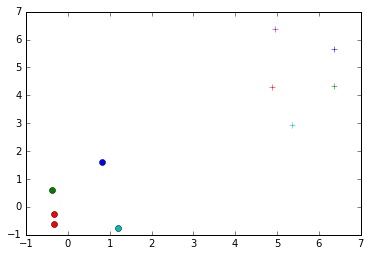

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

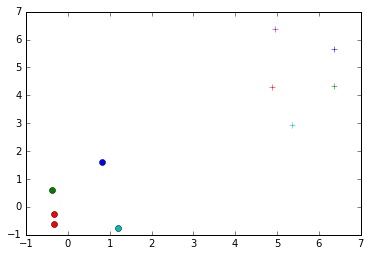

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

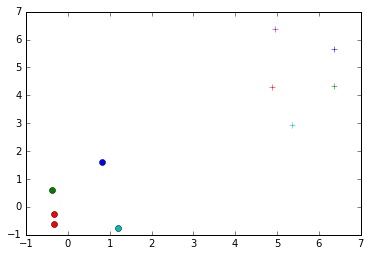

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

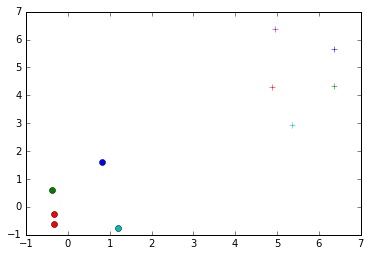

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

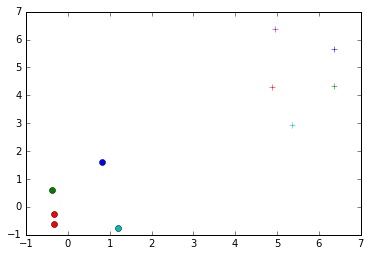

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

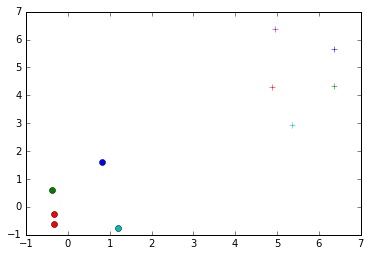

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

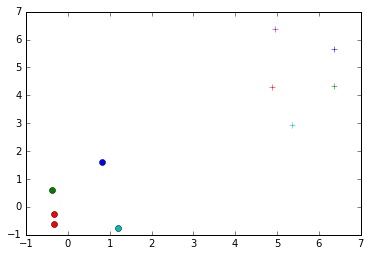

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

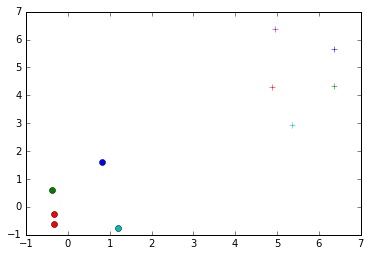

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

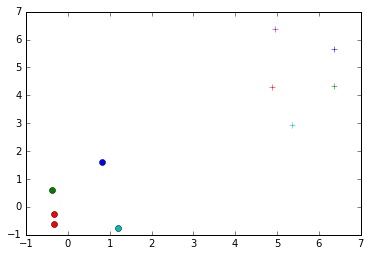

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

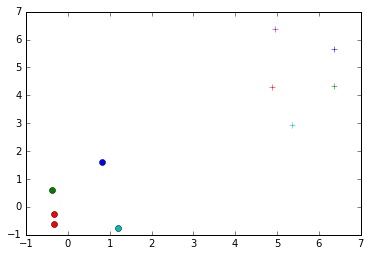

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

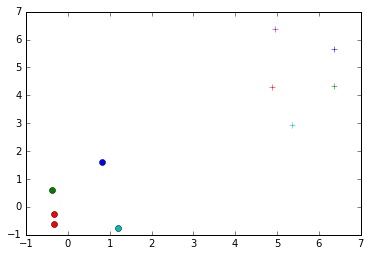

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

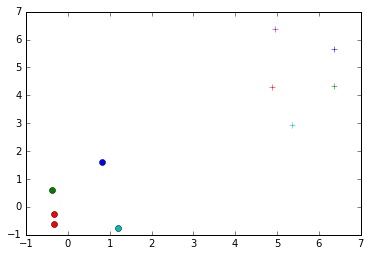

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

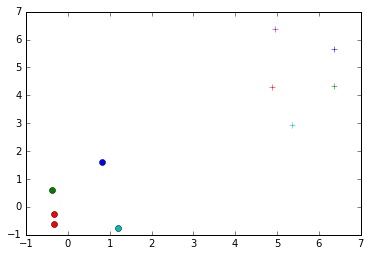

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

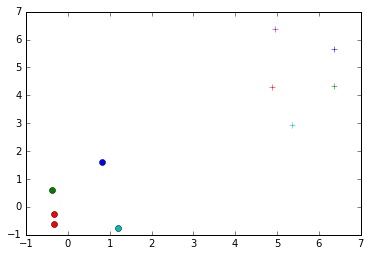

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

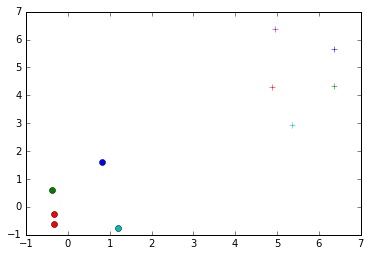

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

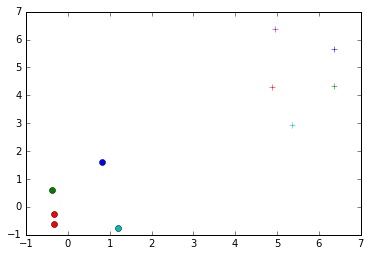

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

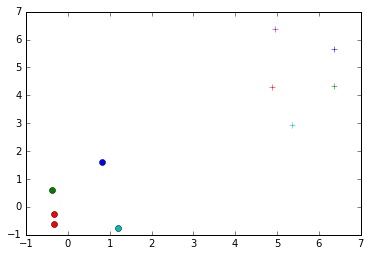

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

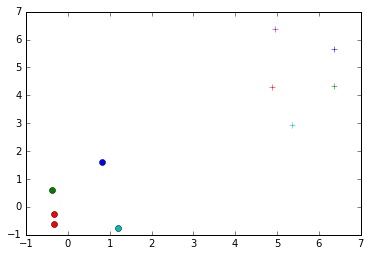

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

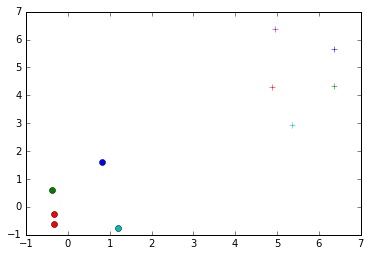

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

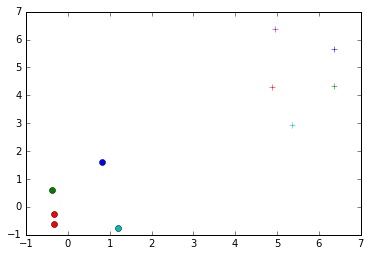

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

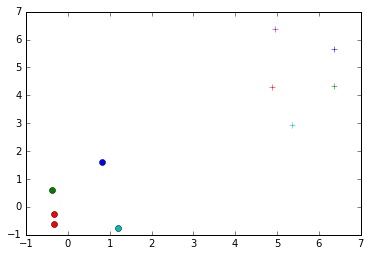

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

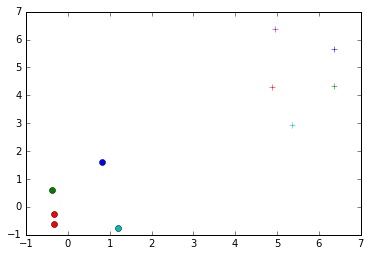

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

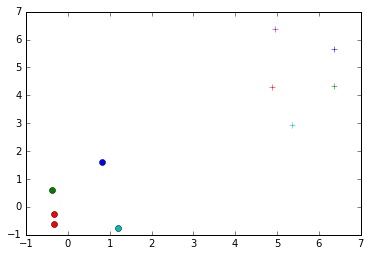

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

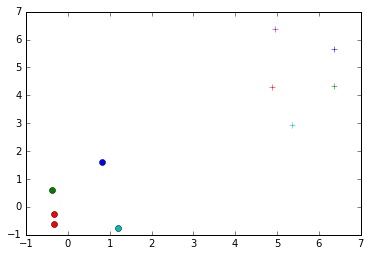

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

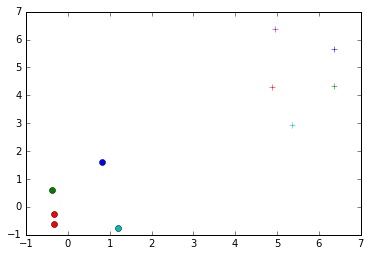

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

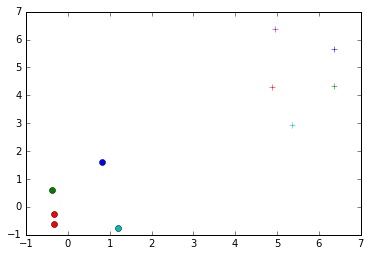

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

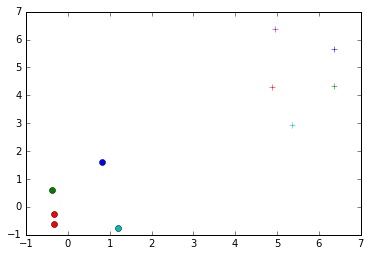

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

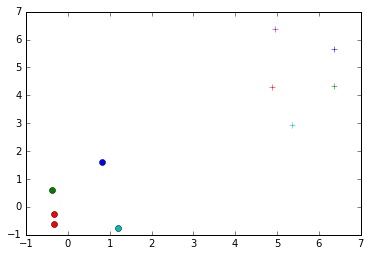

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

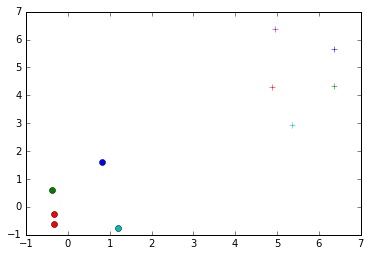

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

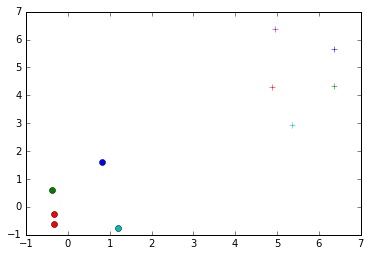

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

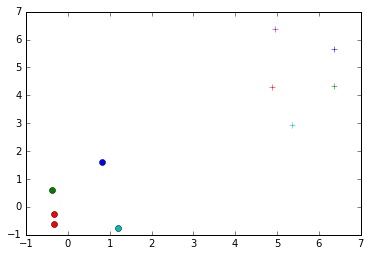

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

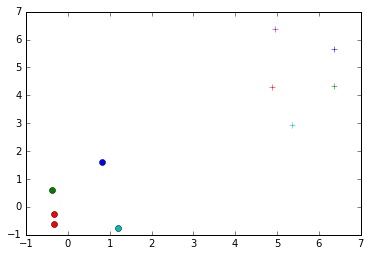

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

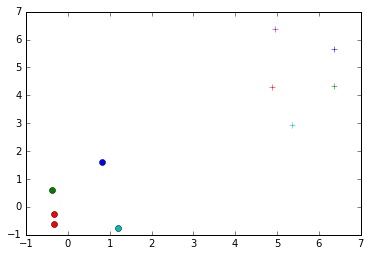

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

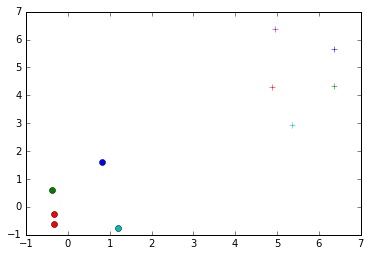

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

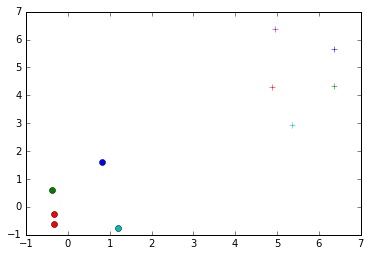

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

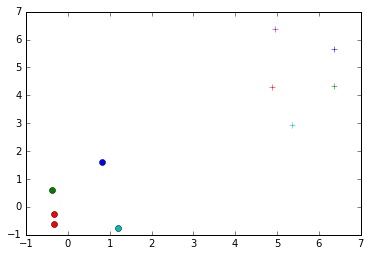

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

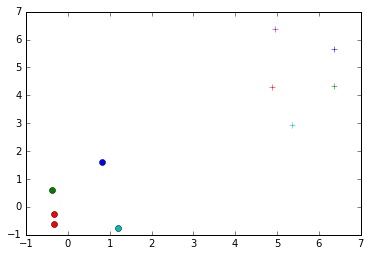

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

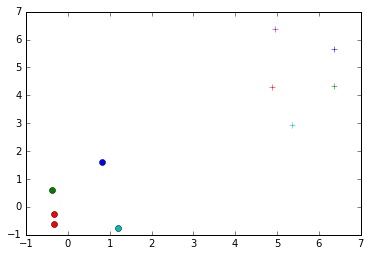

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

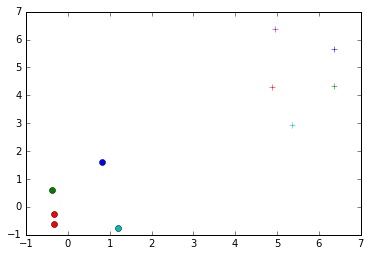

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

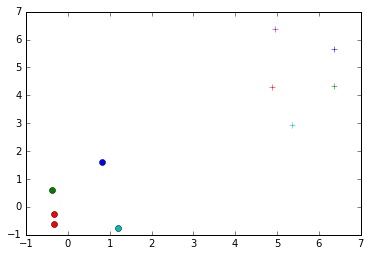

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

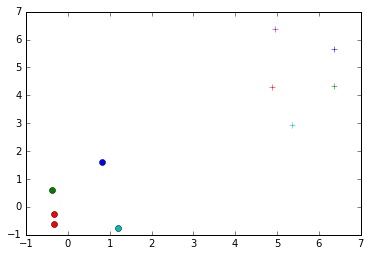

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

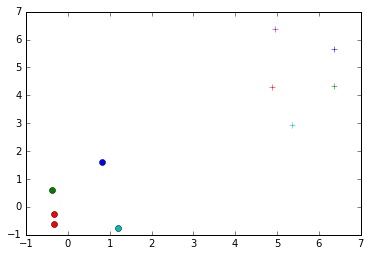

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

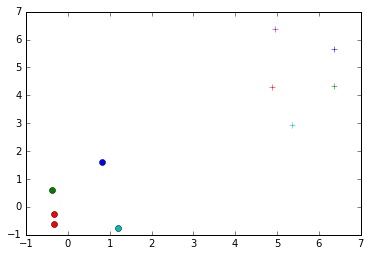

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

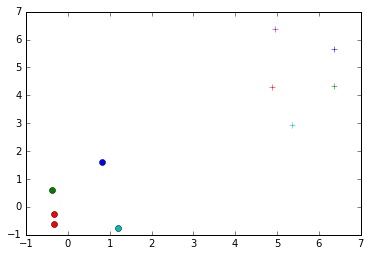

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

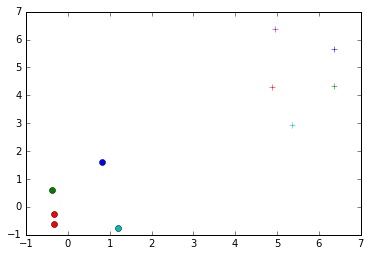

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

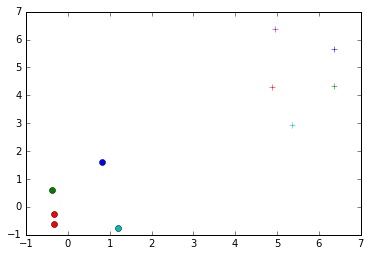

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

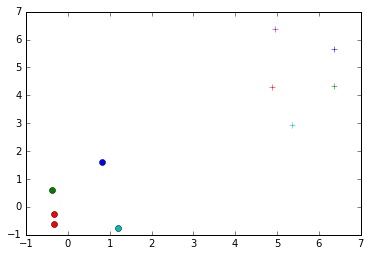

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

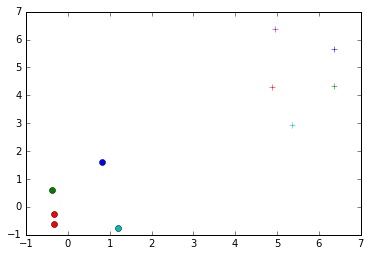

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

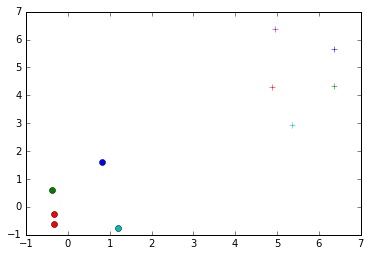

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

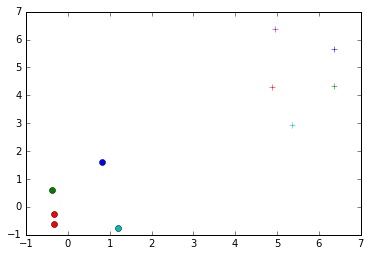

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

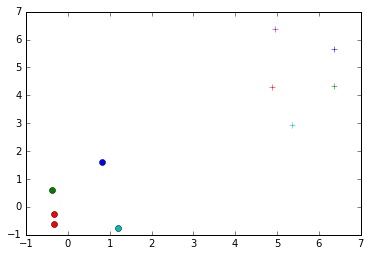

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

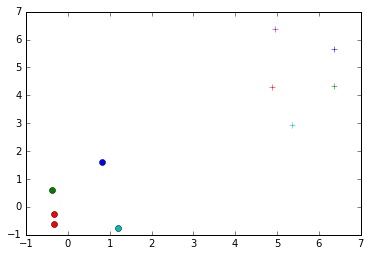

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

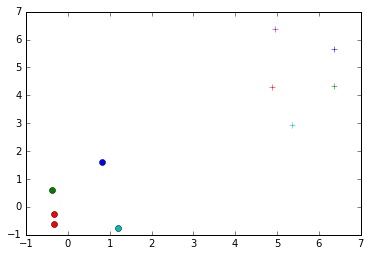

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

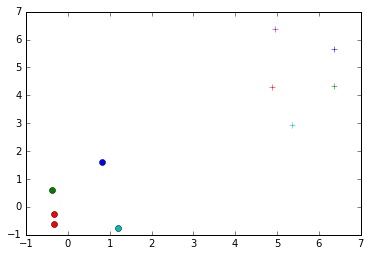

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

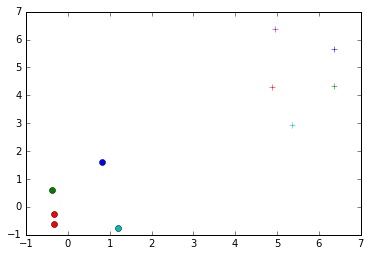

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

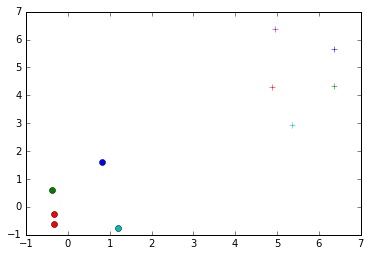

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

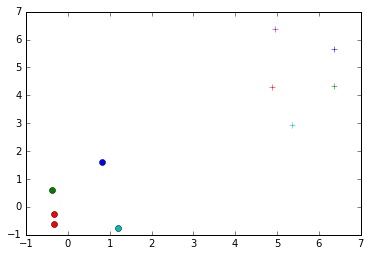

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

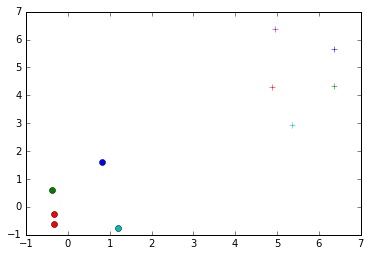

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

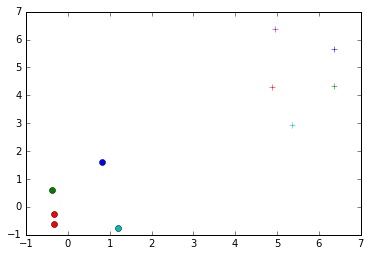

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

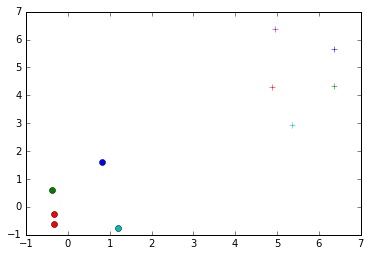

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

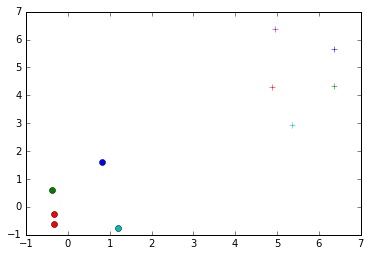

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

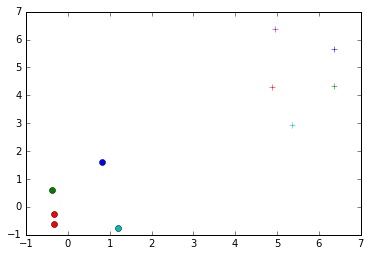

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

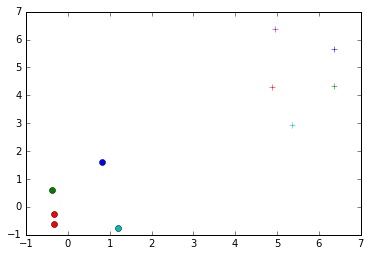

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

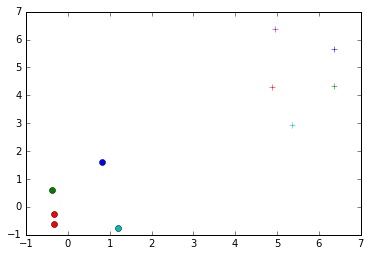

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

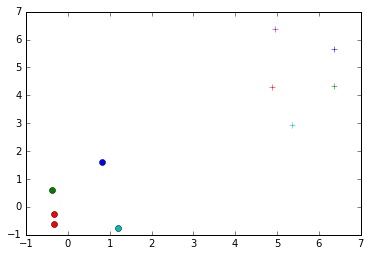

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

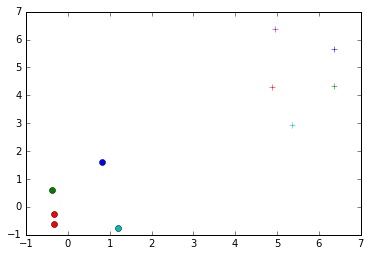

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

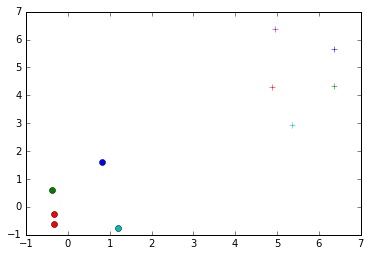

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

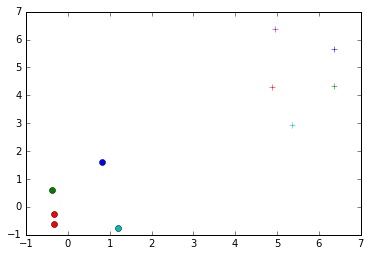

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

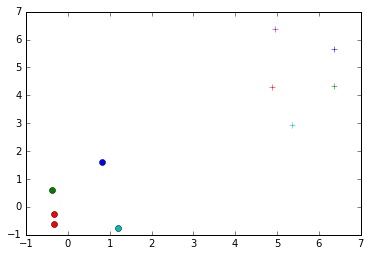

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

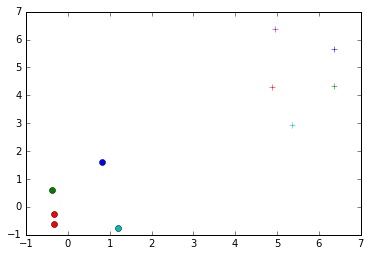

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

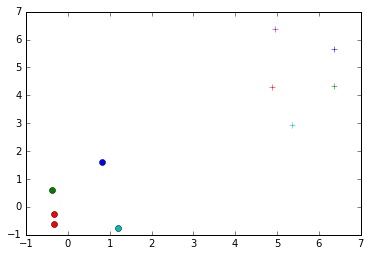

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

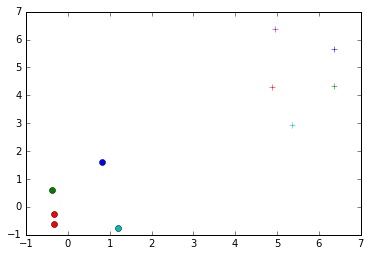

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

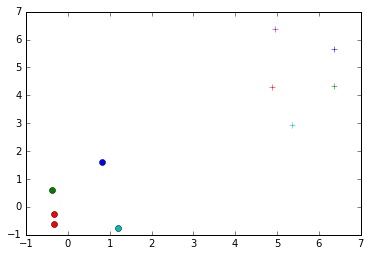

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

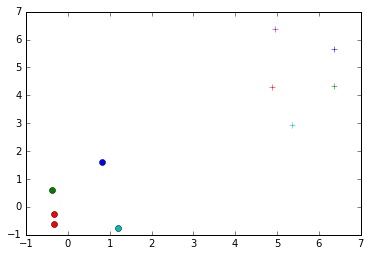

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

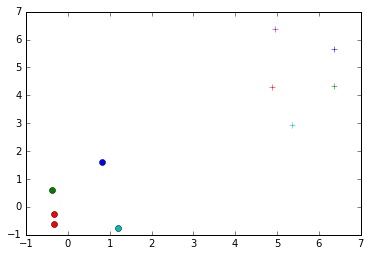

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

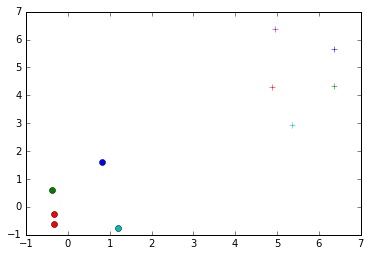

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

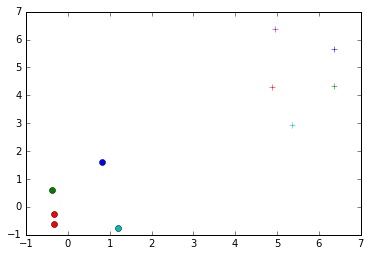

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

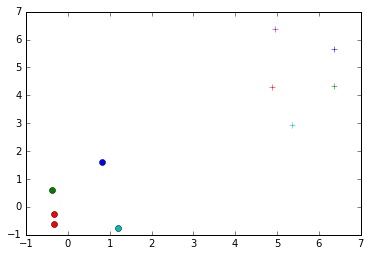

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

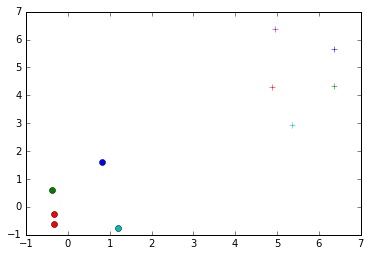

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

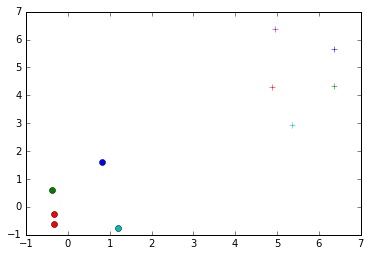

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

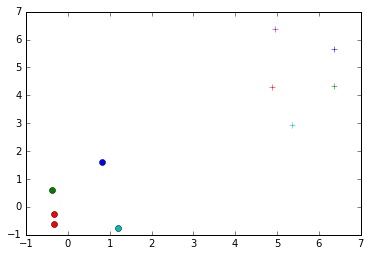

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

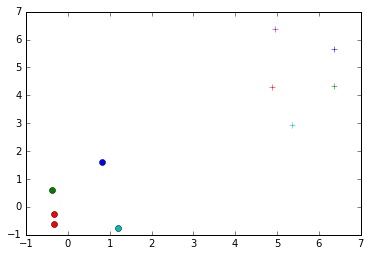

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

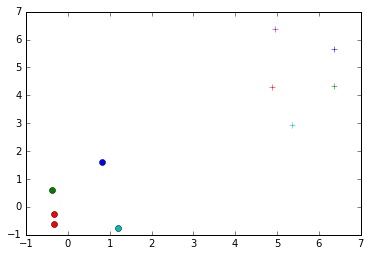

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

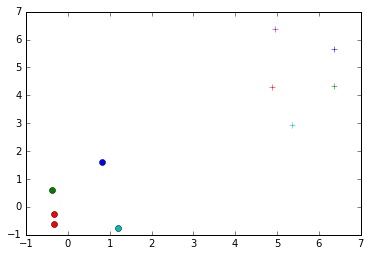

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

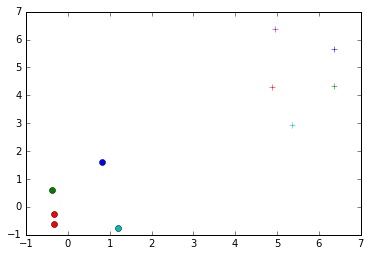

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

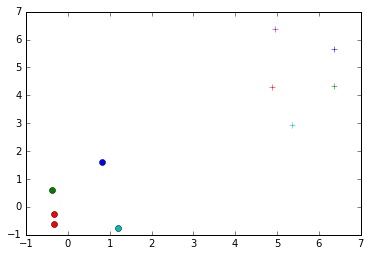

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

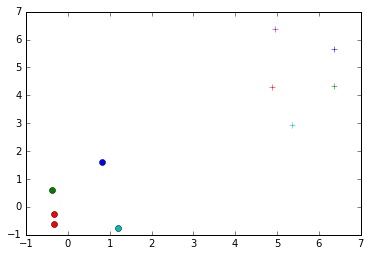

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

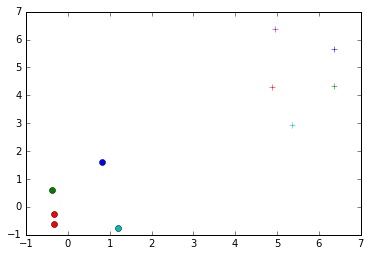

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

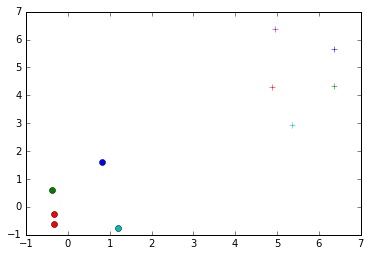

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

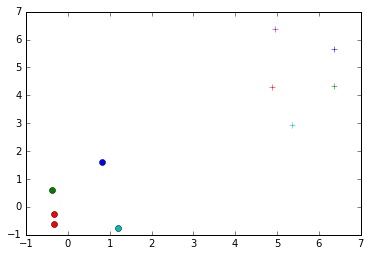

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

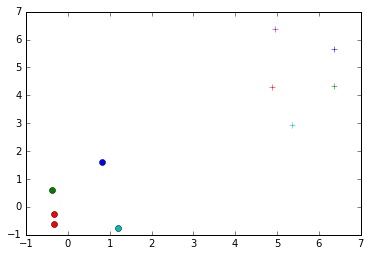

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

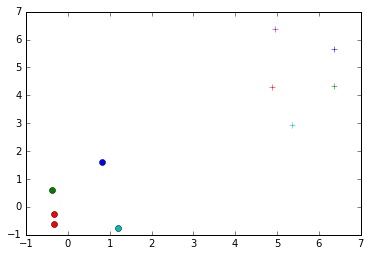

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

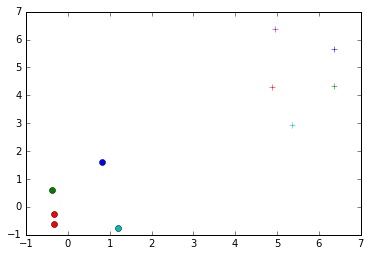

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

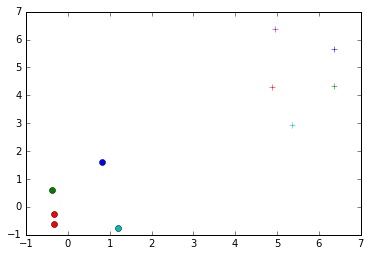

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

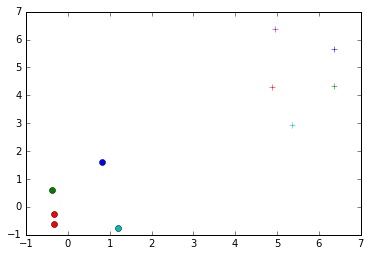

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

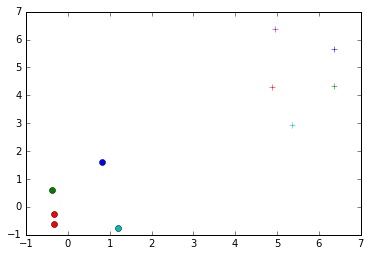

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

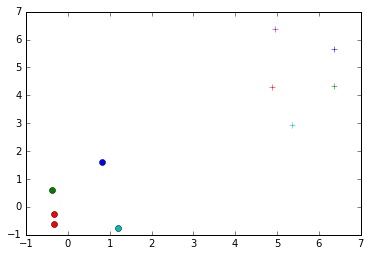

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

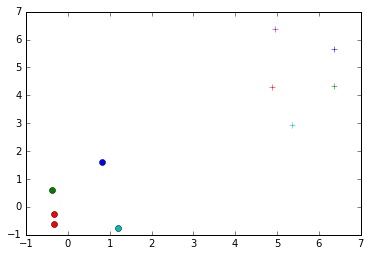

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

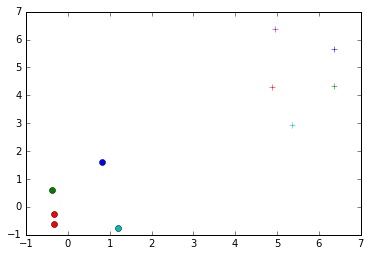

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

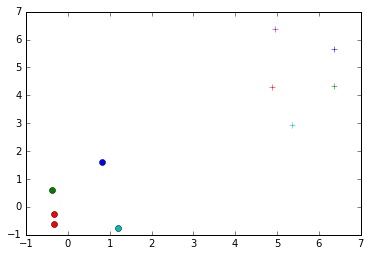

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

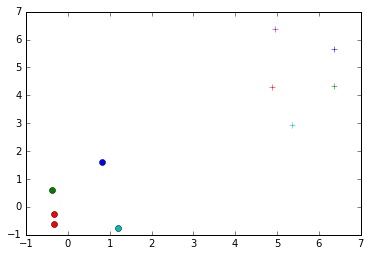

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

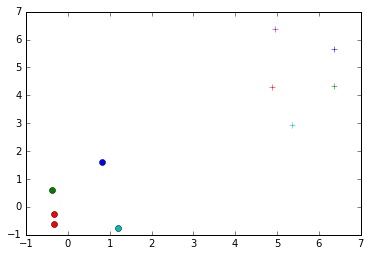

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

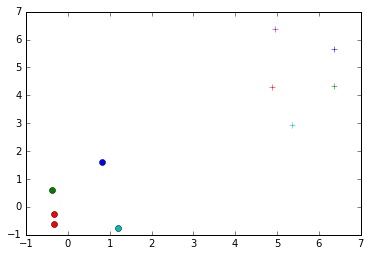

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

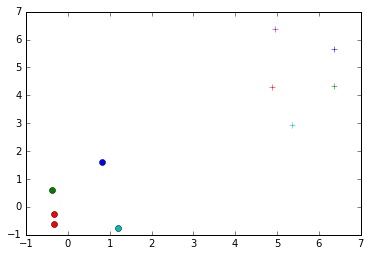

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

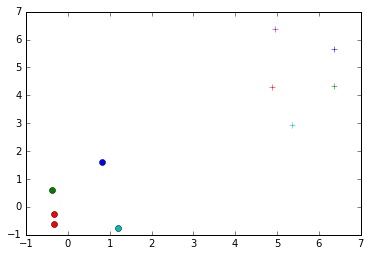

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

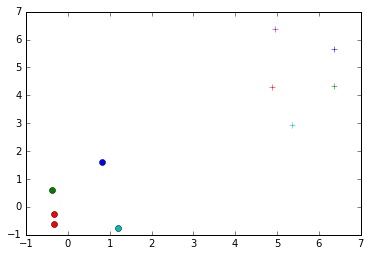

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

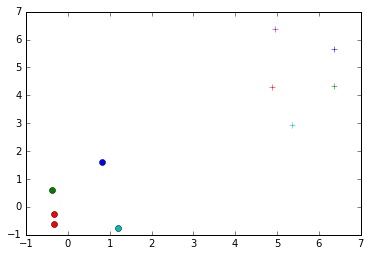

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

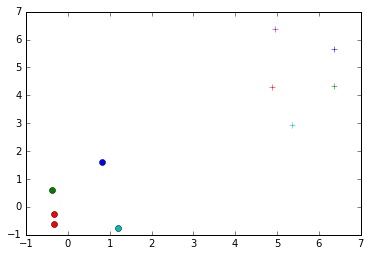

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

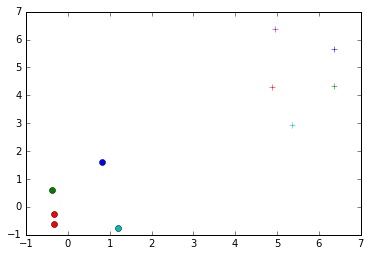

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

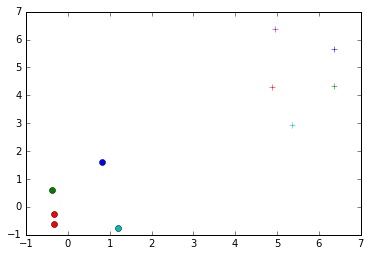

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

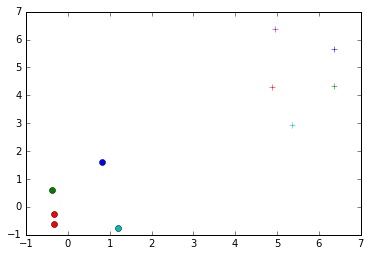

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

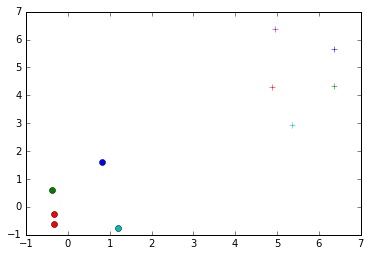

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

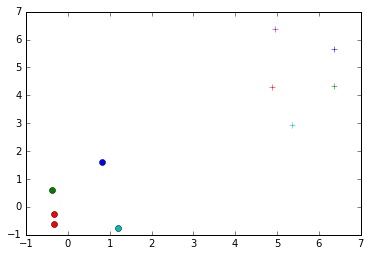

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

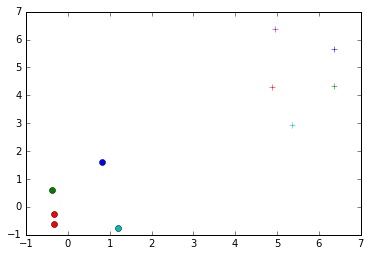

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

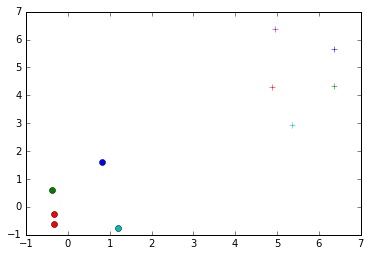

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

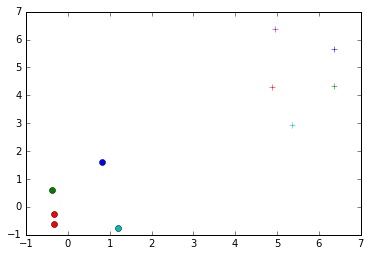

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

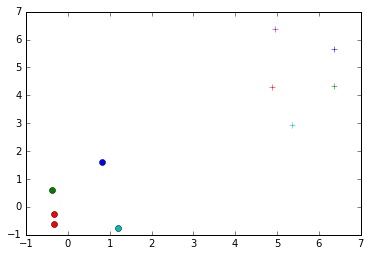

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

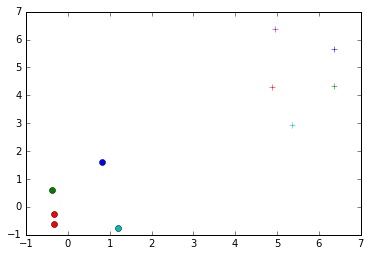

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

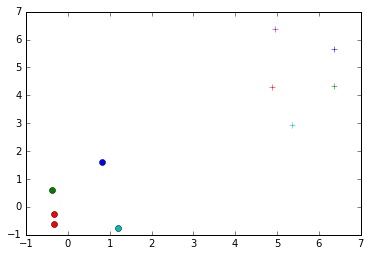

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

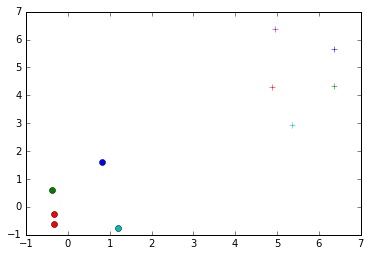

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

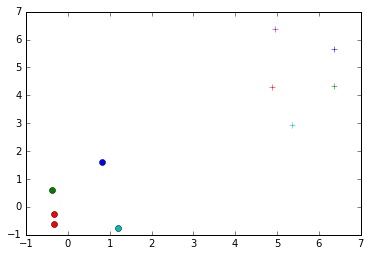

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

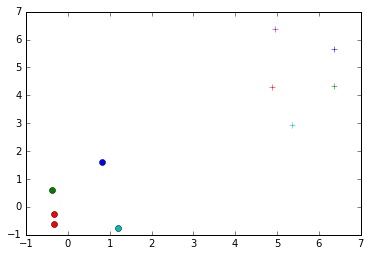

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

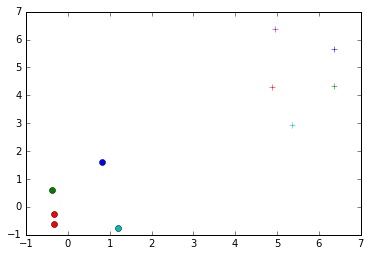

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

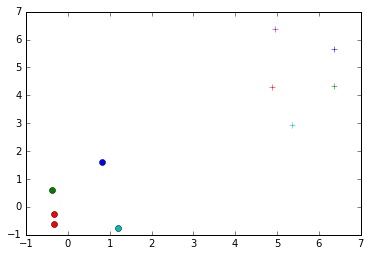

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

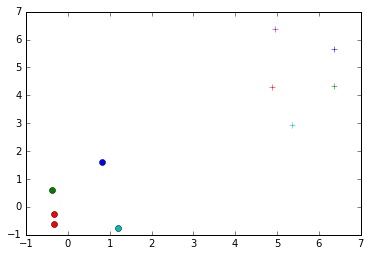

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

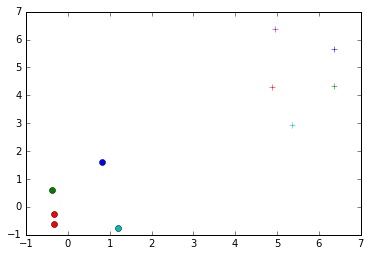

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

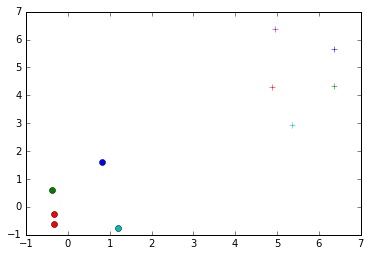

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

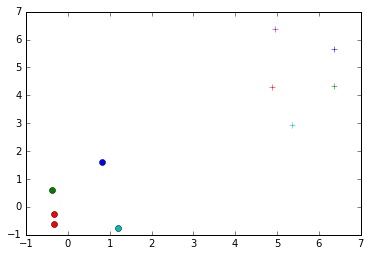

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

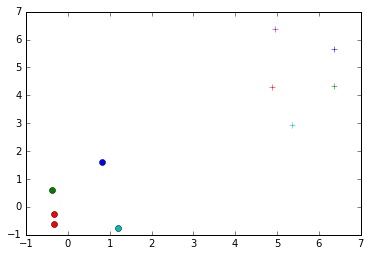

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

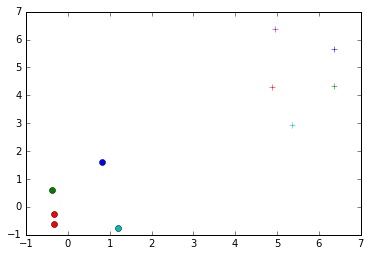

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

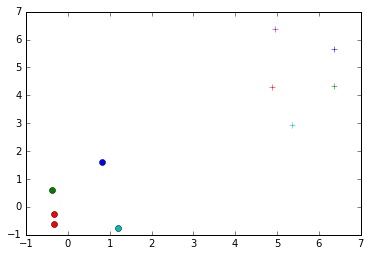

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

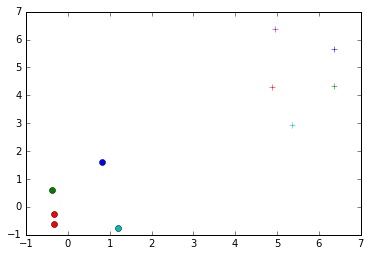

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

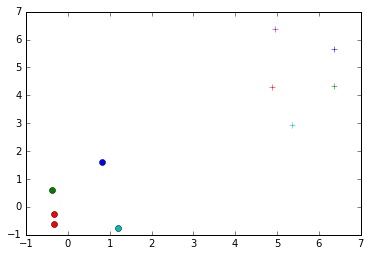

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

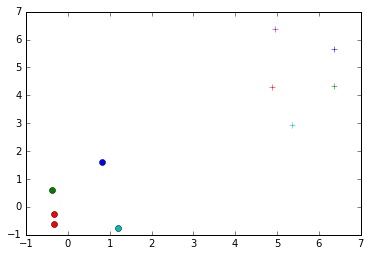

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

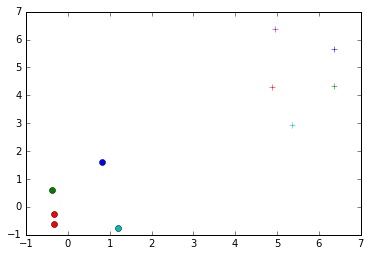

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

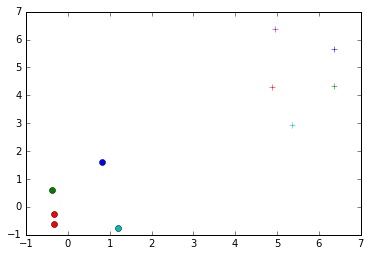

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

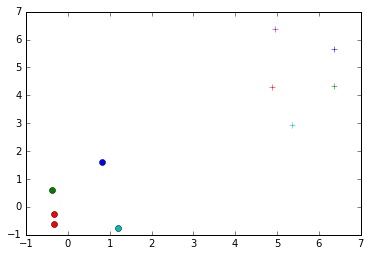

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

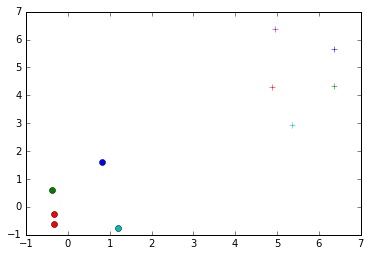

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

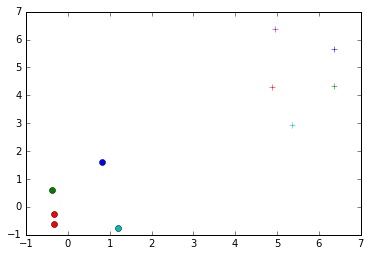

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

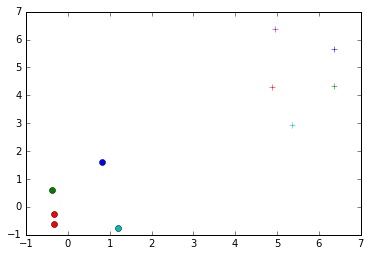

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

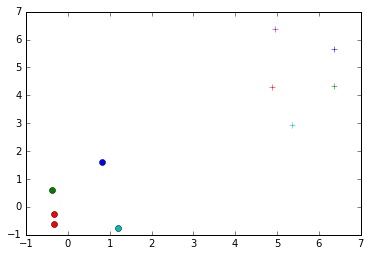

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

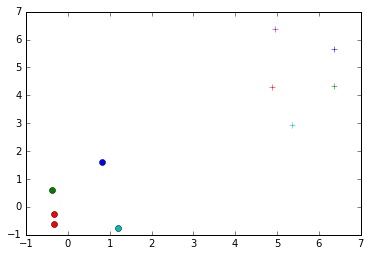

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

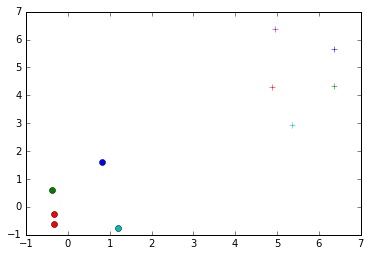

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

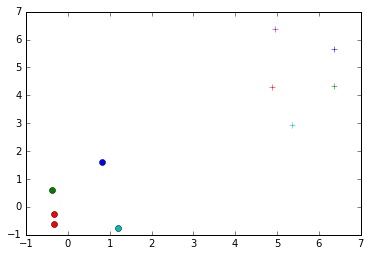

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

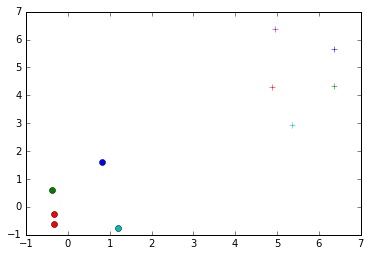

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

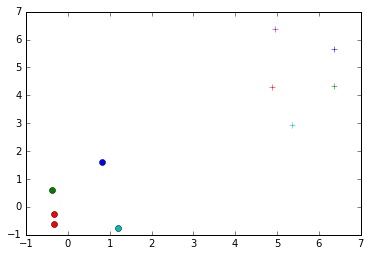

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

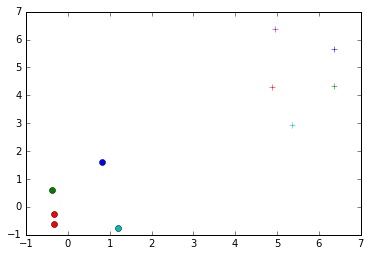

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

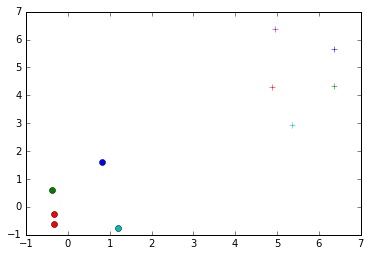

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

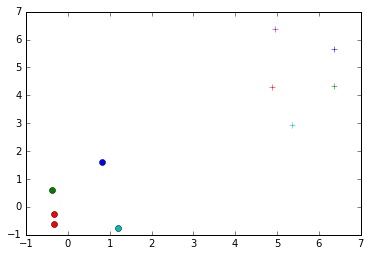

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

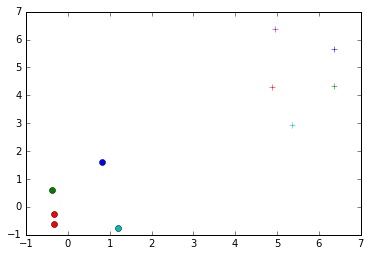

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

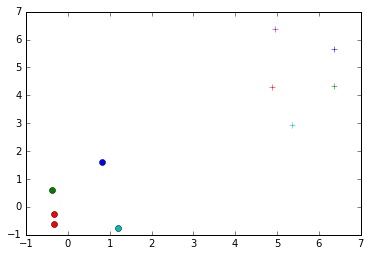

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

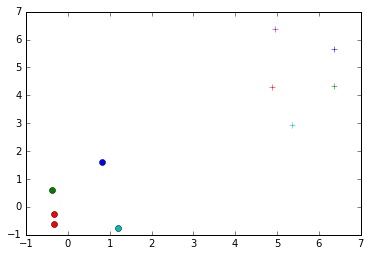

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

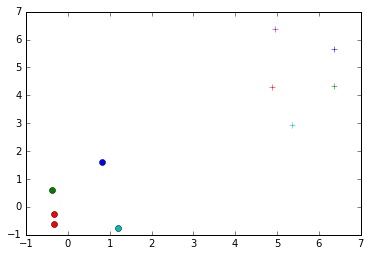

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

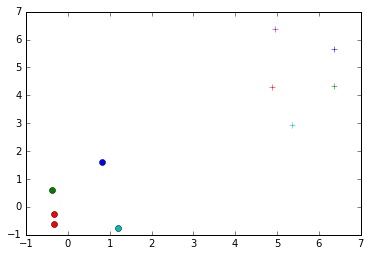

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

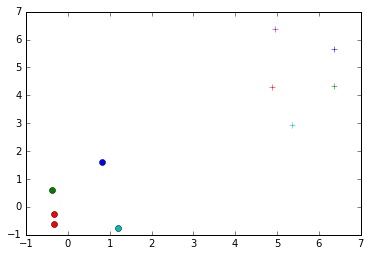

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

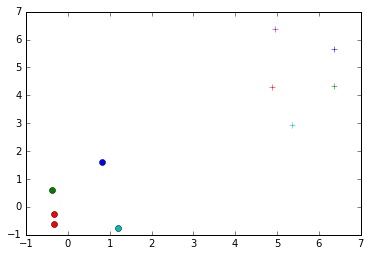

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

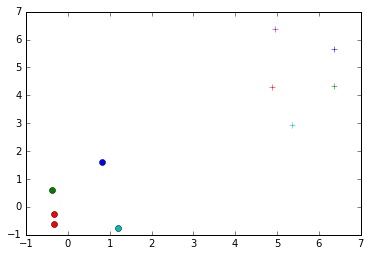

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

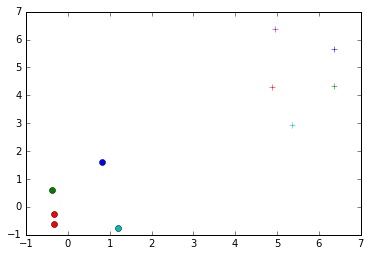

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

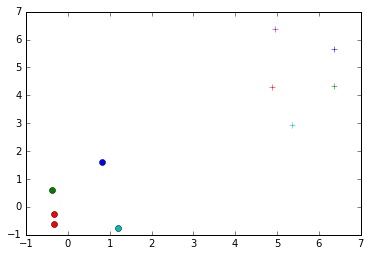

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

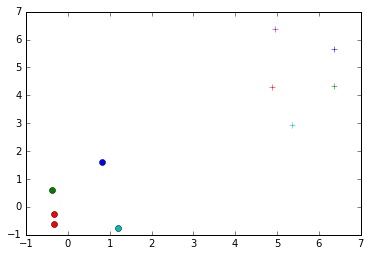

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

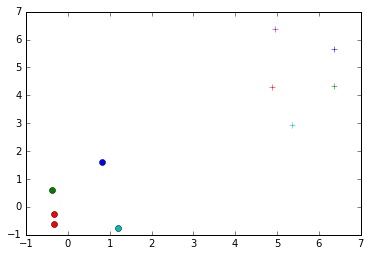

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

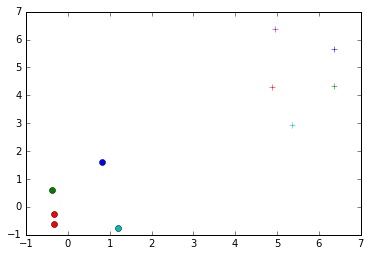

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

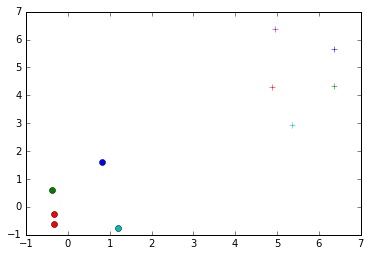

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

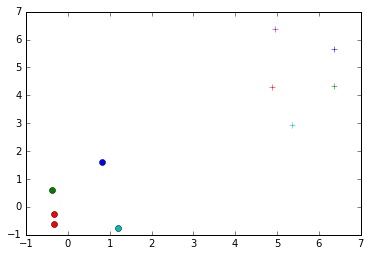

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

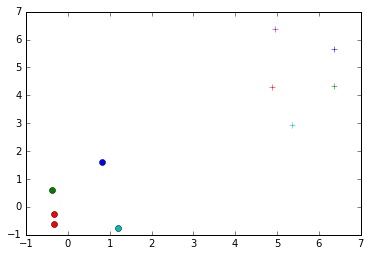

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

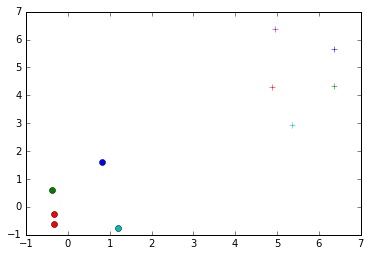

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

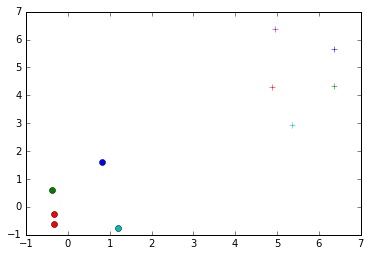

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

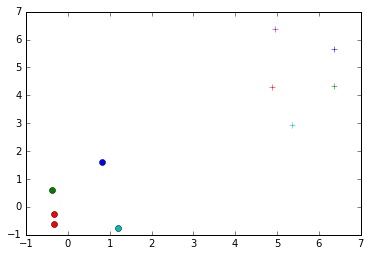

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

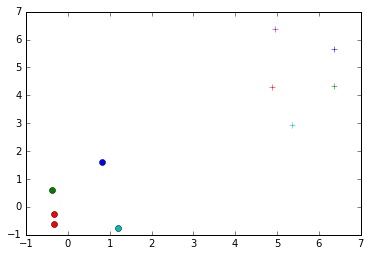

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

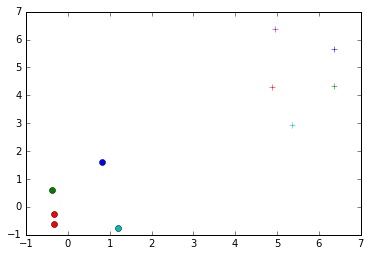

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

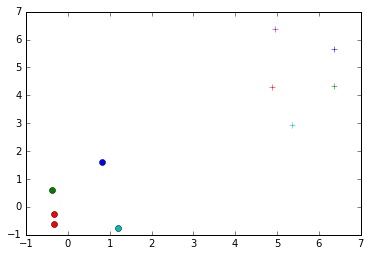

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

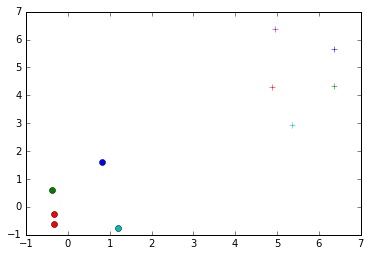

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

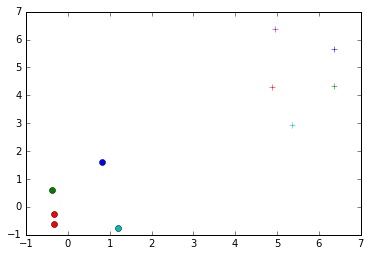

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

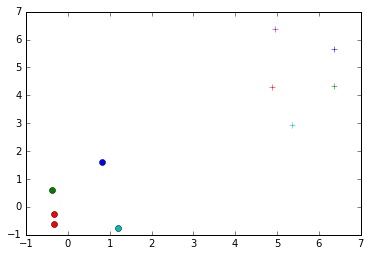

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

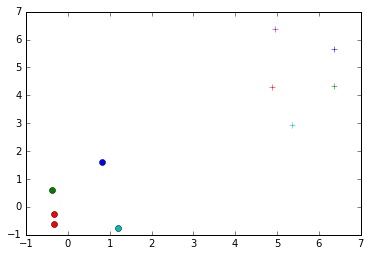

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

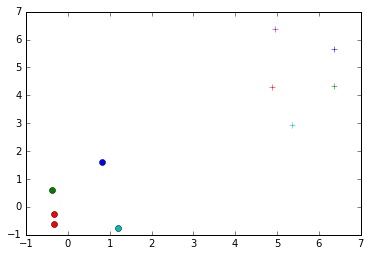

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

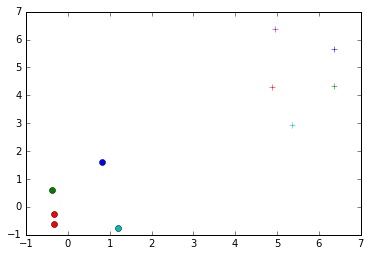

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

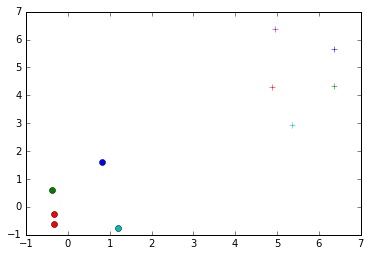

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

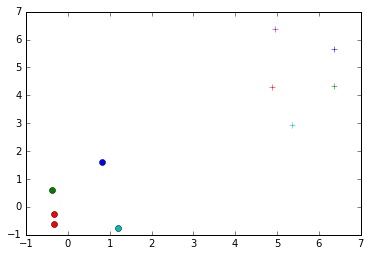

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

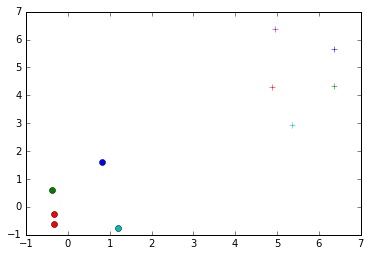

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

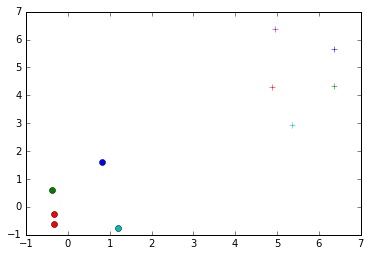

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

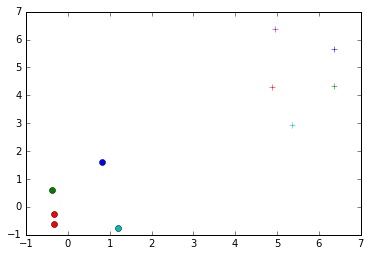

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

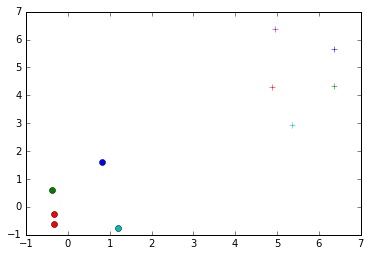

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

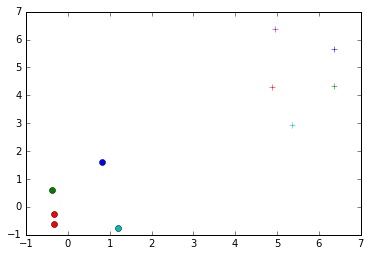

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

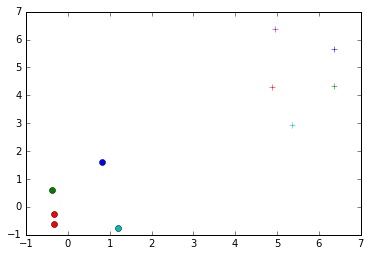

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

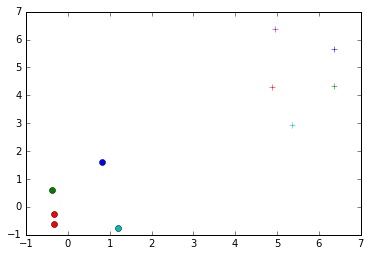

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

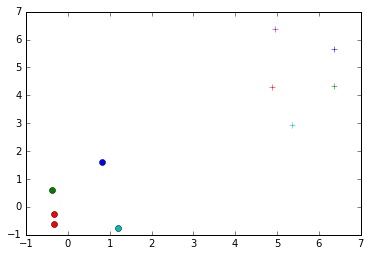

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

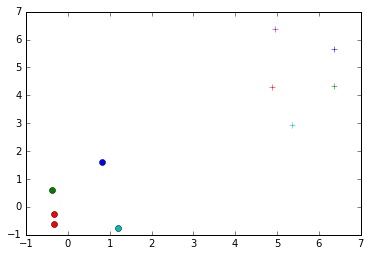

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

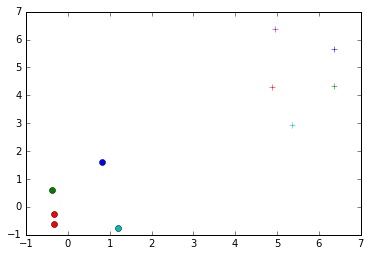

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

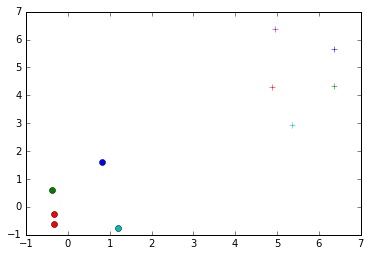

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

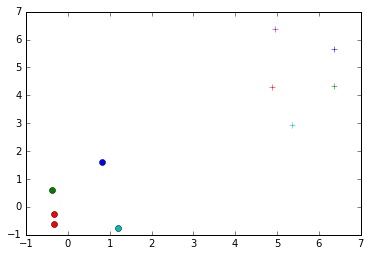

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

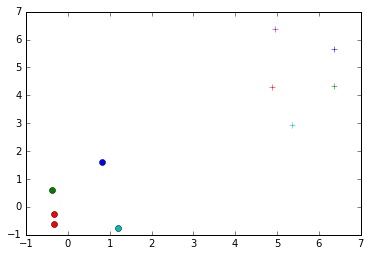

MinimumI:  2
MinimumJ:  4
MinimiumDist:  0.360819167236
To be set:  2
Before:  2
After:  2
CentroidX:  [-0.32951218721065845, -0.325281771545677]
CentroidY:  [-0.6029876637753763, -0.24219329709519663]
[-0.65479396 -0.84518096]
1
          x         y  cluster color                            centroid
0  0.812854  1.610644        0    bo      [0.812853678484, 1.6106437454]
1 -0.372182  0.598292        1    go  [-0.654793958756, -0.845180960871]
2 -0.329512 -0.602988        2    ro  [-0.329512187211, -0.602987663775]
3  1.198461 -0.755012        3    co    [1.19846091411, -0.755012255883]
4 -0.325282 -0.242193        2    ro  [-0.325281771546, -0.242193297095]
5  6.353498  5.648163        5    b+       [6.35349756323, 5.6481626404]
6  6.362023  4.337704        6    g+      [6.36202304139, 4.33770430671]
7  4.867610  4.302076        7    r+      [4.86760992208, 4.30207638859]
8  5.353975  2.951168        8    c+      [5.35397527927, 2.95116751799]
9  4.951500  6.369253        9    m+    

KeyboardInterrupt: 

In [76]:
while (notOneCluster(clusterF)):
    # Plot within the loop so you can see the progress
    print(clusterF)
    for i in range(len(clusterF)):
        plt.plot(clusterF.loc[i,"x"],clusterF.loc[i,"y"],clusterF.loc[i,"color"])
    plt.show()
    # Find the minimum distance clusters
    
    minimumDistance = 1000
    minimumI = -1
    minimumJ = -1
    for i in range(len(clusterF)):
        for j in range(len(clusterF)):
            
            if i < j:
                tempDist = distance.euclidean(clusterF.iloc[i,:].centroid,clusterF.iloc[j,:].centroid)
                if tempDist < minimumDistance:
                    minimumDistance = tempDist
                    minimumI = i
                    minimumJ = j

    # Merge the minimum distance clusters: jCluster's become iCluster's.
    
    print "MinimumI: ", minimumI
    print "MinimumJ: ", minimumJ
    print "MinimiumDist: ", minimumDistance
    
    
    print "To be set: ", clusterF.iloc[minimumI,:]["cluster"]
    print "Before: ", clusterF.iloc[minimumJ,:]["cluster"]
    clusterF.loc[minimumJ,"cluster"] = clusterF.loc[minimumI,"cluster"]
    clusterF.loc[minimumJ,"color"] = clusterF.loc[minimumI,"color"]
    print "After: ", clusterF.iloc[minimumJ,:]["cluster"]

    # Recalculate the centroids for the newly merged clusters
    
    centroidX = [clusterF.centroid[x].tolist()[0] for x in clusterF[clusterF.cluster == clusterF.loc[minimumI,"cluster"]].index.tolist()]
    centroidY = [clusterF.centroid[y].tolist()[1] for y in clusterF[clusterF.cluster == clusterF.loc[minimumI,"cluster"]].index.tolist()]

    print "CentroidX: ", centroidX
    print "CentroidY: ", centroidY

    averageX = sum(centroidX) / len(clusterF[clusterF.cluster == c])
    averageY = sum(centroidY) / len(clusterF[clusterF.cluster == c])

    newCentroid = np.array([averageX,averageY])

    print newCentroid

    for clusterItemIndex in clusterF[clusterF.cluster == c].index:
        print clusterItemIndex
        clusterF.set_value(clusterItemIndex, 'centroid', newCentroid)
